# Model per customer, GRU

* [1. Prepare the data](#1)
* [2. Modeling](#2)

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl # colors
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from datetime import datetime as dt
import pickle
import sys

from IPython.display import display # to print tables inside the code cell

plt.rcParams['axes.grid'] = True
plt.rcParams['axes.axisbelow'] = True
plt.rcParams['axes.xmargin'] = 0.02
plt.rcParams['axes.ymargin'] = 0.1
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.visible'] = True

plt.rcParams['figure.dpi'] = 50
plt.rcParams['savefig.bbox'] = 'tight'

In [2]:
#n_customers = 500
n_customers = 1000

We are trying to predict the customer's next basket content using reccurent neural network based on the Gated Recurrent Unit (GRU) model. In the first part of this notebook we prepare the data, the second part covers the modeling.

## 1. Prepare the data <a id='1'></a>

Let's read in the files, set up some memory control and select from the file orders only those orders that correspond to train sample (prior and next orders).

In [3]:
orders         = pd.read_csv("./data/orders.csv",usecols=['order_id','user_id','eval_set','order_number'])
products_prior = pd.read_csv("./data/order_products__prior.csv")
products_train = pd.read_csv("./data/order_products__train.csv")

print(orders.shape)
print(products_prior.shape) 
print(products_train.shape)

(3421083, 4)
(32434489, 4)
(1384617, 4)


In [4]:
def size(x,n=2):
    return '{} G'.format(round(sys.getsizeof(x)/1_000_000_000.,n))

In [5]:
print(size(orders))
print(size(products_prior))
print(size(products_train))

0.29 G
1.04 G
0.04 G


In [6]:
round(orders.memory_usage(deep=True).sum()/1_000_000_000.,2)

0.29

In [7]:
orders.head(15)

,order_id,user_id,eval_set,order_number
0,2539329,1,prior,1
1,2398795,1,prior,2
2,473747,1,prior,3
3,2254736,1,prior,4
4,431534,1,prior,5
5,3367565,1,prior,6
6,550135,1,prior,7
7,3108588,1,prior,8
8,2295261,1,prior,9
9,2550362,1,prior,10


In [8]:
products_prior.head()

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


In [9]:
products_train.head()

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


In [10]:
products_prior.shape, products_train.shape

((32434489, 4), (1384617, 4))

__Select users from the train sample (skip the test sample)__

In [11]:
uid = orders.groupby('user_id')['eval_set'].unique()
uid

user_id
1         [prior, train]
2         [prior, train]
3          [prior, test]
4          [prior, test]
5         [prior, train]
               ...      
206205    [prior, train]
206206     [prior, test]
206207     [prior, test]
206208     [prior, test]
206209    [prior, train]
Name: eval_set, Length: 206209, dtype: object

In [12]:
uid_train = uid[uid.astype('str').str.contains('train')].reset_index()
uid_train = uid_train.drop('eval_set',axis=1)
uid_train

,user_id
0,1
1,2
2,5
3,7
4,8
...,...
131204,206199
131205,206200
131206,206203
131207,206205


In [13]:
size(uid_train,3)

'0.001 G'

We have 130k customers, let's choose only the first n_customers:

In [14]:
uid_train_reduced = uid_train.head(n_customers)
uid_train_reduced.shape

(1000, 1)

Now, let's merge it back with orders. 

In [15]:
orders_train = uid_train_reduced.merge(orders,on='user_id',how='left').drop('eval_set',axis=1)
orders_train

,user_id,order_id,order_number
0,1,2539329,1
1,1,2398795,2
2,1,473747,3
3,1,2254736,4
4,1,431534,5
...,...,...,...
16152,1566,1072793,9
16153,1566,2757377,10
16154,1566,1346273,11
16155,1566,2511444,12


In [16]:
orders_train.shape; size(orders_train,5)

'0.00052 G'

__Merge customers with products__

In [17]:
products = pd.concat((products_prior,products_train))
products.shape,size(products)

((33819106, 4), '1.35 G')

In [18]:
products

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0
...,...,...,...,...
1384612,3421063,14233,3,1
1384613,3421063,35548,4,1
1384614,3421070,35951,1,1
1384615,3421070,16953,2,1


In [19]:
o = orders_train.merge(products,on='order_id',how='left').drop(['add_to_cart_order','order_id'],axis=1)
o.head(20)

,user_id,order_number,product_id,reordered
0,1,1,196,0
1,1,1,14084,0
2,1,1,12427,0
3,1,1,26088,0
4,1,1,26405,0
5,1,2,196,1
6,1,2,10258,0
7,1,2,12427,1
8,1,2,13176,0
9,1,2,26088,1


How many products per user? Integrated over orders (for one-hot encoding):

In [20]:
o.groupby('user_id')['product_id'].agg(['count','nunique'])

,count,nunique
user_id,,
1,70,19
2,226,121
5,46,28
7,215,69
8,67,50
...,...,...
1557,37,21
1559,252,108
1562,168,67


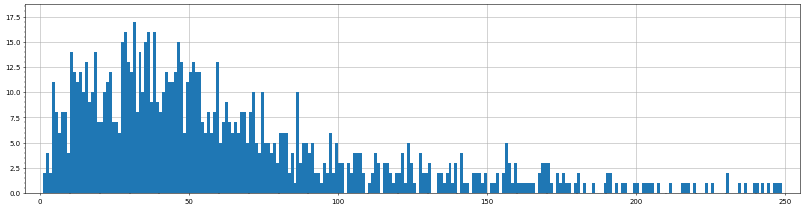

In [21]:
o.groupby('user_id')['product_id'].nunique().hist(bins=250,range=(0,250),figsize=(20,5));

Show only reordered, we will use only these:

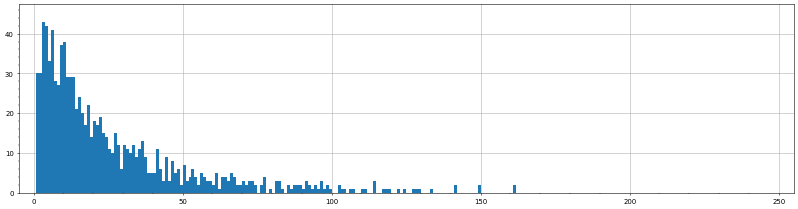

In [22]:
o[o['reordered'] == 1].groupby('user_id')['product_id'].nunique().hist(bins=250,range=(0,250),figsize=(20,5));

In [23]:
o.groupby('user_id')['product_id'].unique()

user_id
1       [196, 14084, 12427, 26088, 26405, 10258, 13176...
2       [32792, 47766, 20574, 12000, 48110, 22474, 165...
5       [15349, 21413, 48775, 28289, 8518, 11777, 3171...
7       [45628, 39275, 6361, 45066, 13249, 31683, 519,...
8       [21903, 28985, 6473, 39110, 39812, 20920, 3203...
                              ...                        
1557    [5769, 21572, 21386, 703, 4422, 5258, 35269, 4...
1559    [21903, 21908, 32689, 21616, 30233, 15598, 759...
1562    [432, 37067, 43352, 29307, 28289, 19048, 36178...
1565    [12392, 41549, 18908, 44354, 37119, 47823, 616...
1566    [44632, 21709, 14947, 39947, 12576, 28342, 266...
Name: product_id, Length: 1000, dtype: object

Let's get the list of users in this reduced sample of n_customer:

In [24]:
users = o['user_id'].unique()
users

array([   1,    2,    5,    7,    8,    9,   10,   13,   14,   17,   18,
         21,   23,   24,   27,   29,   30,   34,   37,   38,   41,   42,
         43,   44,   46,   47,   48,   49,   50,   52,   53,   55,   56,
         59,   62,   63,   64,   65,   66,   67,   70,   71,   72,   74,
         76,   78,   79,   80,   81,   82,   83,   84,   86,   87,   88,
         89,   90,   91,   93,   95,   96,   97,   99,  102,  103,  104,
        105,  106,  108,  109,  110,  111,  112,  113,  114,  115,  116,
        117,  118,  119,  120,  121,  123,  124,  125,  128,  130,  131,
        132,  135,  138,  139,  140,  142,  143,  144,  145,  146,  147,
        148,  150,  155,  157,  160,  161,  163,  164,  167,  169,  171,
        173,  174,  175,  176,  178,  179,  183,  184,  185,  187,  189,
        191,  192,  193,  195,  197,  198,  199,  201,  203,  204,  205,
        206,  208,  209,  210,  211,  212,  213,  214,  215,  217,  218,
        219,  220,  222,  223,  224,  226,  229,  2

## 2. Modeling <a id='2'></a>

Prepare Keras libraries and metric functions:

In [25]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import GRU
from keras.layers import Bidirectional
from keras.layers import Dense

from keras.callbacks import EarlyStopping

In [26]:
# returns individual Precision, Recall, F1 score
def individual_score(y_true, y_pred):
    
    len_true = np.dot(y_true,y_true)
    len_pred = np.dot(y_pred,y_pred)
    len_comm = np.dot(y_true,y_pred)
        
    # both empty
    if len_true + len_pred == 0:
        return 1.,1.,1.

    # nothing in common (includes both: none vs sth and sth vs none, so no division by zero 
    if len_comm == 0: 
        return 0.,0.,0.
    
    p = 1. * len_comm / len_pred
    r = 1. * len_comm / len_true
    
    return p, r, 2 * p * r / (p + r)
    
def mean_precision_score(y_true, y_pred):

    return np.mean([individual_score(x, y)[0] for x, y in zip(y_true, y_pred)])    
    
def mean_recall_score(y_true, y_pred):

    return np.mean([individual_score(x, y)[1] for x, y in zip(y_true, y_pred)])       
    
def mean_f1_score(y_true, y_pred):

    return np.mean([individual_score(x, y)[2] for x, y in zip(y_true, y_pred)])

In [27]:
print(mean_f1_score([0,0],[0,0]),mean_f1_score([[1,0],[0,0]],[[0,0],[0,0]]),mean_f1_score([[0,0],[1,0]],[[1,1],[0,1]]))

1.0 0.5 0.0


Classifier in the dense layer will return product probabilities, p. Tune the threshold (1 if p>thres else 0) to maximize mean F1 score.

In [28]:
def find_threshold(y_true,y_pred_prob):
    
    x = []; f = []
    
    for t in np.arange(0.,1.,0.01):
        
        y_pred = np.where(y_pred_prob > t, 1, 0)
        
        x.append(t)
        f.append(individual_score(y_true,y_pred)[2])

    return x[np.argmax(f)]

Callback, set it to 10, i.e. stop model training if loss function does not improve after n_clbks.

In [29]:
n_clbks = 10

In [30]:
callback = EarlyStopping(patience=n_clbks,restore_best_weights=True)

Now, the long loop over customers. For each customer:
* format the data as (1,n_orders, OHE_products)
* we use sliding window, i.e.:
    * [ 0 , n_orders-2] for training
    * [ 1 , n_orders-1] for validation (test)
    * [ 2 , n_orders] for prediction
* calculate baseline prediction, as a hard copy of the last order, to compare to prediction 
* also make a hard copy of the second last order, to compare to validation

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.72 µs
------------
0 ) user id = 1


,196,10258,12427,13032,13176,25133,26088,26405,38928,39657,46149,49235
order_number,,,,,,,,,,,,
2,1,0,1,0,0,0,1,0,0,0,0,0
3,1,1,1,0,0,0,0,0,0,0,0,0
4,1,1,1,0,0,1,0,1,0,0,0,0
5,1,1,1,0,1,1,0,0,0,0,0,0
6,1,1,1,0,0,1,0,0,0,0,0,0
7,1,1,1,1,0,1,0,0,0,0,0,0
8,1,1,1,0,0,1,0,0,0,0,0,0
9,1,1,1,0,0,1,0,0,0,0,1,1
10,1,1,1,1,0,1,0,0,0,0,1,0


norders,nproducts= 7 12
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru (GRU)                    (None, 12)                936       
_________________________________________________________________
dense (Dense)                (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(10, 12)
(7, 12) (12,)
(7, 12) (12,)
thres= 0.4
copyTest: Pre=0.83 Rec=0.83 F1=0.83
test:     Pre=0.83 Rec=0.83 F1=0.83
copyLast: Pre=0.83 Rec=0.50 F1=0.62
pred:     Pre=0.83 Rec=0.50 F1=0.62
true: [1 1 0 1 0 1 1 1 1 1 1 1]
pred: [1 1 1 0 0 1 0 0 0 0 1 1]
[0.82 0.48 0.7  0.31 0.26 0.75 0.11 0.37 0.17 0.25 0.8  0.92]
Time (sec): 2.347949
------------
1 ) user id = 2


,1559,2002,2573,5450,7781,7963,9681,12000,13351,16589,...,34688,36735,40198,41787,45066,45613,46886,47209,47766,48110
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,1,1,0,0,...,0,1,0,0,1,0,0,1,0,0
7,0,0,0,0,0,0,0,1,0,1,...,1,0,0,1,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,1,1,0,1
9,1,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
10,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 10 42
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_1 (GRU)                  (None, 42)                10836     
_________________________________________________________________
dense_1 (Dense)              (None, 42)                1806      
Total params: 12,642
Trainable params: 12,642
Non-trainable params: 0
_________________________________________________________________
(13, 42)
(10, 42) (42,)
(10, 42) (42,)
thres= 0.37
copyTest: Pre=0.55 Rec=0.60 F1=0.57
test:     Pre=0.50 Rec=0.70 F1=0.58
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.29 Rec=0.42 F1=0.34
true: [0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 0 0 0 1 1
 1 0 0 0 0]
pred: [1 1 0 0 0 0 0 0 1 1 0 0 1 0 1 0 1 1 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0
 1 0 1 0 1]
[0.86 0.38 0.34 0.34 0.2  0.26 0.32 0.32 0.76 0.89 0.24 0.35 0.67 0.31
 0.8  0.12 0.5  0.4  0.64 0.21 0.29

,8518,11777,13988,15349,21413,21616,24535,26604,40706,43693
order_number,,,,,,,,,,
2,0,1,0,0,0,0,1,1,0,1
3,0,1,0,0,0,0,0,1,0,0
4,1,1,1,0,1,0,1,1,1,1
5,0,0,0,1,1,1,0,0,1,0


norders,nproducts= 1 10
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_2 (GRU)                  (None, 10)                660       
_________________________________________________________________
dense_2 (Dense)              (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.80 Rec=1.00 F1=0.89
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 0 0 1 1 1 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.4  0.58 0.6  0.6  0.61 0.64 0.44 0.49 0.47 0.56]
Time (sec): 1.097272
------------
3 ) user id = 7


,519,4920,4945,6361,8277,8518,9598,10895,12196,13198,...,39121,39275,40852,42803,43967,45066,45537,45628,47272,49508
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,1,0,0,1,...,0,0,1,0,1,1,1,1,0,1
4,0,0,0,1,0,0,0,0,0,1,...,0,0,1,1,1,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,1,...,0,1,0,1,1,0,0,0,0,0
9,0,1,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,1,1,0,0
10,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,1,0,0,1,0,0


norders,nproducts= 17 41
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_3 (GRU)                  (None, 41)                10332     
_________________________________________________________________
dense_3 (Dense)              (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(20, 41)
(17, 41) (41,)
(17, 41) (41,)
thres= 0.37
copyTest: Pre=0.40 Rec=0.17 F1=0.24
test:     Pre=0.45 Rec=0.75 F1=0.56
copyLast: Pre=0.25 Rec=0.38 F1=0.30
pred:     Pre=0.28 Rec=0.62 F1=0.38
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1
 0 0 1 0]
pred: [0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 0 0 1 1 1 0
 0 1 1 0]
[0.23 0.28 0.24 0.36 0.3  0.29 0.36 0.38 0.69 0.26 0.41 0.24 0.35 0.44
 0.39 0.28 0.46 0.26 0.47 0.7  0.38 0.3

,2078,9839,14992,15937,17794,18531,21903,23165,28985,32030,34358,41540
order_number,,,,,,,,,,,,
2,1,1,1,0,1,0,1,1,1,1,0,0
3,1,0,0,0,1,1,0,1,0,0,1,0
4,0,0,0,1,0,0,1,1,0,0,0,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
5 ) user id = 9


,481,1559,4957,6489,8467,8834,10132,12075,17600,18926,...,30967,33754,38159,38277,38988,40571,41844,42347,42828,45767
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,0,0,1,0,1,0,0,0,1,...,0,1,0,1,0,1,0,0,1,1
4,0,1,0,0,1,1,1,1,1,1,...,1,1,0,0,1,1,1,1,1,0


norders,nproducts= 0 30
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
6 ) user id = 10


,260,1529,9339,9871,13829,16185,16797,17828,19019,20632,...,36865,40604,40706,42625,42647,46979,47042,47380,47526,47591
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0
4,0,1,1,0,0,0,1,0,0,0,...,0,1,1,0,0,1,1,0,1,0
5,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,1


norders,nproducts= 1 31
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_4 (GRU)                  (None, 31)                5952      
_________________________________________________________________
dense_4 (Dense)              (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(4, 31)
(1, 31) (31,)
(1, 31) (31,)
thres= 0.32
copyTest: Pre=0.80 Rec=0.31 F1=0.44
test:     Pre=0.60 Rec=0.69 F1=0.64
copyLast: Pre=1.00 Rec=0.45 F1=0.62
pred:     Pre=0.80 Rec=0.14 F1=0.24
true: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0]
[0.16 0.3  0.24 0.2  0.16 0.14 0.81 0.32 0.2  0.27 0.22 0.17 0.19 0.16
 0.22 0.21 0.2  0.84 0.23 0.73 0.19 0.16 0.21 0.22 0.18 0.26 0.24 0.16
 0.62 0.8  0.27]

,1689,4210,5618,5652,18168,19934,25134,27086,27435,32446,33735,41351,42248,43086
order_number,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,1,0,0,0,0,0,0
3,1,1,0,0,0,0,0,1,1,1,0,0,0,0
4,0,0,0,0,0,0,0,1,1,0,1,0,0,0
5,1,1,0,0,0,0,0,1,1,0,1,0,0,0
6,1,1,0,0,0,0,0,1,1,0,0,0,0,0
7,1,1,0,1,0,0,0,1,1,0,1,0,0,0
8,0,1,0,1,0,0,0,1,1,0,0,0,0,0
9,0,1,0,0,0,0,1,1,0,0,1,0,0,0
10,0,1,1,1,1,0,1,1,0,0,0,0,1,1


norders,nproducts= 9 14
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_5 (GRU)                  (None, 14)                1260      
_________________________________________________________________
dense_5 (Dense)              (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(12, 14)
(9, 14) (14,)
(9, 14) (14,)
thres= 0.29
copyTest: Pre=0.67 Rec=0.80 F1=0.73
test:     Pre=0.83 Rec=1.00 F1=0.91
copyLast: Pre=0.60 Rec=0.75 F1=0.67
pred:     Pre=0.43 Rec=0.75 F1=0.55
true: [0 1 0 0 0 1 0 1 1 0 0 0 0 0]
pred: [0 1 0 0 1 0 0 1 1 0 0 1 1 1]
[0.28 0.32 0.11 0.13 0.31 0.15 0.25 0.64 0.9  0.18 0.22 0.89 0.46 0.84]
Time (sec): 2.179085
------------
8 ) user id = 14


,3808,5077,5818,8744,11131,11418,12232,12703,13966,15078,...,33360,35264,37266,37434,39545,44212,44799,45407,46547,49481
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,1,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,1,0,1,1,0,0
9,0,1,0,1,0,1,1,1,0,1,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 32
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_6 (GRU)                  (None, 32)                6336      
_________________________________________________________________
dense_6 (Dense)              (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(13, 32)
(10, 32) (32,)
(10, 32) (32,)
thres= 0.45
copyTest: Pre=0.86 Rec=0.75 F1=0.80
test:     Pre=0.88 Rec=0.88 F1=0.88
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.44 Rec=0.50 F1=0.47
true: [1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0]
pred: [0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0]
[0.11 0.07 0.19 0.93 0.49 0.1  0.14 0.03 0.99 0.02 0.82 0.91 0.13 0.03
 0.05 0.97 0.05 0.33 0.07 0.95 0.02 0.09 0.03 0.48 0.89 0.09 0.03 0.09
 0.15 0.

,1073,1774,2927,5128,6212,6334,7026,7350,9006,9387,...,40203,40592,40844,42356,43986,44265,47141,47940,48544,48933
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
7,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 36 45
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_7 (GRU)                  (None, 45)                12420     
_________________________________________________________________
dense_7 (Dense)              (None, 45)                2070      
Total params: 14,490
Trainable params: 14,490
Non-trainable params: 0
_________________________________________________________________
(39, 45)
(36, 45) (45,)
(36, 45) (45,)
thres= 0.47000000000000003
copyTest: Pre=0.36 Rec=0.57 F1=0.44
test:     Pre=0.33 Rec=0.57 F1=0.42
copyLast: Pre=0.29 Rec=0.67 F1=0.40
pred:     Pre=0.17 Rec=0.67 F1=0.27
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0]
[0.07 0.12 0.14 0.24 0.28 0.2  0.58 0.74 0.35 0.22 0.65 0.51 0.12 0.85
 0.32 0.

,343,10807,21137,22031,25997,36216,47546
order_number,,,,,,,
2,0,0,0,0,0,1,0
3,0,0,0,0,0,1,1
4,0,0,0,0,0,1,1
5,1,1,0,1,0,1,1
7,0,0,1,1,1,1,1


norders,nproducts= 2 7
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_8 (GRU)                  (None, 7)                 336       
_________________________________________________________________
dense_8 (Dense)              (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(5, 7)
(2, 7) (7,)
(2, 7) (7,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.60 Rec=0.60 F1=0.60
pred:     Pre=0.71 Rec=1.00 F1=0.83
true: [0 0 1 1 1 1 1]
pred: [1 1 1 1 1 1 1]
[0.43 0.5  0.58 0.54 0.59 0.5  0.54]
Time (sec): 1.033023
------------
11 ) user id = 21


,4006,4606,6348,10151,10957,12683,14788,15902,17616,18523,...,37646,43645,43814,44156,44375,44632,45603,46842,47766,48988
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
5,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,1
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 29 34
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_9 (GRU)                  (None, 34)                7140      
_________________________________________________________________
dense_9 (Dense)              (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(32, 34)
(29, 34) (34,)
(29, 34) (34,)
thres= 0.29
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.27 Rec=1.00 F1=0.42
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.18 Rec=0.60 F1=0.27
true: [0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 1 1 0 1 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 1 0 1 1 0 1 1]
[0.28 0.28 0.21 0.12 0.39 0.37 0.57 0.23 0.31 0.46 0.26 0.7  0.18 0.19
 0.21 0.19 0.38 0.2  0.39 0.26 0.47 0.18 0.77 0.25 0.32 0.18 0.45 0.41


,3919,13544,22021,33819,42372,48205,48871,49306
order_number,,,,,,,,
4,1,1,0,1,0,0,1,0
5,0,1,1,1,1,1,0,1


norders,nproducts= -1 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
13 ) user id = 24


,6184,7249,7987,23423,31222,33081,42447,44172
order_number,,,,,,,,
3,0,0,0,0,1,0,0,0
4,0,0,0,1,0,0,0,0
5,0,0,0,1,1,0,0,0
8,1,0,0,1,1,0,0,0
9,0,0,0,0,0,0,0,1
11,0,0,0,0,1,0,0,0
12,0,1,0,0,0,1,1,0
13,1,0,0,0,0,0,0,0
14,0,1,0,0,0,0,0,0


norders,nproducts= 11 8
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_10 (GRU)                 (None, 8)                 432       
_________________________________________________________________
dense_10 (Dense)             (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(14, 8)
(11, 8) (8,)
(11, 8) (8,)
thres= 0.31
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 0 1 0 0 0]
pred: [1 1 0 0 1 1 1 0]
[0.43 0.74 0.19 0.28 0.34 0.52 0.34 0.26]
Time (sec): 2.188136
------------
14 ) user id = 27


,457,1005,1185,1194,1323,1559,1998,2966,3098,3765,...,45774,46049,46676,46906,47087,47491,48210,48559,48747,48870
order_number,,,,,,,,,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
79,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
80,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 74 128
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_11 (GRU)                 (None, 128)               99072     
_________________________________________________________________
dense_11 (Dense)             (None, 128)               16512     
Total params: 115,584
Trainable params: 115,584
Non-trainable params: 0
_________________________________________________________________
(77, 128)
(74, 128) (128,)
(74, 128) (128,)
thres= 0.66
copyTest: Pre=0.42 Rec=0.35 F1=0.38
test:     Pre=0.47 Rec=0.35 F1=0.40
copyLast: Pre=0.39 Rec=0.64 F1=0.49
pred:     Pre=0.24 Rec=0.29 F1=0.26
true: [0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0]
pred: [0 0 1 0 0

,1261,1330,3696,6128,8523,8806,9875,12720,12879,16953,...,39170,39185,39803,41210,41298,42258,42551,48290,48800,49615
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,1
4,0,0,0,0,0,0,1,0,1,0,...,1,1,1,0,0,0,0,0,1,1
5,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,1,1
6,0,0,0,1,0,0,1,0,1,0,...,1,1,0,0,0,0,0,1,1,1
7,0,1,1,0,0,0,1,0,0,0,...,1,1,0,1,0,0,0,0,1,1
8,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,1
10,0,1,0,1,0,0,1,0,1,0,...,1,1,0,0,0,0,0,0,1,1


norders,nproducts= 15 36
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_12 (GRU)                 (None, 36)                7992      
_________________________________________________________________
dense_12 (Dense)             (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(18, 36)
(15, 36) (36,)
(15, 36) (36,)
thres= 0.75
copyTest: Pre=0.46 Rec=0.75 F1=0.57
test:     Pre=0.83 Rec=0.62 F1=0.71
copyLast: Pre=0.88 Rec=0.41 F1=0.56
pred:     Pre=1.00 Rec=0.29 F1=0.45
true: [0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 1 1]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1]
[0.29 0.4  0.23 0.72 0.22 0.67 0.17 0.27 0.16 0.28 0.84 0.3  0.34 0.28
 0.19 0.26 0.2  0.7  0.51 0.11 0.25 0.3  0.9  0.73 0.24 0.4  0

,21386,23288,38300
order_number,,,
2,1,0,0
3,1,0,0
4,1,0,0
5,1,0,0
8,0,0,1
9,0,1,0


norders,nproducts= 3 3
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_13 (GRU)                 (None, 3)                 72        
_________________________________________________________________
dense_13 (Dense)             (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0]
pred: [1 1 1]
[0.53 0.53 0.47]
Time (sec): 0.932154
------------
17 ) user id = 34


,3957,7054,15604,27845,35547,38273
order_number,,,,,,
2,1,0,0,0,0,0
4,0,0,0,0,1,1
5,1,1,1,0,0,0
6,0,1,0,1,0,1


norders,nproducts= 1 6
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_14 (GRU)                 (None, 6)                 252       
_________________________________________________________________
dense_14 (Dense)             (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 0 1 0 1]
pred: [1 1 1 1 1 1]
[0.52 0.58 0.54 0.53 0.52 0.58]
Time (sec): 0.880842
------------
18 ) user id = 37


,4367,5134,8518,8986,9036,12395,13922,13932,16349,17170,...,36287,36606,39748,40604,41065,41220,43713,45007,45200,46969
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
11,1,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 19 41
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_15 (GRU)                 (None, 41)                10332     
_________________________________________________________________
dense_15 (Dense)             (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(22, 41)
(19, 41) (41,)
(19, 41) (41,)
thres= 0.24
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.16
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.11 Rec=0.80 F1=0.20
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 0]
pred: [1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1
 1 1 1 1]
[0.73 0.19 0.28 0.25 0.14 0.28 0.61 0.38 0.22 0.48 0.46 0.45 0.34 0.83
 0.37 0.8  0.32 0.36 0.17 0.4  0.33 0.

,116,2086,3397,3469,4781,4799,5031,6873,7948,9217,...,27344,27509,29987,31343,32655,36550,37119,43304,45437,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,1,...,0,1,0,1,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,1,0,0,0,0,1
6,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,1
7,0,1,0,1,0,0,1,1,0,0,...,0,1,1,1,1,0,1,1,1,1
8,0,0,0,1,0,0,1,0,0,0,...,1,1,1,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,...,0,1,0,1,1,0,0,0,0,1


norders,nproducts= 9 41
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_16 (GRU)                 (None, 41)                10332     
_________________________________________________________________
dense_16 (Dense)             (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(12, 41)
(9, 41) (41,)
(9, 41) (41,)
thres= 0.79
copyTest: Pre=0.11 Rec=0.50 F1=0.18
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1
 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0]
[0.37 0.39 0.73 0.3  0.5  0.28 0.67 0.37 0.26 0.29 0.26 0.39 0.3  0.57
 0.4  0.31 0.1  0.73 0.25 0.35 0.21 0.36 

,1987,4605,11512,25146,25890,26384,28985,29180,34496,40198,41805,44310,45104,46886
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,1,0,0,1,0,0,0,0,0,1,0
4,1,0,0,0,0,0,1,1,0,0,1,1,1,0
5,0,0,1,0,0,1,1,1,1,1,0,0,1,1
6,0,1,0,0,1,0,1,1,0,0,0,0,0,0


norders,nproducts= 2 14
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_17 (GRU)                 (None, 14)                1260      
_________________________________________________________________
dense_17 (Dense)             (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(5, 14)
(2, 14) (14,)
(2, 14) (14,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.38 F1=0.43
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [0 1 0 0 1 0 1 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.45 0.43 0.52 0.42 0.51 0.46 0.53 0.47 0.41 0.42 0.52 0.44 0.47]
Time (sec): 1.278325
------------
21 ) user id = 42


,79,1263,7557,8866,9290,11865,12381,13176,13187,18439,...,32599,33394,35607,37055,39275,41973,43693,46650,46847,49518
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,0,1,0,0,1
9,1,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 13 36
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_18 (GRU)                 (None, 36)                7992      
_________________________________________________________________
dense_18 (Dense)             (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(16, 36)
(13, 36) (36,)
(13, 36) (36,)
thres= 0.43
copyTest: Pre=0.75 Rec=0.86 F1=0.80
test:     Pre=0.75 Rec=0.86 F1=0.80
copyLast: Pre=0.57 Rec=0.67 F1=0.62
pred:     Pre=0.44 Rec=0.67 F1=0.53
true: [0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0]
[0.01 0.05 0.27 0.97 0.96 0.03 0.89 0.05 0.03 0.64 0.16 0.17 0.1  0.18
 0.07 0.14 0.09 0.9  0.18 0.03 0.02 0.   0.68 0.03 0.12 0.16 0

,196,3452,4605,4920,6352,8204,9360,9647,11233,11777,...,36784,38154,41273,42431,44570,45066,46480,46981,47941,48205
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,1
8,0,0,0,0,0,1,0,1,0,0,...,1,1,0,0,0,0,1,0,1,0
9,1,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,1,0,0,1
10,0,1,0,1,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 8 36
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_19 (GRU)                 (None, 36)                7992      
_________________________________________________________________
dense_19 (Dense)             (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(11, 36)
(8, 36) (36,)
(8, 36) (36,)
thres= 0.45
copyTest: Pre=0.27 Rec=0.57 F1=0.36
test:     Pre=0.26 Rec=1.00 F1=0.41
copyLast: Pre=0.43 Rec=0.15 F1=0.22
pred:     Pre=0.54 Rec=0.70 F1=0.61
true: [0 0 0 1 0 1 1 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 1 0 1]
pred: [0 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 0]
[0.44 0.52 0.43 0.56 0.49 0.44 0.55 0.37 0.54 0.47 0.52 0.53 0.52 0.53
 0.58 0.55 0.63 0.49 0.45 0.59 0.64 0.45 0.48 0.33 0.42 0.52 0.54

,1073,5955,18653,21616,26172,37131
order_number,,,,,,
2,1,0,1,0,0,0
3,1,1,0,1,1,1


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
24 ) user id = 46


,2481,4605,6934,13733,14354,14814,15290,16768,16797,21781,...,36070,38775,40574,40910,40925,41164,42987,45009,45064,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,1,0
7,0,0,1,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,1,0,1,0,0,0,0,...,0,0,1,0,0,1,1,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,1,0,0
10,0,0,1,1,0,1,0,0,0,1,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 16 31
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_20 (GRU)                 (None, 31)                5952      
_________________________________________________________________
dense_20 (Dense)             (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(19, 31)
(16, 31) (31,)
(16, 31) (31,)
thres= 0.0
copyTest: Pre=0.43 Rec=0.25 F1=0.32
test:     Pre=0.39 Rec=1.00 F1=0.56
copyLast: Pre=0.33 Rec=0.67 F1=0.44
pred:     Pre=0.19 Rec=1.00 F1=0.32
true: [0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.6  0.43 0.42 0.45 0.48 0.65 0.51 0.57 0.41 0.58 0.43 0.48 0.45
 0.52 0.52 0.45 0.49 0.4  0.33 0.42 0.51 0.57 0.38 0.35 0.49 0.48 0.48
 0.57 0.5  0

,15120,24838,24852
order_number,,,
3,1,0,1
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
26 ) user id = 48


,4455,4855,5450,8057,11140,17284,17720,19508,20339,21405,...,33000,35855,36695,37065,41238,43662,43999,44636,45007,46979
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,1,...,0,0,1,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,1,1,0,1,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,1,0
7,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,1,1,0,0,1,1,0,1,...,0,0,0,0,1,0,0,0,1,0
9,1,1,1,1,1,1,0,0,0,1,...,1,1,0,1,0,0,1,0,0,1
10,1,0,1,0,0,0,1,0,1,0,...,0,0,0,1,0,1,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,1,0


norders,nproducts= 6 24
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_21 (GRU)                 (None, 24)                3600      
_________________________________________________________________
dense_21 (Dense)             (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.53
copyTest: Pre=0.31 Rec=0.57 F1=0.40
test:     Pre=0.50 Rec=0.57 F1=0.53
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.40 F1=0.36
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0]
pred: [1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0.54 0.55 0.59 0.5  0.53 0.55 0.51 0.47 0.46 0.5  0.48 0.52 0.41 0.52
 0.53 0.51 0.45 0.39 0.38 0.51 0.48 0.46 0.56 0.42]
Time (sec): 1.030828
------------
27 ) user id = 49


,7644,16797,35833
order_number,,,
8,0,1,1
9,1,0,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
28 ) user id = 50


,5612,5876,5922,6182,6341,7014,7054,8518,9666,9839,...,42701,43789,45007,46069,46667,47018,47209,47601,48679,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
65,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
66,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 64 54
Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_22 (GRU)                 (None, 54)                17820     
_________________________________________________________________
dense_22 (Dense)             (None, 54)                2970      
Total params: 20,790
Trainable params: 20,790
Non-trainable params: 0
_________________________________________________________________
(67, 54)
(64, 54) (54,)
(64, 54) (54,)
thres= 0.3
copyTest: Pre=0.12 Rec=0.11 F1=0.12
test:     Pre=0.26 Rec=0.89 F1=0.40
copyLast: Pre=0.44 Rec=0.67 F1=0.53
pred:     Pre=0.13 Rec=0.67 F1=0.22
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 0 1 1 0 0 1 0 1 1 1 0 0 1 1 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 1 1 1 1 0
 1 0 1 1 1 0 1 1 0 1 0 0 0 0 1 1 0]
[0.49 0.26 0.46 0.32 0.21 0.28 0.55 0.2  0.43 0.34 0.69 0.

,116,196,3298,6184,8048,8953,10441,11266,12341,14309,...,39408,40063,41400,41787,42489,43352,46149,46516,49083,49243
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,1,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,1,1,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 24 27
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_23 (GRU)                 (None, 27)                4536      
_________________________________________________________________
dense_23 (Dense)             (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(27, 27)
(24, 27) (27,)
(24, 27) (27,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=0.75 F1=0.50
copyLast: Pre=0.25 Rec=0.40 F1=0.31
pred:     Pre=0.20 Rec=0.60 F1=0.30
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0]
pred: [0 1 1 0 1 1 0 0 1 1 1 1 0 1 0 0 1 1 1 0 0 1 0 1 1 0 0]
[0.46 0.51 0.49 0.43 0.53 0.49 0.46 0.47 0.51 0.54 0.52 0.51 0.43 0.53
 0.38 0.44 0.48 0.53 0.49 0.4  0.44 0.5  0.46 0.54 0.54 0.42 0.42]
Time (sec): 1.202836
----------

,377,11210,32864
order_number,,,
3,0,0,1
4,1,1,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
31 ) user id = 55


,4658,5194,7413,7736,7781,13328,13740,17616,18175,21333,...,25152,30827,33000,39491,41273,42460,46906,47672,47766,48183
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,1,0,1,1,1,0,0,0,...,1,0,1,1,1,0,0,0,1,0
5,1,0,1,0,0,0,0,1,0,0,...,1,1,0,1,1,1,1,0,0,0
6,1,0,1,0,0,0,1,0,1,0,...,0,0,0,1,0,0,0,1,0,0
7,1,1,1,0,1,0,0,1,1,1,...,0,0,0,1,0,1,1,0,0,0
8,1,0,1,1,0,0,0,0,1,0,...,0,0,0,1,0,0,1,0,1,1


norders,nproducts= 4 21
Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_24 (GRU)                 (None, 21)                2772      
_________________________________________________________________
dense_24 (Dense)             (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(7, 21)
(4, 21) (21,)
(4, 21) (21,)
thres= 0.37
copyTest: Pre=0.71 Rec=0.45 F1=0.56
test:     Pre=0.58 Rec=1.00 F1=0.73
copyLast: Pre=0.45 Rec=0.62 F1=0.53
pred:     Pre=0.31 Rec=0.62 F1=0.42
true: [1 0 1 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 1]
pred: [1 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1]
[0.42 0.38 0.63 0.29 0.38 0.34 0.51 0.45 0.44 0.44 0.63 0.58 0.34 0.45
 0.58 0.46 0.37 0.35 0.6  0.36 0.42]
Time (sec): 1.662052
------------
32 ) user id = 56


,79,1360,2966,3583,3822,11777,12315,13565,16048,16797,...,36758,39216,40587,42300,46654,46979,47626,47652,49247,49273
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0,...,0,1,0,0,0,0,1,1,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
6,0,1,0,1,0,0,0,0,0,0,...,0,1,0,1,1,0,0,1,0,1
7,0,0,0,1,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,1
8,0,0,1,0,0,1,0,0,1,0,...,0,0,0,1,1,0,1,1,0,1
9,1,0,0,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,0
10,0,0,1,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1


norders,nproducts= 9 33
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_25 (GRU)                 (None, 33)                6732      
_________________________________________________________________
dense_25 (Dense)             (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(12, 33)
(9, 33) (33,)
(9, 33) (33,)
thres= 0.31
copyTest: Pre=0.14 Rec=0.33 F1=0.20
test:     Pre=0.13 Rec=1.00 F1=0.23
copyLast: Pre=0.33 Rec=0.12 F1=0.18
pred:     Pre=0.22 Rec=0.75 F1=0.34
true: [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1]
[0.2  0.2  0.64 0.67 0.41 0.47 0.34 0.37 0.51 0.75 0.36 0.33 0.37 0.41
 0.29 0.29 0.4  0.57 0.52 0.29 0.5  0.59 0.28 0.39 0.35 0.34 0.39 0.49
 0.71 

,4472,8277,10082,11140,13176,14211,19057,19611,20920,21137,...,22935,24838,25931,27086,34243,40545,44408,47209,47719,47888
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,1,1,0,0,0,0,0,0,1,0
5,0,1,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
6,0,0,0,0,1,0,0,1,0,0,...,0,1,1,0,0,0,0,0,1,0
7,0,0,0,0,1,0,0,0,0,0,...,0,1,1,1,0,0,1,0,1,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,1,1,1,0,0,1,...,0,1,0,0,0,1,0,1,0,0
11,1,0,1,0,1,0,0,1,0,1,...,0,0,1,1,0,1,1,1,0,1


norders,nproducts= 6 21
Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_26 (GRU)                 (None, 21)                2772      
_________________________________________________________________
dense_26 (Dense)             (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(9, 21)
(6, 21) (21,)
(6, 21) (21,)
thres= 0.34
copyTest: Pre=1.00 Rec=0.12 F1=0.22
test:     Pre=0.58 Rec=0.88 F1=0.70
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 0 1 1 1 0 1]
pred: [1 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 1 1 1 0 0]
[0.38 0.47 0.4  0.35 0.49 0.35 0.43 0.33 0.45 0.25 0.15 0.19 0.36 0.26
 0.21 0.31 0.44 0.55 0.43 0.24 0.26]
Time (sec): 1.51719
------------
34 ) user id = 62


,8277,8518,11777,16797,24852,26209,26620,30233,34584,36011,36695,37947,38288,39121,46692,47209,49075
order_number,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
5,0,0,1,1,0,0,1,0,1,1,0,1,0,0,0,0,0
6,0,0,1,1,1,1,1,0,0,0,1,0,0,0,1,0,0
7,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
10,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0
11,1,1,0,0,1,0,0,0,0,0,1,1,1,1,0,0,1


norders,nproducts= 6 17
Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_27 (GRU)                 (None, 17)                1836      
_________________________________________________________________
dense_27 (Dense)             (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(9, 17)
(6, 17) (17,)
(6, 17) (17,)
thres= 0.36
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.44 Rec=0.88 F1=0.58
true: [1 1 0 0 1 0 0 0 0 0 1 1 1 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1]
[0.52 0.43 0.37 0.52 0.47 0.44 0.54 0.47 0.47 0.43 0.43 0.35 0.51 0.55
 0.5  0.52 0.56]
Time (sec): 1.568769
------------
35 ) user id = 63


,1463,2228,2435,3952,5120,5876,6348,6719,6750,7559,...,45007,45613,46075,47209,47223,47672,49175,49235,49273,49628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,1,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,1,0,1,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 36 72
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_28 (GRU)                 (None, 72)                31536     
_________________________________________________________________
dense_28 (Dense)             (None, 72)                5256      
Total params: 36,792
Trainable params: 36,792
Non-trainable params: 0
_________________________________________________________________
(39, 72)
(36, 72) (72,)
(36, 72) (72,)
thres= 0.9
copyTest: Pre=0.40 Rec=0.86 F1=0.55
test:     Pre=0.67 Rec=0.57 F1=0.62
copyLast: Pre=0.57 Rec=0.33 F1=0.42
pred:     Pre=0.60 Rec=0.25 F1=0.35
true: [1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1]
pred: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0

,4210,4920,5473,5699,8022,13176,14947,18288,18811,18840,...,36758,36772,36929,40334,40723,44008,44359,45374,46969,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,1,0,0,1,1
6,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,1,1
7,0,0,1,1,0,0,0,1,1,1,...,0,1,1,1,1,0,1,0,1,1
8,0,1,0,0,1,0,0,1,0,0,...,0,1,1,0,1,1,1,0,1,1
9,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,0,1,0,1,1
10,0,1,0,1,0,1,0,0,1,0,...,0,0,1,1,1,1,1,0,1,1
11,0,0,0,0,1,1,1,0,1,0,...,0,0,0,0,1,0,1,1,1,1


norders,nproducts= 6 30
Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_29 (GRU)                 (None, 30)                5580      
_________________________________________________________________
dense_29 (Dense)             (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(9, 30)
(6, 30) (30,)
(6, 30) (30,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.50 Rec=0.64 F1=0.56
pred:     Pre=0.47 Rec=1.00 F1=0.64
true: [0 0 0 0 1 1 1 0 1 0 0 1 0 0 1 0 1 1 0 1 0 0 0 0 1 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.63 0.58 0.47 0.49 0.63 0.71 0.49 0.37 0.44 0.36 0.66 0.58 0.4
 0.36 0.55 0.43 0.51 0.58 0.58 0.46 0.49 0.43 0.37 0.35 0.46 0.54 0.4
 0.56 0.64]
Time (sec)

,4605,4799,5161,5337,6656,9076,11136,11534,13176,20734,...,27966,32201,33768,38164,39275,40604,42891,43154,43961,44781
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,1
5,0,0,1,1,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,1,0,1,1,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
7,0,0,1,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
11,0,0,1,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 10 22
Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_30 (GRU)                 (None, 22)                3036      
_________________________________________________________________
dense_30 (Dense)             (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(13, 22)
(10, 22) (22,)
(10, 22) (22,)
thres= 0.41000000000000003
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.38 Rec=0.50 F1=0.43
pred:     Pre=0.29 Rec=0.83 F1=0.43
true: [0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 0]
pred: [0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1]
[0.39 0.42 0.49 0.35 0.52 0.45 0.47 0.5  0.5  0.45 0.51 0.44 0.52 0.41
 0.54 0.57 0.43 0.4  0.51 0.4  0.48 0.43]
Time (sec): 1.203874
------------
38 ) user id = 66


,8143,28842,31829,32347,42014
order_number,,,,,
2,0,0,0,1,0
3,1,0,0,0,0
5,0,1,1,0,0
6,1,0,0,0,0
7,1,1,0,0,1


norders,nproducts= 2 5
Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_31 (GRU)                 (None, 5)                 180       
_________________________________________________________________
dense_31 (Dense)             (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [1 1 0 0 1]
pred: [1 1 1 1 1]
[0.5  0.54 0.52 0.51 0.51]
Time (sec): 1.626479
------------
39 ) user id = 67


,130,196,3298,6184,10310,13176,13575,18023,38928,39657,43154,47402
order_number,,,,,,,,,,,,
2,0,1,0,0,0,1,1,0,0,0,1,0
3,0,1,0,0,0,1,0,0,0,0,0,0
4,0,1,0,1,0,1,0,0,0,0,0,0
5,0,1,0,0,0,1,0,0,0,0,0,0
6,0,1,0,0,0,1,1,0,0,0,0,0
7,0,0,0,1,0,1,0,0,0,0,0,0
8,0,1,0,0,0,1,0,0,0,0,0,0
9,1,1,0,0,0,1,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 20 12
Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_32 (GRU)                 (None, 12)                936       
_________________________________________________________________
dense_32 (Dense)             (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(23, 12)
(20, 12) (12,)
(20, 12) (12,)
thres= 0.51
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 1 0 1 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 1 0 1 1 1]
[0.49 0.49 0.5  0.51 0.5  0.48 0.48 0.52 0.48 0.53 0.51 0.52]
Time (sec): 0.997553
------------
40 ) user id = 70


,1006,2314,4713,6851,10673,14104,16020,16044,16920,21799,...,30960,33129,34703,36086,37520,42736,43961,44277,45840,49363
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,0,1,1,0,1,0,0,0,0,...,0,1,1,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 9 24
Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_33 (GRU)                 (None, 24)                3600      
_________________________________________________________________
dense_33 (Dense)             (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(12, 24)
(9, 24) (24,)
(9, 24) (24,)
thres= 0.24
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=1.00 F1=0.12
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 0 0 0 0 1 1 1 0 1 0 1 1 0 0 0 1 1 1 1 1 1 1]
[0.4  0.39 0.17 0.22 0.15 0.19 0.58 0.51 0.6  0.17 0.76 0.16 0.34 0.25
 0.16 0.24 0.24 0.77 0.38 0.56 0.3  0.34 0.25 0.26]
Time (sec): 1.571971
------------
41 ) user id = 71


,45,117,2825,3376,5785,6336,6788,7128,9385,9598,...,45002,45007,45368,46584,47209,47861,48364,48745,48857,48953
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
5,1,1,0,0,1,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,1
6,1,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,1
7,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
8,1,1,0,0,1,0,1,0,1,0,...,0,0,0,0,0,1,0,0,1,0
9,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,1,1
10,0,1,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,1,1


norders,nproducts= 20 72
Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_34 (GRU)                 (None, 72)                31536     
_________________________________________________________________
dense_34 (Dense)             (None, 72)                5256      
Total params: 36,792
Trainable params: 36,792
Non-trainable params: 0
_________________________________________________________________
(23, 72)
(20, 72) (72,)
(20, 72) (72,)
thres= 0.43
copyTest: Pre=0.45 Rec=0.53 F1=0.49
test:     Pre=0.46 Rec=0.63 F1=0.53
copyLast: Pre=0.58 Rec=0.55 F1=0.56
pred:     Pre=0.34 Rec=0.50 F1=0.41
true: [0 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1]
pred: [0 1 1 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0
 0 0 1 1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 1 1 0 0 1 1 1 0 0 1 

,8424,11116,18288,24964,26369,27992,32553,38689,46906
order_number,,,,,,,,,
2,0,0,0,0,0,0,1,1,0
3,0,0,0,0,0,0,1,1,0
4,0,0,1,0,0,0,1,1,0
5,0,0,1,0,0,0,1,1,1
6,1,0,0,0,1,1,1,1,1
7,0,0,0,0,0,0,1,1,1
8,0,0,0,1,0,0,1,1,0
9,0,0,0,0,0,0,1,1,0
10,0,0,0,0,0,0,1,1,0


norders,nproducts= 9 9
Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_35 (GRU)                 (None, 9)                 540       
_________________________________________________________________
dense_35 (Dense)             (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(12, 9)
(9, 9) (9,)
(9, 9) (9,)
thres= 0.31
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 0 0 1 0]
pred: [1 0 0 0 0 0 1 1 0]
[0.31 0.16 0.17 0.17 0.03 0.04 0.99 0.98 0.02]
Time (sec): 2.864079
------------
43 ) user id = 74


,6740,8230,11072,22935,25659,33055,42768
order_number,,,,,,,
3,0,0,0,0,0,1,0
5,0,1,1,1,1,0,1
6,1,0,0,0,0,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
44 ) user id = 76


,17858,21376,36107
order_number,,,
2,0,0,1
5,0,0,1
6,0,0,1
7,0,0,1
8,0,0,1
9,0,1,1
10,1,0,1


norders,nproducts= 4 3
Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_36 (GRU)                 (None, 3)                 72        
_________________________________________________________________
dense_36 (Dense)             (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(7, 3)
(4, 3) (3,)
(4, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 0 1]
pred: [1 1 1]
[0.53 0.46 0.55]
Time (sec): 1.97109
------------
45 ) user id = 78


,9387,18880,23687,40648,47759
order_number,,,,,
2,0,0,1,0,0
4,1,1,0,0,0
7,0,0,0,1,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
46 ) user id = 79


,3896,4656,5876,13176,16616,19057,21137,22281,23233,27845,...,29987,32747,34243,34262,36550,40678,43961,44910,45570,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,1,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
3,0,0,0,1,0,0,1,0,0,0,...,0,1,0,0,1,0,0,0,0,0
4,1,0,0,1,0,0,1,0,0,0,...,0,1,1,0,0,0,0,0,1,0
5,1,1,1,1,0,1,1,1,0,1,...,0,1,1,1,1,0,1,1,1,1
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,1
7,0,0,0,1,0,1,1,0,0,1,...,1,0,0,0,1,0,0,0,0,1
8,0,0,0,1,1,1,1,0,1,1,...,0,1,1,0,1,0,0,1,0,0


norders,nproducts= 4 21
Model: "sequential_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_37 (GRU)                 (None, 21)                2772      
_________________________________________________________________
dense_37 (Dense)             (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(7, 21)
(4, 21) (21,)
(4, 21) (21,)
thres= 0.36
copyTest: Pre=0.40 Rec=0.29 F1=0.33
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.71 Rec=0.50 F1=0.59
pred:     Pre=0.48 Rec=1.00 F1=0.65
true: [0 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.52 0.45 0.51 0.4  0.47 0.47 0.45 0.53 0.44 0.5  0.49 0.5  0.47
 0.53 0.45 0.51 0.48 0.57 0.58 0.57]
Time (sec): 1.242945
------------
47 ) user id = 80


,3583,4792,4920,5131,7035,8193,8710,9387,12545,13176,...,29487,33002,33716,43713,45066,47626,47630,48523,48878,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,0,1,...,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,1,0,0,1,...,0,0,1,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,1,1,0,0,1,1,0,1,...,0,1,0,0,0,0,1,0,0,0
7,0,0,1,0,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,0,0
8,0,1,0,0,0,0,1,0,0,1,...,1,0,0,1,0,0,1,0,0,0
9,1,1,0,0,0,1,1,0,0,1,...,0,0,0,0,0,1,1,0,0,1
10,0,1,1,0,0,0,1,0,1,1,...,0,1,0,1,1,0,1,1,1,0


norders,nproducts= 9 22
Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_38 (GRU)                 (None, 22)                3036      
_________________________________________________________________
dense_38 (Dense)             (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(12, 22)
(9, 22) (22,)
(9, 22) (22,)
thres= 0.55
copyTest: Pre=0.60 Rec=0.86 F1=0.71
test:     Pre=0.60 Rec=0.86 F1=0.71
copyLast: Pre=0.71 Rec=0.45 F1=0.56
pred:     Pre=0.80 Rec=0.73 F1=0.76
true: [1 1 0 0 0 0 1 0 1 1 1 1 0 1 0 1 0 0 1 0 1 0]
pred: [0 1 0 0 1 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0]
[0.33 0.73 0.44 0.46 0.61 0.17 0.73 0.15 0.27 0.71 0.67 0.58 0.29 0.78
 0.16 0.74 0.61 0.42 0.72 0.27 0.55 0.28]
Time (sec): 1.715153
------------
48 ) user id = 81


,196,6184,8048,12341,13176,17902,38768
order_number,,,,,,,
4,0,0,0,0,1,0,0
5,1,1,0,0,0,0,1
7,0,0,0,1,0,1,1
8,0,0,1,0,0,0,0


norders,nproducts= 1 7
Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_39 (GRU)                 (None, 7)                 336       
_________________________________________________________________
dense_39 (Dense)             (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1]
[0.48 0.48 0.43 0.54 0.42 0.46 0.53]
Time (sec): 0.874759
------------
49 ) user id = 82


,196,6184,10441,11759,13176,13575,16953,27839,30450,37710,38928,39275,39581,42265,43352,43721,45128,46149,49235
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,1,1,0,0,0,1,1,0,1,0,0,1,0,1,0
5,0,0,1,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0
7,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,1
9,1,0,0,0,1,1,1,0,1,1,0,1,0,0,0,0,0,0,1
10,1,0,0,0,0,1,1,0,1,1,0,1,0,0,1,0,0,0,1
11,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 15 19
Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_40 (GRU)                 (None, 19)                2280      
_________________________________________________________________
dense_40 (Dense)             (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(18, 19)
(15, 19) (19,)
(15, 19) (19,)
thres= 0.15
copyTest: Pre=1.00 Rec=0.17 F1=0.29
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.33 Rec=0.40 F1=0.36
pred:     Pre=0.24 Rec=0.80 F1=0.36
true: [0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1]
[0.51 0.27 0.33 0.44 0.34 0.4  0.42 0.43 0.21 0.26 0.13 0.33 0.12 0.43
 0.27 0.24 0.23 0.23 0.21]
Time (sec): 2.140834
------------
50 ) user id = 83


,2186,16254,20600,24157,24841,25513,26856,28286,42828,46496
order_number,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,0
4,0,1,1,1,0,0,0,1,0,1
5,0,0,0,0,1,0,0,0,0,1
6,0,1,1,1,0,1,0,0,1,0
7,1,1,0,0,0,0,1,0,0,0


norders,nproducts= 2 10
Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_41 (GRU)                 (None, 10)                660       
_________________________________________________________________
dense_41 (Dense)             (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [1 1 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.51 0.49 0.48 0.52 0.48 0.5  0.49 0.52 0.49 0.47]
Time (sec): 1.199046
------------
51 ) user id = 84


,1158,3896,4086,12312,21903,23165,34448,35535,36127,45007,47766,48595,49520
order_number,,,,,,,,,,,,,
3,0,1,1,0,0,0,0,0,0,0,0,0,0
4,0,1,1,0,0,0,0,0,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,0,1,0
6,1,1,0,0,0,0,1,0,0,0,1,1,1
7,0,1,0,0,1,1,0,1,0,1,1,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,1,0,1,0,0


norders,nproducts= 4 13
Model: "sequential_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_42 (GRU)                 (None, 13)                1092      
_________________________________________________________________
dense_42 (Dense)             (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(7, 13)
(4, 13) (13,)
(4, 13) (13,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.18
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 0 0 0 1 0 1 0 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1]
[0.45 0.57 0.5  0.54 0.41 0.48 0.46 0.54 0.43 0.55 0.55 0.56 0.48]
Time (sec): 1.089211
------------
52 ) user id = 86


,329,1529,2078,2228,2846,5876,7156,8174,8518,10017,...,41065,41593,43014,43789,45007,45063,45200,47209,47907,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,1,0,1,0,0,0
8,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 14 53
Model: "sequential_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_43 (GRU)                 (None, 53)                17172     
_________________________________________________________________
dense_43 (Dense)             (None, 53)                2862      
Total params: 20,034
Trainable params: 20,034
Non-trainable params: 0
_________________________________________________________________
(17, 53)
(14, 53) (53,)
(14, 53) (53,)
thres= 0.35000000000000003
copyTest: Pre=0.08 Rec=0.14 F1=0.10
test:     Pre=0.17 Rec=0.71 F1=0.27
copyLast: Pre=0.43 Rec=0.27 F1=0.33
pred:     Pre=0.18 Rec=0.55 F1=0.27
true: [0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1]
pred: [1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 1 0 1
 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0]
[0.48 0.36 0.31 0.31 0.29 0.34 0.48 0.31 0.69 

,2187,2391,3835,3999,5385,5460,15109,18132,19057,21137,...,31553,33198,33787,37066,39527,39719,40336,44570,47626,48790
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 35
Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_44 (GRU)                 (None, 35)                7560      
_________________________________________________________________
dense_44 (Dense)             (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(26, 35)
(23, 35) (35,)
(23, 35) (35,)
thres= 0.34
copyTest: Pre=0.55 Rec=0.55 F1=0.55
test:     Pre=0.45 Rec=0.82 F1=0.58
copyLast: Pre=0.45 Rec=0.71 F1=0.56
pred:     Pre=0.25 Rec=0.71 F1=0.37
true: [0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 0 0 1 0 1 1 0 1 0 0 0 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0 1 0 1 1 1]
[0.35 0.34 0.7  0.38 0.19 0.33 0.56 0.28 0.39 0.77 0.24 0.51 0.2  0.24
 0.25 0.74 0.3  0.3  0.68 0.43 0.37 0.83 0.25 0.61 0.32 0.47 0.26 

,31513,35384
order_number,,
2,0,1
3,0,1
4,0,1
5,0,1
6,0,1
7,0,1
8,1,1


norders,nproducts= 4 2
Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_45 (GRU)                 (None, 2)                 36        
_________________________________________________________________
dense_45 (Dense)             (None, 2)                 6         
Total params: 42
Trainable params: 42
Non-trainable params: 0
_________________________________________________________________
(7, 2)
(4, 2) (2,)
(4, 2) (2,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [1 1]
pred: [0 1]
[0. 1.]
Time (sec): 7.030331
------------
55 ) user id = 89


,2597,3469,5024,8518,8670,9092,10246,15984,16145,16759,...,41570,42585,42768,44359,44815,46667,46913,48220,48493,49175
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
6,0,0,0,1,1,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
7,0,1,0,1,1,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,1,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
11,0,0,0,1,1,0,0,0,1,0,...,0,0,1,1,0,0,0,0,1,0


norders,nproducts= 16 42
Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_46 (GRU)                 (None, 42)                10836     
_________________________________________________________________
dense_46 (Dense)             (None, 42)                1806      
Total params: 12,642
Trainable params: 12,642
Non-trainable params: 0
_________________________________________________________________
(19, 42)
(16, 42) (42,)
(16, 42) (42,)
thres= 0.44
copyTest: Pre=0.54 Rec=0.58 F1=0.56
test:     Pre=0.47 Rec=0.75 F1=0.58
copyLast: Pre=0.33 Rec=0.36 F1=0.35
pred:     Pre=0.16 Rec=0.27 F1=0.20
true: [0 0 0 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 1
 0 0 0 0 0]
pred: [0 1 1 1 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 0 1 1 0 0 0
 1 1 1 0 1]
[0.37 0.45 0.86 0.51 0.64 0.21 0.33 0.42 0.12 0.21 0.19 0.3  0.82 0.31
 0.7  0.51 0.14 0.35 0.47 0.19 0.2

,594,939,1545,1782,1831,3765,5322,5531,6069,7118,...,43263,43295,43693,43713,47144,47965,47977,48296,49520,49628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
5,0,1,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
6,0,1,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
68,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 67 60
Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_47 (GRU)                 (None, 60)                21960     
_________________________________________________________________
dense_47 (Dense)             (None, 60)                3660      
Total params: 25,620
Trainable params: 25,620
Non-trainable params: 0
_________________________________________________________________
(70, 60)
(67, 60) (60,)
(67, 60) (60,)
thres= 0.48
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.83 Rec=1.00 F1=0.91
pred:     Pre=0.50 Rec=0.60 F1=0.55
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0]
[0.11 0.09 0.37 0.94 0.13 0.16 0.

,365,651,1463,2326,5134,5449,5876,8467,8638,9515,...,42536,44632,44643,45535,45842,46616,46667,47209,48628,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,1,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,1,0,0,0,1,1,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,1,1,0,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,1,0,0,0,1,1,1,0,...,0,0,0,0,0,1,0,1,0,0
10,1,1,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,0,1,0,0


norders,nproducts= 12 45
Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_48 (GRU)                 (None, 45)                12420     
_________________________________________________________________
dense_48 (Dense)             (None, 45)                2070      
Total params: 14,490
Trainable params: 14,490
Non-trainable params: 0
_________________________________________________________________
(15, 45)
(12, 45) (45,)
(12, 45) (45,)
thres= 0.61
copyTest: Pre=0.62 Rec=0.47 F1=0.53
test:     Pre=0.80 Rec=0.47 F1=0.59
copyLast: Pre=0.82 Rec=0.58 F1=0.68
pred:     Pre=0.89 Rec=0.33 F1=0.48
true: [0 1 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 1 1 0 0 0 0 0 1 0
 0 1 0 0 0 1 1 1]
pred: [0 1 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0]
[0.52 0.78 0.78 0.29 0.32 0.52 0.64 0.63 0.1  0.87 0.48 0.36 0.32 0.27
 0.37 0.6  0.32 0.4  0

,31022,31225
order_number,,
3,0,1
4,0,1
5,0,1
8,1,0
9,0,1


norders,nproducts= 2 2
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_49 (GRU)                 (None, 2)                 36        
_________________________________________________________________
dense_49 (Dense)             (None, 2)                 6         
Total params: 42
Trainable params: 42
Non-trainable params: 0
_________________________________________________________________
(5, 2)
(2, 2) (2,)
(2, 2) (2,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1]
pred: [1 1]
[0.5  0.51]
Time (sec): 1.426571
------------
59 ) user id = 95


,3142,3579,4853,5134,6361,6692,8193,14150,16083,16521,...,35855,38249,41544,42768,44578,45543,45582,47065,47626,48697
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
4,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,1,0,0,0,0,1,0,0,1,...,0,0,0,0,1,1,1,0,1,0
7,0,1,1,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0
8,0,0,0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,1
9,0,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,0,0,1,1,0


norders,nproducts= 5 30
Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_50 (GRU)                 (None, 30)                5580      
_________________________________________________________________
dense_50 (Dense)             (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(8, 30)
(5, 30) (30,)
(5, 30) (30,)
thres= 0.49
copyTest: Pre=0.09 Rec=0.14 F1=0.11
test:     Pre=0.44 Rec=1.00 F1=0.61
copyLast: Pre=0.29 Rec=0.17 F1=0.21
pred:     Pre=0.29 Rec=0.42 F1=0.34
true: [0 0 0 1 0 0 0 0 1 0 1 1 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 1 1 0]
pred: [1 1 0 0 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 1 0 1 1 0 0 1 0 0 1]
[0.54 0.6  0.46 0.48 0.48 0.5  0.53 0.48 0.47 0.51 0.54 0.5  0.52 0.6
 0.51 0.53 0.48 0.37 0.45 0.52 0.56 0.46 0.51 0.54 0.47 0.42 0.5  0.48
 0.45 0.51]
Time (se

,2228,4086,4927,5959,6631,7054,8467,14013,18814,18918,...,33274,34584,36506,39275,42450,43304,44422,46505,46802,49585
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,1,0,1,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,1,1,0,0,1,0,0,0,1


norders,nproducts= 13 28
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_51 (GRU)                 (None, 28)                4872      
_________________________________________________________________
dense_51 (Dense)             (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(16, 28)
(13, 28) (28,)
(13, 28) (28,)
thres= 0.46
copyTest: Pre=0.50 Rec=0.36 F1=0.42
test:     Pre=0.53 Rec=0.73 F1=0.62
copyLast: Pre=0.09 Rec=0.17 F1=0.12
pred:     Pre=0.17 Rec=0.50 F1=0.25
true: [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0]
pred: [0 0 1 1 1 0 1 0 0 1 1 0 1 1 1 0 1 1 1 1 0 0 1 1 0 1 1 1]
[0.35 0.43 0.49 0.67 0.51 0.42 0.47 0.34 0.45 0.47 0.47 0.43 0.5  0.5
 0.59 0.42 0.51 0.53 0.53 0.56 0.44 0.45 0.5  0.68 0.43 0.63 0.65 0.51]
Time (sec): 1.243495
--

,4660,13409,20345,23224,43945
order_number,,,,,
3,0,1,0,0,1
4,1,0,1,0,0
5,0,0,0,1,0
6,0,0,0,1,0


norders,nproducts= 1 5
Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_52 (GRU)                 (None, 5)                 180       
_________________________________________________________________
dense_52 (Dense)             (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0]
pred: [0 1 0 0 1]
[0.5  0.52 0.48 0.49 0.51]
Time (sec): 0.929922
------------
62 ) user id = 99


,2295,4605,4920,8193,8424,13176,13802,14129,15290,18171,...,37646,39619,41950,41966,42697,42754,44987,45013,48109,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,1,0,1,0,0,1,0,0,0,1
7,0,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,1,0,0,0,1
8,0,0,0,0,1,1,1,1,0,1,...,1,1,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,1,0
10,1,0,0,1,0,1,0,0,0,1,...,1,0,1,0,0,0,0,0,0,1
11,0,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 13 41
Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_53 (GRU)                 (None, 41)                10332     
_________________________________________________________________
dense_53 (Dense)             (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(16, 41)
(13, 41) (41,)
(13, 41) (41,)
thres= 0.22
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.04 Rec=1.00 F1=0.08
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.24 Rec=0.75 F1=0.36
true: [0 1 0 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0]
pred: [1 0 0 1 1 1 0 0 1 0 0 1 1 0 1 1 1 0 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 1
 0 0 1 1]
[0.51 0.19 0.22 0.37 0.26 0.66 0.17 0.19 0.31 0.12 0.2  0.72 0.72 0.14
 0.33 0.23 0.44 0.22 0.76 0.24 0.15 0.

,4920,9839,15290,16797,19051,21903,23645,24852,28842,28985,30720,32864,36735,43768,45066,47626,47766
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1
3,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
4,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
5,1,1,1,0,1,0,0,1,0,1,1,0,0,0,1,0,0
6,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,0
7,0,0,0,0,0,1,1,0,1,1,1,0,1,0,0,1,0


norders,nproducts= 3 17
Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_54 (GRU)                 (None, 17)                1836      
_________________________________________________________________
dense_54 (Dense)             (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(6, 17)
(3, 17) (17,)
(3, 17) (17,)
thres= 0.43
copyTest: Pre=0.25 Rec=0.33 F1=0.29
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.38 Rec=0.86 F1=0.52
true: [0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0]
pred: [1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.51 0.53 0.44 0.45 0.39 0.54 0.56 0.51 0.5  0.46 0.51 0.55 0.47
 0.54 0.5  0.49]
Time (sec): 1.274028
------------
64 ) user id = 103


,2517,13225,18465,18531,18594,22298,22993,27845,33845,39877,40199,44479,46313,47630
order_number,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,1,1,0,0
5,0,0,0,0,0,0,0,0,1,0,0,1,1,0
6,1,0,1,0,1,0,1,0,0,0,1,1,0,0
7,1,0,0,0,0,0,0,0,1,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,1,1,0,0
9,1,0,0,0,0,0,0,0,0,0,1,0,0,0
10,0,0,1,0,0,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 12 14
Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_55 (GRU)                 (None, 14)                1260      
_________________________________________________________________
dense_55 (Dense)             (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(15, 14)
(12, 14) (14,)
(12, 14) (14,)
thres= 0.2
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 0 0 1 1 1 0]
[0.25 0.25 0.2  0.31 0.19 0.28 0.28 0.85 0.19 0.15 0.48 0.25 0.21 0.11]
Time (sec): 2.133932
------------
65 ) user id = 104


,5456,15728,36735,40052,41521,48593,49131
order_number,,,,,,,
2,0,0,0,0,1,0,0
3,0,0,0,0,0,1,0
4,0,0,0,0,0,1,0
5,0,0,0,1,0,1,0
6,1,1,1,1,1,0,1


norders,nproducts= 2 7
Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_56 (GRU)                 (None, 7)                 336       
_________________________________________________________________
dense_56 (Dense)             (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(5, 7)
(2, 7) (7,)
(2, 7) (7,)
thres= 0.12
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=0.83 Rec=0.83 F1=0.83
true: [1 1 1 1 1 0 1]
pred: [1 0 1 1 1 1 1]
[0.33 0.11 0.24 0.15 0.15 0.91 0.13]
Time (sec): 3.310547
------------
66 ) user id = 105


,12341,21572,25878,27323,41787
order_number,,,,,
3,0,1,0,0,0
4,0,0,0,0,1
5,1,0,0,0,0
7,1,0,0,0,0
8,1,0,1,1,0


norders,nproducts= 2 5
Model: "sequential_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_57 (GRU)                 (None, 5)                 180       
_________________________________________________________________
dense_57 (Dense)             (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.15
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.67 Rec=0.67 F1=0.67
true: [1 0 1 1 0]
pred: [1 0 1 0 1]
[0.95 0.04 0.22 0.1  0.15]
Time (sec): 5.683578
------------
67 ) user id = 106


,16797,17335,24852,25272,26604,33452,35534,39066,40287,43352
order_number,,,,,,,,,,
3,1,1,0,1,0,1,0,0,0,1
4,1,1,1,1,1,0,1,1,1,1


norders,nproducts= -1 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
68 ) user id = 108


,4658,9020,9284,10749,17606,17721,21137,21249,22935,26209,30489,31343,38289,41960,44359,46667
order_number,,,,,,,,,,,,,,,,
2,1,0,1,0,1,0,1,1,0,0,1,0,1,1,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,1
5,0,1,1,0,1,1,0,0,1,0,0,0,0,0,1,1
6,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
7,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0


norders,nproducts= 4 16
Model: "sequential_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_58 (GRU)                 (None, 16)                1632      
_________________________________________________________________
dense_58 (Dense)             (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(7, 16)
(4, 16) (16,)
(4, 16) (16,)
thres= 0.5
copyTest: Pre=0.25 Rec=0.33 F1=0.29
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.75 Rec=0.60 F1=0.67
true: [0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0]
pred: [0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0]
[0.46 0.12 0.34 0.53 0.84 0.24 0.19 0.21 0.27 0.22 0.4  0.69 0.37 0.14
 0.69 0.11]
Time (sec): 1.733894
------------
69 ) user id = 109


,5450,5618,5750,6473,16185,20378,23803,26477,30406,31553,33909,35042,36273,36753,41591,45862,46266,47144,48364,48812
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0
5,0,0,1,0,0,0,1,1,1,1,0,1,1,1,0,1,1,0,1,0
6,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7,1,1,0,1,1,1,0,1,1,0,1,1,1,1,1,0,1,1,0,0


norders,nproducts= 2 20
Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_59 (GRU)                 (None, 20)                2520      
_________________________________________________________________
dense_59 (Dense)             (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(5, 20)
(2, 20) (20,)
(2, 20) (20,)
thres= 0.55
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.50 Rec=0.07 F1=0.12
pred:     Pre=1.00 Rec=0.14 F1=0.25
true: [1 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
[0.56 0.54 0.52 0.5  0.54 0.5  0.52 0.52 0.51 0.51 0.55 0.5  0.48 0.54
 0.53 0.48 0.48 0.45 0.47 0.46]
Time (sec): 1.293551
------------
70 ) user id = 110


,260,1999,2969,4605,4809,4920,4957,7058,7963,8424,...,44303,44359,44765,45210,46667,47626,47766,48104,49175,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,1,0,1,0,0,0,0,0,0,0
7,0,0,1,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 17 68
Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_60 (GRU)                 (None, 68)                28152     
_________________________________________________________________
dense_60 (Dense)             (None, 68)                4692      
Total params: 32,844
Trainable params: 32,844
Non-trainable params: 0
_________________________________________________________________
(20, 68)
(17, 68) (68,)
(17, 68) (68,)
thres= 0.68
copyTest: Pre=0.38 Rec=0.30 F1=0.33
test:     Pre=0.50 Rec=0.30 F1=0.37
copyLast: Pre=0.70 Rec=0.37 F1=0.48
pred:     Pre=0.40 Rec=0.11 F1=0.17
true: [1 0 0 0 1 0 1 0 0 1 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[

,5077,7644,8073,10521,16797,21938,25985,28204,32655,32727,39707,42562,49352
order_number,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,1,0,0,0,0,1,0
7,0,1,0,0,0,0,0,0,0,1,0,0,0
8,1,1,1,1,1,1,1,1,1,1,0,0,1


norders,nproducts= 1 13
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_61 (GRU)                 (None, 13)                1092      
_________________________________________________________________
dense_61 (Dense)             (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=0.50 F1=0.33
copyLast: Pre=1.00 Rec=0.18 F1=0.31
pred:     Pre=0.75 Rec=0.27 F1=0.40
true: [1 1 1 1 1 1 1 1 1 1 0 0 1]
pred: [0 1 1 0 0 0 1 0 0 0 0 1 0]
[0.36 0.43 0.59 0.37 0.33 0.3  0.63 0.4  0.35 0.42 0.4  0.59 0.33]
Time (sec): 3.527193
------------
72 ) user id = 112


,6656,8309,10603,13212,13263,16759,17284,17419,17795,22825,...,30353,30720,33135,35898,35939,39275,40706,42585,45322,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
8,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,1,0,0,1,0,0,0,1,...,0,0,0,1,0,0,0,1,1,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0


norders,nproducts= 21 25
Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_62 (GRU)                 (None, 25)                3900      
_________________________________________________________________
dense_62 (Dense)             (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(24, 25)
(21, 25) (25,)
(21, 25) (25,)
thres= 0.89
copyTest: Pre=0.17 Rec=1.00 F1=0.29
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=1.00 Rec=0.25 F1=0.40
true: [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
[0.06 0.61 0.23 0.09 0.45 0.08 0.11 0.13 0.27 0.17 0.77 0.89 0.06 0.03
 0.02 0.55 0.07 0.03 0.23 0.51 0.37 0.28 0.09 0.02 0.93]
Time (sec): 1.672816
------------
73 ) user id = 

,15680
order_number,
2,1
3,1
4,1
5,1
6,1


norders,nproducts= 2 1
Model: "sequential_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_63 (GRU)                 (None, 1)                 12        
_________________________________________________________________
dense_63 (Dense)             (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(5, 1)
(2, 1) (1,)
(2, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.95]
Time (sec): 5.978211
------------
74 ) user id = 114


,1712,2067,10749,13176,17794,18465,19049,21903,22935,25890,...,39877,40706,43768,44683,45535,46229,46667,46979,47626,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,1,0,0,...,1,1,1,1,0,0,0,1,0,0
3,0,0,1,0,1,1,0,1,0,0,...,1,1,1,0,0,0,0,0,1,1
4,0,0,0,1,0,1,0,1,1,0,...,1,0,0,0,0,0,0,0,0,1
5,1,1,1,0,1,0,1,0,1,1,...,0,1,0,0,1,1,1,0,1,0


norders,nproducts= 1 22
Model: "sequential_64"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_64 (GRU)                 (None, 22)                3036      
_________________________________________________________________
dense_64 (Dense)             (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(4, 22)
(1, 22) (22,)
(1, 22) (22,)
thres= 0.34
copyTest: Pre=0.45 Rec=0.71 F1=0.56
test:     Pre=0.37 Rec=1.00 F1=0.54
copyLast: Pre=0.29 Rec=0.14 F1=0.19
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
[0.41 0.39 0.63 0.41 0.57 0.62 0.47 0.62 0.43 0.4  0.57 0.55 0.54 0.55
 0.5  0.51 0.45 0.4  0.43 0.34 0.58 0.51]
Time (sec): 1.658405
------------
75 ) user id = 115


,1787,8518,16083,16609,18441,19250,26201,35425,35951,39966,40351,46720,48127
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1
7,0,0,0,1,0,0,0,1,0,0,0,0,1
8,0,0,1,0,0,0,0,1,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,1,0,0,0
12,1,1,0,0,0,1,1,0,0,0,0,1,0
13,0,1,0,0,1,0,0,0,1,0,0,1,1


norders,nproducts= 5 13
Model: "sequential_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_65 (GRU)                 (None, 13)                1092      
_________________________________________________________________
dense_65 (Dense)             (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.33 Rec=0.60 F1=0.43
true: [0 1 0 0 1 0 0 0 1 0 0 1 1]
pred: [1 1 1 0 1 1 1 0 1 1 1 0 0]
[0.49 0.51 0.55 0.34 0.56 0.54 0.49 0.41 0.56 0.59 0.59 0.45 0.46]
Time (sec): 1.402464
------------
76 ) user id = 116


,13627,19488,22667,24852,25464
order_number,,,,,
3,0,0,1,1,0
4,0,0,0,0,1
5,1,0,0,0,0
7,0,1,0,0,1


norders,nproducts= 1 5
Model: "sequential_66"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_66 (GRU)                 (None, 5)                 180       
_________________________________________________________________
dense_66 (Dense)             (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 1 0 0 1]
pred: [0 1 0 1 1]
[0.3  0.39 0.24 0.35 0.48]
Time (sec): 4.123941
------------
77 ) user id = 117


,270,2097,3007,6427,6716,8047,10544,14381,18721,19192,...,32939,33894,34986,37229,37465,39491,43262,43879,43990,45622
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,...,1,0,0,1,1,0,0,0,0,0
4,1,1,0,0,0,0,1,1,0,0,...,1,0,1,0,1,0,1,0,1,0
5,0,0,0,0,0,0,0,1,0,0,...,1,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,1,0,1,...,0,0,1,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
10,1,1,1,1,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,0,0,0,0,1


norders,nproducts= 7 25
Model: "sequential_67"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_67 (GRU)                 (None, 25)                3900      
_________________________________________________________________
dense_67 (Dense)             (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(10, 25)
(7, 25) (25,)
(7, 25) (25,)
thres= 0.52
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.57 Rec=0.67 F1=0.62
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0]
pred: [1 0 1 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0]
[0.68 0.41 0.78 0.74 0.34 0.81 0.5  0.41 0.77 0.52 0.53 0.43 0.17 0.17
 0.71 0.28 0.34 0.72 0.35 0.48 0.4  0.38 0.5  0.14 0.28]
Time (sec): 1.497909
------------
78 ) user id = 118

,812,2825,3583,5973,7963,12686,13176,14651,19057,26307,...,37646,39877,42265,43295,46676,47209,47492,47766,48034,48835
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,1,0,0,1,1,0
9,1,0,0,0,0,0,1,0,1,0,...,0,0,1,0,0,0,0,0,1,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
11,1,0,0,0,0,0,1,0,1,0,...,0,0,1,0,1,0,0,0,1,0


norders,nproducts= 23 26
Model: "sequential_68"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_68 (GRU)                 (None, 26)                4212      
_________________________________________________________________
dense_68 (Dense)             (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(26, 26)
(23, 26) (26,)
(23, 26) (26,)
thres= 0.44
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.33 Rec=0.33 F1=0.33
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0]
pred: [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0]
[0.03 0.01 0.85 0.47 0.04 0.06 0.08 0.03 0.12 0.08 0.1  0.03 0.15 0.15
 0.05 0.01 0.09 0.02 0.06 0.04 0.68 0.01 0.11 0.01 0.22 0.42]
Time (sec): 1.983701
------------
79 ) u

,2855,3255,4656,6348,9387,13380,25623,31915,42265
order_number,,,,,,,,,
2,1,0,0,0,1,0,0,1,0
3,1,0,0,0,1,0,0,1,0
4,1,1,1,1,0,1,1,0,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
80 ) user id = 120


,196,31102,46149
order_number,,,
3,1,1,1


norders,nproducts= -2 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
81 ) user id = 121


,8021,8174,18078,20842,21137,25340,25890,25931,27845,29941,31506,34969,37646,42244,46906,47766,48364
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
3,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0
5,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0
7,1,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0
9,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0
10,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 7 17
Model: "sequential_69"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_69 (GRU)                 (None, 17)                1836      
_________________________________________________________________
dense_69 (Dense)             (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(10, 17)
(7, 17) (17,)
(7, 17) (17,)
thres= 0.58
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=0.50 F1=0.57
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.67 Rec=0.40 F1=0.50
true: [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1]
pred: [0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0]
[0.36 0.17 0.38 0.28 0.26 0.67 0.45 0.61 0.31 0.26 0.35 0.57 0.27 0.66
 0.39 0.34 0.24]
Time (sec): 1.707605
------------
82 ) user id = 123


,11759,12078,12341,17419,19508,25170,25653,26914,30450,30720,30731,35336,35561,35951,38768,40742
order_number,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,1
3,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
5,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1
6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,1,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0
8,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10,1,0,1,0,0,0,1,1,0,0,0,0,1,1,1,0


norders,nproducts= 7 16
Model: "sequential_70"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_70 (GRU)                 (None, 16)                1632      
_________________________________________________________________
dense_70 (Dense)             (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(10, 16)
(7, 16) (16,)
(7, 16) (16,)
thres= 0.33
copyTest: Pre=1.00 Rec=0.14 F1=0.25
test:     Pre=0.55 Rec=0.86 F1=0.67
copyLast: Pre=1.00 Rec=0.64 F1=0.78
pred:     Pre=0.67 Rec=0.73 F1=0.70
true: [1 0 1 0 0 1 1 1 0 1 1 1 1 1 1 0]
pred: [1 1 1 1 1 0 1 1 0 1 0 1 1 1 0 1]
[0.41 0.5  0.35 0.37 0.37 0.3  0.74 0.36 0.31 0.37 0.27 0.35 0.49 0.48
 0.31 0.39]
Time (sec): 2.412303
------------
83 ) user id = 124


,429,7628,9387,14148,16797,19068,19478,24184,25931,26324,28204,28985,29223,29487,32446,42625,45290,49683
order_number,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,1,0,1,0,0,0,1,0,1,0,1,0,0
3,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,1,0,1
5,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
7,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,1,0


norders,nproducts= 5 18
Model: "sequential_71"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_71 (GRU)                 (None, 18)                2052      
_________________________________________________________________
dense_71 (Dense)             (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(8, 18)
(5, 18) (18,)
(5, 18) (18,)
thres= 0.16
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=0.17 F1=0.18
true: [1 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 1 0]
pred: [0 0 0 1 1 1 0 1 0 0 1 0 0 0 0 0 0 0]
[0.1  0.03 0.02 0.17 0.4  0.89 0.16 0.56 0.06 0.02 0.2  0.01 0.07 0.04
 0.01 0.04 0.02 0.  ]
Time (sec): 2.038336
------------
84 ) user id = 125


,3800,5296,5460,7877,10613,11899,12564,12620,13287,13866,...,39368,39646,39707,42677,44100,44156,45321,46817,47024,49605
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,1,0,1,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 10 44
Model: "sequential_72"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_72 (GRU)                 (None, 44)                11880     
_________________________________________________________________
dense_72 (Dense)             (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(13, 44)
(10, 44) (44,)
(10, 44) (44,)
thres= 0.15
copyTest: Pre=0.25 Rec=0.18 F1=0.21
test:     Pre=0.26 Rec=1.00 F1=0.41
copyLast: Pre=0.45 Rec=0.33 F1=0.38
pred:     Pre=0.34 Rec=1.00 F1=0.51
true: [0 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1]
[0.77 0.55 0.34 0.56 0.7  0.43 0.36 0.42 0.55 0.63 0.37 0.5  0.36 0.37
 0.43 0.27 0.65 0.35 0.32 

,6532,7781,11046,11512,13292,19057,22935,22959,25005,29270,31717,33731,37646,40152,43394,43643
order_number,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,1,1,0,0,0,0,1,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
10,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0
12,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1


norders,nproducts= 6 16
Model: "sequential_73"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_73 (GRU)                 (None, 16)                1632      
_________________________________________________________________
dense_73 (Dense)             (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(9, 16)
(6, 16) (16,)
(6, 16) (16,)
thres= 0.32
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.19 Rec=1.00 F1=0.32
true: [0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.6  0.64 0.41 0.45 0.4  0.46 0.44 0.45 0.44 0.36 0.46 0.51 0.39
 0.42 0.45]
Time (sec): 1.636194
------------
86 ) user id = 130


,8087,20119,21903,24852,27344,27845,46654,47626,49683
order_number,,,,,,,,,
2,0,0,1,1,0,1,0,0,1
3,0,1,0,0,0,0,0,0,1
4,1,0,0,1,1,1,1,1,0


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
87 ) user id = 131


,890,5552,11913,13646,14678,15011,22724,28934,33731,35824,36940,39475,41500,43789,45084,46901
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1
4,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
5,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0
6,1,0,1,1,0,1,1,0,0,1,1,0,0,0,0,1
7,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0
8,0,1,1,1,0,1,1,0,0,0,0,0,0,0,1,0
9,0,0,1,1,0,1,1,0,0,0,0,1,0,0,0,0
10,0,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 6 16
Model: "sequential_74"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_74 (GRU)                 (None, 16)                1632      
_________________________________________________________________
dense_74 (Dense)             (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(9, 16)
(6, 16) (16,)
(6, 16) (16,)
thres= 0.44
copyTest: Pre=0.67 Rec=0.80 F1=0.73
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.29 Rec=0.40 F1=0.33
true: [0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 0]
pred: [0 1 1 1 0 1 1 0 0 0 0 1 0 0 1 0]
[0.35 0.91 0.91 0.86 0.24 0.71 0.96 0.16 0.19 0.16 0.14 0.6  0.2  0.39
 0.82 0.08]
Time (sec): 2.010001
------------
88 ) user id = 132


,3884,11452,12456,17314,24852,24957,26032,27086,27845,27966,...,31605,31720,34243,37067,41063,42445,42701,47672,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,1,0
10,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 21 21
Model: "sequential_75"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_75 (GRU)                 (None, 21)                2772      
_________________________________________________________________
dense_75 (Dense)             (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(24, 21)
(21, 21) (21,)
(21, 21) (21,)
thres= 0.32
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.33 Rec=0.60 F1=0.43
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.10 Rec=0.20 F1=0.13
true: [0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0]
pred: [1 0 1 0 1 0 0 0 1 1 1 1 0 0 0 1 0 1 1 0 0]
[0.38 0.24 0.43 0.31 0.33 0.2  0.17 0.32 0.82 0.32 0.67 0.38 0.2  0.28
 0.11 0.38 0.18 0.64 0.34 0.12 0.16]
Time (sec): 2.157565
------------
89 ) user id = 135


,4347,5750,16020,16234,21137,21174,21553,27086,43961
order_number,,,,,,,,,
2,0,0,0,0,1,0,0,1,0
3,0,1,0,0,0,1,1,1,0
4,0,1,0,0,1,0,0,1,0
5,1,0,1,1,1,0,1,0,1


norders,nproducts= 1 9
Model: "sequential_76"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_76 (GRU)                 (None, 9)                 540       
_________________________________________________________________
dense_76 (Dense)             (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.36
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [1 0 1 1 1 0 1 0 1]
pred: [0 1 1 0 1 1 1 1 0]
[0.3  0.62 0.37 0.27 0.38 0.77 0.55 0.74 0.25]
Time (sec): 3.514738
------------
90 ) user id = 138


,1,907,8048,10473,12341,14032,15541,15790,16974,21292,...,21769,22046,22469,26152,28371,31474,33147,40199,42475,46802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
5,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,1,0,0,0,1
9,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 29 21
Model: "sequential_77"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_77 (GRU)                 (None, 21)                2772      
_________________________________________________________________
dense_77 (Dense)             (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(32, 21)
(29, 21) (21,)
(29, 21) (21,)
thres= 0.21
copyTest: Pre=0.67 Rec=0.40 F1=0.50
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 1 1 1 0 0 1 1 0 0 1 1 1 1 0 1 1 1]
[0.15 0.09 0.19 0.15 0.23 0.42 0.27 0.1  0.15 0.4  0.29 0.06 0.01 0.4
 0.35 0.22 0.44 0.14 0.68 0.93 0.82]
Time (sec): 1.934584
------------
91 ) user id = 139


,116,6184,35652,43352
order_number,,,,
2,0,0,1,1
3,1,1,0,0
4,0,1,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
92 ) user id = 140


,432,1000,1158,1203,1503,1653,1907,2228,2310,2643,...,47280,47610,47719,48109,48347,48589,48679,48726,49191,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
74,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
75,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 73 161
Model: "sequential_78"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_78 (GRU)                 (None, 161)               156492    
_________________________________________________________________
dense_78 (Dense)             (None, 161)               26082     
Total params: 182,574
Trainable params: 182,574
Non-trainable params: 0
_________________________________________________________________
(76, 161)
(73, 161) (161,)
(73, 161) (161,)
thres= 0.28
copyTest: Pre=0.57 Rec=0.19 F1=0.29
test:     Pre=0.24 Rec=0.57 F1=0.34
copyLast: Pre=0.38 Rec=0.38 F1=0.38
pred:     Pre=0.12 Rec=0.29 F1=0.17
true: [1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0

,117,3957,5876,7781,8277,10814,11422,11520,12124,13176,...,43772,45007,45106,45767,45788,46650,46709,46906,47209,48857
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
7,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
8,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,1,0,0,1
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 40 50
Model: "sequential_79"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_79 (GRU)                 (None, 50)                15300     
_________________________________________________________________
dense_79 (Dense)             (None, 50)                2550      
Total params: 17,850
Trainable params: 17,850
Non-trainable params: 0
_________________________________________________________________
(43, 50)
(40, 50) (50,)
(40, 50) (50,)
thres= 0.41000000000000003
copyTest: Pre=0.73 Rec=0.50 F1=0.59
test:     Pre=0.69 Rec=0.69 F1=0.69
copyLast: Pre=0.06 Rec=0.20 F1=0.10
pred:     Pre=0.13 Rec=0.40 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 0 0 0 0 1 0 1 0 1 1 0 1 0 1 1 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 1 0]
[0.38 0.38 0.21 0.32 0.2  0.86 0.09 0.66 0.13 0.71 0.46 0.

,1263,2450,2966,5726,5876,5916,6532,7969,8153,9862,...,41874,42265,44142,45007,45866,47672,47865,48226,48364,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,1,1,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 11 47
Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_80 (GRU)                 (None, 47)                13536     
_________________________________________________________________
dense_80 (Dense)             (None, 47)                2256      
Total params: 15,792
Trainable params: 15,792
Non-trainable params: 0
_________________________________________________________________
(14, 47)
(11, 47) (47,)
(11, 47) (47,)
thres= 0.0
copyTest: Pre=0.21 Rec=0.33 F1=0.26
test:     Pre=0.19 Rec=1.00 F1=0.32
copyLast: Pre=0.44 Rec=0.44 F1=0.44
pred:     Pre=0.19 Rec=1.00 F1=0.32
true: [0 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1]
[0.3  0.55 0.34 0.38 0.38 0.59 0.36 0.38 0.38 0.51 0.5  0.42 0.59 0.49
 0.41 0.39 0.6 

,13603,21709,36735,36746,39527,42342,44765
order_number,,,,,,,
2,1,0,0,0,1,0,1
3,0,1,0,0,1,0,1
4,0,0,0,0,0,0,1
5,0,0,0,0,0,1,0
6,0,0,1,0,1,0,0
7,0,1,1,1,1,0,1
8,0,0,1,1,1,0,0


norders,nproducts= 4 7
Model: "sequential_81"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_81 (GRU)                 (None, 7)                 336       
_________________________________________________________________
dense_81 (Dense)             (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(7, 7)
(4, 7) (7,)
(4, 7) (7,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.60 Rec=1.00 F1=0.75
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 0 1 1 1 0 0]
pred: [1 1 1 1 1 1 1]
[0.35 0.57 0.65 0.35 0.47 0.41 0.43]
Time (sec): 2.249329
------------
96 ) user id = 145


,3873,10768,12745,17553,20323,21267,25627,27344,30795,33198,36735,37947,43616,44910,47591
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
5,0,1,1,1,0,0,1,0,0,0,0,0,0,1,0
6,1,1,1,1,1,0,1,1,0,1,0,1,1,0,1
7,0,0,0,1,0,1,1,1,1,0,0,1,0,0,1
8,0,0,0,0,0,1,1,0,0,1,1,0,0,1,1
9,0,1,0,1,0,1,0,0,0,0,1,1,1,0,1


norders,nproducts= 4 15
Model: "sequential_82"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_82 (GRU)                 (None, 15)                1440      
_________________________________________________________________
dense_82 (Dense)             (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(7, 15)
(4, 15) (15,)
(4, 15) (15,)
thres= 0.42
copyTest: Pre=0.43 Rec=0.50 F1=0.46
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.50 Rec=0.43 F1=0.46
pred:     Pre=0.54 Rec=1.00 F1=0.70
true: [0 1 0 1 0 1 0 0 0 0 1 1 1 0 1]
pred: [1 1 0 1 1 1 1 1 1 1 1 1 1 0 1]
[0.45 0.49 0.42 0.55 0.5  0.52 0.52 0.59 0.62 0.49 0.44 0.5  0.48 0.39
 0.49]
Time (sec): 1.430299
------------
97 ) user id = 146


,763,1541,2513,3161,3439,4562,5025,6383,7026,8153,...,43704,44142,44272,44713,46059,47209,48015,48437,48588,49079
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,1,1,0,0,1,...,0,1,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 36 67
Model: "sequential_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_83 (GRU)                 (None, 67)                27336     
_________________________________________________________________
dense_83 (Dense)             (None, 67)                4556      
Total params: 31,892
Trainable params: 31,892
Non-trainable params: 0
_________________________________________________________________
(39, 67)
(36, 67) (67,)
(36, 67) (67,)
thres= 0.59
copyTest: Pre=0.54 Rec=0.47 F1=0.50
test:     Pre=0.58 Rec=0.47 F1=0.52
copyLast: Pre=0.47 Rec=0.47 F1=0.47
pred:     Pre=0.23 Rec=0.20 F1=0.21
true: [0 1 1 0 0 0 1 1 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0]
pred: [0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1]
[0.33

,2390,12075,21019,25346,30668,34127,38164,38656,39408,40102,41198,43961,45603,48370
order_number,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,1,1,0,1,0
4,1,0,1,0,0,1,0,0,0,0,0,0,1,1
5,1,0,0,0,0,0,0,0,1,0,0,0,1,0
6,1,0,0,0,0,0,0,0,0,0,0,0,1,1
7,0,0,1,0,0,0,0,0,1,0,0,1,0,0
8,1,1,0,0,0,1,0,0,1,0,0,0,1,0
9,1,0,1,0,0,0,0,0,0,0,0,0,1,0
10,0,0,1,1,1,0,0,0,0,0,0,1,1,0


norders,nproducts= 10 14
Model: "sequential_84"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_84 (GRU)                 (None, 14)                1260      
_________________________________________________________________
dense_84 (Dense)             (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(13, 14)
(10, 14) (14,)
(10, 14) (14,)
thres= 0.25
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.56 Rec=1.00 F1=0.71
copyLast: Pre=0.60 Rec=0.43 F1=0.50
pred:     Pre=0.60 Rec=0.86 F1=0.71
true: [1 0 1 0 0 0 1 1 0 1 0 1 0 1]
pred: [1 0 1 1 1 1 1 1 0 0 0 1 1 1]
[0.44 0.22 0.32 0.32 0.63 0.4  0.26 0.32 0.14 0.18 0.17 0.31 0.85 0.46]
Time (sec): 1.981004
------------
99 ) user id = 148


,7412,7870,10983,17450,17828,18629,20632,21806,23383,23459,24413,30391,31504,44557,47209
order_number,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
3,0,1,0,0,0,0,0,1,1,1,1,0,1,1,0
5,1,0,0,1,1,1,1,1,0,0,1,0,1,1,0
8,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1


norders,nproducts= 1 15
Model: "sequential_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_85 (GRU)                 (None, 15)                1440      
_________________________________________________________________
dense_85 (Dense)             (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(4, 15)
(1, 15) (15,)
(1, 15) (15,)
thres= 0.5
copyTest: Pre=0.57 Rec=0.44 F1=0.50
test:     Pre=0.86 Rec=0.67 F1=0.75
copyLast: Pre=0.11 Rec=0.25 F1=0.15
pred:     Pre=0.14 Rec=0.25 F1=0.18
true: [0 0 1 0 0 0 1 0 0 0 0 1 0 0 1]
pred: [0 1 0 0 0 0 1 1 1 1 1 0 0 1 0]
[0.44 0.53 0.45 0.45 0.5  0.46 0.54 0.51 0.54 0.55 0.58 0.47 0.5  0.54
 0.46]
Time (sec): 1.437058
------------
100 ) user id = 150


,449,651,1831,4421,4916,6128,8671,9618,9743,12404,...,42972,45524,46790,47144,47586,47875,47877,48351,49543,49615
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 61
Model: "sequential_86"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_86 (GRU)                 (None, 61)                22692     
_________________________________________________________________
dense_86 (Dense)             (None, 61)                3782      
Total params: 26,474
Trainable params: 26,474
Non-trainable params: 0
_________________________________________________________________
(31, 61)
(28, 61) (61,)
(28, 61) (61,)
thres= 0.02
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.03 Rec=1.00 F1=0.06
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.03 Rec=1.00 F1=0.06
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.2  0.6  0.09 0.08 0.1  0.8

,1392,3957,4472,5479,5708,7673,9839,11543,12384,15649,...,39877,39968,40310,41588,42342,43154,46667,47209,47533,48745
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,1,0,0,1,0,1,1,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,1,1,0,0,0,1,1,1,...,0,1,0,0,0,0,0,1,0,0
5,1,1,0,0,0,0,0,0,1,1,...,0,1,0,0,0,0,0,1,0,0
6,0,1,0,0,0,1,0,0,1,0,...,0,1,1,0,0,0,0,1,0,0
7,0,1,0,0,0,0,0,1,1,1,...,0,0,1,0,0,1,0,1,0,0
8,0,1,1,0,0,0,1,1,1,1,...,0,1,0,1,0,1,1,1,1,0
9,1,1,0,0,1,1,1,0,1,1,...,0,1,0,0,1,1,1,1,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0


norders,nproducts= 19 35
Model: "sequential_87"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_87 (GRU)                 (None, 35)                7560      
_________________________________________________________________
dense_87 (Dense)             (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(22, 35)
(19, 35) (35,)
(19, 35) (35,)
thres= 0.59
copyTest: Pre=0.27 Rec=1.00 F1=0.42
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.10 Rec=0.33 F1=0.15
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0 1 0 0 0 1 0]
[0.26 0.61 0.34 0.27 0.2  0.65 0.28 0.44 0.7  0.27 0.57 0.19 0.47 0.31
 0.29 0.35 0.39 0.52 0.75 0.5  0.78 0.53 0.67 0.72 0.53 0.59 0.68 

,1374,13176,14867,15399,23288,30489,38205,40723,43394,47280
order_number,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0
3,1,0,0,0,1,1,1,1,1,1
4,1,0,0,0,1,0,0,0,1,1
5,0,1,1,1,0,0,0,0,1,1


norders,nproducts= 1 10
Model: "sequential_88"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_88 (GRU)                 (None, 10)                660       
_________________________________________________________________
dense_88 (Dense)             (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.3
copyTest: Pre=0.57 Rec=1.00 F1=0.73
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.44 Rec=0.80 F1=0.57
true: [0 1 1 1 0 0 0 0 1 1]
pred: [1 0 1 1 1 1 1 1 1 1]
[0.52 0.3  0.35 0.58 0.7  0.72 0.63 0.75 0.64 0.54]
Time (sec): 1.924809
------------
103 ) user id = 160


,54,1069,1492,3513,4920,4962,5976,6789,8290,9076,...,40310,40332,41123,42913,43115,43352,43565,46010,46522,48192
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0
3,0,1,0,1,0,0,0,1,0,0,...,1,0,0,0,0,0,1,0,1,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,1,0,0,0,0,0,1,0,0,...,1,1,0,1,0,0,1,0,1,0
6,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,1,0,0,0,...,0,1,1,0,0,0,0,0,0,1
8,0,1,0,0,1,0,1,1,0,1,...,0,1,0,0,0,0,0,0,1,0
9,0,1,0,0,1,1,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
10,1,0,0,0,1,1,0,0,0,1,...,0,1,0,0,1,1,0,0,1,0


norders,nproducts= 9 57
Model: "sequential_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_89 (GRU)                 (None, 57)                19836     
_________________________________________________________________
dense_89 (Dense)             (None, 57)                3306      
Total params: 23,142
Trainable params: 23,142
Non-trainable params: 0
_________________________________________________________________
(12, 57)
(9, 57) (57,)
(9, 57) (57,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.09 F1=0.15
test:     Pre=0.39 Rec=1.00 F1=0.56
copyLast: Pre=0.23 Rec=0.36 F1=0.28
pred:     Pre=0.25 Rec=1.00 F1=0.39
true: [1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 1 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.54 0.57 0.48 0.58 0.39 0.57 0.42 0.46 0.5

,2078,2748,4962,5077,5785,6692,8006,8174,8277,9390,...,41665,41950,43504,45504,45763,47042,47209,47547,47734,48364
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
7,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,1
9,1,0,0,0,0,0,1,0,0,0,...,1,1,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 16 50
Model: "sequential_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_90 (GRU)                 (None, 50)                15300     
_________________________________________________________________
dense_90 (Dense)             (None, 50)                2550      
Total params: 17,850
Trainable params: 17,850
Non-trainable params: 0
_________________________________________________________________
(19, 50)
(16, 50) (50,)
(16, 50) (50,)
thres= 0.43
copyTest: Pre=0.42 Rec=0.31 F1=0.36
test:     Pre=0.42 Rec=0.62 F1=0.50
copyLast: Pre=0.44 Rec=0.58 F1=0.50
pred:     Pre=0.35 Rec=0.67 F1=0.46
true: [0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0
 0 0 0 0 1 1 1 0 0 1 0 0 0]
pred: [0 1 0 0 0 1 0 0 0 0 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 1 1 0 1 0 0 1 0 0 1 0
 0 1 0 0 1 0 0 1 1 1 0 1 0]
[0.38 0.44 0.4  0.35 0.43 0.66 0.34 0.32 0.36 0.29 0.49 0.41 0.26 0.49
 0

,5748,14036,16610,16759,24750,26981,27325,27344,32303,32566,33493,34969,39804,42327,42633,45437,46200,47766
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1
5,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
6,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0
10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0


norders,nproducts= 7 18
Model: "sequential_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_91 (GRU)                 (None, 18)                2052      
_________________________________________________________________
dense_91 (Dense)             (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(10, 18)
(7, 18) (18,)
(7, 18) (18,)
thres= 0.13
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.24 Rec=1.00 F1=0.38
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.28 Rec=1.00 F1=0.43
true: [0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.73 0.21 0.39 0.25 0.24 0.21 0.2  0.31 0.59 0.31 0.29 0.41 0.37 0.27
 0.27 0.36 0.36 0.16]
Time (sec): 1.722528
------------
106 ) user id = 164


,2086,4274,4942,5428,7175,8006,8467,9224,10212,11303,...,39275,39570,39721,41140,41842,45002,45788,46051,46820,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,1,0,...,1,1,1,1,0,0,0,0,1,1
3,1,0,0,0,1,0,0,0,1,0,...,0,0,0,1,1,0,0,0,1,0
4,1,0,0,1,0,0,0,0,1,1,...,0,0,1,1,1,0,0,1,1,1
5,1,1,0,1,1,1,0,1,1,1,...,1,0,1,1,1,1,0,1,1,1
6,1,0,0,1,1,0,1,0,1,1,...,0,0,1,1,1,0,0,1,0,1
7,1,0,1,0,1,1,1,0,1,1,...,0,0,1,1,1,0,0,0,0,0
8,1,0,1,1,0,0,1,0,1,1,...,0,0,0,1,1,0,0,0,0,1
9,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
10,1,0,1,0,0,0,1,0,1,0,...,0,0,1,1,0,0,0,0,0,0


norders,nproducts= 7 36
Model: "sequential_92"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_92 (GRU)                 (None, 36)                7992      
_________________________________________________________________
dense_92 (Dense)             (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(10, 36)
(7, 36) (36,)
(7, 36) (36,)
thres= 0.41000000000000003
copyTest: Pre=0.67 Rec=0.62 F1=0.64
test:     Pre=0.77 Rec=0.77 F1=0.77
copyLast: Pre=0.69 Rec=0.90 F1=0.78
pred:     Pre=0.54 Rec=0.70 F1=0.61
true: [1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0]
pred: [1 0 1 0 1 0 0 0 1 0 0 0 0 1 1 0 1 0 0 1 0 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0]
[0.69 0.33 0.52 0.36 0.88 0.18 0.25 0.17 0.48 0.25 0.26 0.22 0.13 0.8
 0.87 0.37 0.81 0.22 0.21 0.68 0.1  0.55 0.93 0.71 

,1117,3919,8920,11265,12403,17484,19595,21293,23418,26520,34449,37013,41674,44931
order_number,,,,,,,,,,,,,,
3,1,1,0,0,0,0,1,1,1,0,0,1,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,1,0,1
6,0,0,1,1,0,1,0,1,0,1,1,0,1,0


norders,nproducts= 1 14
Model: "sequential_93"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_93 (GRU)                 (None, 14)                1260      
_________________________________________________________________
dense_93 (Dense)             (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(4, 14)
(1, 14) (14,)
(1, 14) (14,)
thres= 0.24
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.57 Rec=0.57 F1=0.57
true: [0 0 1 1 0 1 0 1 0 1 1 0 1 0]
pred: [0 1 0 1 1 1 0 0 0 1 0 0 1 1]
[0.24 0.26 0.2  0.24 0.83 0.24 0.18 0.23 0.19 0.25 0.19 0.22 0.3  0.25]
Time (sec): 8.23385
------------
108 ) user id = 169


,432,6873,10798,14897,16247,21616,22993,30489,40334,41325,47766
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0
3,1,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,1,0,1,0,0,1,1
5,0,0,1,0,0,0,0,0,0,0,0
7,0,1,0,0,0,1,0,0,1,0,0


norders,nproducts= 2 11
Model: "sequential_94"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_94 (GRU)                 (None, 11)                792       
_________________________________________________________________
dense_94 (Dense)             (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(5, 11)
(2, 11) (11,)
(2, 11) (11,)
thres= 0.46
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.11 Rec=1.00 F1=0.20
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 1 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.54 0.49 0.49 0.5  0.55 0.47 0.48 0.54 0.47 0.49]
Time (sec): 0.98607
------------
109 ) user id = 171


,1940,4778,6793,9225,18987,24852,26246,29640,34534,35004,36799,40600,41319,47107,47631,48705
order_number,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1
4,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1,1
5,1,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0
6,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0
7,0,0,1,1,0,1,1,1,1,0,0,0,1,1,0,0


norders,nproducts= 2 16
Model: "sequential_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_95 (GRU)                 (None, 16)                1632      
_________________________________________________________________
dense_95 (Dense)             (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(5, 16)
(2, 16) (16,)
(2, 16) (16,)
thres= 0.48
copyTest: Pre=0.67 Rec=0.80 F1=0.73
test:     Pre=0.67 Rec=0.80 F1=0.73
copyLast: Pre=0.40 Rec=0.25 F1=0.31
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0]
pred: [1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0]
[0.82 0.52 0.31 0.61 0.75 0.35 0.45 0.47 0.72 0.33 0.44 0.6  0.33 0.25
 0.35 0.27]
Time (sec): 2.015594
------------
110 ) user id = 173


,1158,1896,3020,3376,4605,4920,5322,5450,6013,6104,...,46900,47169,47626,48099,48486,48628,48679,49023,49191,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 38 83
Model: "sequential_96"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_96 (GRU)                 (None, 83)                41832     
_________________________________________________________________
dense_96 (Dense)             (None, 83)                6972      
Total params: 48,804
Trainable params: 48,804
Non-trainable params: 0
_________________________________________________________________
(41, 83)
(38, 83) (83,)
(38, 83) (83,)
thres= 0.86
copyTest: Pre=0.33 Rec=0.38 F1=0.35
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.12 Rec=0.50 F1=0.20
pred:     Pre=0.25 Rec=0.50 F1=0.33
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

,2855,5450,6297,9494,13176,13877,14650,15392,18434,20738,...,41950,42585,42701,42828,44624,44683,46667,47209,47492,49621
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0


norders,nproducts= 24 36
Model: "sequential_97"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_97 (GRU)                 (None, 36)                7992      
_________________________________________________________________
dense_97 (Dense)             (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(27, 36)
(24, 36) (36,)
(24, 36) (36,)
thres= 0.66
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.67 Rec=0.40 F1=0.50
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0]
[0.09 0.12 0.04 0.21 0.05 0.34 0.04 0.41 0.35 0.06 0.13 0.15 0.54 0.26
 0.89 0.3  0.42 0.86 0.21 0.06 0.02 0.02 0.07 0.22 0.01 0.03 0

,2962,13166,13984,16864,17915,18564,21462,24789,24852,26217,...,31717,37147,39238,39409,39984,40868,41621,42443,46667,46822
order_number,,,,,,,,,,,,,,,,,,,,,
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,1,1,0,0,0,...,0,0,0,1,0,1,0,0,0,1
9,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
12,0,0,0,0,0,1,1,0,0,0,...,1,0,0,1,0,0,0,1,1,0
13,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 11 24
Model: "sequential_98"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_98 (GRU)                 (None, 24)                3600      
_________________________________________________________________
dense_98 (Dense)             (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(14, 24)
(11, 24) (24,)
(11, 24) (24,)
thres= 0.18
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.24 Rec=1.00 F1=0.38
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.04 Rec=1.00 F1=0.08
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.28 0.56 0.77 0.2  0.25 0.52 0.43 0.25 0.19 0.29 0.31 0.36 0.23 0.29
 0.2  0.24 0.34 0.25 0.44 0.21 0.34 0.28 0.31 0.33]
Time (sec): 1.508485
------------
113 ) user id = 176


,287,11182,13639,20995,24852,25985,31958,35708,38400,40403
order_number,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,1,0,0,1,1,0
7,0,0,1,1,1,1,1,0,0,0


norders,nproducts= 1 10
Model: "sequential_99"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_99 (GRU)                 (None, 10)                660       
_________________________________________________________________
dense_99 (Dense)             (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.27
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=1.00 Rec=0.20 F1=0.33
true: [0 0 1 1 1 1 1 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 0]
[0.23 0.15 0.14 0.22 0.79 0.22 0.13 0.14 0.22 0.22]
Time (sec): 5.827742
------------
114 ) user id = 178


,117,2611,5876,16978,30016,30391,35108,38313,42557,46346
order_number,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,1
4,1,0,0,0,1,1,1,1,0,0
5,1,1,1,0,1,0,1,0,1,1
6,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 1 10
Model: "sequential_100"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_100 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_100 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.43 F1=0.50
test:     Pre=0.70 Rec=1.00 F1=0.82
copyLast: Pre=0.14 Rec=1.00 F1=0.25
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.44 0.43 0.53 0.48 0.5  0.49 0.52 0.51 0.59 0.47]
Time (sec): 1.710716
------------
115 ) user id = 179


,15872,19660,28985,30169,46667,46979
order_number,,,,,,
3,0,0,1,0,0,0
4,0,1,0,0,0,1
5,0,0,1,0,0,1
6,1,0,1,1,1,1


norders,nproducts= 1 6
Model: "sequential_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_101 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_101 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.66
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=1.00 Rec=0.40 F1=0.57
pred:     Pre=0.50 Rec=0.20 F1=0.29
true: [1 0 1 1 1 1]
pred: [0 1 0 0 0 1]
[0.18 0.75 0.24 0.37 0.26 0.81]
Time (sec): 4.675799
------------
116 ) user id = 183


,34,1940,3326,4942,6046,10032,12894,14645,18523,24467,27325,31640,32293,34128,43389,46175,49131
order_number,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,1,1,1,0,1,0,1,0,0,1,0,1,1,0,0,0
4,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1
5,1,0,0,0,1,0,1,1,1,1,0,0,1,0,1,1,0


norders,nproducts= 1 17
Model: "sequential_102"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_102 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_102 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(4, 17)
(1, 17) (17,)
(1, 17) (17,)
thres= 0.38
copyTest: Pre=0.50 Rec=0.57 F1=0.53
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.57 Rec=0.44 F1=0.50
pred:     Pre=0.53 Rec=1.00 F1=0.69
true: [1 0 0 0 1 0 1 1 1 1 0 0 1 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.54 0.55 0.65 0.54 0.56 0.44 0.57 0.47 0.52 0.58 0.45 0.5  0.57
 0.44 0.47 0.51]
Time (sec): 1.926984
------------
117 ) user id = 184


,2732,5031,5460,5539,11576,12099,12572,12941,15872,15981,...,39557,41179,41332,41806,42443,42445,42701,42992,43654,44075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,1,0,0,1,1,0,0,0,1,1
5,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,1,0,0,1,0,0,...,1,0,0,1,0,0,0,0,1,0
7,0,0,0,0,1,0,0,1,0,0,...,1,0,0,1,1,0,0,0,1,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
10,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 35
Model: "sequential_103"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_103 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_103 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(11, 35)
(8, 35) (35,)
(8, 35) (35,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.44 Rec=0.41 F1=0.42
pred:     Pre=0.49 Rec=1.00 F1=0.65
true: [0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.49 0.54 0.52 0.55 0.48 0.52 0.53 0.54 0.54 0.51 0.55 0.47 0.43
 0.52 0.53 0.59 0.48 0.47 0.47 0.54 0.5  0.56 0.49 0.48 0.49 0.5  0.4

,15424,33198,43227,47141
order_number,,,,
4,0,0,0,1
5,0,1,0,0
6,1,1,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
119 ) user id = 187


,1160,1319,2966,3157,3398,3957,3977,4734,6284,7328,...,29436,31018,31676,36484,36878,37277,39160,40878,42660,44756
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
7,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
10,1,0,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
11,1,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 32
Model: "sequential_104"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_104 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_104 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(31, 32)
(28, 32) (32,)
(28, 32) (32,)
thres= 0.25
copyTest: Pre=0.43 Rec=0.33 F1=0.38
test:     Pre=0.31 Rec=1.00 F1=0.47
copyLast: Pre=0.56 Rec=0.50 F1=0.53
pred:     Pre=0.27 Rec=0.70 F1=0.39
true: [1 0 0 0 1 1 0 0 1 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0]
pred: [1 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.58 0.33 0.52 0.34 0.25 0.24 0.61 0.38 0.48 0.17 0.4  0.6  0.5  0.64
 0.23 0.48 0.32 0.21 0.22 0.74 0.3  0.38 0.73 0.3  0.33 0.37 0.35 0.37
 0.57 

,2748,10132,13176,17555,17652,17949,21137,26209,30442,41860,45504,47766,49683
order_number,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,0,0,0
3,1,0,0,0,0,0,0,0,0,1,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0,0
7,1,0,0,0,1,0,0,0,0,0,0,0,0
8,0,1,1,0,0,0,0,1,0,0,1,1,0
9,0,0,1,1,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,1,0,1,1,0,1,0,1


norders,nproducts= 8 13
Model: "sequential_105"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_105 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_105 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(11, 13)
(8, 13) (13,)
(8, 13) (13,)
thres= 0.51
copyTest: Pre=0.17 Rec=0.33 F1=0.22
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.29 Rec=0.50 F1=0.36
true: [1 0 1 0 0 0 0 0 0 0 1 1 0]
pred: [1 1 0 1 1 0 0 1 1 0 0 1 0]
[0.55 0.53 0.43 0.53 0.52 0.41 0.51 0.58 0.51 0.5  0.47 0.6  0.44]
Time (sec): 0.893767
------------
121 ) user id = 191


,5550,32655,35124
order_number,,,
3,0,1,0
4,1,0,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
122 ) user id = 192


,651,4731,5962,12078,12324,12427,13032,13176,13259,26317,35561,40199
order_number,,,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,0,0,1
3,0,0,1,1,1,1,0,0,0,1,0,1
4,0,0,1,1,1,1,0,0,0,1,1,1
5,1,1,1,1,1,1,0,1,1,1,0,1
6,1,0,0,1,0,0,1,1,0,1,1,1


norders,nproducts= 2 12
Model: "sequential_106"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_106 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_106 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.0
copyTest: Pre=0.86 Rec=0.60 F1=0.71
test:     Pre=0.83 Rec=1.00 F1=0.91
copyLast: Pre=0.50 Rec=0.71 F1=0.59
pred:     Pre=0.58 Rec=1.00 F1=0.74
true: [1 0 0 1 0 0 1 1 0 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.5  0.65 0.51 0.6  0.57 0.48 0.61 0.25 0.49 0.51 0.45]
Time (sec): 1.872286
------------
123 ) user id = 193


,4605,40268,44075,48946
order_number,,,,
2,0,0,0,1
5,1,0,0,0
6,0,1,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
124 ) user id = 195


,196,500,3798,4920,6901,7987,11759,13176,15164,19691,...,29015,31651,31759,32303,37710,39408,41787,46149,46521,47402
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
11,0,0,0,0,0,0,1,0,0,0,...,0,1,1,0,0,0,0,1,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 50 23
Model: "sequential_107"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_107 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_107 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(53, 23)
(50, 23) (23,)
(50, 23) (23,)
thres= 0.32
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.18 Rec=1.00 F1=0.31
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.26 Rec=1.00 F1=0.41
true: [0 1 1 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.65 0.43 0.44 0.35 0.5  0.41 0.46 0.39 0.56 0.36 0.44 0.41 0.38 0.52
 0.4  0.46 0.36 0.4  0.38 0.35 0.6  0.47 0.36]
Time (sec): 1.901673
------------
125 ) user id = 197


,1468,2086,3397,3896,3918,3988,4920,4957,5757,8174,...,46979,47526,47626,47652,47766,48679,49191,49235,49383,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
7,0,0,0,0,1,1,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 17 89
Model: "sequential_108"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_108 (GRU)                (None, 89)                48060     
_________________________________________________________________
dense_108 (Dense)            (None, 89)                8010      
Total params: 56,070
Trainable params: 56,070
Non-trainable params: 0
_________________________________________________________________
(20, 89)
(17, 89) (89,)
(17, 89) (89,)
thres= 0.18
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=0.80 F1=0.24
copyLast: Pre=0.20 Rec=0.07 F1=0.10
pred:     Pre=0.35 Rec=0.76 F1=0.48
true: [0 0 1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 1 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 1 1 0 0 1 0]
pred: [0 1 1 1 1 0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1
 0 0 1 1 1 1 1 1 1 1 

,3957,6235,9047,18288,18881,22760,26165,30391,33750,39097,46979
order_number,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,0
3,0,0,0,0,1,1,0,0,0,0,1
4,0,0,0,1,1,0,1,0,0,1,0
5,1,1,1,0,0,0,1,1,0,1,1
6,0,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 2 11
Model: "sequential_109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_109 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_109 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(5, 11)
(2, 11) (11,)
(2, 11) (11,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.29 F1=0.36
test:     Pre=0.64 Rec=1.00 F1=0.78
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.54 0.57 0.49 0.5  0.54 0.52 0.51 0.49 0.49 0.47]
Time (sec): 0.913014
------------
127 ) user id = 199


,21903,27521,27966,31717,32655,39275,47560
order_number,,,,,,,
2,1,0,1,0,0,1,1
3,1,1,0,1,1,0,0
4,1,1,0,1,0,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
128 ) user id = 201


,329,5025,6203,13712,20597,21137,23339,23734,27845,30700
order_number,,,,,,,,,,
3,0,0,0,1,0,0,0,0,1,0
4,0,0,0,1,0,0,0,0,1,0
5,1,0,1,1,1,1,1,1,1,1
6,1,1,0,1,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 3 10
Model: "sequential_110"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_110 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_110 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(6, 10)
(3, 10) (10,)
(3, 10) (10,)
thres= 0.75
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 0 0]
[0.74 0.71 0.26 0.76 0.4  0.44 0.38 0.27 0.2  0.24]
Time (sec): 2.611111
------------
129 ) user id = 203


,17862,17902,34343,43371,48193
order_number,,,,,
2,1,1,1,1,1
3,0,1,0,0,0
4,0,1,0,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
130 ) user id = 204


,260,890,999,1025,1244,1939,1999,3464,4350,4472,...,45948,46667,46984,47209,47652,48220,48309,48356,48935,49026
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
11,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,1,0,0,0,1


norders,nproducts= 54 87
Model: "sequential_111"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_111 (GRU)                (None, 87)                45936     
_________________________________________________________________
dense_111 (Dense)            (None, 87)                7656      
Total params: 53,592
Trainable params: 53,592
Non-trainable params: 0
_________________________________________________________________
(57, 87)
(54, 87) (87,)
(54, 87) (87,)
thres= 0.63
copyTest: Pre=0.14 Rec=0.60 F1=0.23
test:     Pre=0.21 Rec=0.60 F1=0.32
copyLast: Pre=0.40 Rec=0.12 F1=0.18
pred:     Pre=0.40 Rec=0.35 F1=0.38
true: [1 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 1 0 0 0 1 0 0 0 0 0 

,4367,5652,17454,21137,21775,22035,24086,25890,27433,27845,30720,37524,39162
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,0,1,0,0,0
3,0,1,0,0,1,0,0,0,0,1,1,0,0
4,1,0,0,0,1,0,1,0,0,0,0,0,0
6,0,0,0,0,1,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,1,0,1,0,0
8,0,1,0,0,1,0,0,1,0,0,0,0,0
9,1,1,1,0,0,0,1,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,1,0,1,0
11,0,0,0,1,0,0,0,0,0,1,1,0,0


norders,nproducts= 8 13
Model: "sequential_112"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_112 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_112 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(11, 13)
(8, 13) (13,)
(8, 13) (13,)
thres= 0.37
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.25 Rec=0.67 F1=0.36
true: [0 0 0 0 1 1 1 0 0 0 0 0 0]
pred: [0 0 0 1 1 0 1 1 0 1 1 1 1]
[0.32 0.35 0.25 0.69 0.41 0.36 0.41 0.39 0.35 0.59 0.7  0.41 0.55]
Time (sec): 1.532168
------------
132 ) user id = 206


,651,890,1783,4605,5612,7948,8193,8277,8412,8518,...,38012,40342,41716,42585,43713,43772,44732,47209,47298,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 33
Model: "sequential_113"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_113 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_113 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(26, 33)
(23, 33) (33,)
(23, 33) (33,)
thres= 0.14
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
pred: [1 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 0 1 1 1 1]
[0.66 0.22 0.08 0.11 0.17 0.25 0.23 0.19 0.05 0.55 0.1  0.28 0.43 0.53
 0.26 0.24 0.2  0.41 0.08 0.07 0.14 0.06 0.35 0.22 0.33 0.24 0.6  0.17
 0

,210,9839,14780,21137,22888,22935,24333,27104,27872,31717,34969,38293,39190,40396,45223,47626,48309
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,1,0,0,0,0,1,1,0,1,0,1,1,0,0,0,0,0
8,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0
9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
10,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1


norders,nproducts= 15 17
Model: "sequential_114"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_114 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_114 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(18, 17)
(15, 17) (17,)
(15, 17) (17,)
thres= 0.31
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.13 Rec=1.00 F1=0.24
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1]
[0.45 0.35 0.41 0.3  0.53 0.76 0.56 0.43 0.43 0.33 0.18 0.44 0.36 0.65
 0.41 0.39 0.39]
Time (sec): 1.925737
------------
134 ) user id = 209


,4217,4297,5161,5250,5693,10551,10552,10840,11076,11688,...,34578,35536,35942,36675,37418,40676,46902,47630,47717,48335
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,1,0,0
3,0,0,1,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
4,0,0,1,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
5,0,0,1,1,0,0,0,0,1,0,...,0,0,1,1,1,0,0,0,0,0
6,0,0,1,1,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
8,1,1,0,0,1,0,0,1,0,0,...,0,1,1,0,1,0,1,0,0,1
9,0,1,0,1,1,0,0,1,0,0,...,1,1,1,0,1,1,0,0,0,1
10,0,1,0,1,0,1,0,1,0,1,...,1,1,1,0,1,1,1,0,1,1


norders,nproducts= 16 37
Model: "sequential_115"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_115 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_115 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(19, 37)
(16, 37) (37,)
(16, 37) (37,)
thres= 0.56
copyTest: Pre=0.53 Rec=1.00 F1=0.70
test:     Pre=0.64 Rec=0.88 F1=0.74
copyLast: Pre=1.00 Rec=0.89 F1=0.94
pred:     Pre=0.64 Rec=0.78 F1=0.70
true: [0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1]
pred: [0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 1]
[0.3  0.6  0.26 0.22 0.36 0.26 0.55 0.74 0.12 0.44 0.24 0.18 0.55 0.34
 0.46 0.3  0.73 0.64 0.22 0.85 0.38 0.83 0.59 0.38 0.86 0

,343,781,920,2314,2979,3376,3382,3481,3890,4163,...,46886,47209,47766,48179,48697,48745,49075,49215,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
97,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 96 149
Model: "sequential_116"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_116 (GRU)                (None, 149)               134100    
_________________________________________________________________
dense_116 (Dense)            (None, 149)               22350     
Total params: 156,450
Trainable params: 156,450
Non-trainable params: 0
_________________________________________________________________
(99, 149)
(96, 149) (149,)
(96, 149) (149,)
thres= 0.34
copyTest: Pre=0.26 Rec=0.33 F1=0.29
test:     Pre=0.24 Rec=0.61 F1=0.35
copyLast: Pre=0.33 Rec=0.29 F1=0.31
pred:     Pre=0.30 Rec=0.62 F1=0.41
true: [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 

,2966,4605,11526,13444,19145,21288,24852,29487,31553,34004,34523,38168,38739,39041,40332,41971,44142,47626
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0
4,1,1,0,0,1,0,0,1,1,1,0,0,1,0,1,0,0,0
5,1,1,1,1,0,1,1,1,1,0,1,1,0,0,1,0,1,1


norders,nproducts= 0 18
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
137 ) user id = 212


,1979,2966,12097,19149,24838,49072
order_number,,,,,,
2,0,0,0,0,0,1
4,0,0,1,0,1,1
7,0,0,0,0,1,0
8,0,0,0,0,0,1
10,0,1,0,1,0,1
11,0,1,0,0,0,1
12,0,1,0,0,0,0
13,1,0,0,0,0,0


norders,nproducts= 5 6
Model: "sequential_117"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_117 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_117 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(8, 6)
(5, 6) (6,)
(5, 6) (6,)
thres= 0.47000000000000003
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0]
pred: [0 1 0 0 0 1]
[0.45 0.65 0.38 0.37 0.34 0.78]
Time (sec): 2.157684
------------
138 ) user id = 213


,6236,24852,30391,41148,42992,48808
order_number,,,,,,
2,0,1,0,0,0,0
3,0,1,0,0,0,0
4,1,0,0,1,1,0
5,0,0,1,1,0,1
6,0,1,0,1,0,0


norders,nproducts= 2 6
Model: "sequential_118"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_118 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_118 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0 1 0 0]
pred: [1 1 1 1 1 1]
[0.52 0.5  0.42 0.45 0.52 0.58]
Time (sec): 0.89569
------------
139 ) user id = 214


,581,2228,3274,3494,3952,4605,5450,5652,5876,6218,...,46720,46979,47156,47209,47943,47991,48679,48775,49235,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,1
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 24 88
Model: "sequential_119"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_119 (GRU)                (None, 88)                46992     
_________________________________________________________________
dense_119 (Dense)            (None, 88)                7832      
Total params: 54,824
Trainable params: 54,824
Non-trainable params: 0
_________________________________________________________________
(27, 88)
(24, 88) (88,)
(24, 88) (88,)
thres= 0.23
copyTest: Pre=0.18 Rec=0.17 F1=0.17
test:     Pre=0.22 Rec=0.83 F1=0.35
copyLast: Pre=0.25 Rec=0.23 F1=0.24
pred:     Pre=0.13 Rec=0.46 F1=0.20
true: [0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 1 1 0 1 1 0 0 0]
pred: [0 0 0 1 1 0 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1 1 0 1
 0 1 1 0 0 0 1 1 1 0 1 

,6441,29487,31683,31764
order_number,,,,
4,0,1,0,1
6,1,0,1,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
141 ) user id = 217


,4605,4920,9618,11136,11440,16759,21072,26915,27544,28214,29487,29728,33731,37947,38383,41658,42625,47626,48287
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0
9,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1
12,0,0,0,0,0,1,0,1,1,0,0,0,0,1,1,0,1,0,0


norders,nproducts= 6 19
Model: "sequential_120"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_120 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_120 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(9, 19)
(6, 19) (19,)
(6, 19) (19,)
thres= 0.31
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.83 F1=0.48
true: [0 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1 0 0]
pred: [1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 0]
[0.6  0.37 0.3  0.61 0.46 0.4  0.3  0.49 0.43 0.38 0.36 0.31 0.39 0.43
 0.37 0.37 0.28 0.49 0.29]
Time (sec): 2.814089
------------
142 ) user id = 218


,19116
order_number,
3,1
4,1
5,1
6,1
7,1


norders,nproducts= 2 1
Model: "sequential_121"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_121 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_121 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(5, 1)
(2, 1) (1,)
(2, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 6.685263
------------
143 ) user id = 219


,722,1463,1994,3243,3473,3518,4176,4776,4952,6274,...,43704,46886,47537,48192,48454,48527,48672,49131,49247,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
9,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,0
10,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 30 72
Model: "sequential_122"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_122 (GRU)                (None, 72)                31536     
_________________________________________________________________
dense_122 (Dense)            (None, 72)                5256      
Total params: 36,792
Trainable params: 36,792
Non-trainable params: 0
_________________________________________________________________
(33, 72)
(30, 72) (72,)
(30, 72) (72,)
thres= 0.22
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.11 Rec=0.50 F1=0.17
copyLast: Pre=0.50 Rec=0.14 F1=0.22
pred:     Pre=0.36 Rec=0.57 F1=0.44
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 0
 0 0 1 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 1 0 0

,1463,5212,7781,13176,16349,19048,20995,21137,26604,27966,28476,31343,34243,35887,37646,38293,39275,39928,42445,47042
order_number,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,1,0
6,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0
7,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,1,0,0,1
9,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0
10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 12 20
Model: "sequential_123"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_123 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_123 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(15, 20)
(12, 20) (20,)
(12, 20) (20,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.83 Rec=0.62 F1=0.71
copyLast: Pre=0.25 Rec=0.40 F1=0.31
pred:     Pre=0.38 Rec=0.60 F1=0.46
true: [0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 1 0]
pred: [1 0 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 0]
[0.67 0.11 0.46 0.34 0.27 0.3  0.14 0.59 0.46 0.57 0.38 0.23 0.34 0.18
 0.26 0.4  0.33 0.27 0.51 0.26]
Time (sec): 1.501771
------------
145 ) user id = 222


,196,264,432,859,1747,1771,1775,2010,2707,2966,...,41385,42677,45394,45531,46790,47141,47990,48015,49191,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
68,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0


norders,nproducts= 64 82
Model: "sequential_124"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_124 (GRU)                (None, 82)                40836     
_________________________________________________________________
dense_124 (Dense)            (None, 82)                6806      
Total params: 47,642
Trainable params: 47,642
Non-trainable params: 0
_________________________________________________________________
(67, 82)
(64, 82) (82,)
(64, 82) (82,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.07 Rec=1.00 F1=0.12
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.16
true: [0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

,432,1158,1426,2770,3211,3756,4037,5212,5250,5322,...,43821,45066,45210,46069,46802,46969,47626,47759,47766,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,0,0,1,1,0,0,0,0,0
9,0,1,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,1,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 45 91
Model: "sequential_125"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_125 (GRU)                (None, 91)                50232     
_________________________________________________________________
dense_125 (Dense)            (None, 91)                8372      
Total params: 58,604
Trainable params: 58,604
Non-trainable params: 0
_________________________________________________________________
(48, 91)
(45, 91) (91,)
(45, 91) (91,)
thres= 0.96
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 

,2846,8193,11078,45036,47042
order_number,,,,,
3,1,1,1,1,1
4,1,1,1,1,1


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
148 ) user id = 226


,4137,4605,5210,6131,6224,7158,9076,12218,13009,13029,...,35570,39545,39646,41984,42633,43571,44799,45149,46941,47890
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,1,1,0
9,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,1,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 18 36
Model: "sequential_126"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_126 (GRU)                (None, 36)                7992      
_________________________________________________________________
dense_126 (Dense)            (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(21, 36)
(18, 36) (36,)
(18, 36) (36,)
thres= 0.43
copyTest: Pre=0.25 Rec=0.38 F1=0.30
test:     Pre=0.26 Rec=0.88 F1=0.40
copyLast: Pre=0.38 Rec=0.38 F1=0.38
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 1]
[0.44 0.47 0.49 0.53 0.33 0.49 0.48 0.6  0.47 0.6  0.43 0.61 0.55 0.43
 0.55 0.49 0.44 0.4  0.55 0.4  0.39 0.52 0.49 0.58 0.47 0.44 

,3717,4957,5785,6740,8873,9124,9138,9290,11182,11484,...,33957,34124,35469,36216,40571,42110,42265,42736,45221,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,0,1,1,0,0,0,1,0,0,0,...,0,0,0,1,1,0,1,0,0,0
4,0,0,0,0,0,1,1,1,0,0,...,1,0,0,1,0,0,1,0,0,0
5,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,1,0,0,0
6,0,1,1,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,1,0,0,0,0,1,0,0,0,...,0,1,0,1,1,0,1,0,0,0
8,1,0,0,1,0,1,0,1,0,0,...,1,0,1,0,0,0,1,0,1,0
9,0,1,0,1,0,0,1,0,0,0,...,0,0,0,1,1,1,1,0,0,0
10,0,1,0,1,0,0,1,0,0,0,...,0,0,0,1,1,0,1,0,0,0


norders,nproducts= 14 27
Model: "sequential_127"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_127 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_127 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(17, 27)
(14, 27) (27,)
(14, 27) (27,)
thres= 0.55
copyTest: Pre=0.09 Rec=0.33 F1=0.14
test:     Pre=0.25 Rec=0.67 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.60 Rec=0.33 F1=0.43
true: [0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 1 0 1 0 0 0]
pred: [0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0]
[0.5  0.59 0.33 0.32 0.63 0.48 0.54 0.36 0.52 0.39 0.42 0.49 0.53 0.65
 0.42 0.41 0.47 0.34 0.32 0.43 0.55 0.66 0.48 0.59 0.54 0.53 0.41]
Time (sec): 1.311203
---------

,3843,8006,17160,18465,19821,20039,20876,23088,34466,38970,48335,48866,49185
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,0,0,0,1
3,0,0,0,0,0,0,1,0,0,1,0,0,0
4,0,0,0,0,0,1,1,0,0,0,0,0,1
5,0,0,1,1,0,1,1,1,0,0,0,0,1
6,0,0,0,0,0,1,1,0,0,0,0,0,1
7,0,0,0,0,0,1,1,0,0,0,0,0,0
9,0,0,0,1,1,1,1,0,0,0,0,0,0
10,0,0,1,1,0,1,1,1,1,0,1,0,1
11,1,1,1,1,0,1,1,1,1,0,1,1,1


norders,nproducts= 6 13
Model: "sequential_128"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_128 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_128 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.51
copyTest: Pre=0.75 Rec=0.38 F1=0.50
test:     Pre=1.00 Rec=0.75 F1=0.86
copyLast: Pre=1.00 Rec=0.73 F1=0.84
pred:     Pre=1.00 Rec=0.55 F1=0.71
true: [1 1 1 1 0 1 1 1 1 0 1 1 1]
pred: [0 1 1 0 0 1 1 1 0 0 0 0 1]
[0.5  0.52 0.51 0.5  0.46 0.52 0.52 0.55 0.5  0.44 0.5  0.44 0.53]
Time (sec): 1.720887
------------
151 ) user id = 231


,2067,5212,5707,6046,8174,13176,16759,17974,18362,21386,...,35939,41787,43086,43122,43662,44359,44636,46969,49235,49374
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,1,0,1,0,0,1,...,1,1,0,0,1,1,0,1,1,0
3,0,0,0,1,1,1,1,0,1,1,...,0,0,0,0,1,1,1,1,1,0
4,1,0,1,1,1,0,0,1,1,0,...,0,0,1,1,1,0,1,0,1,1


norders,nproducts= 0 25
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
152 ) user id = 235


,5385,7419,8479,12916,16696,16882,18935,19348,20607,21497,...,40706,43662,44632,45063,45066,46654,46979,47144,47612,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
6,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,...,0,1,0,1,0,0,0,0,0,1
8,0,0,1,0,1,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,1
9,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
10,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 34
Model: "sequential_129"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_129 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_129 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(21, 34)
(18, 34) (34,)
(18, 34) (34,)
thres= 0.5
copyTest: Pre=0.18 Rec=0.50 F1=0.27
test:     Pre=0.19 Rec=0.75 F1=0.30
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.14 Rec=0.50 F1=0.22
true: [0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 0 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1]
[0.5  0.52 0.59 0.56 0.48 0.63 0.52 0.58 0.49 0.37 0.64 0.49 0.5  0.58
 0.42 0.46 0.46 0.59 0.4  0.33 0.45 0.37 0.44 0.41 0.35 0.44 0.47 0.51

,2536,2702,3285,4216,4577,5223,5748,5994,6867,7644,...,42360,42394,43352,43556,44041,45120,46520,46547,46595,47226
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,0,0,0,0
3,1,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,1,0
5,0,0,0,0,1,1,0,0,1,0,...,1,1,1,0,0,0,0,0,0,0
6,0,0,1,0,0,0,1,1,1,1,...,1,1,0,0,0,0,1,1,0,0
7,0,1,1,1,0,0,0,1,1,0,...,1,1,0,1,1,0,1,0,1,1


norders,nproducts= 3 64
Model: "sequential_130"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_130 (GRU)                (None, 64)                24960     
_________________________________________________________________
dense_130 (Dense)            (None, 64)                4160      
Total params: 29,120
Trainable params: 29,120
Non-trainable params: 0
_________________________________________________________________
(6, 64)
(3, 64) (64,)
(3, 64) (64,)
thres= 0.41000000000000003
copyTest: Pre=0.57 Rec=0.44 F1=0.50
test:     Pre=0.48 Rec=0.81 F1=0.60
copyLast: Pre=0.52 Rec=0.42 F1=0.47
pred:     Pre=0.48 Rec=0.70 F1=0.57
true: [0 1 1 1 0 0 0 1 1 0 0 0 1 1 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1 1 0 1 1 0 0 1
 0 1 0 0 1 0 0 1 0 1 1 0 1 0 0 0 1 1 1 0 1 1 0 1 0 1 1]
pred: [1 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 0
 1 0 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1]
[0.45

,4138,14364,20114,25890,26209,28842,29487,38889,46802
order_number,,,,,,,,,
2,0,0,0,0,0,0,0,1,0
3,0,0,1,0,0,0,0,0,0
4,0,0,0,1,1,0,1,0,0
5,1,0,0,0,0,0,1,0,0
6,0,1,0,0,0,1,1,0,1


norders,nproducts= 2 9
Model: "sequential_131"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_131 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_131 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.39
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.38 Rec=0.75 F1=0.50
true: [0 1 0 0 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 0]
[0.52 0.48 0.49 0.57 0.48 0.39 0.45 0.56 0.34]
Time (sec): 1.4594
------------
155 ) user id = 240


,5161,34643,38928,43352
order_number,,,,
2,1,1,0,0
4,0,1,0,1
6,0,0,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
156 ) user id = 242


,260,758,790,4088,4377,4716,4920,5884,5941,8153,...,25124,26165,26604,27086,29061,42696,43352,43435,44070,44843
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
5,0,0,1,0,1,0,1,1,0,0,...,1,0,0,1,0,1,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,1,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,1,0
9,0,0,0,1,0,0,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 12 29
Model: "sequential_132"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_132 (GRU)                (None, 29)                5220      
_________________________________________________________________
dense_132 (Dense)            (None, 29)                870       
Total params: 6,090
Trainable params: 6,090
Non-trainable params: 0
_________________________________________________________________
(15, 29)
(12, 29) (29,)
(12, 29) (29,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.14
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.15 Rec=1.00 F1=0.26
true: [0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1]
[0.3  0.6  0.54 0.43 0.45 0.58 0.51 0.64 0.42 0.42 0.56 0.42 0.6  0.43
 0.52 0.45 0.38 0.49 0.57 0.37 0.46 0.47 0.32 0.43 0.56 0.67 0.36 0.42
 0.41]
Time (sec):

,2537,2825,3142,4472,4562,4605,5450,8021,8809,10753,...,43789,44014,44683,45007,45066,46979,47209,47626,48299,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 24 50
Model: "sequential_133"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_133 (GRU)                (None, 50)                15300     
_________________________________________________________________
dense_133 (Dense)            (None, 50)                2550      
Total params: 17,850
Trainable params: 17,850
Non-trainable params: 0
_________________________________________________________________
(27, 50)
(24, 50) (50,)
(24, 50) (50,)
thres= 0.59
copyTest: Pre=0.69 Rec=0.60 F1=0.64
test:     Pre=0.69 Rec=0.60 F1=0.64
copyLast: Pre=0.40 Rec=0.55 F1=0.46
pred:     Pre=0.38 Rec=0.45 F1=0.42
true: [0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 1 1 0 1 0 0]
pred: [0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 1 1 1 1 0 0 0]
[0.17 0.45 0.22 0.65 0.15 0.87 0.11 0.1  0.7  0.8  0.12 0.18 0.71 0.51
 

,1463,1787,10114,12703,21137,23029,26209,32717,38622,41950,43154,47672
order_number,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,1,1,1,1,1
4,1,0,1,0,0,0,0,0,1,0,1,0
5,1,0,0,0,0,0,0,0,1,0,0,0
6,1,1,0,1,0,1,1,0,1,0,1,0


norders,nproducts= 2 12
Model: "sequential_134"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_134 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_134 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.67
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=0.29 F1=0.44
pred:     Pre=1.00 Rec=0.43 F1=0.60
true: [1 1 0 1 0 1 1 0 1 0 1 0]
pred: [1 0 0 0 0 0 0 0 1 0 1 0]
[0.72 0.16 0.61 0.24 0.28 0.16 0.19 0.2  0.8  0.32 0.69 0.2 ]
Time (sec): 2.426803
------------
159 ) user id = 249


,3481,4983,8277,10291,20822,21137,24852,39275,47766
order_number,,,,,,,,,
2,0,0,1,0,0,0,0,0,1
3,0,0,1,0,0,0,0,0,1
4,1,0,0,0,0,0,0,0,1
5,0,1,1,1,1,0,0,0,1
6,0,1,1,0,1,1,0,1,1
7,0,1,0,0,1,0,0,0,1
8,0,1,1,0,1,0,0,0,1
9,0,1,0,0,1,0,0,0,1
10,0,0,0,0,1,0,1,0,1


norders,nproducts= 6 9
Model: "sequential_135"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_135 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_135 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(9, 9)
(6, 9) (9,)
(6, 9) (9,)
thres= 0.53
copyTest: Pre=0.75 Rec=1.00 F1=0.86
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [0 0 0 0 1 0 1 0 1]
pred: [0 1 1 0 1 0 0 0 1]
[0.25 0.65 0.92 0.23 0.96 0.2  0.49 0.23 0.75]
Time (sec): 3.315708
------------
160 ) user id = 250


,605,5785,8021,8230,9339,9366,9741,12564,13807,14398,...,23952,26790,27705,30233,33731,35221,42828,43504,44560,47884
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0
3,1,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,1,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,1,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
7,0,1,0,0,0,1,1,1,1,1,...,0,0,0,0,0,1,0,1,0,0
8,0,0,0,0,0,0,1,1,1,1,...,0,0,0,0,0,1,0,1,0,0
9,0,1,0,1,1,0,0,0,1,0,...,1,1,0,0,0,1,0,1,0,0
10,1,0,0,0,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,1,1


norders,nproducts= 8 25
Model: "sequential_136"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_136 (GRU)                (None, 25)                3900      
_________________________________________________________________
dense_136 (Dense)            (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(11, 25)
(8, 25) (25,)
(8, 25) (25,)
thres= 0.47000000000000003
copyTest: Pre=0.44 Rec=0.67 F1=0.53
test:     Pre=0.42 Rec=0.83 F1=0.56
copyLast: Pre=0.67 Rec=0.31 F1=0.42
pred:     Pre=0.54 Rec=0.54 F1=0.54
true: [1 1 0 0 0 0 0 1 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1]
pred: [1 0 0 0 1 1 1 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 1 1 1]
[0.64 0.28 0.28 0.35 0.65 0.49 0.52 0.42 0.49 0.35 0.4  0.33 0.8  0.44
 0.59 0.44 0.55 0.5  0.55 0.27 0.32 0.3  0.67 0.68 0.62]
Time (sec): 1.590548
------------
16

,3856,3880,7644,10049,17008,21573,32689,35935,42502
order_number,,,,,,,,,
2,1,0,0,1,0,0,0,1,0
3,1,0,0,0,0,1,1,0,0
4,0,0,0,1,0,0,0,0,1
5,0,1,1,1,1,0,1,0,0


norders,nproducts= 1 9
Model: "sequential_137"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_137 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_137 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.50 Rec=0.20 F1=0.29
pred:     Pre=0.62 Rec=1.00 F1=0.77
true: [0 1 1 1 1 0 1 0 0]
pred: [1 1 1 1 1 0 1 1 1]
[0.54 0.5  0.52 0.48 0.49 0.47 0.52 0.47 0.53]
Time (sec): 0.944842
------------
162 ) user id = 253


,13727,25424,43552,46616,49235
order_number,,,,,
3,1,1,1,0,1
4,0,0,0,1,0


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
163 ) user id = 255


,3464,4920,4957,5303,8518,9839,20144,24964,26369,28199,...,36695,38849,39275,40571,41220,42585,42828,47209,47848,48926
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,1,0,1,0,0,...,0,0,0,1,0,1,0,1,1,1
3,0,1,1,0,1,1,0,1,0,0,...,0,0,1,1,0,1,0,1,0,0
4,1,1,0,1,0,0,1,0,1,1,...,1,0,1,0,1,1,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0


norders,nproducts= 1 22
Model: "sequential_138"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_138 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_138 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(4, 22)
(1, 22) (22,)
(1, 22) (22,)
thres= 0.49
copyTest: Pre=0.27 Rec=0.27 F1=0.27
test:     Pre=0.59 Rec=0.91 F1=0.71
copyLast: Pre=0.09 Rec=0.50 F1=0.15
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1]
[0.53 0.55 0.5  0.49 0.48 0.51 0.52 0.49 0.59 0.55 0.51 0.55 0.5  0.46
 0.49 0.53 0.46 0.52 0.45 0.5  0.58 0.55]
Time (sec): 0.948209
------------
164 ) user id = 256


,432,990,2240,3473,5782,8735,12099,14897,14952,16144,...,36099,37742,41290,43704,43967,47516,47570,47626,48041,48800
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
7,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
8,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,1
9,1,1,0,1,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,1,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1


norders,nproducts= 15 47
Model: "sequential_139"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_139 (GRU)                (None, 47)                13536     
_________________________________________________________________
dense_139 (Dense)            (None, 47)                2256      
Total params: 15,792
Trainable params: 15,792
Non-trainable params: 0
_________________________________________________________________
(18, 47)
(15, 47) (47,)
(15, 47) (47,)
thres= 0.23
copyTest: Pre=0.30 Rec=0.25 F1=0.27
test:     Pre=0.28 Rec=1.00 F1=0.44
copyLast: Pre=0.17 Rec=0.29 F1=0.21
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 1 0]
pred: [1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 0 0 1 1 1 1]
[0.52 0.34 0.22 0.51 0.45 0.23 0.44 0.58 0.25 0.31 0.42 0.47 0.61 0.28
 0.31 0.66 0.

,34,3376,4288,8193,8859,10603,11182,11452,11738,14332,...,35090,35108,37192,42613,42768,43858,44514,46605,47626,49683
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,1,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 37
Model: "sequential_140"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_140 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_140 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(21, 37)
(18, 37) (37,)
(18, 37) (37,)
thres= 0.37
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.33 Rec=0.40 F1=0.36
pred:     Pre=0.22 Rec=0.40 F1=0.29
true: [1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 1 1 1 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
[0.09 0.13 0.1  0.17 0.4  0.52 0.41 0.21 0.16 0.92 0.42 0.19 0.17 0.53
 0.26 0.85 0.16 0.17 0.14 0.22 0.1  0.28 0.1  0.07 0.38 0

,6873,28985
order_number,,
2,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
167 ) user id = 260


,5769,5985,8048,8571,12341,13259,13424,16283,20955,21292,...,30450,31759,33000,38768,39275,42265,42282,43352,44371,46061
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
7,0,1,1,0,1,0,0,1,1,0,...,1,1,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,1,0,1,0,0,0,0,0,0,0,...,1,0,1,1,1,0,1,1,0,1
10,1,0,1,0,1,0,0,0,0,1,...,0,0,0,1,1,0,0,1,0,0


norders,nproducts= 14 22
Model: "sequential_141"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_141 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_141 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(17, 22)
(14, 22) (22,)
(14, 22) (22,)
thres= 0.26
copyTest: Pre=0.50 Rec=0.17 F1=0.25
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.17 Rec=1.00 F1=0.29
pred:     Pre=0.06 Rec=1.00 F1=0.11
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 0 1 1 0 1 1 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1]
[0.28 0.18 0.31 0.29 0.22 0.36 0.42 0.27 0.23 0.23 0.31 0.36 0.23 0.62
 0.57 0.4  0.33 0.34 0.35 0.78 0.34 0.31]
Time (sec): 1.455732
------------
168 ) user id = 261


,5618,21692,30340,39276,41584,45239,48364
order_number,,,,,,,
3,0,0,1,0,0,0,0
4,0,0,0,0,0,1,0
5,0,0,1,0,0,0,0
6,0,1,0,0,0,0,0
7,0,0,0,1,1,1,0
9,1,1,0,1,0,0,1


norders,nproducts= 3 7
Model: "sequential_142"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_142 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_142 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(6, 7)
(3, 7) (7,)
(3, 7) (7,)
thres= 0.46
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 0 1 0 0 1]
pred: [1 1 1 1 1 0 1]
[0.5  0.47 0.46 0.46 0.52 0.45 0.55]
Time (sec): 0.93806
------------
169 ) user id = 262


,148,3044,3407,3550,6489,6587,8193,10305,10970,11035,...,42265,42672,42987,43556,44112,44142,45694,48002,49312,49517
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 31 57
Model: "sequential_143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_143 (GRU)                (None, 57)                19836     
_________________________________________________________________
dense_143 (Dense)            (None, 57)                3306      
Total params: 23,142
Trainable params: 23,142
Non-trainable params: 0
_________________________________________________________________
(34, 57)
(31, 57) (57,)
(31, 57) (57,)
thres= 0.97
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=1.00 Rec=0.25 F1=0.40
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.07 0.01 1.   0.07 0.18 0.06 0.01 0.46 0.0

,311,890,1158,1364,2295,2314,3217,4066,4605,4656,...,46699,46906,46979,47759,47766,47792,48679,49075,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 26 118
Model: "sequential_144"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_144 (GRU)                (None, 118)               84252     
_________________________________________________________________
dense_144 (Dense)            (None, 118)               14042     
Total params: 98,294
Trainable params: 98,294
Non-trainable params: 0
_________________________________________________________________
(29, 118)
(26, 118) (118,)
(26, 118) (118,)
thres= 0.25
copyTest: Pre=0.32 Rec=0.25 F1=0.28
test:     Pre=0.24 Rec=0.83 F1=0.37
copyLast: Pre=0.29 Rec=0.30 F1=0.30
pred:     Pre=0.20 Rec=0.74 F1=0.31
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0]
pred: [1 1 0 1 0 1 0 1 1 1 1 0 0 0 1 

,397,1181,2038,2823,3634,4006,4146,4595,4731,4920,...,41844,42987,44100,45054,45290,45488,45619,45806,48142,48144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,1,0,0,1,0,...,1,1,0,1,0,0,0,0,0,0
3,0,0,1,0,1,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
4,0,1,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
7,1,0,1,0,0,0,0,1,1,0,...,0,0,1,1,0,0,1,0,1,0
8,1,0,0,1,0,0,1,1,1,1,...,1,0,0,1,0,0,0,1,0,0
9,1,0,0,0,0,0,1,0,0,0,...,0,1,0,1,0,1,0,1,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 6 86
Model: "sequential_145"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_145 (GRU)                (None, 86)                44892     
_________________________________________________________________
dense_145 (Dense)            (None, 86)                7482      
Total params: 52,374
Trainable params: 52,374
Non-trainable params: 0
_________________________________________________________________
(9, 86)
(6, 86) (86,)
(6, 86) (86,)
thres= 0.35000000000000003
copyTest: Pre=0.29 Rec=0.38 F1=0.33
test:     Pre=0.28 Rec=1.00 F1=0.44
copyLast: Pre=0.17 Rec=0.44 F1=0.24
pred:     Pre=0.11 Rec=1.00 F1=0.19
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1

,3298,5994,10326,12078,12341,13176,13259,13575,16797,16953,19691,21292,28413,30827,31759,38768,39275,43154
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
10,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
11,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
13,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
14,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0


norders,nproducts= 15 18
Model: "sequential_146"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_146 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_146 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(18, 18)
(15, 18) (18,)
(15, 18) (18,)
thres= 0.31
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.38 Rec=0.75 F1=0.50
copyLast: Pre=0.50 Rec=0.29 F1=0.36
pred:     Pre=0.40 Rec=0.57 F1=0.47
true: [1 0 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0 0]
pred: [1 0 1 1 0 1 1 0 0 1 0 1 1 0 1 0 1 0]
[0.65 0.2  0.44 0.34 0.29 0.45 0.48 0.21 0.29 0.4  0.26 0.33 0.49 0.25
 0.74 0.2  0.65 0.19]
Time (sec): 1.991387
------------
173 ) user id = 271


,11885
order_number,
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1
10,1


norders,nproducts= 11 1
Model: "sequential_147"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_147 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_147 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(14, 1)
(11, 1) (1,)
(11, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 7.224956
------------
174 ) user id = 272


,939,1405,1831,3696,5296,9755,12302,36316,36724,39947,44487,47965,47977
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,0,1,0,0,0,1,1,0,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,1,1,0,0,0,0,0
7,1,0,1,0,1,0,0,1,1,0,0,0,0
8,0,0,1,1,0,0,0,1,1,1,0,0,0
9,1,0,1,0,0,0,0,0,1,0,1,0,1
10,1,1,0,1,0,1,0,0,0,0,1,0,0


norders,nproducts= 5 13
Model: "sequential_148"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_148 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_148 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.47000000000000003
copyTest: Pre=0.40 Rec=0.40 F1=0.40
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.36 Rec=0.80 F1=0.50
true: [1 1 0 1 0 1 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 0 1 1 1 1 1 0 1]
[0.48 0.49 0.52 0.47 0.52 0.46 0.49 0.55 0.47 0.5  0.57 0.45 0.5 ]
Time (sec): 1.049136
------------
175 ) user id = 273


,2519,6187,6195,11233,13176,16797,17008,17872,18441,19057,...,28427,28476,33791,34229,35458,37646,38357,38558,39275,49198
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 14 24
Model: "sequential_149"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_149 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_149 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(17, 24)
(14, 24) (24,)
(14, 24) (24,)
thres= 0.55
copyTest: Pre=0.22 Rec=0.50 F1=0.31
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.75 Rec=0.38 F1=0.50
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 1 0]
pred: [0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0]
[0.42 0.36 0.57 0.5  0.55 0.46 0.29 0.52 0.65 0.4  0.54 0.45 0.53 0.6
 0.44 0.53 0.47 0.58 0.4  0.32 0.38 0.5  0.66 0.48]
Time (sec): 1.729456
------------
176 ) user id = 278


,432,1398,2962,5785,5876,8174,21051,25804,26209,27086,27730,30391,32177,47144,47626,47630,49235,49683
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0
3,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1
4,0,1,0,0,0,0,0,1,1,1,0,0,0,1,1,0,0,1
5,0,1,1,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1
6,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1
65,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0
67,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 63 18
Model: "sequential_150"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_150 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_150 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(66, 18)
(63, 18) (18,)
(63, 18) (18,)
thres= 0.27
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 1 1 0 0 1 1 1 1 1 0 0 1 1 0 1 0 1]
[0.19 0.55 0.27 0.14 0.17 0.34 0.47 0.45 0.28 0.88 0.25 0.26 0.32 0.83
 0.19 0.27 0.23 0.59]
Time (sec): 2.378465
------------
177 ) user id = 280


,283,1335,1511,2450,2452,2540,2770,3874,4451,5077,...,40706,40709,42450,44303,44422,45013,46584,46807,47209,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
7,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 38 81
Model: "sequential_151"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_151 (GRU)                (None, 81)                39852     
_________________________________________________________________
dense_151 (Dense)            (None, 81)                6642      
Total params: 46,494
Trainable params: 46,494
Non-trainable params: 0
_________________________________________________________________
(41, 81)
(38, 81) (81,)
(38, 81) (81,)
thres= 0.15
copyTest: Pre=0.38 Rec=0.19 F1=0.25
test:     Pre=0.21 Rec=1.00 F1=0.35
copyLast: Pre=0.44 Rec=0.70 F1=0.54
pred:     Pre=0.12 Rec=0.90 F1=0.22
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 1]
pred: [1 1 1 1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 0 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 

,5115,25146,45840,46175
order_number,,,,
2,1,1,1,0
4,0,0,0,1


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
179 ) user id = 283


,4920,6184,16797,22362,26317,30731,41596,43352
order_number,,,,,,,,
3,1,1,0,1,0,0,0,0
4,1,0,0,0,0,1,1,0
5,0,0,0,0,1,0,1,1
6,0,0,1,0,0,0,1,1


norders,nproducts= 1 8
Model: "sequential_152"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_152 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_152 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.26
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 0 1 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1]
[0.6  0.55 0.51 0.37 0.43 0.59 0.61 0.48]
Time (sec): 2.127158
------------
180 ) user id = 284


,228,790,890,2099,4089,4812,5205,5240,5334,8277,...,42585,43210,43904,43999,45007,45061,45582,46107,49044,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,1,0,0,1,0,0,0,1,...,1,1,0,0,0,0,0,1,1,0
4,1,0,0,0,0,1,1,1,0,0,...,1,1,0,0,0,0,0,0,1,1
5,1,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
6,0,0,1,1,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,1
7,0,0,1,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1
8,0,0,0,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,1,1,1,1,0,0,0,0,...,1,0,1,0,1,0,1,0,0,1
10,0,1,0,0,0,1,0,1,0,0,...,1,1,1,0,1,0,0,0,0,1


norders,nproducts= 13 65
Model: "sequential_153"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_153 (GRU)                (None, 65)                25740     
_________________________________________________________________
dense_153 (Dense)            (None, 65)                4290      
Total params: 30,030
Trainable params: 30,030
Non-trainable params: 0
_________________________________________________________________
(16, 65)
(13, 65) (65,)
(13, 65) (65,)
thres= 0.64
copyTest: Pre=0.56 Rec=0.38 F1=0.45
test:     Pre=0.71 Rec=0.38 F1=0.50
copyLast: Pre=0.38 Rec=0.42 F1=0.40
pred:     Pre=0.14 Rec=0.08 F1=0.11
true: [0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
[0.63 0.22 0

,5451,24253,24852,28204,39216
order_number,,,,,
2,0,0,1,0,0
3,1,0,1,1,0
4,0,0,1,0,0
5,0,1,1,0,1


norders,nproducts= 1 5
Model: "sequential_154"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_154 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_154 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.65
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 1 1 0 1]
pred: [0 0 1 1 0]
[0.56 0.34 0.74 0.71 0.39]
Time (sec): 2.837039
------------
182 ) user id = 286


,6679
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
183 ) user id = 288


,12492,27845,29557,46807,47630
order_number,,,,,
3,0,1,0,0,0
4,1,1,1,1,1


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
184 ) user id = 289


,1529,2822,2966,3142,6187,7175,10685,12099,12342,13176,...,46667,46969,47042,47209,47626,48364,48745,49175,49383,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,1,1,0,0,1,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,...,0,1,1,1,0,0,1,0,0,0
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,1,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
10,1,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 46 70
Model: "sequential_155"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_155 (GRU)                (None, 70)                29820     
_________________________________________________________________
dense_155 (Dense)            (None, 70)                4970      
Total params: 34,790
Trainable params: 34,790
Non-trainable params: 0
_________________________________________________________________
(49, 70)
(46, 70) (70,)
(46, 70) (70,)
thres= 0.53
copyTest: Pre=0.39 Rec=0.54 F1=0.45
test:     Pre=0.44 Rec=0.54 F1=0.48
copyLast: Pre=0.46 Rec=0.55 F1=0.50
pred:     Pre=0.44 Rec=0.73 F1=0.55
true: [0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0

,10602,44987
order_number,,
4,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
186 ) user id = 293


,4116,6833,10006,14084,14643,14833,18465,19508,21436,21903,...,35140,39194,39409,39877,41950,42265,47209,47977,49267,49273
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,0,0,0,1,...,0,0,0,0,1,0,1,0,0,1
3,0,0,1,0,0,0,0,1,0,1,...,0,0,0,0,1,0,1,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,1,0,0,1,0,0,0
6,1,1,1,1,0,1,1,1,0,1,...,0,0,0,1,0,0,1,0,0,0
7,0,0,0,1,0,0,0,1,0,1,...,0,1,1,1,0,1,1,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,1,1,0,0,0,1,1,...,0,0,0,0,0,1,1,0,1,0


norders,nproducts= 5 32
Model: "sequential_156"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_156 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_156 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(8, 32)
(5, 32) (32,)
(5, 32) (32,)
thres= 0.58
copyTest: Pre=0.18 Rec=0.50 F1=0.27
test:     Pre=0.25 Rec=0.50 F1=0.33
copyLast: Pre=0.75 Rec=0.30 F1=0.43
pred:     Pre=0.43 Rec=0.30 F1=0.35
true: [0 0 0 1 1 0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0]
pred: [0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0]
[0.37 0.49 0.53 0.46 0.36 0.56 0.37 0.6  0.5  0.58 0.36 0.63 0.48 0.59
 0.45 0.59 0.34 0.47 0.63 0.45 0.35 0.45 0.31 0.55 0.5  0.44 0.31 0.53
 0.55 0.59

,5450,5876,6020,8197,8277,8309,9472,12935,12950,13829,...,26209,34243,36011,38383,39984,41121,45007,45870,46755,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,1,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,1
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,1,1,1,1,0,1,0,...,0,0,0,0,1,0,0,1,0,0
6,0,1,0,0,1,1,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,0,1,0
10,0,1,1,0,1,0,0,0,0,0,...,1,0,1,0,1,0,0,0,1,0


norders,nproducts= 12 23
Model: "sequential_157"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_157 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_157 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(15, 23)
(12, 23) (23,)
(12, 23) (23,)
thres= 0.14
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 0 0 1 0 1 1 0 0 0 1 1 0 0 0]
[0.18 0.3  0.19 0.86 0.19 0.17 0.32 0.46 0.29 0.08 0.04 0.17 0.08 0.34
 0.68 0.1  0.12 0.06 0.16 0.3  0.07 0.07 0.09]
Time (sec): 1.807835
------------
188 ) user id = 295


,1194,2753,3957,4493,5212,5438,5876,8053,8174,8277,...,30391,30489,32578,34270,39275,43218,43768,45066,46802,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,0,1,0,0,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,1,0,...,1,0,1,1,1,1,0,0,0,1
10,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 20 43
Model: "sequential_158"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_158 (GRU)                (None, 43)                11352     
_________________________________________________________________
dense_158 (Dense)            (None, 43)                1892      
Total params: 13,244
Trainable params: 13,244
Non-trainable params: 0
_________________________________________________________________
(23, 43)
(20, 43) (43,)
(20, 43) (43,)
thres= 0.29
copyTest: Pre=0.36 Rec=0.27 F1=0.31
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.32 Rec=1.00 F1=0.48
true: [0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1
 0 0 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1
 1 1 1 1 1 1]
[0.4  0.44 0.52 0.29 0.6  0.36 0.66 0.43 0.6  0.29 0.44 0.39 0.35 0.26
 0.39 0.5  0.35 0.42 0.28 0.4

,22247,42817,48283
order_number,,,
5,1,0,0
6,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
190 ) user id = 298


,1166,4635,5098,6799,7571,10957,13375,24759,25676,29103,33129,36076,39046,43961,44129,44706,45687,46666,47613,48069
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,1,0,1,1
3,1,0,0,1,1,1,1,1,1,1,1,1,0,0,1,0,1,1,0,1
4,0,1,1,0,1,1,1,0,1,1,1,0,1,1,1,1,1,0,0,1


norders,nproducts= 0 20
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
191 ) user id = 300


,857,939,2470,3025,3957,5025,6235,7916,8518,8903,...,45063,45535,46667,46979,47209,47546,48642,48679,48881,48885
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 33 56
Model: "sequential_159"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_159 (GRU)                (None, 56)                19152     
_________________________________________________________________
dense_159 (Dense)            (None, 56)                3192      
Total params: 22,344
Trainable params: 22,344
Non-trainable params: 0
_________________________________________________________________
(36, 56)
(33, 56) (56,)
(33, 56) (56,)
thres= 0.16
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=0.50 F1=0.14
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.11 Rec=0.60 F1=0.18
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 0 1 1 0 1 1 1 1 0 1 1 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 1
 0 0 0 1 0 1 1 0 0 1 0 1 0 1 1 1 1 0 1]
[0.3  0.24 0.08 0.28 0.24 0.09 0.22 0.22 0.24 0.

,4982,5212,5262,5393,7029,8021,8230,8277,10753,17131,...,39228,40691,42110,42356,44292,45374,45599,46681,47011,47672
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0
10,0,1,0,0,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0


norders,nproducts= 39 31
Model: "sequential_160"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_160 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_160 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(42, 31)
(39, 31) (31,)
(39, 31) (31,)
thres= 0.4
copyTest: Pre=0.80 Rec=0.80 F1=0.80
test:     Pre=0.67 Rec=0.80 F1=0.73
copyLast: Pre=0.60 Rec=0.75 F1=0.67
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0]
pred: [0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0]
[0.03 0.02 0.01 0.05 0.1  0.19 0.05 0.31 0.89 0.32 0.15 0.76 0.08 0.03
 0.04 0.04 0.07 0.36 0.08 0.89 0.13 0.23 0.97 0.   0.03 0.06 0.78 0.06
 0.97 0.13 

,2078,6015,13176,14947,21137,24973,42265,42719,45202,45437
order_number,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,1
3,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,1,1,0
5,1,1,0,1,0,1,1,0,1,0


norders,nproducts= 1 10
Model: "sequential_161"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_161 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_161 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 0 1 0 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 0]
[0.61 0.42 0.44 0.44 0.47 0.43 0.43 0.39 0.45 0.33]
Time (sec): 2.392944
------------
194 ) user id = 306


,907,2433,6615,7987,8048,11266,12078,12341,14001,14467,...,31805,32079,32689,33081,33768,35652,35951,37317,41787,43352
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
12,0,1,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 27
Model: "sequential_162"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_162 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_162 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(21, 27)
(18, 27) (27,)
(18, 27) (27,)
thres= 0.68
copyTest: Pre=0.40 Rec=0.40 F1=0.40
test:     Pre=0.67 Rec=0.40 F1=0.50
copyLast: Pre=0.60 Rec=0.75 F1=0.67
pred:     Pre=0.25 Rec=0.25 F1=0.25
true: [0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0]
[0.51 0.46 0.15 0.36 0.46 0.54 0.16 0.31 0.37 0.44 0.54 0.71 0.66 0.3
 0.22 0.52 0.23 0.3  0.22 0.8  0.25 0.35 0.7  0.2  0.79 0.53 0.32]
Time (sec): 1.682038
----------

,790,1516,1979,2270,2380,3142,4605,5652,5912,6238,...,43789,44628,45007,46505,46667,46979,47766,48437,49585,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 21 73
Model: "sequential_163"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_163 (GRU)                (None, 73)                32412     
_________________________________________________________________
dense_163 (Dense)            (None, 73)                5402      
Total params: 37,814
Trainable params: 37,814
Non-trainable params: 0
_________________________________________________________________
(24, 73)
(21, 73) (73,)
(21, 73) (73,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.22 Rec=0.20 F1=0.21
pred:     Pre=0.14 Rec=1.00 F1=0.24
true: [0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

,1837,2120,2238,2714,3215,4818,4966,5077,5422,5459,...,43295,43298,43892,45037,45511,46088,47815,47990,48808,49051
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 88 76
Model: "sequential_164"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_164 (GRU)                (None, 76)                35112     
_________________________________________________________________
dense_164 (Dense)            (None, 76)                5852      
Total params: 40,964
Trainable params: 40,964
Non-trainable params: 0
_________________________________________________________________
(91, 76)
(88, 76) (76,)
(88, 76) (76,)
thres= 0.19
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=0.75 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.02 Rec=1.00 F1=0.04
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
pred: [1 1 1 1 0 1 0 0 0 1 0 1 1 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 0 1 1 1 1 0 1 1 0
 1 0 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 

,890,5621,5876,7299,8021,8465,8518,9092,9839,10369,...,45007,46667,47209,47672,47734,48057,48450,48642,49075,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 94 82
Model: "sequential_165"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_165 (GRU)                (None, 82)                40836     
_________________________________________________________________
dense_165 (Dense)            (None, 82)                6806      
Total params: 47,642
Trainable params: 47,642
Non-trainable params: 0
_________________________________________________________________
(97, 82)
(94, 82) (82,)
(94, 82) (82,)
thres= 0.27
copyTest: Pre=0.33 Rec=0.29 F1=0.31
test:     Pre=0.36 Rec=0.57 F1=0.44
copyLast: Pre=0.43 Rec=0.50 F1=0.46
pred:     Pre=0.25 Rec=0.50 F1=0.33
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 

,28966,45074
order_number,,
3,1,0
5,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
199 ) user id = 315


,4210,4605,4920,17859,19003,21158,24852,25885,26648,44799
order_number,,,,,,,,,,
2,1,0,0,0,0,1,1,0,0,1
3,0,0,0,0,0,1,0,0,0,0
4,0,1,1,0,0,1,0,1,0,1
5,0,0,1,1,1,1,0,1,1,0


norders,nproducts= 1 10
Model: "sequential_166"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_166 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_166 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.47000000000000003
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=0.56 Rec=1.00 F1=0.71
copyLast: Pre=0.60 Rec=0.50 F1=0.55
pred:     Pre=0.62 Rec=0.83 F1=0.71
true: [0 0 1 1 1 1 0 1 1 0]
pred: [1 1 0 1 1 1 1 1 1 0]
[0.5  0.5  0.46 0.48 0.47 0.53 0.49 0.47 0.51 0.45]
Time (sec): 1.09225
------------
200 ) user id = 317


,25132,25985,38049
order_number,,,
3,0,0,1
4,1,0,0
5,1,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
201 ) user id = 319


,9076,9825,13176,13500,20345,24852,30391,31343,32433,40706,43352,47209
order_number,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,1
5,0,0,1,1,0,0,1,0,0,1,0,0
6,0,0,0,0,1,0,0,1,0,0,1,1
7,0,1,1,0,0,0,0,0,1,0,1,1
8,1,0,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,1,0,0,0,0,1,0


norders,nproducts= 4 12
Model: "sequential_167"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_167 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_167 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(7, 12)
(4, 12) (12,)
(4, 12) (12,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 1 0 0 0 1 0 0 0 0 1 0]
pred: [0 1 1 1 0 1 1 1 1 1 1 1]
[0.45 0.48 0.52 0.56 0.45 0.49 0.47 0.48 0.51 0.52 0.5  0.5 ]
Time (sec): 0.9386
------------
202 ) user id = 322


,920,2966,5646,5785,5876,7041,7485,8518,9631,9839,...,34126,35503,40268,40709,41149,42768,43182,44014,46720,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6,1,0,1,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,1,0,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 11 35
Model: "sequential_168"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_168 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_168 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(14, 35)
(11, 35) (35,)
(11, 35) (35,)
thres= 0.31
copyTest: Pre=0.75 Rec=0.35 F1=0.48
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.18 Rec=0.60 F1=0.27
pred:     Pre=0.13 Rec=0.80 F1=0.22
true: [1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1]
[0.29 0.27 0.41 0.66 0.46 0.41 0.39 0.44 0.59 0.32 0.36 0.48 0.4  0.45
 0.56 0.47 0.5  0.43 0.38 0.46 0.75 0.46 0.4  0.42 0.28 0.4  0.61

,1695,2732,2855,3819,4210,4376,4920,4957,5322,5405,...,46902,47209,47229,47866,47867,48453,48946,49131,49519,49533
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
70,0,1,0,1,0,0,0,0,0,0,...,1,0,0,0,1,1,0,0,1,0


norders,nproducts= 66 141
Model: "sequential_169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_169 (GRU)                (None, 141)               120132    
_________________________________________________________________
dense_169 (Dense)            (None, 141)               20022     
Total params: 140,154
Trainable params: 140,154
Non-trainable params: 0
_________________________________________________________________
(69, 141)
(66, 141) (141,)
(66, 141) (141,)
thres= 0.8
copyTest: Pre=0.23 Rec=0.42 F1=0.29
test:     Pre=0.44 Rec=0.33 F1=0.38
copyLast: Pre=0.17 Rec=0.18 F1=0.17
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0

,5077,5782,6631,9076,12980,14897,16797,21925,22717,24852,34214,34217,34234,39275,43409,46513,48205
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1
5,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1
6,1,0,1,1,1,1,0,0,0,0,0,0,0,0,1,1,0
7,1,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 17
Model: "sequential_170"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_170 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_170 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(11, 17)
(8, 17) (17,)
(8, 17) (17,)
thres= 0.21
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.08 Rec=0.33 F1=0.12
true: [0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [0 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1]
[0.17 0.21 0.3  0.33 0.3  0.32 0.58 0.66 0.47 0.14 0.16 0.41 0.26 0.22
 0.4  0.34 0.52]
Time (sec): 1.758356
------------
205 ) user id = 325


,9339,10644,12545,13176,16525,20119,20345,21616,21903,22935,...,35842,40545,41593,41774,42701,44830,46150,46654,46802,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,1,1,0,0,1,0,...,1,0,0,1,0,1,0,1,1,1
6,1,0,1,1,0,0,1,0,0,0,...,1,0,0,1,1,0,1,0,0,1
7,0,0,1,1,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,1
8,0,0,0,0,0,0,0,1,0,1,...,0,0,1,0,0,0,0,0,0,1


norders,nproducts= 4 22
Model: "sequential_171"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_171 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_171 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(7, 22)
(4, 22) (22,)
(4, 22) (22,)
thres= 0.43
copyTest: Pre=0.45 Rec=0.71 F1=0.56
test:     Pre=0.56 Rec=0.71 F1=0.63
copyLast: Pre=0.14 Rec=0.25 F1=0.18
pred:     Pre=0.10 Rec=0.25 F1=0.14
true: [0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1]
pred: [0 1 1 1 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 0 0 1]
[0.4  0.45 0.54 0.66 0.42 0.22 0.57 0.41 0.32 0.31 0.76 0.4  0.75 0.33
 0.29 0.7  0.72 0.26 0.7  0.37 0.36 0.66]
Time (sec): 1.392924
------------
206 ) user id = 326


,7249,10326,13176,21137,21292,22507,25588,29223,31651,38768,43352,46363
order_number,,,,,,,,,,,,
2,0,0,0,1,0,1,0,0,0,0,1,0
3,0,0,1,1,1,0,0,1,0,1,0,0
4,0,0,1,1,0,1,0,1,1,1,0,1
5,0,1,1,1,1,1,1,1,1,1,0,1
6,1,0,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 2 12
Model: "sequential_172"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_172 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_172 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.15
copyTest: Pre=1.00 Rec=0.70 F1=0.82
test:     Pre=0.91 Rec=1.00 F1=0.95
copyLast: Pre=0.20 Rec=0.67 F1=0.31
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [1 0 0 0 0 1 0 0 1 0 0 0]
pred: [1 1 1 1 0 1 1 1 1 1 0 1]
[0.49 0.35 0.94 0.87 0.11 0.7  0.4  0.81 0.67 0.85 0.11 0.68]
Time (sec): 2.49425
------------
207 ) user id = 327


,432,939,1158,1244,2086,2295,2326,3464,3843,3976,...,46069,46584,46667,46676,46802,46847,48104,48628,49235,49640
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
61,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
62,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 59 111
Model: "sequential_173"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_173 (GRU)                (None, 111)               74592     
_________________________________________________________________
dense_173 (Dense)            (None, 111)               12432     
Total params: 87,024
Trainable params: 87,024
Non-trainable params: 0
_________________________________________________________________
(62, 111)
(59, 111) (111,)
(59, 111) (111,)
thres= 0.27
copyTest: Pre=0.25 Rec=0.18 F1=0.21
test:     Pre=0.18 Rec=0.55 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.03 Rec=0.14 F1=0.05
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 1 1 1

,1110,1360,4565,6383,6403,6727,10151,13966,16797,16953,...,37654,40174,40285,40893,45685,46049,47357,48205,49144,49193
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,1,1,0,1,0
6,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,1,1,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,1,0,0
10,1,1,0,1,0,0,1,0,0,1,...,0,1,0,1,0,0,0,0,0,0
11,0,0,1,1,0,1,1,0,1,0,...,0,1,1,0,0,0,0,0,0,1
12,1,0,1,0,1,0,1,0,1,1,...,1,1,1,0,0,0,1,0,0,0


norders,nproducts= 7 29
Model: "sequential_174"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_174 (GRU)                (None, 29)                5220      
_________________________________________________________________
dense_174 (Dense)            (None, 29)                870       
Total params: 6,090
Trainable params: 6,090
Non-trainable params: 0
_________________________________________________________________
(10, 29)
(7, 29) (29,)
(7, 29) (29,)
thres= 0.29
copyTest: Pre=0.70 Rec=0.54 F1=0.61
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.15 Rec=0.67 F1=0.25
pred:     Pre=0.10 Rec=1.00 F1=0.19
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.5  0.58 0.5  0.4  0.56 0.68 0.41 0.54 0.3  0.34 0.44 0.45 0.52
 0.36 0.48 0.4  0.58 0.5  0.55 0.5  0.4  0.53 0.33 0.45 0.43 0.34 0.43
 0.63]
Time (sec): 1.

,16349,19677,25533,30233,33950,48406
order_number,,,,,,
3,0,0,1,0,0,0
4,0,0,0,0,0,1
5,0,0,0,0,0,1
6,0,1,0,1,0,0
7,0,1,0,0,0,0
8,0,0,0,1,0,0
9,1,0,0,0,1,0


norders,nproducts= 4 6
Model: "sequential_175"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_175 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_175 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(7, 6)
(4, 6) (6,)
(4, 6) (6,)
thres= 0.38
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0 0 1 0]
pred: [1 1 1 1 1 1]
[0.4  0.58 0.54 0.42 0.39 0.46]
Time (sec): 2.08183
------------
210 ) user id = 330


,4422,6550,10500,14871,18524,19303,21241,32645,35898,42441
order_number,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,1,0,0,1
4,1,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,1,0,1
6,1,1,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,1,0,1,1
8,0,0,1,1,1,1,0,0,0,0


norders,nproducts= 4 10
Model: "sequential_176"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_176 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_176 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.51
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=0.75 F1=0.86
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.25 Rec=0.25 F1=0.25
true: [0 0 1 1 1 1 0 0 0 0]
pred: [0 0 0 0 0 1 1 0 1 1]
[0.41 0.44 0.51 0.34 0.49 0.51 0.58 0.43 0.54 0.53]
Time (sec): 0.913828
------------
211 ) user id = 334


,10,1409,1774,2043,2326,2846,3583,4927,5120,5456,...,46692,47717,47766,48128,48301,48341,48437,48747,49086,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,1,1,0,1,0,0,1,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,1,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
61,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
62,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


norders,nproducts= 60 122
Model: "sequential_177"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_177 (GRU)                (None, 122)               90036     
_________________________________________________________________
dense_177 (Dense)            (None, 122)               15006     
Total params: 105,042
Trainable params: 105,042
Non-trainable params: 0
_________________________________________________________________
(63, 122)
(60, 122) (122,)
(60, 122) (122,)
thres= 0.52
copyTest: Pre=0.29 Rec=0.38 F1=0.32
test:     Pre=0.29 Rec=0.44 F1=0.35
copyLast: Pre=0.06 Rec=0.20 F1=0.10
pred:     Pre=0.09 Rec=0.40 F1=0.14
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 0 0 1 1 0 0 0 0 0 

,1559,2846,3458,5025,7693,8424,12919,13636,13672,13733,...,43205,44142,44233,45066,45116,45443,46676,47865,47977,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
4,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,1,1,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,1,0,1,1,...,0,1,0,0,0,1,1,0,1,0
8,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,1,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,1,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,1


norders,nproducts= 8 58
Model: "sequential_178"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_178 (GRU)                (None, 58)                20532     
_________________________________________________________________
dense_178 (Dense)            (None, 58)                3422      
Total params: 23,954
Trainable params: 23,954
Non-trainable params: 0
_________________________________________________________________
(11, 58)
(8, 58) (58,)
(8, 58) (58,)
thres= 0.31
copyTest: Pre=0.33 Rec=0.28 F1=0.30
test:     Pre=0.32 Rec=1.00 F1=0.49
copyLast: Pre=0.06 Rec=0.10 F1=0.07
pred:     Pre=0.18 Rec=1.00 F1=0.30
true: [0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1]
[0.44 0.52 0.56 0.53 0.49 0.38 0.54 0.45 0.

,8424,10749,16185,21174,21903,25890,27521,29027,30391,32864,35921,38772,42585,44632,45007
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
4,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0
5,0,1,1,0,1,0,0,1,1,1,0,1,0,0,0
6,1,1,0,1,1,0,0,0,0,0,1,0,1,1,1


norders,nproducts= 1 15
Model: "sequential_179"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_179 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_179 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(4, 15)
(1, 15) (15,)
(1, 15) (15,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.14 F1=0.20
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.29 Rec=0.25 F1=0.27
pred:     Pre=0.53 Rec=1.00 F1=0.70
true: [1 1 0 1 1 0 0 0 0 0 1 0 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.5  0.42 0.44 0.48 0.51 0.55 0.49 0.48 0.45 0.45 0.44 0.51 0.53
 0.5 ]
Time (sec): 1.00568
------------
214 ) user id = 341


,228,1244,3957,5258,5876,7014,8277,9047,9154,9748,...,39928,40268,40691,43005,43086,43504,43768,44097,46069,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,1,1,0,1,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,1,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
5,0,0,1,0,0,1,0,1,0,0,...,1,1,1,0,0,1,0,0,1,1
6,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,1,1,0,0,0,0
7,0,1,0,0,0,0,1,1,0,0,...,0,1,1,0,0,0,0,0,0,1
8,1,0,0,0,1,0,0,1,0,0,...,0,1,1,1,0,0,1,0,0,1
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,1,1,0,0,...,0,1,1,1,1,1,0,0,0,1


norders,nproducts= 8 46
Model: "sequential_180"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_180 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_180 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(11, 46)
(8, 46) (46,)
(8, 46) (46,)
thres= 0.44
copyTest: Pre=0.43 Rec=0.43 F1=0.43
test:     Pre=0.41 Rec=0.79 F1=0.54
copyLast: Pre=0.71 Rec=0.56 F1=0.63
pred:     Pre=0.37 Rec=0.61 F1=0.46
true: [0 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0 1 1 1 1 0 0 0 0 1 0 1 0 0 0
 0 0 1 0 1 0 0 0 1]
pred: [1 1 1 1 1 0 1 1 1 0 0 1 0 0 1 1 0 1 0 1 1 0 0 0 0 0 1 1 0 1 1 1 1 0 0 1 1
 1 1 1 1 1 1 1 0 1]
[0.5  0.65 0.55 0.46 0.47 0.28 0.52 0.73 0.51 0.33 0.39 0.48 0.43 0.35
 0.56 0.67 0.4  0.74

,432,625,654,5077,5819,6128,8744,9076,9840,11678,...,33909,34854,35976,39275,41372,41385,42460,43530,45440,46239
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,1,0,0,0,0,1,1,0,1,0,...,0,0,0,1,1,1,0,0,1,0
9,0,0,0,1,0,1,0,1,0,1,...,0,0,0,0,0,1,0,1,0,1
10,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 10 28
Model: "sequential_181"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_181 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_181 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(13, 28)
(10, 28) (28,)
(10, 28) (28,)
thres= 0.3
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=0.50 F1=0.18
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
pred: [1 1 1 0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1]
[0.34 0.63 0.6  0.12 0.78 0.31 0.14 0.31 0.22 0.32 0.08 0.26 0.16 0.04
 0.08 0.08 0.23 0.18 0.08 0.35 0.2  0.1  0.11 0.16 0.23 0.14 0.08 0.62]
Time (sec): 1.546518
-

,1463,1529,23543
order_number,,,
2,1,0,0
4,0,1,0
5,0,1,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
217 ) user id = 345


,19887,27790
order_number,,
2,1,1
3,0,1
4,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
218 ) user id = 346


,2263,18806,26620,35108,37687,38996,40706,44632
order_number,,,,,,,,
2,0,1,0,0,0,0,1,1
3,0,1,0,0,1,0,0,1
4,0,1,0,0,0,0,0,1
5,1,0,0,0,0,1,0,1
6,0,0,0,1,0,0,1,1
7,0,0,1,0,0,0,0,1


norders,nproducts= 3 8
Model: "sequential_182"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_182 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_182 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(6, 8)
(3, 8) (8,)
(3, 8) (8,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1]
[0.46 0.52 0.54 0.42 0.49 0.5  0.38 0.55]
Time (sec): 0.95532
------------
219 ) user id = 348


,3634,3991,4605,5578,9020,13076,22935,24434,24964,26497,26668,27286,29675,38739,39046,39993,42346,42625,44359,47959
order_number,,,,,,,,,,,,,,,,,,,,
6,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
14,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
16,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
17,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
19,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0
20,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 12 20
Model: "sequential_183"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_183 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_183 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(15, 20)
(12, 20) (20,)
(12, 20) (20,)
thres= 0.13
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 1 1]
[0.19 0.14 0.86 0.03 0.08 0.05 0.08 0.1  0.09 0.14 0.13 0.08 0.31 0.18
 0.18 0.07 0.09 0.28 0.13 0.38]
Time (sec): 1.721591
------------
220 ) user id = 349


,287,4778,7175,9623,26497,35914
order_number,,,,,,
3,0,0,0,0,1,0
4,1,0,1,1,0,0
5,1,1,0,0,0,0
6,0,0,1,1,0,1
7,1,0,0,1,0,0
8,1,0,0,0,1,0


norders,nproducts= 3 6
Model: "sequential_184"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_184 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_184 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(6, 6)
(3, 6) (6,)
(3, 6) (6,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0 0 1 0]
pred: [1 1 1 1 1 1]
[0.43 0.48 0.48 0.51 0.53 0.49]
Time (sec): 1.05485
------------
221 ) user id = 350


,3142,6104,6615,7493,7862,7948,9839,11005,14678,17948,...,38374,38400,41644,42244,42625,44075,44953,46906,47766,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,1,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,1,1,0,1,0,0,0,0,0,0,...,0,1,1,0,0,1,0,1,0,0


norders,nproducts= 11 36
Model: "sequential_185"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_185 (GRU)                (None, 36)                7992      
_________________________________________________________________
dense_185 (Dense)            (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(14, 36)
(11, 36) (36,)
(11, 36) (36,)
thres= 0.46
copyTest: Pre=0.50 Rec=0.56 F1=0.53
test:     Pre=0.56 Rec=0.56 F1=0.56
copyLast: Pre=0.78 Rec=0.50 F1=0.61
pred:     Pre=0.40 Rec=0.29 F1=0.33
true: [0 1 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0]
pred: [1 1 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
[0.49 0.76 0.11 0.26 0.8  0.42 0.86 0.43 0.2  0.12 0.83 0.35 0.19 0.36
 0.71 0.81 0.31 0.3  0.15 0.92 0.82 0.22 0.12 0.67 0.26 0.17 

,2825,4605,4920,5077,9825,13560,14462,17948,19348,21137,...,32433,34466,35594,37646,38273,44422,46106,47209,47626,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,1,1,...,1,1,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,1,0,0,0,1,1,1,...,1,0,0,1,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,1,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
8,0,1,1,0,0,0,0,1,1,0,...,1,0,0,1,0,0,1,0,1,0
9,0,0,0,0,1,0,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0
10,0,1,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1


norders,nproducts= 11 33
Model: "sequential_186"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_186 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_186 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(14, 33)
(11, 33) (33,)
(11, 33) (33,)
thres= 0.52
copyTest: Pre=0.38 Rec=0.86 F1=0.52
test:     Pre=0.38 Rec=0.71 F1=0.50
copyLast: Pre=0.43 Rec=0.30 F1=0.35
pred:     Pre=0.25 Rec=0.40 F1=0.31
true: [1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 0 1]
pred: [0 1 1 1 0 0 0 1 0 0 1 0 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 1 1 0 0 1]
[0.32 0.52 0.62 0.58 0.38 0.35 0.42 0.74 0.31 0.26 0.65 0.51 0.45 0.29
 0.53 0.55 0.38 0.6  0.35 0.61 0.75 0.52 0.57 0.41 0.51 0.4  0.59 0.34
 0

,1283,2108,2509,3843,4472,6322,6811,12018,21910,26063,33673,34636,37506,39276,42973,42992,44233,44632,46333
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0
9,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
11,1,0,1,0,1,1,0,1,1,1,0,1,0,0,0,0,0,1,0
12,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0


norders,nproducts= 6 19
Model: "sequential_187"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_187 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_187 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(9, 19)
(6, 19) (19,)
(6, 19) (19,)
thres= 0.37
copyTest: Pre=0.50 Rec=0.11 F1=0.18
test:     Pre=0.56 Rec=1.00 F1=0.72
copyLast: Pre=0.44 Rec=1.00 F1=0.62
pred:     Pre=0.20 Rec=0.75 F1=0.32
true: [0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1]
[0.55 0.38 0.51 0.38 0.55 0.35 0.37 0.38 0.64 0.37 0.38 0.51 0.53 0.38
 0.59 0.54 0.33 0.46 0.43]
Time (sec): 1.74944
------------
224 ) user id = 355


,1463,2124,4605,4656,5450,8277,13176,16797,17872,19938,...,35108,35510,36929,38159,38274,42450,45646,47209,47626,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,1,0,...,0,0,1,1,0,0,0,0,1,1
7,0,0,0,0,1,1,1,1,1,0,...,0,0,1,0,0,0,0,0,1,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,1,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,1,0
11,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 33
Model: "sequential_188"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_188 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_188 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(12, 33)
(9, 33) (33,)
(9, 33) (33,)
thres= 0.67
copyTest: Pre=0.17 Rec=0.67 F1=0.27
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.67 Rec=0.15 F1=0.25
pred:     Pre=1.00 Rec=0.08 F1=0.14
true: [1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 1 1 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.43 0.5  0.38 0.53 0.47 0.63 0.68 0.58 0.66 0.35 0.43 0.51 0.53 0.56
 0.4  0.44 0.46 0.5  0.43 0.39 0.37 0.5  0.47 0.62 0.38 0.63 0.55 0.56
 0.55

,432,3896,5077,8174,8277,10840,12770,13176,17794,18918,...,34126,35734,37687,38077,41950,44359,46802,47209,47766,48736
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,1,0,1,0
3,1,0,1,0,0,0,0,1,1,1,...,0,1,1,0,0,0,1,0,1,0
4,1,0,1,1,0,0,0,1,1,0,...,0,1,1,0,1,0,1,0,1,0
5,1,0,1,1,0,0,0,1,1,1,...,0,1,0,0,0,0,1,0,0,0
6,1,0,1,1,0,0,0,1,0,1,...,0,1,1,1,0,0,1,1,0,1
7,1,0,0,1,1,1,0,1,0,1,...,0,1,0,0,0,1,1,1,0,1
8,1,0,0,0,0,1,1,1,1,1,...,1,1,1,1,0,1,1,1,0,1
9,1,1,0,1,0,1,1,1,0,0,...,0,1,0,0,0,1,1,1,0,0


norders,nproducts= 5 33
Model: "sequential_189"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_189 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_189 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(8, 33)
(5, 33) (33,)
(5, 33) (33,)
thres= 0.0
copyTest: Pre=0.83 Rec=0.68 F1=0.75
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.68 Rec=0.83 F1=0.75
pred:     Pre=0.55 Rec=1.00 F1=0.71
true: [1 1 0 1 0 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.4  0.36 0.71 0.57 0.75 0.2  0.8  0.49 0.53 0.76 0.47 0.57 0.41
 0.45 0.61 0.62 0.79 0.4  0.52 0.27 0.35 0.45 0.19 0.47 0.35 0.37 0.58
 0.61 0

,365,4932,10814,13517,16768,19173,21137,24852,35108,35328,37524,41220,41874,46650
order_number,,,,,,,,,,,,,,
2,1,1,0,0,1,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,1,0,1,0,0,0,0
4,0,1,0,0,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,1,1,0,1,0,0,0,0
6,0,1,1,1,0,1,1,0,0,0,0,1,1,1
7,0,0,0,0,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 3 14
Model: "sequential_190"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_190 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_190 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(6, 14)
(3, 14) (14,)
(3, 14) (14,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=1.00 F1=0.13
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.56 0.49 0.47 0.44 0.47 0.43 0.51 0.44 0.51 0.54 0.48 0.47 0.5 ]
Time (sec): 0.939453
------------
227 ) user id = 359


,1463,2132,2180,3339,5383,5390,5876,6348,6774,7010,...,38693,42736,42828,43262,43968,44910,45007,47626,48628,49236
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,0,0,0,0,1,...,0,0,1,1,0,0,0,1,1,0


norders,nproducts= 12 48
Model: "sequential_191"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_191 (GRU)                (None, 48)                14112     
_________________________________________________________________
dense_191 (Dense)            (None, 48)                2352      
Total params: 16,464
Trainable params: 16,464
Non-trainable params: 0
_________________________________________________________________
(15, 48)
(12, 48) (48,)
(12, 48) (48,)
thres= 0.76
copyTest: Pre=0.56 Rec=0.45 F1=0.50
test:     Pre=0.80 Rec=0.36 F1=0.50
copyLast: Pre=0.36 Rec=0.33 F1=0.35
pred:     Pre=0.20 Rec=0.08 F1=0.12
true: [0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0]
[0.21 0.15 0.89 0.07 0.35 0.19 0.25 0.17 0.08 0.32 0.9  0.08 0.09 0.35
 0.2  0.1

,605,14197,14999,16568,17631,17858,17872,18811,21709,23892,26459,30169,30909,32546,34126,38637,41950,43772,47877,49610
order_number,,,,,,,,,,,,,,,,,,,,
3,1,0,1,1,1,0,0,1,1,1,1,0,1,0,0,0,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,0,1,0,1,1,0,1,0,0,1
6,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 2 20
Model: "sequential_192"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_192 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_192 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(5, 20)
(2, 20) (20,)
(2, 20) (20,)
thres= 0.6
copyTest: Pre=0.14 Rec=0.25 F1=0.18
test:     Pre=1.00 Rec=0.25 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
[0.57 0.43 0.56 0.46 0.5  0.44 0.54 0.46 0.46 0.57 0.46 0.45 0.42 0.62
 0.55 0.48 0.5  0.47 0.57 0.58]
Time (sec): 1.180572
------------
229 ) user id = 363


,1244,2447,2763,5818,6748,9444,13027,13198,13939,14168,...,38625,39993,40174,41540,44632,45066,46812,46979,47766,48857
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
4,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,1,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
6,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
7,0,0,0,0,0,0,0,0,1,1,...,1,0,1,0,1,1,0,0,0,1
8,0,0,1,1,0,0,0,1,0,0,...,0,0,1,0,1,0,0,0,1,1
9,1,0,1,0,0,1,1,1,0,0,...,1,0,1,0,0,0,1,1,1,1
10,0,0,0,0,0,0,0,1,0,0,...,0,1,1,0,1,0,0,1,1,1


norders,nproducts= 9 40
Model: "sequential_193"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_193 (GRU)                (None, 40)                9840      
_________________________________________________________________
dense_193 (Dense)            (None, 40)                1640      
Total params: 11,480
Trainable params: 11,480
Non-trainable params: 0
_________________________________________________________________
(12, 40)
(9, 40) (40,)
(9, 40) (40,)
thres= 0.29
copyTest: Pre=0.92 Rec=0.75 F1=0.83
test:     Pre=0.76 Rec=0.81 F1=0.79
copyLast: Pre=0.38 Rec=0.67 F1=0.48
pred:     Pre=0.33 Rec=0.67 F1=0.44
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 1 1 0 0
 0 1 1]
pred: [0 1 1 0 1 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 1 1 0 0 0 0 0 0 1 1 1 0 1 0 0
 1 1 1]
[0.26 0.67 0.86 0.05 0.78 0.37 0.1  0.79 0.18 0.11 0.14 0.2  0.61 0.25
 0.1  0.11 0.13 0.72 0.86 0.49 0.17 0.2  0.7

,2846,9484,12075,18503,27966,35951
order_number,,,,,,
2,0,1,0,0,0,0
3,1,1,0,0,1,0
4,0,0,0,1,1,1
6,0,0,0,0,1,1
7,0,0,0,1,1,1
9,0,0,1,0,0,0
10,0,0,0,1,0,0
11,0,0,0,1,0,0
12,0,0,0,1,0,0


norders,nproducts= 10 6
Model: "sequential_194"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_194 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_194 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(13, 6)
(10, 6) (6,)
(10, 6) (6,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 1 0 0]
pred: [0 0 0 1 0 0]
[0.   0.   0.   1.   0.   0.01]
Time (sec): 6.351492
------------
231 ) user id = 370


,327,981,2035,2110,2509,3090,3274,4071,5547,5603,...,40199,41433,41570,42182,42633,43961,45007,46069,46616,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,1,1,0,0,0,0


norders,nproducts= 24 67
Model: "sequential_195"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_195 (GRU)                (None, 67)                27336     
_________________________________________________________________
dense_195 (Dense)            (None, 67)                4556      
Total params: 31,892
Trainable params: 31,892
Non-trainable params: 0
_________________________________________________________________
(27, 67)
(24, 67) (67,)
(24, 67) (67,)
thres= 0.5
copyTest: Pre=0.44 Rec=0.50 F1=0.47
test:     Pre=0.52 Rec=0.69 F1=0.59
copyLast: Pre=0.25 Rec=0.67 F1=0.36
pred:     Pre=0.14 Rec=0.50 F1=0.21
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0]
pred: [1 0 0 1 0 0 1 1 1 0 1 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 1 1 1 0]
[0.53

,1090,20574,24311,26298,30727,31343,34217,39877,44949
order_number,,,,,,,,,
2,0,1,0,0,0,0,0,0,1
3,1,0,1,1,1,1,0,0,0
4,0,1,1,0,1,0,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
233 ) user id = 372


,1398,6086,6473,8195,8859,8953,9623,10032,13944,16102,23633,30850,32156,33198,34024,35419,39581,41290,46266
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,1,1,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0
4,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,1,1,0,1,1,1,1,0,0,1,1,0,1,0,1,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0
11,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 7 19
Model: "sequential_196"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_196 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_196 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(10, 19)
(7, 19) (19,)
(7, 19) (19,)
thres= 0.25
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.40 Rec=0.67 F1=0.50
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.20 Rec=0.25 F1=0.22
true: [1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0]
[0.15 0.49 0.54 0.16 0.85 0.23 0.41 0.02 0.05 0.   0.55 0.2  0.1  0.24
 0.15 0.13 0.05 0.14 0.09]
Time (sec): 3.06172
------------
234 ) user id = 374


,11759,21573,37710,46149
order_number,,,,
3,0,1,0,0
4,0,1,0,0
5,0,1,0,0
6,0,1,0,0
7,0,1,0,1
8,0,1,0,0
9,0,0,0,1
10,0,1,0,0
11,0,0,0,1


norders,nproducts= 12 4
Model: "sequential_197"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_197 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_197 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(15, 4)
(12, 4) (4,)
(12, 4) (4,)
thres= 0.48
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [1 0 0 1]
pred: [0 1 0 1]
[0.01 0.49 0.01 0.99]
Time (sec): 7.799977
------------
235 ) user id = 375


,1940,4565,6348,9850,14351,16234,16580,17616,18362,19173,...,37742,38729,40310,41950,42315,42441,43070,45566,49054,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,0,0,1,...,0,0,1,1,0,0,0,0,0,0
3,0,1,0,1,1,0,0,0,1,1,...,0,0,1,1,1,0,0,0,0,1
4,1,1,0,1,0,0,1,1,0,1,...,0,0,0,1,0,0,0,0,1,1
5,1,1,0,1,1,0,1,1,0,1,...,1,1,0,1,1,1,1,1,1,1
6,0,1,0,0,0,0,1,0,0,1,...,1,0,0,1,1,0,1,0,1,0
7,0,1,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,1,1,1,0
8,1,0,1,1,1,0,1,0,1,0,...,1,0,1,1,1,0,1,0,1,0


norders,nproducts= 4 33
Model: "sequential_198"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_198 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_198 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(7, 33)
(4, 33) (33,)
(4, 33) (33,)
thres= 0.33
copyTest: Pre=0.40 Rec=0.44 F1=0.42
test:     Pre=0.28 Rec=1.00 F1=0.44
copyLast: Pre=0.56 Rec=0.26 F1=0.36
pred:     Pre=0.58 Rec=1.00 F1=0.73
true: [1 0 1 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.51 0.6  0.5  0.49 0.35 0.55 0.44 0.48 0.49 0.49 0.6  0.4  0.63
 0.53 0.57 0.36 0.43 0.5  0.55 0.42 0.49 0.46 0.58 0.48 0.5  0.5  0.61
 0.46 

,731,3579,9825,12962,18027,18727,23362,26751,28106,31801,34050,34867,38003,39619,39990,42110,46823,48925
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1
3,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1
4,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,1,0
5,1,1,0,1,1,1,0,0,1,0,1,0,0,1,1,0,0,0
6,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,1,0
7,0,0,1,0,1,1,1,1,0,0,1,1,1,0,0,1,0,0
8,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1
9,0,1,0,1,1,1,0,0,0,1,1,1,0,0,1,0,1,1


norders,nproducts= 5 18
Model: "sequential_199"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_199 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_199 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(8, 18)
(5, 18) (18,)
(5, 18) (18,)
thres= 0.44
copyTest: Pre=0.22 Rec=0.40 F1=0.29
test:     Pre=0.31 Rec=1.00 F1=0.48
copyLast: Pre=0.80 Rec=0.40 F1=0.53
pred:     Pre=0.56 Rec=0.90 F1=0.69
true: [0 1 0 1 1 1 0 0 0 1 1 1 0 0 1 0 1 1]
pred: [1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1]
[0.53 0.47 0.43 0.47 0.53 0.48 0.49 0.53 0.52 0.4  0.46 0.57 0.51 0.57
 0.64 0.53 0.52 0.47]
Time (sec): 0.979955
------------
237 ) user id = 377


,11422,21573,24852
order_number,,,
2,0,1,1
4,1,0,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
238 ) user id = 378


,1629,8859,33000
order_number,,,
2,0,1,0
3,0,1,1
4,0,1,1
5,0,1,1
6,0,1,1
7,0,1,0
8,1,1,0
9,0,1,0


norders,nproducts= 5 3
Model: "sequential_200"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_200 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_200 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(8, 3)
(5, 3) (3,)
(5, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0]
pred: [1 1 1]
[0.45 0.48 0.51]
Time (sec): 1.340277
------------
239 ) user id = 379


,781,1025,5031,5390,6046,7559,9426,11005,11422,11950,...,33731,34126,35065,39040,39275,39337,43076,44359,46667,47672
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
11,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 38
Model: "sequential_201"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_201 (GRU)                (None, 38)                8892      
_________________________________________________________________
dense_201 (Dense)            (None, 38)                1482      
Total params: 10,374
Trainable params: 10,374
Non-trainable params: 0
_________________________________________________________________
(18, 38)
(15, 38) (38,)
(15, 38) (38,)
thres= 0.28
copyTest: Pre=0.25 Rec=0.11 F1=0.15
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0]
pred: [1 0 0 0 0 0 0 1 1 0 0 1 0 1 1 1 1 1 1 1 1 1 1 0 0 0 1 0 0 1 0 1 1 1 1 1 1
 1]
[0.42 0.23 0.24 0.23 0.17 0.27 0.26 0.3  0.37 0.13 0.28 0.4  0.28 0.3
 0.51 0.34 0.37 0.35 0.38 0.84 0.45 0.3  0.48 0.25

,1890,5818,7076,10863,13176,13565,17429,17468,23719,40396,45066
order_number,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,1,0,1,1,0,0,0
6,0,0,0,0,0,0,1,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,1
8,0,0,0,0,1,0,1,0,0,0,1
9,1,1,0,0,1,1,1,0,0,0,0
10,0,0,1,1,0,0,1,0,0,0,0


norders,nproducts= 9 11
Model: "sequential_202"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_202 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_202 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(12, 11)
(9, 11) (11,)
(9, 11) (11,)
thres= 0.67
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.33 Rec=0.33 F1=0.33
true: [0 0 0 0 0 0 1 0 1 1 0]
pred: [0 0 1 0 0 1 1 0 0 0 0]
[0.   0.01 0.68 0.08 0.01 0.96 0.9  0.01 0.1  0.42 0.07]
Time (sec): 3.1113
------------
241 ) user id = 382


,10,311,4097,4138,4942,7649,8087,9515,10070,10132,...,33399,34668,34866,37733,41860,42450,43961,44632,47769,48007
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 26 36
Model: "sequential_203"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_203 (GRU)                (None, 36)                7992      
_________________________________________________________________
dense_203 (Dense)            (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(29, 36)
(26, 36) (36,)
(26, 36) (36,)
thres= 0.67
copyTest: Pre=0.33 Rec=0.75 F1=0.46
test:     Pre=0.43 Rec=0.75 F1=0.55
copyLast: Pre=1.00 Rec=0.57 F1=0.73
pred:     Pre=0.29 Rec=0.29 F1=0.29
true: [1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0]
pred: [0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1]
[0.36 0.68 0.2  0.13 0.27 0.38 0.38 0.74 0.18 0.29 0.4  0.21 0.76 0.82
 0.1  0.22 0.4  0.49 0.32 0.32 0.24 0.57 0.19 0.21 0.14 0.73 

,2966,4605,8193,9480,14992,16083,17461,18095,18441,18594,...,26842,33741,34969,42508,42625,43758,44142,47626,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,1,1,0
3,0,0,0,0,0,0,1,0,0,1,...,1,0,0,1,0,0,0,0,0,0
4,1,0,1,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,1,1,0,0,...,0,0,1,0,0,0,0,0,1,1
7,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,1,0,1,0
8,0,0,0,0,0,1,1,0,0,1,...,0,1,0,0,0,1,0,0,1,0
9,0,1,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,1,0,0,1
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 6 27
Model: "sequential_204"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_204 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_204 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(9, 27)
(6, 27) (27,)
(6, 27) (27,)
thres= 0.35000000000000003
copyTest: Pre=0.17 Rec=0.14 F1=0.15
test:     Pre=0.30 Rec=0.86 F1=0.44
copyLast: Pre=0.14 Rec=0.33 F1=0.20
pred:     Pre=0.10 Rec=0.67 F1=0.17
true: [0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1]
[0.31 0.28 0.33 0.36 0.23 0.54 0.55 0.45 0.38 0.55 0.37 0.41 0.41 0.49
 0.23 0.39 0.48 0.48 0.76 0.32 0.49 0.32 0.57 0.43 0.39 0.65 0.54]
Time (sec): 1.57170

,4938,12341,17207,19887,21903,27790,43154
order_number,,,,,,,
2,0,0,0,0,1,0,0
4,0,0,0,0,1,1,0
5,0,1,1,0,1,1,0
6,0,0,0,1,1,0,0
8,0,0,0,0,0,0,1
9,0,0,0,1,1,0,0
10,1,0,0,0,0,0,1


norders,nproducts= 4 7
Model: "sequential_205"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_205 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_205 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(7, 7)
(4, 7) (7,)
(4, 7) (7,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [1 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1]
[0.54 0.53 0.55 0.53 0.46 0.5  0.52]
Time (sec): 1.417759
------------
244 ) user id = 385


,10499,15182,16083,21174,23178,33572,35503,47209
order_number,,,,,,,,
2,1,0,0,0,0,0,0,0
3,1,1,1,1,0,0,0,0
4,1,0,0,1,0,1,1,1
5,1,0,1,1,1,0,0,0


norders,nproducts= 1 8
Model: "sequential_206"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_206 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_206 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.62 Rec=1.00 F1=0.77
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1]
[0.5  0.5  0.52 0.5  0.49 0.49 0.51 0.49]
Time (sec): 2.079771
------------
245 ) user id = 387


,1464,7255,9623,11492,17518,21709,24186,33589,35221,47141,48015,49079
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,1,0
3,1,1,0,0,0,0,1,0,0,0,1,0
4,0,0,1,0,0,0,1,0,0,0,1,0
5,0,0,1,1,0,0,1,0,0,0,1,0
6,0,0,0,0,0,0,1,0,1,0,1,0
7,1,0,0,0,1,1,1,0,1,0,1,1
8,1,0,0,1,0,0,1,1,0,0,0,1
9,0,0,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 5 12
Model: "sequential_207"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_207 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_207 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(8, 12)
(5, 12) (12,)
(5, 12) (12,)
thres= 0.37
copyTest: Pre=0.43 Rec=0.60 F1=0.50
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.20 Rec=0.50 F1=0.29
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.61 0.49 0.4  0.4  0.58 0.65 0.62 0.46 0.46 0.46 0.5  0.54]
Time (sec): 2.127211
------------
246 ) user id = 390


,890,1463,1831,1862,2180,5479,5859,5876,6104,6615,...,43421,43465,43789,44422,44643,45007,47626,48595,48628,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
10,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 19 70
Model: "sequential_208"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_208 (GRU)                (None, 70)                29820     
_________________________________________________________________
dense_208 (Dense)            (None, 70)                4970      
Total params: 34,790
Trainable params: 34,790
Non-trainable params: 0
_________________________________________________________________
(22, 70)
(19, 70) (70,)
(19, 70) (70,)
thres= 0.32
copyTest: Pre=0.33 Rec=0.27 F1=0.30
test:     Pre=0.33 Rec=0.64 F1=0.44
copyLast: Pre=0.91 Rec=0.43 F1=0.59
pred:     Pre=0.55 Rec=0.52 F1=0.53
true: [1 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 1 0]
pred: [0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0 0
 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1

,1215,4920,5876,7963,8174,10369,12916,13176,13829,19820,...,39013,40706,40709,42617,42701,45957,46584,47209,47766,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,1,0,1,0,0
7,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 20 32
Model: "sequential_209"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_209 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_209 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(23, 32)
(20, 32) (32,)
(20, 32) (32,)
thres= 0.43
copyTest: Pre=0.38 Rec=0.27 F1=0.32
test:     Pre=0.42 Rec=0.91 F1=0.57
copyLast: Pre=0.18 Rec=0.29 F1=0.22
pred:     Pre=0.23 Rec=0.86 F1=0.36
true: [0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0]
pred: [1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 1]
[0.54 0.39 0.41 0.49 0.57 0.46 0.5  0.39 0.59 0.5  0.43 0.48 0.56 0.58
 0.47 0.47 0.49 0.5  0.49 0.49 0.41 0.4  0.47 0.51 0.39 0.56 0.45 0.6
 0.57 0

,276,2943,3464,4037,6377,7175,8174,8193,9387,9869,...,41787,41819,42495,42504,44987,45061,45161,45271,46206,47211
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,1,0,0,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,1
6,0,0,0,0,1,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,1,0,0,1,0,...,0,0,0,1,0,1,0,0,0,0
10,0,1,0,1,1,0,1,1,1,1,...,1,0,1,0,1,0,0,1,1,0


norders,nproducts= 7 53
Model: "sequential_210"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_210 (GRU)                (None, 53)                17172     
_________________________________________________________________
dense_210 (Dense)            (None, 53)                2862      
Total params: 20,034
Trainable params: 20,034
Non-trainable params: 0
_________________________________________________________________
(10, 53)
(7, 53) (53,)
(7, 53) (53,)
thres= 0.0
copyTest: Pre=0.36 Rec=0.15 F1=0.22
test:     Pre=0.49 Rec=1.00 F1=0.66
copyLast: Pre=0.31 Rec=0.73 F1=0.43
pred:     Pre=0.21 Rec=1.00 F1=0.34
true: [0 1 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.59 0.52 0.58 0.57 0.47 0.56 0.49 0.48 0.55 0.51 0.5  0.48 0.5

,10032
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
250 ) user id = 396


,128,1356,1643,3265,3308,3951,4137,4753,5077,5475,...,43662,44632,45106,46226,46847,47209,47965,48186,48205,49192
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,1,...,0,1,0,0,1,0,1,0,0,1
9,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1


norders,nproducts= 15 51
Model: "sequential_211"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_211 (GRU)                (None, 51)                15912     
_________________________________________________________________
dense_211 (Dense)            (None, 51)                2652      
Total params: 18,564
Trainable params: 18,564
Non-trainable params: 0
_________________________________________________________________
(18, 51)
(15, 51) (51,)
(15, 51) (51,)
thres= 0.32
copyTest: Pre=0.27 Rec=0.19 F1=0.22
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.19 Rec=0.75 F1=0.30
pred:     Pre=0.09 Rec=1.00 F1=0.16
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 0 1 1 1 1 1 1 1 1 1 1]
[0.44 0.49 0.32 0.27 0.36 0.4  0.4  0.51 0.4  0.31 0.47 0.49 0.38 0.

,5883,14881,43967
order_number,,,
2,0,1,0
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
252 ) user id = 401


,9387,13249,21903,24852,24964,36011,45066,47766,49683
order_number,,,,,,,,,
3,1,0,0,1,0,0,1,1,0
4,0,1,0,1,0,0,0,1,0
5,0,0,1,0,1,1,0,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
253 ) user id = 402


,13948,26405,44292,46149
order_number,,,,
2,0,0,1,0
3,0,0,1,1
4,0,1,1,0
5,1,0,1,0


norders,nproducts= 1 4
Model: "sequential_212"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_212 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_212 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.52
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 0]
pred: [1 1 1 1]
[0.53 0.53 0.57 0.59]
Time (sec): 1.147767
------------
254 ) user id = 403


,99,890,1440,1999,3957,4605,4799,5025,5212,5479,...,45788,45840,46516,46979,47209,47626,47766,48679,49610,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,1,0,1,0,0,1,0,1,...,0,1,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,1,0


norders,nproducts= 28 85
Model: "sequential_213"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_213 (GRU)                (None, 85)                43860     
_________________________________________________________________
dense_213 (Dense)            (None, 85)                7310      
Total params: 51,170
Trainable params: 51,170
Non-trainable params: 0
_________________________________________________________________
(31, 85)
(28, 85) (85,)
(28, 85) (85,)
thres= 0.3
copyTest: Pre=0.30 Rec=0.20 F1=0.24
test:     Pre=0.25 Rec=0.53 F1=0.34
copyLast: Pre=0.20 Rec=0.27 F1=0.23
pred:     Pre=0.12 Rec=0.36 F1=0.18
true: [0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 0 0 0 1]
pred: [0 0 1 0 0 0 0 0 0 0 1 1 0 0 1 1 1 1 0 1 0 1 1 0 1 0 0 0 0 1 1 0 0 1 1 1 1
 0 0 0 1 1 1 1 0 0 1 0 0 1 0 0

,8518,44632,47626
order_number,,,
5,1,0,0
6,0,0,1
7,0,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
256 ) user id = 406


,712,16044,18159,22888,25256,27845,39134,40706
order_number,,,,,,,,
2,0,1,1,0,0,0,0,0
3,1,0,0,1,1,1,1,0
4,0,0,0,0,0,1,0,1
5,1,1,0,1,0,0,0,0


norders,nproducts= 1 8
Model: "sequential_214"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_214 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_214 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.54
copyTest: Pre=0.20 Rec=0.50 F1=0.29
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.33 F1=0.33
true: [1 1 0 1 0 0 0 0]
pred: [0 0 0 1 1 0 0 1]
[0.49 0.47 0.53 0.55 0.55 0.53 0.52 0.55]
Time (sec): 0.898767
------------
257 ) user id = 409


,274,920,2078,2748,4421,5114,5212,5785,6188,6218,...,45504,46979,47042,47154,47507,47626,47630,47766,47890,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,0,0,0,0,0,0,1,1,0,0,...,0,1,0,0,0,1,1,1,0,0
84,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,1,1,0,0
85,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,1,1,1,0,0


norders,nproducts= 83 104
Model: "sequential_215"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_215 (GRU)                (None, 104)               65520     
_________________________________________________________________
dense_215 (Dense)            (None, 104)               10920     
Total params: 76,440
Trainable params: 76,440
Non-trainable params: 0
_________________________________________________________________
(86, 104)
(83, 104) (104,)
(83, 104) (104,)
thres= 0.85
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.50 Rec=0.56 F1=0.53
copyLast: Pre=0.78 Rec=0.47 F1=0.58
pred:     Pre=0.60 Rec=0.40 F1=0.48
true: [0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0]
pred: [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

,6292,9387,11100,12238,21294,28934,31970,35264,38289
order_number,,,,,,,,,
2,0,1,1,1,0,0,0,0,0
3,1,0,1,1,1,1,0,0,0
4,1,1,1,1,1,1,0,1,1
5,0,1,1,0,1,0,0,0,0
6,0,1,1,1,1,0,0,0,0
7,0,1,0,1,1,1,1,1,0
8,0,1,0,1,1,0,0,0,0
9,0,0,1,0,0,0,0,0,0
10,0,0,1,0,1,0,1,0,0


norders,nproducts= 8 9
Model: "sequential_216"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_216 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_216 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(11, 9)
(8, 9) (9,)
(8, 9) (9,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.17 F1=0.22
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=0.75 F1=0.86
pred:     Pre=0.89 Rec=1.00 F1=0.94
true: [1 1 0 1 1 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.56 0.46 0.57 0.49 0.4  0.6  0.52 0.45 0.55]
Time (sec): 2.350817
------------
259 ) user id = 412


,34969
order_number,
5,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
260 ) user id = 414


,17170,43421
order_number,,
3,1,1
4,1,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
261 ) user id = 416


,4210,12456,13176,17334,21903,36550,40545,43122,48034
order_number,,,,,,,,,
2,0,1,0,0,0,1,0,1,1
3,0,0,0,0,0,1,0,0,1
4,1,0,1,1,1,1,1,0,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
262 ) user id = 417


,10673,13966,20502,24582,27179,29061,29487,30731,35762,44604,44799,45064,47000
order_number,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,1,0,0
5,1,1,0,0,0,1,0,0,0,0,1,1,0
6,0,0,1,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,1,0,1,1,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,1,1,0,0,0,0,1,0,0
10,0,0,0,0,0,1,0,0,1,0,0,0,0


norders,nproducts= 6 13
Model: "sequential_217"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_217 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_217 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.21
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.09 Rec=0.50 F1=0.15
true: [0 0 0 0 0 1 0 0 1 0 0 0 0]
pred: [1 1 0 1 1 1 1 1 0 1 1 1 1]
[0.25 0.44 0.18 0.53 0.43 0.23 0.24 0.34 0.12 0.21 0.31 0.43 0.67]
Time (sec): 2.763271
------------
263 ) user id = 419


,10339,14529,17530,18286,20334,20384,22141,25551,27694,37071,41938,43406,45645,48453
order_number,,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,0,0,1,0,0
7,0,1,0,1,0,1,1,0,0,0,0,0,0,0
8,0,0,0,1,0,1,1,0,0,0,0,0,0,0
9,0,0,0,1,0,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,1,0,0,0,1,0,0
11,0,0,0,0,0,0,0,0,0,0,0,1,0,0
12,0,0,0,0,1,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 17 14
Model: "sequential_218"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_218 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_218 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(20, 14)
(17, 14) (14,)
(17, 14) (14,)
thres= 0.7000000000000001
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=1.00 Rec=0.40 F1=0.57
true: [1 0 1 0 0 0 0 0 0 0 0 1 1 1]
pred: [1 0 0 0 0 0 0 0 0 0 0 0 0 1]
[0.91 0.12 0.11 0.33 0.1  0.33 0.49 0.32 0.19 0.57 0.05 0.16 0.68 0.89]
Time (sec): 2.166393
------------
264 ) user id = 421


,10895,11087,11250,48230
order_number,,,,
2,0,1,0,0
3,0,1,1,0
4,1,1,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
265 ) user id = 425


,3952,4366,5450,5460,10017,11712,13176,16797,18337,18656,...,27845,27951,28204,28849,30489,32655,38827,39558,45007,48628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,1,0,1,0,1
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,1,...,0,1,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,1,0,0,1,...,0,0,1,0,0,1,1,1,1,0
7,0,0,1,1,0,1,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
8,1,1,0,0,0,0,1,0,1,1,...,0,1,0,1,1,1,0,0,0,0


norders,nproducts= 4 22
Model: "sequential_219"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_219 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_219 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(7, 22)
(4, 22) (22,)
(4, 22) (22,)
thres= 0.46
copyTest: Pre=0.11 Rec=0.17 F1=0.13
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.35 Rec=0.60 F1=0.44
true: [1 1 0 0 0 0 1 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0]
pred: [1 0 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1]
[0.48 0.42 0.49 0.52 0.5  0.48 0.45 0.44 0.41 0.56 0.46 0.52 0.52 0.47
 0.47 0.46 0.55 0.45 0.49 0.53 0.48 0.47]
Time (sec): 1.145631
------------
266 ) user id = 426


,6184,9755,11266,11759,14309,16974,37600,37710
order_number,,,,,,,,
2,0,1,1,0,0,0,0,1
3,0,1,0,0,0,0,0,1
4,0,1,1,0,0,0,0,1
5,0,1,0,0,0,0,0,1
6,0,1,0,0,0,0,0,0
7,1,1,0,1,1,0,0,0
8,1,0,1,0,0,0,0,1
9,1,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,1


norders,nproducts= 10 8
Model: "sequential_220"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_220 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_220 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(13, 8)
(10, 8) (8,)
(10, 8) (8,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [1 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1]
[0.63 0.37 0.44 0.42 0.55 0.5  0.44 0.48]
Time (sec): 1.090194
------------
267 ) user id = 429


,1390,2827,7269,27570,29301,31506,31709,34328,40411,43832,44471,44867,47865,47977
order_number,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,1,0,0,0,0,0,0,0,1,0,0,0,0
10,0,1,0,0,0,0,1,0,0,1,0,0,0,1
11,0,0,0,0,0,0,0,0,0,1,0,1,0,1
12,0,0,0,0,0,0,0,0,0,0,1,0,0,1
13,0,1,0,0,0,0,1,0,0,1,0,0,0,1


norders,nproducts= 23 14
Model: "sequential_221"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_221 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_221 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(26, 14)
(23, 14) (14,)
(23, 14) (14,)
thres= 0.52
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 1 1 1 0 1 0 0 0 0 1]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 0 0]
[0.34 0.22 0.33 0.31 0.28 0.12 0.48 0.8  0.49 0.33 0.32 0.5  0.3  0.48]
Time (sec): 2.052755
------------
268 ) user id = 430


,2450,5450,11777,18234,18288,24852,27104,27325,27845,30695,34969,48415
order_number,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,1,0,1,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,0,0
6,1,1,0,0,0,0,0,1,1,0,1,1
7,0,0,0,1,1,1,0,1,0,0,0,0
8,0,0,0,0,1,0,0,1,1,0,0,0
9,0,1,0,0,0,1,0,0,1,0,1,0


norders,nproducts= 5 12
Model: "sequential_222"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_222 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_222 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(8, 12)
(5, 12) (12,)
(5, 12) (12,)
thres= 0.68
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 1 0 0 1 0 1 0]
pred: [0 0 0 1 1 0 0 0 0 0 0 0]
[0.21 0.37 0.23 0.74 0.87 0.64 0.39 0.66 0.28 0.16 0.57 0.31]
Time (sec): 2.352817
------------
269 ) user id = 431


,22802,26115
order_number,,
2,0,1
3,0,1
4,0,1
5,0,1
6,0,1
7,0,1
8,0,1
9,1,1
10,1,1


norders,nproducts= 6 2
Model: "sequential_223"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_223 (GRU)                (None, 2)                 36        
_________________________________________________________________
dense_223 (Dense)            (None, 2)                 6         
Total params: 42
Trainable params: 42
Non-trainable params: 0
_________________________________________________________________
(9, 2)
(6, 2) (2,)
(6, 2) (2,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 1]
pred: [1 1]
[0.36 0.42]
Time (sec): 1.204967
------------
270 ) user id = 432


,45,111,890,1000,1203,2295,2480,5769,5876,7010,...,44422,45007,46147,46359,46990,47209,47547,48109,48802,49100
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 48 63
Model: "sequential_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_224 (GRU)                (None, 63)                24192     
_________________________________________________________________
dense_224 (Dense)            (None, 63)                4032      
Total params: 28,224
Trainable params: 28,224
Non-trainable params: 0
_________________________________________________________________
(51, 63)
(48, 63) (63,)
(48, 63) (63,)
thres= 0.31
copyTest: Pre=0.29 Rec=0.29 F1=0.29
test:     Pre=0.27 Rec=0.86 F1=0.41
copyLast: Pre=0.36 Rec=0.56 F1=0.43
pred:     Pre=0.19 Rec=0.89 F1=0.31
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0 1 1 0 1 1 1
 1 0 1 1 1 1 1 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 0]
[0.27 0.21 0.51 0.51

,6104,8424,9337,19691,21903,26369,27783,27845,45066,47734,49683
order_number,,,,,,,,,,,
3,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,1,1
5,1,0,0,0,0,1,0,1,0,0,0
6,0,1,0,1,1,1,1,1,1,0,0


norders,nproducts= 1 11
Model: "sequential_225"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_225 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_225 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.30 Rec=1.00 F1=0.46
copyLast: Pre=0.67 Rec=0.29 F1=0.40
pred:     Pre=0.64 Rec=1.00 F1=0.78
true: [0 1 0 1 1 1 1 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.53 0.48 0.54 0.48 0.46 0.54 0.46 0.5  0.5  0.5 ]
Time (sec): 0.956747
------------
272 ) user id = 434


,23,2086,5212,21709,21938,26620,38293,42265,44632
order_number,,,,,,,,,
2,0,0,0,1,0,0,0,0,1
3,0,0,0,0,1,1,0,0,1
4,0,0,0,0,0,1,1,1,1
5,1,1,1,0,0,1,0,0,1


norders,nproducts= 1 9
Model: "sequential_226"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_226 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_226 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.35000000000000003
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.50 Rec=0.60 F1=0.55
true: [1 1 1 0 0 1 0 0 1]
pred: [0 0 1 1 1 1 0 1 1]
[0.35 0.25 0.39 0.38 0.62 0.66 0.33 0.44 0.64]
Time (sec): 4.419322
------------
273 ) user id = 435


,77,812,2960,7676,9387,12916,17183,17758,18840,21137,...,34582,35078,35948,36189,38164,42677,44290,44585,47595,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,1,0,1,...,0,1,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,0,0,1,...,0,1,0,0,0,0,1,0,0,1
6,0,1,0,1,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,1,0
8,0,0,1,1,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,1,0
9,0,1,0,1,1,0,0,1,0,0,...,1,1,0,0,1,0,0,1,1,0
10,1,1,0,1,1,0,0,1,0,0,...,0,0,0,0,1,0,1,0,1,0


norders,nproducts= 10 26
Model: "sequential_227"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_227 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_227 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(13, 26)
(10, 26) (26,)
(10, 26) (26,)
thres= 0.42
copyTest: Pre=0.62 Rec=0.50 F1=0.56
test:     Pre=0.64 Rec=0.70 F1=0.67
copyLast: Pre=0.70 Rec=0.58 F1=0.64
pred:     Pre=0.42 Rec=0.42 F1=0.42
true: [0 1 0 0 0 0 1 0 1 0 1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 0]
pred: [0 1 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 0 0 0 0 1 0 1 1 1]
[0.34 0.44 0.35 0.49 0.36 0.41 0.39 0.71 0.26 0.73 0.33 0.64 0.35 0.62
 0.53 0.39 0.44 0.26 0.27 0.39 0.3  0.56 0.32 0.42 0.47 0.73]
Time (sec): 3.206029
------------
274 )

,2078,2115,8277,11814,14814,16797,17191,17341,18614,20511,...,35921,37052,37449,37646,39545,39552,40706,44632,44987,47626
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,1,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 13 33
Model: "sequential_228"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_228 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_228 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(16, 33)
(13, 33) (33,)
(13, 33) (33,)
thres= 0.68
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.25 Rec=0.17 F1=0.20
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
[0.14 0.14 0.1  0.12 0.33 0.82 0.15 0.22 0.12 0.32 0.2  0.27 0.15 0.18
 0.41 0.56 0.14 0.41 0.3  0.05 0.33 0.18 0.13 0.35 0.14 0.13 0.24 0.65
 0

,3873,5449,6663,8022,9092,10246,10358,13176,13457,15392,...,34243,34786,36183,38647,45007,46667,46979,47209,47463,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,0
7,1,1,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,1,1,0,0
8,1,0,0,0,0,0,0,0,1,0,...,1,1,0,1,1,0,1,0,1,0
9,1,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,1,1,1,0,1
10,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,1,1,0,0


norders,nproducts= 8 40
Model: "sequential_229"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_229 (GRU)                (None, 40)                9840      
_________________________________________________________________
dense_229 (Dense)            (None, 40)                1640      
Total params: 11,480
Trainable params: 11,480
Non-trainable params: 0
_________________________________________________________________
(11, 40)
(8, 40) (40,)
(8, 40) (40,)
thres= 0.43
copyTest: Pre=0.83 Rec=0.22 F1=0.34
test:     Pre=0.73 Rec=0.83 F1=0.78
copyLast: Pre=0.52 Rec=0.75 F1=0.62
pred:     Pre=0.50 Rec=0.69 F1=0.58
true: [1 1 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 1
 0 0 0]
pred: [0 0 0 0 0 1 1 1 0 1 1 1 0 0 1 1 1 0 1 0 1 1 0 0 0 1 1 1 1 0 1 0 1 0 1 0 1
 1 1 0]
[0.42 0.31 0.38 0.36 0.4  0.44 0.55 0.46 0.29 0.52 0.54 0.43 0.29 0.36
 0.56 0.44 0.56 0.32 0.48 0.3  0.59 0.48 0.3

,4724,5258,8803,9755,11759,12341,13575,14444,16797,21292,37710,39275,39657,40199,43352,44573
order_number,,,,,,,,,,,,,,,,
3,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0
6,1,0,1,0,1,1,1,0,1,0,1,0,0,1,1,0
7,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0
8,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
10,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0
11,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 10 16
Model: "sequential_230"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_230 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_230 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(13, 16)
(10, 16) (16,)
(10, 16) (16,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0]
pred: [0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
Time (sec): 7.634667
------------
277 ) user id = 442


,7076,11520,14633,16797,18027,19820,20114,21614,21903,26209,...,41665,42265,42307,42828,43768,44422,47626,47759,47766,48368
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,1,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,1,...,0,0,1,1,1,0,1,1,1,0


norders,nproducts= 9 27
Model: "sequential_231"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_231 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_231 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(12, 27)
(9, 27) (27,)
(9, 27) (27,)
thres= 0.28
copyTest: Pre=0.50 Rec=0.56 F1=0.53
test:     Pre=0.35 Rec=1.00 F1=0.51
copyLast: Pre=0.56 Rec=0.56 F1=0.56
pred:     Pre=0.35 Rec=1.00 F1=0.51
true: [1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.37 0.29 0.53 0.54 0.5  0.61 0.27 0.38 0.44 0.51 0.5  0.39 0.31 0.57
 0.48 0.55 0.62 0.42 0.65 0.56 0.46 0.66 0.31 0.36 0.52 0.51 0.31]
Time (sec): 1.217973
------------

,432,2295,2846,2979,3376,4605,4781,5212,7704,8988,...,45007,45105,46667,47144,47626,47766,48679,48775,49075,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
3,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,1,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,0,1
6,1,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
7,0,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
8,0,1,1,0,0,1,0,0,0,0,...,0,0,0,0,1,1,0,0,1,1
9,0,1,1,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,1
10,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 39 91
Model: "sequential_232"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_232 (GRU)                (None, 91)                50232     
_________________________________________________________________
dense_232 (Dense)            (None, 91)                8372      
Total params: 58,604
Trainable params: 58,604
Non-trainable params: 0
_________________________________________________________________
(42, 91)
(39, 91) (91,)
(39, 91) (91,)
thres= 0.67
copyTest: Pre=0.81 Rec=0.85 F1=0.83
test:     Pre=0.78 Rec=0.74 F1=0.76
copyLast: Pre=0.74 Rec=0.93 F1=0.82
pred:     Pre=0.59 Rec=0.70 F1=0.64
true: [0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 0 1 1 0
 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1
 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0]
pred: [0 1 1 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 0 0 1 0 0 1 1 1 0
 0 1 0 0 0 0 0 0 

,13176,36802,38511
order_number,,,
2,0,1,0
3,0,0,1
6,1,0,0
7,1,0,0
8,1,0,0
9,1,0,0


norders,nproducts= 3 3
Model: "sequential_233"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_233 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_233 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.08
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0]
pred: [1 1 1]
[0.88 0.1  0.1 ]
Time (sec): 7.140208
------------
280 ) user id = 448


,2350,2452,2476,4792,4920,5322,5876,6193,7781,7969,...,44227,44234,44487,45013,45763,46347,47144,47610,47738,47875
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,0


norders,nproducts= 30 68
Model: "sequential_234"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_234 (GRU)                (None, 68)                28152     
_________________________________________________________________
dense_234 (Dense)            (None, 68)                4692      
Total params: 32,844
Trainable params: 32,844
Non-trainable params: 0
_________________________________________________________________
(33, 68)
(30, 68) (68,)
(30, 68) (68,)
thres= 0.62
copyTest: Pre=0.36 Rec=0.56 F1=0.43
test:     Pre=0.50 Rec=0.56 F1=0.53
copyLast: Pre=0.44 Rec=0.22 F1=0.30
pred:     Pre=0.50 Rec=0.28 F1=0.36
true: [0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0
 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0]


,1558,3827,4138,4367,4428,4799,6343,11777,18337,20039,...,29370,32624,35108,36773,38293,40396,43908,46699,48099,48736
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 17 25
Model: "sequential_235"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_235 (GRU)                (None, 25)                3900      
_________________________________________________________________
dense_235 (Dense)            (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(20, 25)
(17, 25) (25,)
(17, 25) (25,)
thres= 0.5
copyTest: Pre=0.33 Rec=0.75 F1=0.46
test:     Pre=0.33 Rec=0.75 F1=0.46
copyLast: Pre=0.50 Rec=0.29 F1=0.36
pred:     Pre=0.40 Rec=0.57 F1=0.47
true: [0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 0]
pred: [1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 1 1 1 0]
[0.65 0.25 0.31 0.3  0.39 0.39 0.6  0.4  0.82 0.43 0.63 0.41 0.33 0.66
 0.34 0.53 0.28 0.23 0.45 0.33 0.78 0.57 0.6  0.6  0.49]
Time (sec): 1.697501
------------
282 ) user id =

,432,3098,3627,4163,5025,5818,5973,7021,8174,8193,...,41273,43014,43129,43789,45007,45290,47209,48523,48679,49075
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 19 61
Model: "sequential_236"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_236 (GRU)                (None, 61)                22692     
_________________________________________________________________
dense_236 (Dense)            (None, 61)                3782      
Total params: 26,474
Trainable params: 26,474
Non-trainable params: 0
_________________________________________________________________
(22, 61)
(19, 61) (61,)
(19, 61) (61,)
thres= 0.27
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=0.33 F1=0.13
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.15 Rec=0.22 F1=0.18
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1]
pred: [0 0 1 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
[0.03 0.17 0.35 0.12 0.03 0.

,5450,10121,12206,12932,14720,15143,18465,24160,24838,24852,25931,30489,31717,33120,34969,36333,39275,39911,44422
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1
4,0,0,0,0,0,1,0,1,1,1,0,0,0,0,1,0,0,1,1
5,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,1
7,0,0,0,0,1,1,0,0,1,1,1,0,0,0,1,0,0,0,1
8,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1
9,0,0,1,0,0,1,0,1,1,1,0,0,0,0,1,1,0,0,1
10,0,0,1,0,0,1,0,0,1,1,0,1,0,0,1,0,0,0,1


norders,nproducts= 10 19
Model: "sequential_237"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_237 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_237 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(13, 19)
(10, 19) (19,)
(10, 19) (19,)
thres= 0.31
copyTest: Pre=0.75 Rec=0.38 F1=0.50
test:     Pre=0.64 Rec=0.88 F1=0.74
copyLast: Pre=0.62 Rec=0.71 F1=0.67
pred:     Pre=0.42 Rec=0.71 F1=0.53
true: [1 0 0 0 0 0 1 1 1 1 0 0 1 0 1 0 0 0 0]
pred: [1 1 0 0 0 1 1 0 1 1 1 0 0 1 1 1 1 0 1]
[0.34 0.33 0.21 0.15 0.22 0.32 0.63 0.21 0.74 0.61 0.32 0.28 0.14 0.32
 0.84 0.53 0.45 0.17 0.59]
Time (sec): 1.667257
------------
284 ) user id = 454


,184,242,277,695,1069,1989,2556,3061,3243,3856,...,46522,47006,47596,47877,47931,47933,48183,48531,48871,49481
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 51 114
Model: "sequential_238"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_238 (GRU)                (None, 114)               78660     
_________________________________________________________________
dense_238 (Dense)            (None, 114)               13110     
Total params: 91,770
Trainable params: 91,770
Non-trainable params: 0
_________________________________________________________________
(54, 114)
(51, 114) (114,)
(51, 114) (114,)
thres= 0.58
copyTest: Pre=0.29 Rec=0.31 F1=0.30
test:     Pre=0.29 Rec=0.31 F1=0.30
copyLast: Pre=0.38 Rec=0.50 F1=0.43
pred:     Pre=0.29 Rec=0.40 F1=0.33
true: [0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0]
pred: [0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 

,7485,13031,13176,13646,30489,33000
order_number,,,,,,
2,0,0,0,0,1,0
3,0,0,0,0,0,1
4,0,1,1,0,0,0
5,1,0,0,1,0,0
6,1,0,0,0,0,0
7,1,0,0,1,0,1


norders,nproducts= 3 6
Model: "sequential_239"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_239 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_239 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(6, 6)
(3, 6) (6,)
(3, 6) (6,)
thres= 0.32
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [1 0 0 1 0 1]
pred: [1 1 0 1 1 0]
[0.75 0.36 0.26 0.83 0.33 0.1 ]
Time (sec): 3.13048
------------
286 ) user id = 457


,8424,15130,19348,20915,21903,23005,24184,24852,25396,27663,35923,39497,41463,42495,45938,49098,49683
order_number,,,,,,,,,,,,,,,,,
2,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0,0,1
3,0,1,1,0,0,1,1,1,0,1,0,1,0,1,1,0,0
4,0,1,1,0,0,0,1,0,0,1,1,0,1,0,0,0,0
5,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 1 17
Model: "sequential_240"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_240 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_240 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(4, 17)
(1, 17) (17,)
(1, 17) (17,)
thres= 0.48
copyTest: Pre=0.44 Rec=0.67 F1=0.53
test:     Pre=0.56 Rec=0.83 F1=0.67
copyLast: Pre=0.33 Rec=0.40 F1=0.36
pred:     Pre=0.33 Rec=0.60 F1=0.43
true: [0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 1]
pred: [0 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 0]
[0.45 0.52 0.59 0.4  0.45 0.62 0.67 0.46 0.43 0.6  0.4  0.56 0.49 0.56
 0.68 0.42 0.41]
Time (sec): 1.724505
------------
287 ) user id = 459


,3798,10326,14966,16727,20955,21137,21195,21288,21903,25146,27966,30450,37710,37919,39275,46804
order_number,,,,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
5,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0
6,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
8,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0
9,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0
10,0,0,0,0,1,0,0,0,1,1,1,0,0,1,1,0


norders,nproducts= 20 16
Model: "sequential_241"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_241 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_241 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(23, 16)
(20, 16) (16,)
(20, 16) (16,)
thres= 0.51
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0]
pred: [1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0]
[0.7  0.09 0.14 0.15 0.65 0.03 0.01 0.26 0.8  0.07 0.48 0.39 0.16 0.29
 0.74 0.51]
Time (sec): 2.091101
------------
288 ) user id = 465


,890,1503,2063,3295,4097,5085,5258,5479,5876,7430,...,42445,43086,43961,44698,45224,46194,47209,47766,49570,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
11,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 36 77
Model: "sequential_242"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_242 (GRU)                (None, 77)                36036     
_________________________________________________________________
dense_242 (Dense)            (None, 77)                6006      
Total params: 42,042
Trainable params: 42,042
Non-trainable params: 0
_________________________________________________________________
(39, 77)
(36, 77) (77,)
(36, 77) (77,)
thres= 0.16
copyTest: Pre=0.33 Rec=0.29 F1=0.31
test:     Pre=0.27 Rec=0.86 F1=0.41
copyLast: Pre=0.29 Rec=0.29 F1=0.29
pred:     Pre=0.13 Rec=0.43 F1=0.20
true: [0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 1 1 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 

,248,581,1376,2314,3826,4421,4605,5077,5450,5785,...,46584,46667,47222,47543,47766,48287,48364,48628,49235,49267
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
7,0,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,1,1,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
9,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,1,0


norders,nproducts= 26 114
Model: "sequential_243"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_243 (GRU)                (None, 114)               78660     
_________________________________________________________________
dense_243 (Dense)            (None, 114)               13110     
Total params: 91,770
Trainable params: 91,770
Non-trainable params: 0
_________________________________________________________________
(29, 114)
(26, 114) (114,)
(26, 114) (114,)
thres= 0.35000000000000003
copyTest: Pre=0.37 Rec=0.40 F1=0.38
test:     Pre=0.27 Rec=0.72 F1=0.40
copyLast: Pre=0.60 Rec=0.65 F1=0.63
pred:     Pre=0.27 Rec=0.78 F1=0.40
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 1 1 0 1 1 0 1
 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0]
pred: [1 0 1 0 1 1 1 1 0 0 0 0

,6184,13176,13378,16283,17207,19767
order_number,,,,,,
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,1,0,1,0,1,0
5,1,0,0,0,1,0
6,1,0,0,1,1,0
7,1,1,0,1,1,1


norders,nproducts= 3 6
Model: "sequential_244"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_244 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_244 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(6, 6)
(3, 6) (6,)
(3, 6) (6,)
thres= 0.37
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=1.00 Rec=0.60 F1=0.75
true: [1 1 0 1 1 1]
pred: [1 1 0 0 1 0]
[0.94 0.39 0.27 0.21 0.91 0.09]
Time (sec): 3.85431
------------
291 ) user id = 469


,148,1110,4920,5918,8309,18523,20114,23046,28156,28465,29941,31717,33816,34407,36621,39124
order_number,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
6,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1
9,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1


norders,nproducts= 5 16
Model: "sequential_245"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_245 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_245 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(8, 16)
(5, 16) (16,)
(5, 16) (16,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.31 Rec=1.00 F1=0.48
true: [0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.53 0.58 0.4  0.42 0.55 0.36 0.43 0.61 0.37 0.58 0.39 0.44 0.49
 0.43 0.45]
Time (sec): 1.284669
------------
292 ) user id = 470


,1811,1940,5612,9838,15902,16696,21333,24852,25272,26767,27845,33827,34991,43263,44585,47931,49235
order_number,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0
6,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0
11,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0


norders,nproducts= 12 17
Model: "sequential_246"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_246 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_246 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(15, 17)
(12, 17) (17,)
(12, 17) (17,)
thres= 0.63
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=0.33 Rec=0.33 F1=0.33
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.67 Rec=0.50 F1=0.57
true: [0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0]
pred: [0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0]
[0.38 0.68 0.35 0.33 0.36 0.54 0.33 0.67 0.62 0.35 0.77 0.25 0.36 0.42
 0.34 0.39 0.39]
Time (sec): 1.795078
------------
293 ) user id = 471


,4565,7736,8638,10084,10673,12817,13255,13536,13733,16185,...,41714,42577,43568,44042,44156,44843,45290,46547,46981,48144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,0,0,...,1,0,0,0,0,1,0,0,1,0
4,0,0,1,0,0,0,0,0,1,1,...,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
6,0,0,0,0,1,0,0,0,0,1,...,0,1,0,1,1,0,0,1,0,0
7,1,0,0,1,0,0,1,1,0,1,...,0,1,0,1,1,0,1,0,1,1


norders,nproducts= 3 32
Model: "sequential_247"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_247 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_247 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(6, 32)
(3, 32) (32,)
(3, 32) (32,)
thres= 0.44
copyTest: Pre=0.60 Rec=0.20 F1=0.30
test:     Pre=0.48 Rec=1.00 F1=0.65
copyLast: Pre=0.53 Rec=0.47 F1=0.50
pred:     Pre=0.54 Rec=0.88 F1=0.67
true: [1 0 0 1 0 0 1 1 0 1 1 1 0 0 1 0 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 1]
pred: [1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.46 0.5  0.52 0.42 0.44 0.54 0.48 0.45 0.43 0.47 0.53 0.38 0.46
 0.44 0.54 0.57 0.5  0.47 0.52 0.52 0.55 0.51 0.53 0.58 0.54 0.49 0.47
 0.48 0.48

,6729,21137,39275
order_number,,,
3,1,0,0
5,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
295 ) user id = 473


,4656,4920,5067,5819,5884,7631,7925,10053,10460,10957,...,43070,43229,43263,45559,47145,47226,48071,48299,48395,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,1
5,0,1,0,0,1,1,0,0,0,1,...,0,0,0,0,0,1,1,1,1,1
6,1,1,1,0,0,1,0,0,1,1,...,1,0,0,1,0,1,1,0,0,1
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,1
9,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,1,0,1,0,0,1,0,0,1,...,0,0,1,0,0,1,0,0,0,1


norders,nproducts= 8 52
Model: "sequential_248"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_248 (GRU)                (None, 52)                16536     
_________________________________________________________________
dense_248 (Dense)            (None, 52)                2756      
Total params: 19,292
Trainable params: 19,292
Non-trainable params: 0
_________________________________________________________________
(11, 52)
(8, 52) (52,)
(8, 52) (52,)
thres= 0.75
copyTest: Pre=0.14 Rec=0.75 F1=0.24
test:     Pre=0.50 Rec=0.25 F1=0.33
copyLast: Pre=0.75 Rec=0.14 F1=0.24
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 1 1 1 0 0 0 1 1 0 1 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1
 1 0 0 1 0 0 1 1 1 0 1 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.37 0.72 0.44 0.57 0.59 0.38 0.62 0.39 0.41 0.72 0.5  0.33 0.59 0

,2326,4600,4799,5212,5488,5883,7043,11068,11520,13176,...,27355,30806,31263,34270,36070,37270,41165,47485,47820,48099
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 22 29
Model: "sequential_249"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_249 (GRU)                (None, 29)                5220      
_________________________________________________________________
dense_249 (Dense)            (None, 29)                870       
Total params: 6,090
Trainable params: 6,090
Non-trainable params: 0
_________________________________________________________________
(25, 29)
(22, 29) (29,)
(22, 29) (29,)
thres= 0.74
copyTest: Pre=0.17 Rec=0.25 F1=0.20
test:     Pre=1.00 Rec=0.25 F1=0.40
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.50 Rec=0.25 F1=0.33
true: [1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.68 0.33 0.44 0.21 0.24 0.37 0.28 0.75 0.31 0.31 0.42 0.41 0.12 0.86
 0.31 0.55 0.2  0.72 0.29 0.17 0.73 0.29 0.33 0.33 0.2  0.19 0.2  0.25
 0.18]
Time (sec):

,1503,3849,7969,8309,9825,9839,11352,11543,13176,13646,...,34217,36011,36126,36865,37458,39275,40001,43662,47209,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,1,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
10,1,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1


norders,nproducts= 13 41
Model: "sequential_250"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_250 (GRU)                (None, 41)                10332     
_________________________________________________________________
dense_250 (Dense)            (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(16, 41)
(13, 41) (41,)
(13, 41) (41,)
thres= 0.37
copyTest: Pre=0.27 Rec=0.36 F1=0.31
test:     Pre=0.28 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.30
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 0 0 0 0
 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1]
[0.57 0.43 0.54 0.66 0.41 0.5  0.45 0.62 0.59 0.5  0.45 0.32 0.64 0.61
 0.41 0.53 0.45 0.47 0.63 0.44 0.42 0

,22849,30489,38662,39877
order_number,,,,
2,0,0,0,1
3,0,0,1,1
4,1,1,1,0
5,0,0,0,1


norders,nproducts= 1 4
Model: "sequential_251"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_251 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_251 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 1]
pred: [1 1 1 1]
[0.43 0.57 0.76 0.67]
Time (sec): 1.01491
------------
299 ) user id = 478


,3990,37215,43662,44290,46323
order_number,,,,,
4,0,0,1,0,0
6,0,0,1,1,0
8,1,1,0,1,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
300 ) user id = 479


,625,3023,3126,4153,4317,4565,6052,6799,9015,10613,...,39982,40336,41408,42224,43784,44325,44614,47284,48004,48578
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,1,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,1,0
11,0,0,0,0,1,0,1,0,0,0,...,0,1,0,0,0,1,0,1,0,0


norders,nproducts= 19 52
Model: "sequential_252"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_252 (GRU)                (None, 52)                16536     
_________________________________________________________________
dense_252 (Dense)            (None, 52)                2756      
Total params: 19,292
Trainable params: 19,292
Non-trainable params: 0
_________________________________________________________________
(22, 52)
(19, 52) (52,)
(19, 52) (52,)
thres= 0.07
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.50 Rec=0.12 F1=0.20
pred:     Pre=0.19 Rec=0.88 F1=0.31
true: [0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 1
 1 0 1 1 0 1 0 0 0 1 0 1 1 1 1]
[0.23 0.08 0.05 0.09 0.16 0.54 0.1  0.11 0.72 0.06 0.2  0.06 0.5

,3323,3562,3801,7530,10308,16797,17627,19003,23909,24852,...,37066,37940,41178,43510,44475,44779,45938,46479,46953,47161
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,1,1,0,1,0,0,0,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0
8,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
9,0,1,0,0,1,1,1,0,1,0,...,0,0,1,0,0,0,0,0,0,0
10,1,0,0,1,0,0,0,0,0,1,...,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 9 35
Model: "sequential_253"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_253 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_253 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(12, 35)
(9, 35) (35,)
(9, 35) (35,)
thres= 0.39
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.39 Rec=1.00 F1=0.57
copyLast: Pre=0.08 Rec=0.20 F1=0.11
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.57 0.43 0.46 0.61 0.46 0.44 0.56 0.53 0.48 0.42 0.43 0.45 0.46 0.45
 0.5  0.45 0.57 0.57 0.41 0.49 0.45 0.46 0.55 0.45 0.47 0.55 0.42 0.

,1158,2295,2361,3599,6348,7361,7963,8670,8865,9000,...,44632,45007,46802,47209,47325,47526,47668,47766,48745,49325
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
6,0,1,0,0,1,1,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
7,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8,0,1,0,0,0,1,0,1,0,0,...,0,1,0,1,0,0,0,0,1,0
9,0,0,0,0,0,0,0,1,0,0,...,0,1,0,1,1,1,0,0,1,0
10,0,0,0,0,0,1,1,1,0,1,...,0,1,0,1,1,1,0,0,0,0


norders,nproducts= 32 61
Model: "sequential_254"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_254 (GRU)                (None, 61)                22692     
_________________________________________________________________
dense_254 (Dense)            (None, 61)                3782      
Total params: 26,474
Trainable params: 26,474
Non-trainable params: 0
_________________________________________________________________
(35, 61)
(32, 61) (61,)
(32, 61) (61,)
thres= 0.42
copyTest: Pre=0.82 Rec=0.35 F1=0.49
test:     Pre=0.79 Rec=0.58 F1=0.67
copyLast: Pre=0.04 Rec=0.50 F1=0.07
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0
 0 1 1 1 0 1 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 0 0]
[0.58 0.48 0.49 0.3  0.24 0.

,41400,46562,49235
order_number,,,
2,1,0,0
3,0,1,1
4,1,1,0
5,1,1,0
6,1,1,0
7,1,1,1
8,1,1,0
9,1,1,0


norders,nproducts= 5 3
Model: "sequential_255"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_255 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_255 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(8, 3)
(5, 3) (3,)
(5, 3) (3,)
thres= 0.0
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 0]
pred: [1 1 1]
[0.62 0.49 0.58]
Time (sec): 2.386789
------------
304 ) user id = 484


,500,21137,23484,26569,30406,33147,33768,39275,43352,48812
order_number,,,,,,,,,,
3,0,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,0,0,1,1,0
6,1,0,1,0,0,0,0,1,0,0
7,0,1,0,0,0,1,0,1,0,0
8,0,1,0,0,1,0,0,1,0,0
9,0,1,0,0,0,1,0,1,0,0
10,0,1,0,0,0,1,1,0,0,1


norders,nproducts= 5 10
Model: "sequential_256"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_256 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_256 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(8, 10)
(5, 10) (10,)
(5, 10) (10,)
thres= 0.32
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.40 Rec=0.50 F1=0.44
true: [0 1 0 0 0 1 1 0 0 1]
pred: [0 1 0 1 1 0 1 1 0 0]
[0.18 0.47 0.26 0.33 0.73 0.1  0.4  0.78 0.22 0.21]
Time (sec): 1.916677
------------
305 ) user id = 486


,581,1272,3761,3952,5450,5479,5764,9186,11520,11777,...,39922,40268,41842,43830,45007,45066,46979,47626,48364,48559
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,1,0,...,0,1,1,1,0,0,1,0,0,0
5,1,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,1,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,1,0,1,0,0
8,0,0,0,0,1,0,1,1,1,0,...,0,1,0,0,0,0,1,0,0,0
9,0,1,0,0,1,0,0,1,1,1,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,1,1,0,1,0,1,1,...,1,1,0,0,1,0,1,0,0,1


norders,nproducts= 9 56
Model: "sequential_257"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_257 (GRU)                (None, 56)                19152     
_________________________________________________________________
dense_257 (Dense)            (None, 56)                3192      
Total params: 22,344
Trainable params: 22,344
Non-trainable params: 0
_________________________________________________________________
(12, 56)
(9, 56) (56,)
(9, 56) (56,)
thres= 0.3
copyTest: Pre=0.55 Rec=0.71 F1=0.62
test:     Pre=0.44 Rec=1.00 F1=0.61
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 1 1 1 1 0 1 1 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 1 1 1
 1 0 0 0 1 0 0 1 0 1 0 1 0 1 1 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.57 0.44 0.6  0.52 0.45 0.44 0.72 0.6  0.59 0

,160,1289,2081,2228,3464,3957,4945,5194,5621,5652,...,45445,46147,46551,46667,46802,47209,47626,47960,49201,49451
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
7,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 30 94
Model: "sequential_258"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_258 (GRU)                (None, 94)                53580     
_________________________________________________________________
dense_258 (Dense)            (None, 94)                8930      
Total params: 62,510
Trainable params: 62,510
Non-trainable params: 0
_________________________________________________________________
(33, 94)
(30, 94) (94,)
(30, 94) (94,)
thres= 0.29
copyTest: Pre=0.17 Rec=0.18 F1=0.17
test:     Pre=0.16 Rec=0.55 F1=0.25
copyLast: Pre=0.45 Rec=0.20 F1=0.28
pred:     Pre=0.35 Rec=0.52 F1=0.42
true: [0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 1 0 1 1 0 0 1 0
 1 0 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 0]
pred: [0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 1 0 1 0 1 0 1 0 0
 1 1 0 1 0 

,781,3957,4562,5646,5785,7693,8277,9339,23375,26282,...,35510,36695,37029,38777,42265,44422,45535,47766,49112,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,1,0,0,1,0,1,...,0,0,1,0,0,0,0,0,1,1
6,1,1,0,1,0,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,1,...,0,1,1,0,0,1,1,1,1,0


norders,nproducts= 3 23
Model: "sequential_259"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_259 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_259 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(6, 23)
(3, 23) (23,)
(3, 23) (23,)
thres= 0.41000000000000003
copyTest: Pre=0.25 Rec=0.29 F1=0.27
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.29 Rec=0.20 F1=0.24
pred:     Pre=0.45 Rec=0.90 F1=0.60
true: [0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 1 0 0 1 1 1 1 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1]
[0.4  0.53 0.43 0.41 0.55 0.47 0.51 0.47 0.61 0.55 0.45 0.5  0.62 0.43
 0.4  0.47 0.44 0.37 0.51 0.54 0.44 0.57 0.47]
Time (sec): 1.129616
------------
308 ) user id = 489


,2966,5115,8309,13263,16249,17388,18105,20842,21137,21616,...,27104,28745,28985,30391,33352,34733,35535,39877,47526,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,1,0,1,1,0,1,0,0,1,0,...,0,1,0,0,0,1,1,0,1,1
8,0,1,0,0,0,0,1,0,0,0,...,1,0,1,1,0,0,0,1,0,0


norders,nproducts= 3 22
Model: "sequential_260"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_260 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_260 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(6, 22)
(3, 22) (22,)
(3, 22) (22,)
thres= 0.48
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.53 Rec=0.80 F1=0.64
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=0.71 F1=0.42
true: [0 1 0 0 0 0 1 0 0 0 0 1 1 0 1 1 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 0 0 1 1 0 1 0 1 1 1 1 1 1 0]
[0.59 0.51 0.58 0.51 0.5  0.54 0.53 0.49 0.45 0.45 0.49 0.51 0.44 0.49
 0.44 0.49 0.48 0.53 0.54 0.52 0.51 0.48]
Time (sec): 2.483624
------------
309 ) user id = 490


,26152
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
310 ) user id = 491


,4853,13176,20114,21903,35376,49683
order_number,,,,,,
2,1,0,0,0,0,0
3,1,1,1,1,1,1
4,0,1,0,0,1,0


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
311 ) user id = 493


,1360,3682,7676,8518,9390,15527,19505,21019,24253,24852,...,40545,41787,42613,44514,44910,45007,47766,48679,49131,49424
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,1,0,0,1,1,1,0,0,1,0,...,1,0,0,0,0,0,0,0,0,1
4,1,1,1,0,0,1,0,0,1,0,...,1,0,0,0,0,0,0,1,0,0
5,0,0,0,1,1,0,0,1,1,1,...,1,1,0,1,1,1,0,1,1,0
6,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1,0
8,1,1,0,1,0,1,1,0,1,1,...,1,0,1,0,1,0,1,0,1,0


norders,nproducts= 3 23
Model: "sequential_261"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_261 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_261 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(6, 23)
(3, 23) (23,)
(3, 23) (23,)
thres= 0.0
copyTest: Pre=0.23 Rec=0.75 F1=0.35
test:     Pre=0.17 Rec=1.00 F1=0.30
copyLast: Pre=1.00 Rec=0.29 F1=0.44
pred:     Pre=0.61 Rec=1.00 F1=0.76
true: [1 1 0 1 0 1 1 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.57 0.42 0.55 0.45 0.44 0.52 0.5  0.52 0.48 0.48 0.49 0.62 0.51
 0.55 0.51 0.45 0.49 0.59 0.51 0.54 0.47 0.49]
Time (sec): 1.219032
------------
312 ) user id = 494


,2326,5858,9766,9839,10132,11669,13176,13431,13517,16185,...,39877,39928,42110,42585,44329,44560,46979,47388,48679,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,1,1,0,0,...,0,1,1,0,0,0,1,0,0,0
3,1,1,0,1,1,1,1,0,0,0,...,0,1,0,0,0,0,1,1,0,0
4,1,0,0,0,0,0,1,0,1,1,...,1,1,0,1,1,1,0,1,1,1


norders,nproducts= 0 36
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
313 ) user id = 495


,248,1000,1199,2078,2726,2825,3466,4428,4656,4792,...,36397,38312,39275,42536,44359,44815,46616,47209,47766,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,0,0,0,...,0,0,1,1,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 21 63
Model: "sequential_262"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_262 (GRU)                (None, 63)                24192     
_________________________________________________________________
dense_262 (Dense)            (None, 63)                4032      
Total params: 28,224
Trainable params: 28,224
Non-trainable params: 0
_________________________________________________________________
(24, 63)
(21, 63) (63,)
(21, 63) (63,)
thres= 0.46
copyTest: Pre=0.46 Rec=0.43 F1=0.44
test:     Pre=0.47 Rec=0.50 F1=0.48
copyLast: Pre=0.36 Rec=0.42 F1=0.38
pred:     Pre=0.43 Rec=0.50 F1=0.46
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 1 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0]
[0.24 0.39 0.45 0.32

,781,2314,2452,3599,5383,7014,10025,13176,13517,13874,...,32655,33731,35140,35167,36550,38313,42265,45633,47766,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,0,...,0,0,1,0,0,1,0,0,0,0
3,0,0,0,1,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,1
4,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,1,1,0,0,1,0
5,1,0,0,1,1,0,0,1,0,0,...,0,1,1,0,0,1,1,1,1,1
6,1,0,1,1,0,1,0,1,1,0,...,0,0,0,0,1,1,0,0,0,0
7,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,1,0
9,1,1,0,1,0,0,1,1,0,0,...,1,1,0,1,0,1,1,0,1,1
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 6 35
Model: "sequential_263"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_263 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_263 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(9, 35)
(6, 35) (35,)
(6, 35) (35,)
thres= 0.35000000000000003
copyTest: Pre=0.83 Rec=0.25 F1=0.38
test:     Pre=0.61 Rec=1.00 F1=0.75
copyLast: Pre=0.20 Rec=0.67 F1=0.31
pred:     Pre=0.14 Rec=0.67 F1=0.24
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1 0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1]
[0.42 0.58 0.57 0.55 0.28 0.43 0.59 0.47 0.57 0.33 0.38 0.32 0.37 0.38
 0.43 0.38 0.38 0.67 0.23 0.31 0.35 0.33 0.37 0.36 0.3

,2019,2809,11520,16797,24852,27730,27966,36775,46027,47209,48716
order_number,,,,,,,,,,,
3,0,1,0,1,0,1,0,0,0,1,1
4,0,1,0,0,0,0,0,1,0,0,1
5,1,1,0,1,0,0,0,0,0,0,0
6,0,1,0,1,0,0,0,0,0,0,0
7,0,1,1,1,1,1,1,0,1,0,1


norders,nproducts= 2 11
Model: "sequential_264"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_264 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_264 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(5, 11)
(2, 11) (11,)
(2, 11) (11,)
thres= 0.89
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=1.00 Rec=0.12 F1=0.22
true: [0 1 1 1 1 1 1 0 1 0 1]
pred: [0 0 0 1 0 0 0 0 0 0 0]
[0.88 0.89 0.13 0.9  0.1  0.22 0.09 0.05 0.08 0.2  0.17]
Time (sec): 3.324889
------------
316 ) user id = 501


,6760,7103,10473,16797,17872,22788,24852,25146,27801,32156,33671,35752,35921,37654,42460,43768,45688,45832,46056
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0
4,1,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1
6,1,1,0,1,1,0,1,0,1,0,0,0,0,0,1,0,1,1,0
7,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 2 19
Model: "sequential_265"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_265 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_265 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(5, 19)
(2, 19) (19,)
(2, 19) (19,)
thres= 0.46
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.53 Rec=0.89 F1=0.67
copyLast: Pre=0.33 Rec=0.60 F1=0.43
pred:     Pre=0.25 Rec=0.60 F1=0.35
true: [1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0]
pred: [1 0 1 1 1 1 1 1 0 0 1 1 1 0 1 0 1 0 0]
[0.46 0.41 0.59 0.55 0.57 0.54 0.49 0.49 0.43 0.42 0.62 0.48 0.57 0.43
 0.47 0.44 0.53 0.38 0.44]
Time (sec): 0.939523
------------
317 ) user id = 502


,4853,5876,6348,8174,8277,10132,10385,11129,11644,11933,...,36606,37876,39877,40156,42356,43713,44765,45578,47591,48707
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,1,1,0,1,0,...,1,0,0,1,0,0,0,1,1,1
4,0,1,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,0,0,0,1
5,0,0,1,0,1,0,0,0,1,0,...,1,0,0,1,0,0,0,0,0,0
6,0,0,1,0,1,0,1,0,0,0,...,1,0,0,1,0,0,1,1,0,0
7,0,0,1,1,1,1,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,1,0,0,0


norders,nproducts= 4 43
Model: "sequential_266"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_266 (GRU)                (None, 43)                11352     
_________________________________________________________________
dense_266 (Dense)            (None, 43)                1892      
Total params: 13,244
Trainable params: 13,244
Non-trainable params: 0
_________________________________________________________________
(7, 43)
(4, 43) (43,)
(4, 43) (43,)
thres= 0.41000000000000003
copyTest: Pre=0.56 Rec=0.50 F1=0.53
test:     Pre=0.49 Rec=1.00 F1=0.66
copyLast: Pre=0.30 Rec=0.43 F1=0.35
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 1 1 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 0
 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 1 1 1]
[0.56 0.5  0.48 0.52 0.57 0.44 0.51 0.61 0.56 0.43 0.46 0.45 0.47 0.45
 0.46 0.43 0.47 0.

,16797,24852,26209,28842,40706,41220,47766
order_number,,,,,,,
2,0,0,0,0,0,1,1
3,0,0,0,0,0,0,1
4,1,0,0,0,1,1,1
5,0,1,1,1,0,0,1


norders,nproducts= 1 7
Model: "sequential_267"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_267 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_267 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.57 Rec=1.00 F1=0.73
true: [0 1 1 1 0 0 1]
pred: [1 1 1 1 1 1 1]
[0.42 0.42 0.44 0.43 0.44 0.44 0.56]
Time (sec): 4.394272
------------
319 ) user id = 506


,13914,21137,38768,42447
order_number,,,,
4,0,1,1,0
5,1,1,0,1


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
320 ) user id = 509


,3631,3919,4605,9515,11512,12980,14218,15290,16797,19173,...,37131,37766,38456,39581,39922,40332,41453,45066,47601,49615
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
4,1,0,1,1,0,1,1,1,1,0,...,0,0,0,0,0,0,1,0,1,0
5,0,1,0,1,0,0,1,0,1,1,...,0,0,0,1,0,0,0,0,0,0
6,1,0,0,1,1,0,1,0,1,0,...,1,1,0,0,0,0,1,0,0,0
7,0,1,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,1,0,0,0,0,1,1,...,0,0,0,0,1,1,0,0,0,1
10,0,1,1,1,0,0,0,1,0,0,...,0,0,0,0,1,1,0,1,0,0


norders,nproducts= 8 31
Model: "sequential_268"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_268 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_268 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(11, 31)
(8, 31) (31,)
(8, 31) (31,)
thres= 0.44
copyTest: Pre=0.38 Rec=0.50 F1=0.43
test:     Pre=0.42 Rec=0.83 F1=0.56
copyLast: Pre=0.17 Rec=1.00 F1=0.29
pred:     Pre=0.07 Rec=1.00 F1=0.13
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 1 1 0 0 1 1 0 1 1 0 1 0 0]
[0.33 0.75 0.74 0.51 0.27 0.41 0.33 0.76 0.31 0.25 0.28 0.29 0.32 0.27
 0.75 0.61 0.61 0.27 0.52 0.52 0.26 0.36 0.48 0.45 0.28 0.72 0.72 0.32
 0.66 0.19 0.

,9825,13225,16589,20119,25965,32864,37158,38689,42153
order_number,,,,,,,,,
2,0,1,0,1,1,0,0,0,0
3,0,1,0,0,1,0,0,0,0
4,1,0,0,0,1,0,0,1,0
5,0,0,1,0,0,1,0,0,1
6,0,0,0,0,0,0,1,0,0


norders,nproducts= 2 9
Model: "sequential_269"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_269 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_269 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.52
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 0 0 1 0 0]
pred: [0 1 0 0 1 0 1 0 1]
[0.49 0.54 0.52 0.51 0.54 0.51 0.53 0.51 0.52]
Time (sec): 0.918248
------------
322 ) user id = 512


,4605,10840,18479,19660,20876,21903,24852,27104,27730,28985,42265
order_number,,,,,,,,,,,
2,0,1,0,0,1,0,1,1,0,0,0
3,1,1,1,0,1,1,1,0,1,0,0
4,0,0,0,1,0,0,1,0,1,0,1
5,0,0,0,0,0,0,1,0,0,1,0


norders,nproducts= 1 11
Model: "sequential_270"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_270 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_270 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.42
copyTest: Pre=0.29 Rec=0.50 F1=0.36
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.18 Rec=1.00 F1=0.31
true: [0 0 0 0 0 0 1 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.54 0.53 0.48 0.51 0.51 0.43 0.43 0.47 0.53 0.51 0.49]
Time (sec): 0.892488
------------
323 ) user id = 513


""
order_number


norders,nproducts= -3 0
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
324 ) user id = 514


,432,10132,18594,30776,35749,36011,44837,47626
order_number,,,,,,,,
2,0,0,1,0,1,1,1,0
4,1,0,0,1,0,1,1,0
5,0,1,0,1,0,1,1,0
6,0,0,0,1,0,0,1,1


norders,nproducts= 1 8
Model: "sequential_271"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_271 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_271 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.33
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [0 0 0 1 0 0 1 1]
pred: [1 0 0 1 0 1 1 0]
[0.78 0.23 0.27 0.87 0.23 0.73 0.82 0.31]
Time (sec): 3.992527
------------
325 ) user id = 515


,204,1695,2349,5794,6414,8225,13176,15077,20269,27325,28199,39275,42240
order_number,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,1,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,1,0,0
8,0,1,1,0,0,0,0,0,0,0,0,0,0
9,0,1,1,0,0,0,0,0,1,0,0,0,0
10,0,1,1,1,0,0,0,0,0,0,0,0,0
11,0,1,1,0,0,0,1,0,1,0,0,0,0


norders,nproducts= 15 13
Model: "sequential_272"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_272 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_272 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(18, 13)
(15, 13) (13,)
(15, 13) (13,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=0.43 Rec=0.75 F1=0.55
true: [0 1 0 1 0 1 0 0 0 1 0 0 0]
pred: [0 1 1 1 0 0 1 1 0 1 0 0 1]
[0.18 0.28 0.35 0.69 0.22 0.23 0.25 0.37 0.22 0.51 0.24 0.22 0.83]
Time (sec): 4.720549
------------
326 ) user id = 517


,14447,18234,18352,21137,30406,34126,39275,43352,44008,47766
order_number,,,,,,,,,,
2,0,1,1,0,0,1,0,1,1,1
3,1,1,1,1,1,0,1,1,1,1
4,1,0,0,0,0,0,1,1,0,1
5,0,0,0,1,0,0,0,1,1,0


norders,nproducts= 1 10
Model: "sequential_273"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_273 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_273 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.44 Rec=1.00 F1=0.62
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 0 0 1 0 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.52 0.51 0.57 0.58 0.5  0.48 0.5  0.55 0.48 0.42]
Time (sec): 1.924441
------------
327 ) user id = 518


,12341,21903,30827,31805,42392
order_number,,,,,
2,1,1,0,0,0
3,1,1,1,1,1
4,0,1,0,0,0
6,1,0,0,0,0


norders,nproducts= 1 5
Model: "sequential_274"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_274 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_274 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.52
copyTest: Pre=0.20 Rec=1.00 F1=0.33
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0]
pred: [0 1 0 0 0]
[0.46 0.55 0.48 0.52 0.5 ]
Time (sec): 1.285996
------------
328 ) user id = 519


,11543,20339,29837,39411
order_number,,,,
2,1,1,0,0
3,1,1,0,0
4,1,0,0,0
5,1,1,0,0
6,1,1,1,0
7,1,1,0,0
8,1,1,0,0
9,1,1,0,0
10,1,1,0,0


norders,nproducts= 7 4
Model: "sequential_275"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_275 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_275 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(10, 4)
(7, 4) (4,)
(7, 4) (4,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=0.67 F1=0.80
true: [1 1 0 1]
pred: [1 1 0 0]
[1. 1. 0. 0.]
Time (sec): 7.980777
------------
329 ) user id = 520


,432,903,1694,1824,2295,2545,4162,4256,4987,6774,...,38510,39409,40148,42342,43352,44359,44485,44910,45007,48043
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,1,0,1,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 26 46
Model: "sequential_276"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_276 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_276 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(29, 46)
(26, 46) (46,)
(26, 46) (46,)
thres= 0.23
copyTest: Pre=0.20 Rec=0.10 F1=0.13
test:     Pre=0.24 Rec=0.90 F1=0.38
copyLast: Pre=0.30 Rec=0.43 F1=0.35
pred:     Pre=0.15 Rec=0.86 F1=0.26
true: [0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 0 0 1 1 1 0]
[0.52 0.62 0.26 0.5  0.27 0.46 0.55 0.25 0.25 0.26 0.14 0.27 0.17 0.16
 0.38 0.26 0.32 0

,7862,11365,20345,21288,38768,39275,43352,44547
order_number,,,,,,,,
4,0,1,1,0,0,0,0,0
5,1,1,1,1,0,0,1,0
6,0,1,0,1,1,0,0,0
7,1,0,0,0,0,1,1,1


norders,nproducts= 1 8
Model: "sequential_277"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_277 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_277 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 0 0 1 1 1]
pred: [1 1 1 1 1 1 1 1]
[0.49 0.49 0.53 0.49 0.49 0.49 0.53 0.49]
Time (sec): 0.981188
------------
331 ) user id = 523


,997,12831,19948,21694,22557,24852,26246,27086,28281,30765,43369,48015
order_number,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,0,1,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,1,0
8,1,0,0,1,0,0,1,0,0,1,0,1
9,0,0,0,0,0,0,1,0,0,0,0,0
10,1,0,0,1,0,0,1,0,0,0,0,0
11,1,0,0,1,1,0,1,0,0,0,0,0
12,0,0,0,1,1,0,1,0,1,0,0,0


norders,nproducts= 7 12
Model: "sequential_278"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_278 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_278 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(10, 12)
(7, 12) (12,)
(7, 12) (12,)
thres= 0.29
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.80 Rec=1.00 F1=0.89
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 1 1 0 1 0 1 0 0 1]
[0.81 0.07 0.1  0.63 0.85 0.08 0.89 0.11 0.34 0.12 0.17 0.33]
Time (sec): 2.576784
------------
332 ) user id = 524


,3481,4942,6361,8518,13176,17794,21019,21903,24964,26604,30442,31770,41844,42585,46979,47209
order_number,,,,,,,,,,,,,,,,
2,0,1,0,1,1,0,0,0,0,0,0,1,1,0,0,1
3,1,1,0,1,0,1,0,0,1,0,1,0,0,0,1,1
4,1,1,0,1,0,1,1,1,1,1,0,0,0,0,0,1
5,0,1,1,1,0,0,1,1,1,1,0,0,0,1,0,0
6,0,1,1,1,0,0,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 2 16
Model: "sequential_279"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_279 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_279 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(5, 16)
(2, 16) (16,)
(2, 16) (16,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.75 F1=0.71
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.62 Rec=1.00 F1=0.77
pred:     Pre=0.31 Rec=1.00 F1=0.48
true: [0 1 1 1 0 0 1 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.58 0.37 0.33 0.46 0.48 0.6  0.67 0.51 0.61 0.52 0.49 0.34 0.45 0.43
 0.43 0.52]
Time (sec): 1.460292
------------
333 ) user id = 525


,2078,3800,4564,4897,5581,5876,8366,9076,14648,16521,...,27963,28827,28842,29487,32624,34487,42315,45004,46941,48961
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
9,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 33 25
Model: "sequential_280"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_280 (GRU)                (None, 25)                3900      
_________________________________________________________________
dense_280 (Dense)            (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(36, 25)
(33, 25) (25,)
(33, 25) (25,)
thres= 0.52
copyTest: Pre=0.25 Rec=0.50 F1=0.33
test:     Pre=0.25 Rec=0.50 F1=0.33
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1]
[0.15 0.15 0.4  0.14 0.73 0.31 0.21 0.08 0.76 0.22 0.46 0.16 0.72 0.52
 0.17 0.3  0.33 0.38 0.15 0.36 0.86 0.17 0.39 0.27 0.55]
Time (sec): 1.919952
------------
334 ) user id 

,1511,2915,3529,4006,5158,5492,5729,6128,9973,10957,...,35507,37992,41155,43508,43631,44319,46039,46041,46388,47569
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,1,1,0,0,1,1,0,0,...,0,1,1,1,1,0,1,1,0,1
3,1,0,1,1,0,1,1,1,1,0,...,0,0,0,0,0,0,1,1,1,1
4,1,0,1,0,1,1,0,0,1,1,...,1,1,1,0,0,1,1,1,1,1
5,1,0,0,0,0,1,0,0,0,1,...,0,1,1,1,0,0,1,1,1,1


norders,nproducts= 1 48
Model: "sequential_281"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_281 (GRU)                (None, 48)                14112     
_________________________________________________________________
dense_281 (Dense)            (None, 48)                2352      
Total params: 16,464
Trainable params: 16,464
Non-trainable params: 0
_________________________________________________________________
(4, 48)
(1, 48) (48,)
(1, 48) (48,)
thres= 0.0
copyTest: Pre=0.71 Rec=0.55 F1=0.62
test:     Pre=0.65 Rec=1.00 F1=0.78
copyLast: Pre=0.55 Rec=0.65 F1=0.60
pred:     Pre=0.54 Rec=1.00 F1=0.70
true: [1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1
 0 0 1 1 1 0 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1]
[0.61 0.48 0.58 0.51 0.5  0.53 0.57 0.55 0.64 0.53 0.51 0.61 0.56 0.5
 0.51 0.55 0.43

,10441,13176
order_number,,
2,1,1
3,1,0
4,1,0


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
336 ) user id = 528


,481,1633,2078,2450,2763,3765,4605,6046,7079,8277,...,41844,42075,42139,42230,44359,45741,46616,46667,46720,47651
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,1,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 31 67
Model: "sequential_282"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_282 (GRU)                (None, 67)                27336     
_________________________________________________________________
dense_282 (Dense)            (None, 67)                4556      
Total params: 31,892
Trainable params: 31,892
Non-trainable params: 0
_________________________________________________________________
(34, 67)
(31, 67) (67,)
(31, 67) (67,)
thres= 0.5
copyTest: Pre=0.50 Rec=0.12 F1=0.20
test:     Pre=0.58 Rec=0.44 F1=0.50
copyLast: Pre=0.44 Rec=0.54 F1=0.48
pred:     Pre=0.27 Rec=0.23 F1=0.25
true: [0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0]
[0.52

,9339,16525,22935,28985
order_number,,,,
2,0,1,0,0
3,1,0,0,1
4,0,0,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
338 ) user id = 531


,4313,4837,6757,11777,12013,13166,13627,13911,14161,16696,...,33351,35669,37646,39108,39408,40236,45511,46541,46650,46847
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,1,...,0,0,0,1,1,0,1,0,0,0
11,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,0


norders,nproducts= 23 31
Model: "sequential_283"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_283 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_283 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(26, 31)
(23, 31) (31,)
(23, 31) (31,)
thres= 0.3
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.26 Rec=1.00 F1=0.41
copyLast: Pre=0.29 Rec=0.67 F1=0.40
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0]
pred: [1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0]
[0.42 0.4  0.32 0.29 0.2  0.39 0.33 0.38 0.31 0.46 0.55 0.44 0.54 0.33
 0.49 0.66 0.32 0.72 0.4  0.43 0.32 0.47 0.37 0.33 0.26 0.43 0.39 0.35
 0.4  0.4  

,2965,14858,19057,23630,30227,32852,35221,38739,39732,42985,43076,46676,47626,47710
order_number,,,,,,,,,,,,,,
2,0,1,1,0,0,0,1,0,0,1,0,1,0,0
3,1,0,1,0,0,1,0,0,0,0,1,0,0,0
4,1,0,0,1,1,1,1,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,1,1,0,0,0,1,0


norders,nproducts= 1 14
Model: "sequential_284"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_284 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_284 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(4, 14)
(1, 14) (14,)
(1, 14) (14,)
thres= 0.47000000000000003
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=0.33 F1=0.14
true: [0 0 0 0 0 0 0 1 1 0 0 0 1 0]
pred: [1 0 1 1 1 1 1 0 0 1 1 1 1 1]
[0.48 0.4  0.53 0.6  0.58 0.48 0.54 0.42 0.42 0.58 0.51 0.52 0.62 0.48]
Time (sec): 0.930421
------------
340 ) user id = 533


,3661,4713,13425,14897,26924,29553,31487,39190,39275
order_number,,,,,,,,,
3,0,1,0,0,0,1,0,0,0
4,1,0,1,1,1,0,0,1,1
5,0,0,0,0,0,0,1,0,0


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
341 ) user id = 534


,4149,12341,42768,44371
order_number,,,,
2,0,1,0,0
3,0,1,1,1
7,1,0,0,0
8,1,0,0,0


norders,nproducts= 1 4
Model: "sequential_285"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_285 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_285 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [1 0 0 0]
pred: [1 1 1 1]
[0.49 0.46 0.54 0.49]
Time (sec): 2.463992
------------
342 ) user id = 536


,329,2855,17027,21903,26679,39877,43295,47209
order_number,,,,,,,,
2,0,0,0,0,0,0,1,0
3,0,1,1,0,0,0,0,0
4,1,1,0,1,1,1,0,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
343 ) user id = 538


,264,2350,2855,5025,5618,10669,17316,17634,17777,18286,...,44142,44570,44632,44683,45116,46688,47993,48364,49352,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
11,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 21 42
Model: "sequential_286"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_286 (GRU)                (None, 42)                10836     
_________________________________________________________________
dense_286 (Dense)            (None, 42)                1806      
Total params: 12,642
Trainable params: 12,642
Non-trainable params: 0
_________________________________________________________________
(24, 42)
(21, 42) (42,)
(21, 42) (42,)
thres= 0.17
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.16 Rec=0.83 F1=0.27
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 0]
pred: [1 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1
 0 1 1 1 1]
[0.27 0.2  0.49 0.17 0.44 0.11 0.24 0.24 0.42 0.24 0.32 0.21 0.13 0.23
 0.44 0.79 0.77 0.29 0.23 0.13 0.

,24852,32177
order_number,,
3,1,0
5,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
345 ) user id = 541


,7948,36550,49072
order_number,,,
4,1,0,0
5,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
346 ) user id = 542


,21288,35886,43352
order_number,,,
2,1,0,1
3,0,0,1
4,0,1,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
347 ) user id = 544


,5011,16564,36180,48871
order_number,,,,
3,1,1,0,1
5,0,0,1,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
348 ) user id = 545


,7503,13176,21709,22260,24759,26209,28601,41043,42342,44632,47766
order_number,,,,,,,,,,,
2,0,0,1,0,0,1,0,0,0,1,1
3,1,1,0,0,0,0,0,0,0,0,1
4,0,0,1,0,1,0,0,1,0,1,0
5,1,1,0,1,0,1,1,0,1,0,0


norders,nproducts= 1 11
Model: "sequential_287"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_287 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_287 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.55 Rec=1.00 F1=0.71
true: [1 1 0 1 0 1 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.54 0.51 0.47 0.52 0.51 0.49 0.49 0.46 0.55 0.46]
Time (sec): 1.130651
------------
349 ) user id = 546


,21195,22128,48142
order_number,,,
2,1,0,0
3,1,1,0
5,1,1,0
6,1,1,1
7,1,0,0


norders,nproducts= 2 3
Model: "sequential_288"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_288 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_288 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(5, 3)
(2, 3) (3,)
(2, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0]
pred: [1 1 1]
[0.53 0.9  0.35]
Time (sec): 2.644829
------------
350 ) user id = 547


,1139,2519,4066,4137,4138,4714,5259,5385,7123,7999,...,39561,41290,41844,42733,43094,43568,44042,45793,46448,46522
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,1,0,1,...,1,0,0,0,1,0,1,1,1,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,1,1,1,0,1,0,0,0,0,...,0,0,1,1,0,1,1,1,1,1
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 6 53
Model: "sequential_289"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_289 (GRU)                (None, 53)                17172     
_________________________________________________________________
dense_289 (Dense)            (None, 53)                2862      
Total params: 20,034
Trainable params: 20,034
Non-trainable params: 0
_________________________________________________________________
(9, 53)
(6, 53) (53,)
(6, 53) (53,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.11 Rec=0.10 F1=0.11
pred:     Pre=0.19 Rec=1.00 F1=0.32
true: [0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.4  0.47 0.41 0.46 0.62 0.36 0.33 0.46 0.4  0.68 0.32 0.32

,4565,4605,8518,11683,11983,22866,32915,33351,34050,39335,42372,43974,46260,46787
order_number,,,,,,,,,,,,,,
3,0,0,1,0,0,1,0,0,1,0,0,1,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,1,1,1,0,0,0,0,1,1,1,0,1,0,1
6,0,0,0,0,1,0,0,0,0,0,1,0,0,0
7,1,0,0,0,1,1,0,0,1,0,1,0,1,0
8,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,1,1,0,0,0,0,0
11,0,0,0,1,0,0,1,0,1,0,0,0,0,0


norders,nproducts= 5 14
Model: "sequential_290"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_290 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_290 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(8, 14)
(5, 14) (14,)
(5, 14) (14,)
thres= 0.25
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 1 0 0 1 0 1 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 1 1 0 0 0 0 0]
[0.23 0.18 0.11 0.14 0.06 0.1  0.23 0.28 0.95 0.1  0.06 0.16 0.11 0.22]
Time (sec): 2.222408
------------
352 ) user id = 550


,325,1117,5450,6541,7076,7781,7952,8518,9200,10403,...,32177,33232,38299,38456,40310,40709,44628,45681,47626,48057
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
3,0,0,1,1,1,1,1,1,0,1,...,0,0,0,0,1,0,0,0,1,1
4,0,0,1,1,1,1,1,1,0,1,...,0,1,0,0,1,0,0,1,0,1
5,1,0,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,1


norders,nproducts= 1 37
Model: "sequential_291"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_291 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_291 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(4, 37)
(1, 37) (37,)
(1, 37) (37,)
thres= 0.31
copyTest: Pre=0.78 Rec=0.70 F1=0.74
test:     Pre=0.78 Rec=0.90 F1=0.84
copyLast: Pre=0.75 Rec=0.52 F1=0.61
pred:     Pre=0.83 Rec=0.66 F1=0.73
true: [1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 0 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 0 0 0 1 1]
[0.32 0.32 0.74 0.74 0.65 0.8  0.74 0.89 0.25 0.81 0.77 0.58 0.86 0.3
 0.33 0.29 0.29 0.22 0.73 0.74 0.76 0.76 0.23 0.8  0.39 0.22 0

,697,2295,2825,8859,9839,14858,15290,21938,28204,37067,40397,41588,42265,47759
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,1,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,0,1,1,0
6,0,1,0,0,1,0,1,1,0,0,0,1,0,0
7,0,1,1,0,1,0,0,1,0,0,0,0,0,1
8,0,0,1,1,0,1,1,0,0,0,0,0,0,1
9,0,1,0,0,1,0,1,1,0,0,0,0,0,1
10,0,1,0,0,1,0,1,1,0,0,0,0,0,1


norders,nproducts= 9 14
Model: "sequential_292"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_292 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_292 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(12, 14)
(9, 14) (14,)
(9, 14) (14,)
thres= 0.35000000000000003
copyTest: Pre=0.83 Rec=0.62 F1=0.71
test:     Pre=0.64 Rec=0.88 F1=0.74
copyLast: Pre=0.88 Rec=0.64 F1=0.74
pred:     Pre=0.82 Rec=0.82 F1=0.82
true: [1 1 0 1 1 0 1 1 1 1 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 0 0 1 0 1]
[0.59 0.73 0.4  0.73 0.65 0.55 0.62 0.79 0.46 0.28 0.35 0.4  0.22 0.62]
Time (sec): 1.996131
------------
354 ) user id = 554


,1244,3835,4813,11182,13176,13852,17948,21137,23986,24419,24489,26604,26940,30463,35004,35951,40706,45007
order_number,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,1,0,1,1,1,0,0,0,1,0,0,0,0,0,1,1,0
4,0,1,1,0,1,0,1,0,0,0,1,1,0,0,1,1,1,0
5,0,1,1,0,0,0,1,0,1,0,1,1,0,0,0,1,0,1
6,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,1,1,0,0,1,1,1,0,0,0,1,0


norders,nproducts= 3 18
Model: "sequential_293"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_293 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_293 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(6, 18)
(3, 18) (18,)
(3, 18) (18,)
thres= 0.44
copyTest: Pre=0.12 Rec=0.50 F1=0.20
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.41 Rec=1.00 F1=0.58
true: [0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0]
pred: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.52 0.52 0.44 0.45 0.46 0.56 0.46 0.49 0.44 0.48 0.53 0.56 0.45
 0.49 0.57 0.54 0.53]
Time (sec): 1.169428
------------
355 ) user id = 555


,6187,7622,8174,11199,13176,13629,20995,21137,21329,21903,...,27966,32578,34065,34243,35951,37646,42265,44422,46802,48595
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,0,1,1,1
7,1,1,1,1,0,1,0,0,1,0,...,0,0,0,0,0,1,0,1,0,1
8,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,1
9,0,0,1,0,0,0,1,0,0,1,...,0,0,1,0,0,1,0,0,0,0
10,0,0,1,0,0,1,0,0,0,1,...,1,0,1,0,0,1,0,0,0,0


norders,nproducts= 8 23
Model: "sequential_294"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_294 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_294 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(11, 23)
(8, 23) (23,)
(8, 23) (23,)
thres= 0.81
copyTest: Pre=0.22 Rec=1.00 F1=0.36
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=1.00 Rec=0.18 F1=0.31
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 1 1 1 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.45 0.22 0.58 0.26 0.36 0.74 0.15 0.54 0.52 0.65 0.4  0.54 0.77 0.51
 0.25 0.74 0.21 0.21 0.79 0.37 0.16 0.3  0.29]
Time (sec): 1.419665
------------
356 ) user id = 558


,260,1511,2228,5115,5584,7559,9065,9741,9808,12144,...,44949,44987,45249,45541,45856,46175,47209,47845,48679,49164
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
12,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 21 65
Model: "sequential_295"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_295 (GRU)                (None, 65)                25740     
_________________________________________________________________
dense_295 (Dense)            (None, 65)                4290      
Total params: 30,030
Trainable params: 30,030
Non-trainable params: 0
_________________________________________________________________
(24, 65)
(21, 65) (65,)
(21, 65) (65,)
thres= 0.6900000000000001
copyTest: Pre=0.11 Rec=0.40 F1=0.17
test:     Pre=0.17 Rec=0.20 F1=0.18
copyLast: Pre=1.00 Rec=0.83 F1=0.91
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0

,2309,5944,5991,10872,11520,12442,12658,12935,13176,13780,...,39275,39928,40706,44359,44628,44698,46667,47209,47734,49585
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,0,0,0,1,...,0,0,0,0,1,0,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 18 54
Model: "sequential_296"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_296 (GRU)                (None, 54)                17820     
_________________________________________________________________
dense_296 (Dense)            (None, 54)                2970      
Total params: 20,790
Trainable params: 20,790
Non-trainable params: 0
_________________________________________________________________
(21, 54)
(18, 54) (54,)
(18, 54) (54,)
thres= 0.39
copyTest: Pre=0.43 Rec=0.38 F1=0.40
test:     Pre=0.44 Rec=0.50 F1=0.47
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.22 Rec=0.33 F1=0.27
true: [0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1
 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0]
[0.13 0.17 0.38 0.17 0.1  0.25 0.91 0.16 0.11 0.15 0.09 

,5105,12312,14401,14947,20119,21709,21847,22035,24852,26096,...,31964,32463,33788,35221,37646,42265,43961,44632,45747,49191
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 30 22
Model: "sequential_297"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_297 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_297 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(33, 22)
(30, 22) (22,)
(30, 22) (22,)
thres= 0.53
copyTest: Pre=0.43 Rec=0.50 F1=0.46
test:     Pre=0.75 Rec=0.50 F1=0.60
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0]
pred: [1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
[0.62 0.32 0.23 0.23 0.48 0.19 0.43 0.77 0.12 0.51 0.43 0.29 0.4  0.32
 0.33 0.53 0.51 0.49 0.24 0.53 0.78 0.18]
Time (sec): 1.677448
------------
359 ) user id = 561


,21288,46149
order_number,,
3,1,0
4,0,1
5,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
360 ) user id = 562


,15541,19348,32478,38928
order_number,,,,
3,0,0,0,1
4,0,0,0,1
5,0,0,0,1
6,0,0,0,1
7,0,0,0,1
8,0,0,0,1
9,0,0,0,1
10,0,0,0,1
11,0,0,0,1


norders,nproducts= 46 4
Model: "sequential_298"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_298 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_298 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(49, 4)
(46, 4) (4,)
(46, 4) (4,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 1]
pred: [0 0 0 1]
[0. 0. 0. 1.]
Time (sec): 12.620789
------------
361 ) user id = 563


,13984,14764,14947,22959,30561,30727,31663,39947,43789,46516,49683
order_number,,,,,,,,,,,
3,0,1,0,1,0,0,1,0,0,1,0
4,0,1,0,0,1,0,0,1,0,0,0
6,1,1,1,0,1,1,0,0,1,1,1


norders,nproducts= 0 11
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
362 ) user id = 565


,12107,15153,22089
order_number,,,
4,1,0,1
5,0,1,1
6,0,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
363 ) user id = 566


,1115,3796,5450,8730,9387,9941,12621,13966,15694,15820,...,36133,37611,38271,39898,41290,44792,45064,46844,47941,48550
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,1,1,1,0,0,...,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,1,0,1,0,0,0,1,...,1,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,1,...,1,1,0,0,0,0,0,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 35
Model: "sequential_299"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_299 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_299 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(13, 35)
(10, 35) (35,)
(10, 35) (35,)
thres= 0.05
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.26 Rec=1.00 F1=0.42
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.3  0.09 0.22 0.22 0.86 0.19 0.13 0.47 0.2  0.05 0.22 0.09 0.25 0.4
 0.05 0.24 0.31 0.33 0.2  0.21 0.23 0.23 0.72 0.07 0.07 0.44 0.15 

,34,160,1131,5729,8277,9020,9755,10343,11777,12442,...,44632,45747,46676,46979,47209,47626,47766,48140,48523,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
9,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,1,1,0,0,0
10,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,1,1,1,0,0


norders,nproducts= 18 48
Model: "sequential_300"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_300 (GRU)                (None, 48)                14112     
_________________________________________________________________
dense_300 (Dense)            (None, 48)                2352      
Total params: 16,464
Trainable params: 16,464
Non-trainable params: 0
_________________________________________________________________
(21, 48)
(18, 48) (48,)
(18, 48) (48,)
thres= 0.27
copyTest: Pre=0.25 Rec=0.08 F1=0.12
test:     Pre=0.28 Rec=0.92 F1=0.43
copyLast: Pre=0.46 Rec=0.55 F1=0.50
pred:     Pre=0.24 Rec=0.82 F1=0.38
true: [0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 1 0 0
 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1
 1 0 1 0 1 0 1 0 1 1 1]
[0.45 0.61 0.58 0.57 0.51 0.38 0.3  0.26 0.45 0.28 0.26 0.35 0.36 0.25
 0.36 0.2

,812,3382,5077,6104,6873,10132,13176,13650,17807,18370,...,21137,27544,34050,37110,37646,39180,41844,43961,46667,47144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,1,0,1,0,0,1,1,0,0,0,...,0,0,0,1,0,0,1,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,1,1,0,0,1,...,1,0,1,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 7 21
Model: "sequential_301"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_301 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_301 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(10, 21)
(7, 21) (21,)
(7, 21) (21,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.05 Rec=1.00 F1=0.09
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.36 0.39 0.39 0.54 0.62 0.49 0.48 0.43 0.51 0.53 0.58 0.5  0.51
 0.49 0.48 0.37 0.4  0.56 0.45 0.47]
Time (sec): 1.425007
------------
366 ) user id = 569


,21573
order_number,
3,1
4,1


norders,nproducts= -1 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
367 ) user id = 570


,6555,8022,11447,11741,13798,13802,14778,16209,21616,23508,...,28928,34012,34969,38689,39877,40396,41610,42659,47672,49131
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,0,0,1,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,1,0
5,0,0,1,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,1
6,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0
7,0,1,1,0,0,1,1,1,0,0,...,1,1,1,1,0,0,1,0,1,1


norders,nproducts= 3 22
Model: "sequential_302"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_302 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_302 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(6, 22)
(3, 22) (22,)
(3, 22) (22,)
thres= 0.43
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.44 Rec=0.80 F1=0.57
copyLast: Pre=0.80 Rec=0.29 F1=0.42
pred:     Pre=0.90 Rec=0.64 F1=0.75
true: [0 1 1 0 0 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 1 1]
pred: [0 0 1 0 0 0 1 0 1 0 1 0 1 1 1 1 0 0 0 0 1 1]
[0.31 0.43 0.76 0.4  0.38 0.31 0.57 0.41 0.49 0.34 0.58 0.39 0.64 0.55
 0.5  0.45 0.37 0.37 0.38 0.34 0.64 0.68]
Time (sec): 1.723862
------------
368 ) user id = 571


,1158,2966,5474,9689,10089,11090,11140,11782,13263,13805,...,19348,19376,20710,21051,28204,32303,33768,36550,40706,42342
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
3,1,0,0,1,0,1,1,0,1,0,...,1,0,0,0,1,1,0,0,0,0
4,1,0,0,1,1,1,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0
6,1,1,0,1,1,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,1
7,0,0,1,1,0,0,0,0,0,1,...,1,1,0,0,0,0,0,0,1,0


norders,nproducts= 2 21
Model: "sequential_303"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_303 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_303 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(5, 21)
(2, 21) (21,)
(2, 21) (21,)
thres= 0.37
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.12 Rec=0.14 F1=0.13
pred:     Pre=0.35 Rec=0.86 F1=0.50
true: [0 0 1 1 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 1 0]
pred: [1 0 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1]
[0.66 0.36 0.4  0.65 0.5  0.54 0.59 0.49 0.34 0.54 0.41 0.63 0.34 0.4
 0.39 0.5  0.44 0.48 0.37 0.43 0.43]
Time (sec): 1.479534
------------
369 ) user id = 572


,1158,2838,12392,21777,38672,38768,39676,49185
order_number,,,,,,,,
2,0,0,0,0,0,1,0,1
3,1,1,1,1,1,1,0,0
4,0,0,0,0,0,0,1,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
370 ) user id = 573


,3298,4948,6184,7131,9755,12341,13176,16797,19691,21873,35269,35561,43154,46149
order_number,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,0,0,0,0,0,0,0
4,1,0,1,0,0,1,0,0,1,0,0,0,0,1
5,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,1,0,0,1,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,1,1,0,1
8,1,0,0,0,0,1,0,0,0,0,0,0,0,1
9,0,0,1,1,1,1,0,0,0,0,0,0,0,1
10,0,0,0,0,0,1,0,0,0,0,0,0,0,1


norders,nproducts= 11 14
Model: "sequential_304"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_304 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_304 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(14, 14)
(11, 14) (14,)
(11, 14) (14,)
thres= 0.55
copyTest: Pre=0.40 Rec=0.50 F1=0.44
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 0 1 1 0 0 0 0 0 0 0]
pred: [1 0 0 0 0 1 1 0 0 0 0 0 0 1]
[0.56 0.36 0.51 0.42 0.49 0.6  0.57 0.51 0.38 0.39 0.4  0.45 0.54 0.57]
Time (sec): 1.593444
------------
371 ) user id = 575


,8057,21903
order_number,,
2,0,1
4,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
372 ) user id = 577


,260,5479,7379,9853,10243,11777,13242,16797,19057,20406,...,24830,25890,28842,30305,30974,31040,31553,33480,42265,47626
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,1,1,1,0,1,...,0,1,1,1,1,1,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,1,0
6,1,0,1,1,0,1,0,0,1,0,...,1,0,0,0,0,0,0,0,1,1


norders,nproducts= 1 21
Model: "sequential_305"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_305 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_305 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(4, 21)
(1, 21) (21,)
(1, 21) (21,)
thres= 0.33
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.40 Rec=0.50 F1=0.44
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=1.00 Rec=0.12 F1=0.22
true: [1 0 1 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0.22 0.21 0.24 0.2  0.21 0.23 0.26 0.24 0.28 0.27 0.3  0.24 0.3  0.22
 0.22 0.2  0.24 0.25 0.25 0.77 0.27]
Time (sec): 6.085187
------------
373 ) user id = 580


,1117,1360,3603,4410,5025,6001,7664,8461,10694,11121,...,39832,42633,43205,44142,45007,45104,45116,45437,45763,47630
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 16 44
Model: "sequential_306"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_306 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_306 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(19, 44)
(16, 44) (44,)
(16, 44) (44,)
thres= 0.4
copyTest: Pre=0.50 Rec=0.38 F1=0.43
test:     Pre=0.44 Rec=0.50 F1=0.47
copyLast: Pre=0.25 Rec=0.67 F1=0.36
pred:     Pre=0.17 Rec=0.67 F1=0.27
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 1 0 0 0]
[0.08 0.19 0.32 0.12 0.35 0.42 0.41 0.12 0.2  0.66 0.39 0.82 0.32 0.13
 0.09 0.28 0.18 0.47 0.11 

,94,260,588,2636,3318,4006,4605,4920,5077,5744,...,44245,44270,44368,44609,45103,45615,47626,47672,47800,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,1,1,0,1,1,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0
8,0,1,1,0,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 18 73
Model: "sequential_307"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_307 (GRU)                (None, 73)                32412     
_________________________________________________________________
dense_307 (Dense)            (None, 73)                5402      
Total params: 37,814
Trainable params: 37,814
Non-trainable params: 0
_________________________________________________________________
(21, 73)
(18, 73) (73,)
(18, 73) (73,)
thres= 0.64
copyTest: Pre=0.05 Rec=0.11 F1=0.07
test:     Pre=0.25 Rec=0.22 F1=0.24
copyLast: Pre=0.22 Rec=0.12 F1=0.16
pred:     Pre=0.50 Rec=0.06 F1=0.11
true: [0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

,11777,11941,17027,18691,19513,20696,24518,27521,28456,29281,31635,47209,49520
order_number,,,,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,1,0,0,0,1,0,0
4,1,0,0,0,0,0,1,1,1,1,1,0,0
5,1,1,1,0,0,0,1,1,0,1,1,0,0
6,1,0,0,0,1,0,0,1,0,1,1,0,0
7,1,1,1,1,0,0,0,0,0,0,1,0,0
8,1,0,1,0,0,1,0,0,0,0,1,1,1
9,1,0,1,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 5 13
Model: "sequential_308"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_308 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_308 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.50 F1=0.55
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.50 Rec=0.75 F1=0.60
pred:     Pre=0.31 Rec=1.00 F1=0.47
true: [1 0 1 1 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.63 0.58 0.55 0.48 0.51 0.44 0.48 0.48 0.6  0.42 0.42 0.56]
Time (sec): 1.258152
------------
376 ) user id = 585


,1823,6740,18618,24852,27639,34197,45066,48577
order_number,,,,,,,,
2,0,0,0,0,0,1,0,0
3,0,0,0,1,0,1,0,0
4,0,0,0,0,0,1,0,0
5,0,1,0,1,0,1,0,0
6,0,0,0,1,0,1,0,0
7,1,0,1,1,0,1,1,0
8,0,0,0,0,1,1,0,1
9,0,0,0,0,0,1,0,0
10,1,0,1,0,0,1,0,0


norders,nproducts= 8 8
Model: "sequential_309"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_309 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_309 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(11, 8)
(8, 8) (8,)
(8, 8) (8,)
thres= 0.47000000000000003
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 0 1 0 0]
pred: [1 0 1 0 0 1 1 0]
[0.48 0.18 0.81 0.21 0.15 0.62 0.59 0.38]
Time (sec): 2.315406
------------
377 ) user id = 586


,4210,6760,9076,11777,18379,19660,23338,24852,27966,35383
order_number,,,,,,,,,,
2,1,0,0,0,0,1,0,0,0,0
3,0,1,0,0,1,1,0,0,0,0
4,1,1,1,0,0,0,0,1,1,0
5,0,0,0,1,0,0,1,0,0,1


norders,nproducts= 1 10
Model: "sequential_310"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_310 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_310 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.20 F1=0.25
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 0 0 1 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.48 0.5  0.42 0.48 0.44 0.47 0.58 0.53 0.48 0.51]
Time (sec): 1.100795
------------
378 ) user id = 587


,5785,6297,12576,15950,16262,16823,18224,20119,27521,30290,34530,35749,35842,36034,40604,44632,46822,49086
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0
5,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0
9,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
11,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0


norders,nproducts= 8 18
Model: "sequential_311"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_311 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_311 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(11, 18)
(8, 18) (18,)
(8, 18) (18,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.20 Rec=0.25 F1=0.22
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1]
[0.42 0.28 0.4  0.73 0.24 0.43 0.44 0.23 0.54 0.25 0.31 0.43 0.29 0.46
 0.43 0.3  0.41 0.3 ]
Time (sec): 3.80162
------------
379 ) user id = 591


,32455,33783,46562
order_number,,,
7,0,1,0
8,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
380 ) user id = 592


,13176,21137,21910,35628,38985
order_number,,,,,
2,0,0,1,0,0
3,1,0,1,0,0
4,0,1,1,1,1
5,1,0,1,0,0


norders,nproducts= 1 5
Model: "sequential_312"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_312 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_312 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=0.80 Rec=1.00 F1=0.89
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [1 0 1 0 0]
pred: [1 1 1 1 1]
[0.37 0.44 0.49 0.47 0.38]
Time (sec): 1.222274
------------
381 ) user id = 593


,13252,16145,22504,36550,44359
order_number,,,,,
3,0,0,0,1,1
4,0,0,0,0,1
5,0,0,0,1,1
6,0,0,0,1,1
7,0,0,0,1,1
8,0,0,0,0,1
9,0,0,0,1,1
10,0,0,0,0,1
11,0,1,0,0,1


norders,nproducts= 12 5
Model: "sequential_313"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_313 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_313 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(15, 5)
(12, 5) (5,)
(12, 5) (5,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 0 1]
pred: [1 1 1 1 1]
[0.45 0.61 0.39 0.53 0.6 ]
Time (sec): 1.274275
------------
382 ) user id = 594


,9076,23288,30591,37710,46061
order_number,,,,,
3,0,0,0,0,1
4,1,1,0,0,1
5,0,1,1,0,0
6,0,0,0,1,0


norders,nproducts= 1 5
Model: "sequential_314"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_314 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_314 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(4, 5)
(1, 5) (5,)
(1, 5) (5,)
thres= 0.43
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 1 0]
pred: [1 1 1 1 1]
[0.47 0.52 0.53 0.46 0.5 ]
Time (sec): 1.222309
------------
383 ) user id = 595


,3525,13263,14240,24799,25890,31553,34430,41588,43310
order_number,,,,,,,,,
3,0,0,0,0,1,0,0,1,0
4,0,0,0,0,1,0,0,1,0
5,0,0,0,0,0,1,0,1,0
6,0,1,1,1,0,0,1,0,1
7,0,0,1,0,0,0,0,0,1
8,1,1,0,0,0,0,0,0,0


norders,nproducts= 3 9
Model: "sequential_315"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_315 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_315 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.61
copyTest: Pre=0.40 Rec=1.00 F1=0.57
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [1 1 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 1 0 0]
[0.5  0.67 0.6  0.57 0.27 0.35 0.71 0.28 0.6 ]
Time (sec): 2.193691
------------
384 ) user id = 597


,3849,4138,5876,8955,9213,9913,13176,15261,18286,18908,...,26369,28436,29079,31717,32959,34126,36127,39619,47766,48104
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,1,0,1,0,0,0,...,0,0,0,0,1,0,0,1,1,1
4,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,1
5,0,0,0,0,0,1,1,0,0,1,...,0,1,0,0,1,0,0,0,1,0
6,0,0,1,1,0,1,1,1,0,0,...,1,1,0,1,0,1,0,0,1,0
7,0,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,1,0,0,0
8,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 4 24
Model: "sequential_316"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_316 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_316 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(7, 24)
(4, 24) (24,)
(4, 24) (24,)
thres= 0.55
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.83 F1=0.62
copyLast: Pre=0.17 Rec=0.25 F1=0.20
pred:     Pre=0.29 Rec=0.50 F1=0.36
true: [1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 0 0]
[0.56 0.55 0.48 0.57 0.39 0.49 0.53 0.48 0.54 0.47 0.53 0.54 0.45 0.58
 0.4  0.56 0.61 0.48 0.54 0.48 0.56 0.55 0.54 0.44]
Time (sec): 1.070726
------------
385 ) user id = 599


,6105,15511,16234,27325,30850,33198,33583,45903,46088
order_number,,,,,,,,,
3,0,0,1,0,1,0,0,0,0
4,0,0,0,0,0,0,0,1,0
5,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,1,0
8,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,0
11,1,0,1,0,0,0,0,0,0
12,1,1,1,0,0,0,0,0,0
13,0,1,0,0,0,0,0,0,0


norders,nproducts= 26 9
Model: "sequential_317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_317 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_317 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(29, 9)
(26, 9) (9,)
(26, 9) (9,)
thres= 0.17
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0 0 0 0 0 0 0]
pred: [0 1 0 1 0 0 0 0 1]
[0.14 0.94 0.16 0.22 0.06 0.11 0.11 0.13 0.79]
Time (sec): 3.285477
------------
386 ) user id = 600


,2452,3020,5077,5337,5922,6210,8277,11807,13176,14766,...,39877,40397,41437,41665,42105,44204,45007,46505,47209,48665
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
3,0,1,0,0,1,0,1,0,1,1,...,1,0,0,0,0,0,0,0,1,0
4,0,1,0,0,1,0,1,1,1,1,...,1,1,1,0,0,0,1,0,1,1
5,0,0,0,0,1,0,1,1,1,1,...,1,1,1,0,0,0,1,0,0,1
6,1,1,1,1,1,1,1,0,1,1,...,1,1,0,1,0,0,1,1,1,1
7,0,1,0,1,1,0,1,0,1,1,...,1,1,0,0,1,1,1,1,1,0
8,0,1,0,1,1,0,1,0,1,1,...,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 4 34
Model: "sequential_318"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_318 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_318 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(7, 34)
(4, 34) (34,)
(4, 34) (34,)
thres= 0.42
copyTest: Pre=0.58 Rec=0.83 F1=0.68
test:     Pre=0.64 Rec=1.00 F1=0.78
copyLast: Pre=0.50 Rec=0.69 F1=0.58
pred:     Pre=0.41 Rec=0.92 F1=0.57
true: [0 1 0 1 1 0 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 0 1 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1]
[0.5  0.45 0.38 0.59 0.66 0.61 0.58 0.3  0.63 0.62 0.45 0.72 0.6  0.67
 0.35 0.56 0.4  0.57 0.56 0.46 0.49 0.65 0.48 0.56 0.66 0.45 0.66 0.46
 0

,4942,8859,20339,21137,31433,33162
order_number,,,,,,
2,0,0,1,0,0,0
3,1,1,1,0,0,1
4,0,1,1,0,1,1
5,0,0,1,1,1,0
6,0,1,1,0,0,1
7,1,0,1,0,0,1
8,1,1,1,1,0,1


norders,nproducts= 4 6
Model: "sequential_319"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_319 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_319 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(7, 6)
(4, 6) (6,)
(4, 6) (6,)
thres= 0.32
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=0.83 Rec=1.00 F1=0.91
true: [1 1 1 1 0 1]
pred: [1 1 1 1 1 1]
[0.41 0.61 0.62 0.33 0.55 0.6 ]
Time (sec): 2.120091
------------
388 ) user id = 603


,3434,4724,9076,11588,14652,16797,16994,32429,40469,42813,44811,45840,47626
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,1,0,0,0
3,1,1,1,0,1,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,1,0,0,0,0,0,0,1
6,0,0,0,1,0,1,1,0,1,0,1,0,0


norders,nproducts= 2 13
Model: "sequential_320"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_320 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_320 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(5, 13)
(2, 13) (13,)
(2, 13) (13,)
thres= 0.14
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.50 Rec=0.20 F1=0.29
pred:     Pre=0.38 Rec=1.00 F1=0.56
true: [0 0 0 1 0 1 1 0 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.29 0.39 0.46 0.35 0.37 0.31 0.46 0.43 0.43 0.33 0.46 0.73 0.31]
Time (sec): 2.535055
------------
389 ) user id = 604


,1099,1158,2063,2573,3952,4792,4920,5456,5876,6656,...,42265,42701,44632,45681,46226,46969,47209,47672,48745,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,1,0
8,1,0,0,0,0,0,0,0,0,1,...,1,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 24 77
Model: "sequential_321"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_321 (GRU)                (None, 77)                36036     
_________________________________________________________________
dense_321 (Dense)            (None, 77)                6006      
Total params: 42,042
Trainable params: 42,042
Non-trainable params: 0
_________________________________________________________________
(27, 77)
(24, 77) (77,)
(24, 77) (77,)
thres= 0.51
copyTest: Pre=0.60 Rec=0.43 F1=0.50
test:     Pre=0.60 Rec=0.43 F1=0.50
copyLast: Pre=0.21 Rec=0.21 F1=0.21
pred:     Pre=0.50 Rec=0.36 F1=0.42
true: [0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0
 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 

,1203,1582,5077,5194,5782,7361,8448,9387,12491,13380,...,43295,43409,43465,44187,45679,45961,46941,47457,48119,49325
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,1
4,0,0,0,0,1,0,0,0,0,1,...,0,1,1,0,0,1,0,0,0,0
5,1,1,0,0,0,1,0,1,1,1,...,1,0,0,0,1,1,1,1,0,1
6,1,0,1,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0


norders,nproducts= 2 49
Model: "sequential_322"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_322 (GRU)                (None, 49)                14700     
_________________________________________________________________
dense_322 (Dense)            (None, 49)                2450      
Total params: 17,150
Trainable params: 17,150
Non-trainable params: 0
_________________________________________________________________
(5, 49)
(2, 49) (49,)
(2, 49) (49,)
thres= 0.0
copyTest: Pre=0.36 Rec=0.19 F1=0.25
test:     Pre=0.53 Rec=1.00 F1=0.69
copyLast: Pre=0.23 Rec=0.50 F1=0.32
pred:     Pre=0.24 Rec=1.00 F1=0.39
true: [1 0 1 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.63 0.53 0.53 0.58 0.51 0.52 0.53 0.46 0.43 0.5  0.52 0.45 0.54
 0.46 0.45

,1244,3849,5646,6972,9033,9839,10749,12456,13176,14129,...,32267,34824,35767,37852,40706,42265,42701,43295,45927,47209
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,1,0,0,1,0,1
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
12,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 30
Model: "sequential_323"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_323 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_323 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(26, 30)
(23, 30) (30,)
(23, 30) (30,)
thres= 0.23
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.24 Rec=1.00 F1=0.39
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=0.75 F1=0.19
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.24 0.24 0.44 0.27 0.65 0.32 0.52 0.34 0.26 0.36 0.33 0.23 0.48 0.44
 0.54 0.23 0.52 0.35 0.67 0.38 0.36 0.37 0.41 0.34 0.49 0.3  0.25 0.28
 0.27 0.23]
Ti

,5770,7693,8326,15042,15925,17146,17518,18552,18814,18987,...,32099,32650,33251,34635,35578,40278,42352,43631,47977,49144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,1,1,1,0,0,0,1,1,1,...,1,0,1,1,0,0,1,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,0,0,1,1,0,0,...,0,0,0,0,1,1,0,0,1,0
10,1,1,0,1,1,0,0,1,0,0,...,0,1,0,0,0,0,1,1,1,1


norders,nproducts= 7 27
Model: "sequential_324"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_324 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_324 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(10, 27)
(7, 27) (27,)
(7, 27) (27,)
thres= 0.4
copyTest: Pre=0.44 Rec=0.36 F1=0.40
test:     Pre=0.50 Rec=0.91 F1=0.65
copyLast: Pre=0.36 Rec=0.57 F1=0.44
pred:     Pre=0.30 Rec=0.86 F1=0.44
true: [0 1 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 1 0 1 0 0 1 1 0 0 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1]
[0.52 0.67 0.32 0.51 0.35 0.37 0.62 0.52 0.27 0.35 0.48 0.61 0.45 0.44
 0.52 0.6  0.55 0.34 0.41 0.37 0.5  0.62 0.59 0.42 0.49 0.62 0.41]
Time (sec): 1.204116
------------


,3868,10255,12919,13245,15780,21849,29034,36316,47977
order_number,,,,,,,,,
3,0,0,0,1,0,0,0,1,0
4,0,1,1,1,0,0,0,1,1
5,0,1,0,0,0,0,1,1,1
6,0,1,0,1,0,0,0,0,0
7,0,1,0,0,1,1,1,0,0
8,0,1,0,0,0,0,1,1,1
9,0,1,0,0,0,1,0,0,0
10,0,1,0,0,0,0,1,1,1
11,0,1,1,0,0,0,1,1,1


norders,nproducts= 9 9
Model: "sequential_325"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_325 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_325 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(12, 9)
(9, 9) (9,)
(9, 9) (9,)
thres= 0.33
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.29 Rec=0.67 F1=0.40
true: [1 1 0 0 0 0 0 1 0]
pred: [1 1 1 1 0 1 1 0 1]
[0.35 0.74 0.34 0.34 0.31 0.55 0.78 0.31 0.37]
Time (sec): 3.98472
------------
394 ) user id = 609


,2141,4410,9387,12204,13560,14853,16137,17862,17878,18531,...,31467,31506,34530,35065,35887,38293,41290,41972,47868,48720
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
4,1,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,1,0,0,1,1,...,1,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 13 26
Model: "sequential_326"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_326 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_326 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(16, 26)
(13, 26) (26,)
(13, 26) (26,)
thres= 0.47000000000000003
copyTest: Pre=0.29 Rec=0.40 F1=0.33
test:     Pre=0.33 Rec=0.80 F1=0.47
copyLast: Pre=0.60 Rec=0.30 F1=0.40
pred:     Pre=0.73 Rec=0.80 F1=0.76
true: [0 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 0]
pred: [0 0 1 0 0 1 0 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 1 1 0]
[0.43 0.46 0.57 0.37 0.46 0.64 0.45 0.62 0.48 0.56 0.31 0.44 0.31 0.62
 0.59 0.33 0.31 0.4  0.42 0.48 0.71 0.43 0.39 0.68 0.53 0.45]
Time (sec): 1.760867
---

,1032,2350,4374,4565,5077,7736,8459,8950,13086,13308,...,33671,34744,35884,38511,40214,43867,44187,44964,46347,47144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
4,1,0,0,0,0,0,0,0,1,0,...,0,0,1,0,1,1,1,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,1,0,0,1,0,0,0,0,...,0,0,0,1,1,0,1,1,0,0
7,1,0,0,0,0,0,0,0,0,1,...,0,0,1,1,0,1,1,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,1,1,0,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,1,1,0,0
10,0,0,0,1,0,0,1,0,0,0,...,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 13 31
Model: "sequential_327"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_327 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_327 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(16, 31)
(13, 31) (31,)
(13, 31) (31,)
thres= 0.46
copyTest: Pre=0.33 Rec=0.60 F1=0.43
test:     Pre=0.31 Rec=0.80 F1=0.44
copyLast: Pre=0.60 Rec=0.30 F1=0.40
pred:     Pre=0.38 Rec=0.50 F1=0.43
true: [1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 0 1 1 1]
pred: [0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 1 1 0 1 1 1 1]
[0.4  0.29 0.39 0.3  0.31 0.21 0.37 0.65 0.22 0.27 0.76 0.32 0.25 0.49
 0.25 0.61 0.37 0.39 0.37 0.8  0.47 0.38 0.43 0.55 0.71 0.58 0.31 0.5
 0.6  0.59 

,276,2295,2716,4920,5491,5514,5746,8174,8412,8479,...,42931,43221,45066,46692,46979,47209,47626,48726,48841,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1,1,0,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,1,1,1,0,1,0,0,0,0,...,0,0,1,1,1,0,0,1,0,0
6,1,1,0,1,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,1,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,1,0,1,0,1,0,0,0,0,...,0,0,1,0,1,1,0,0,0,0
9,1,1,0,1,1,0,0,0,1,0,...,0,0,1,0,1,1,0,0,0,0
10,1,1,0,1,0,1,0,0,0,0,...,0,0,1,1,1,1,0,0,0,0


norders,nproducts= 36 71
Model: "sequential_328"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_328 (GRU)                (None, 71)                30672     
_________________________________________________________________
dense_328 (Dense)            (None, 71)                5112      
Total params: 35,784
Trainable params: 35,784
Non-trainable params: 0
_________________________________________________________________
(39, 71)
(36, 71) (71,)
(36, 71) (71,)
thres= 0.74
copyTest: Pre=0.77 Rec=0.77 F1=0.77
test:     Pre=0.83 Rec=0.77 F1=0.80
copyLast: Pre=0.38 Rec=0.56 F1=0.45
pred:     Pre=0.45 Rec=0.56 F1=0.50
true: [0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

,4210,6104,6933,8490,13176,26131,47912,49683
order_number,,,,,,,,
2,1,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1
4,1,1,1,1,1,1,1,0


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
398 ) user id = 616


,1090,1360,3661,4605,4799,5612,5618,8424,8490,9550,...,44795,45007,45448,46667,46709,46720,46962,47626,47766,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 25 59
Model: "sequential_329"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_329 (GRU)                (None, 59)                21240     
_________________________________________________________________
dense_329 (Dense)            (None, 59)                3540      
Total params: 24,780
Trainable params: 24,780
Non-trainable params: 0
_________________________________________________________________
(28, 59)
(25, 59) (59,)
(25, 59) (59,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.42 F1=0.46
test:     Pre=0.32 Rec=1.00 F1=0.49
copyLast: Pre=0.16 Rec=0.27 F1=0.20
pred:     Pre=0.19 Rec=1.00 F1=0.31
true: [0 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.46 0.58 0.47 0.6  0.37 0.51 0

,4210,6975,15058,17794,23430,26706,31075,31553,33000,33463,36766,40156,45066
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,1,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,0,0,1
6,1,1,0,0,0,1,1,0,0,1,1,0,0
7,1,0,0,0,0,0,0,0,0,0,0,1,0
8,1,0,0,0,0,0,0,0,0,0,0,1,0
9,0,0,1,0,0,0,0,0,1,0,0,0,0
10,1,0,0,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 7 13
Model: "sequential_330"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_330 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_330 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(10, 13)
(7, 13) (13,)
(7, 13) (13,)
thres= 0.28
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 0 1 0 0 0 0 0 1 0 0 0 0]
[0.33 0.22 0.85 0.05 0.06 0.16 0.17 0.2  0.93 0.04 0.12 0.21 0.26]
Time (sec): 2.233437
------------
400 ) user id = 619


,18389
order_number,
2,1
3,1
4,1
5,1


norders,nproducts= 1 1
Model: "sequential_331"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_331 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_331 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(4, 1)
(1, 1) (1,)
(1, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.94]
Time (sec): 6.283823
------------
401 ) user id = 620


,12448,13948,36534
order_number,,,
2,1,0,1
3,1,0,1
4,0,1,1
5,0,1,1
6,0,1,1


norders,nproducts= 2 3
Model: "sequential_332"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_332 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_332 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(5, 3)
(2, 3) (3,)
(2, 3) (3,)
thres= 0.25
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 1 1]
pred: [1 1 1]
[0.27 0.85 0.72]
Time (sec): 6.42281
------------
402 ) user id = 623


,651,5161,5876,7676,7781,8061,9387,13380,14917,16797,...,39275,39877,42093,42265,43961,44811,45445,46049,48109,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,1,0,0,0,1
6,0,0,0,0,1,0,0,1,0,0,...,0,1,1,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,1,0,1,0,0,1,1,0,1,0
8,1,1,1,1,1,1,0,0,1,1,...,0,0,0,1,0,1,1,0,0,0
9,0,1,1,0,1,1,0,1,1,0,...,0,0,1,0,0,1,1,0,0,1
10,1,0,1,1,1,1,0,1,0,0,...,1,0,1,1,0,1,1,0,0,1


norders,nproducts= 8 41
Model: "sequential_333"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_333 (GRU)                (None, 41)                10332     
_________________________________________________________________
dense_333 (Dense)            (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(11, 41)
(8, 41) (41,)
(8, 41) (41,)
thres= 0.5
copyTest: Pre=0.57 Rec=0.80 F1=0.67
test:     Pre=0.55 Rec=0.73 F1=0.63
copyLast: Pre=0.67 Rec=0.53 F1=0.59
pred:     Pre=0.55 Rec=0.58 F1=0.56
true: [0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 1
 1 1 0 0]
pred: [1 0 1 1 1 1 0 0 0 0 0 0 0 1 1 1 0 0 1 1 0 0 1 0 1 1 0 1 1 0 0 1 0 0 1 0 1
 1 0 0 1]
[0.69 0.33 0.69 0.62 0.75 0.7  0.15 0.37 0.26 0.18 0.17 0.38 0.23 0.84
 0.66 0.74 0.43 0.18 0.83 0.51 0.43 0.43 

,256,2413,4258,10374,12595,16696,17341,18610,20682,22120,...,31159,32331,35518,37284,42535,45443,47322,47866,47992,49054
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,1,1,1,1,1,0,1,1,...,1,1,0,1,1,1,1,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,1,1,0,1,0,1,1,0,0,0
4,1,0,0,1,0,1,0,1,0,1,...,1,1,1,0,1,1,1,0,1,1


norders,nproducts= 0 25
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
404 ) user id = 626


,100,196,1695,1989,2010,2447,2966,4421,4880,6747,...,46088,47141,47144,47626,47766,47877,48946,49287,49566,49605
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
6,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
92,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 89 92
Model: "sequential_334"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_334 (GRU)                (None, 92)                51336     
_________________________________________________________________
dense_334 (Dense)            (None, 92)                8556      
Total params: 59,892
Trainable params: 59,892
Non-trainable params: 0
_________________________________________________________________
(92, 92)
(89, 92) (92,)
(89, 92) (92,)
thres= 0.18
copyTest: Pre=0.17 Rec=0.12 F1=0.14
test:     Pre=0.14 Rec=0.75 F1=0.24
copyLast: Pre=0.38 Rec=0.43 F1=0.40
pred:     Pre=0.05 Rec=0.29 F1=0.09
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0
 0 0 1 1 0 0 1 

,311,4138,4605,4781,7781,9472,10343,15405,18465,18523,...,27695,28204,29926,30450,33198,33342,33731,37687,41665,43768
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,0,...,1,1,0,1,0,0,0,1,0,1
3,1,1,0,1,1,0,1,0,1,0,...,0,0,1,1,1,1,1,1,1,1
4,0,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 0 26
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
406 ) user id = 632


,13176,16797,37317,38928,39275
order_number,,,,,
3,1,0,0,0,0
5,1,1,1,0,1
6,1,0,0,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
407 ) user id = 634


,1979,4304,8174,8230,14853,15261,18465,18918,23178,30639,31506,34243,35750,39890,46667,46720,47547,47893,48935
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
6,1,1,1,0,1,1,1,0,0,1,0,0,0,0,1,0,1,0,1
7,0,1,0,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0
8,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,1,0,1,1,0,1,0,0,1,0,0,0,1,0,0,0,1,0
10,0,1,0,0,0,0,0,1,0,1,1,0,0,1,1,0,0,0,0


norders,nproducts= 8 19
Model: "sequential_335"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_335 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_335 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(11, 19)
(8, 19) (19,)
(8, 19) (19,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=0.50 F1=0.15
true: [0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0]
[0.55 0.45 0.49 0.55 0.44 0.51 0.42 0.47 0.49 0.54 0.49 0.5  0.51 0.57
 0.52 0.55 0.43 0.53 0.47]
Time (sec): 1.102696
------------
408 ) user id = 636


,6729,8079,32455,37710
order_number,,,,
4,1,0,0,0
9,1,0,0,0
10,0,0,0,1
12,0,0,1,1
13,1,0,0,0
14,1,0,0,0
15,0,1,0,0
16,1,0,0,0
18,1,0,0,0


norders,nproducts= 10 4
Model: "sequential_336"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_336 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_336 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(13, 4)
(10, 4) (4,)
(10, 4) (4,)
thres= 0.29
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 0]
pred: [1 1 0 0]
[0.34 0.49 0.24 0.28]
Time (sec): 3.32299
------------
409 ) user id = 637


,3389,3665,3990,6813,7607,8501,11334,11574,11679,11865,...,22700,22933,29627,29925,30776,40332,40587,45104,45769,47144
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,1,1,1,...,0,1,1,0,1,0,0,0,0,0
7,1,0,0,0,0,0,0,1,0,1,...,1,0,0,0,1,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,1,0,0,0
10,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
11,1,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
12,1,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 12 22
Model: "sequential_337"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_337 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_337 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(15, 22)
(12, 22) (22,)
(12, 22) (22,)
thres= 0.19
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.43 Rec=0.86 F1=0.57
true: [1 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0]
pred: [1 1 0 0 0 1 0 1 0 1 1 1 1 1 1 0 0 1 1 1 1 0]
[0.88 0.52 0.07 0.17 0.1  0.21 0.15 0.28 0.08 0.51 0.58 0.28 0.24 0.29
 0.19 0.18 0.18 0.29 0.28 0.24 0.67 0.18]
Time (sec): 1.757319
------------
410 ) user id = 638


,25,32,967,2086,2116,3661,8174,11352,13409,13554,...,31612,33750,35968,40233,43310,45364,45447,45448,45866,46804
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 17 32
Model: "sequential_338"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_338 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_338 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(20, 32)
(17, 32) (32,)
(17, 32) (32,)
thres= 0.56
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.40 Rec=0.67 F1=0.50
copyLast: Pre=0.33 Rec=0.12 F1=0.18
pred:     Pre=0.20 Rec=0.12 F1=0.15
true: [0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1]
pred: [0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.39 0.58 0.46 0.22 0.56 0.07 0.74 0.22 0.97 0.15 0.25 0.22 0.26 0.2
 0.38 0.29 0.94 0.07 0.74 0.11 0.09 0.22 0.48 0.23 0.18 0.33 0.27 0.06
 0.14 0

,3061,3334,12562,19809,20955,40939,41273,44290,45064,47144
order_number,,,,,,,,,,
2,0,0,0,0,1,1,1,0,1,0
3,1,1,1,1,0,1,0,1,1,1
4,0,0,0,0,0,1,0,1,1,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
412 ) user id = 641


,127,1293,7948,8518,9210,9788,9839,10749,11710,12638,...,45066,46906,46979,47492,47626,47766,48679,48775,49075,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,1,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 26 58
Model: "sequential_339"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_339 (GRU)                (None, 58)                20532     
_________________________________________________________________
dense_339 (Dense)            (None, 58)                3422      
Total params: 23,954
Trainable params: 23,954
Non-trainable params: 0
_________________________________________________________________
(29, 58)
(26, 58) (58,)
(26, 58) (58,)
thres= 0.71
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.75 Rec=0.50 F1=0.60
pred:     Pre=0.50 Rec=0.83 F1=0.62
true: [0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0]
[0.68 0.28 0.07 0.23 0.26 0.89 0.23 0.41

,27316,35963,40174
order_number,,,
3,0,0,1
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
414 ) user id = 646


,1244,4294,5876,8174,10749,11502,11777,13176,13535,16797,...,34823,35535,35921,36389,38383,39653,40063,41540,44056,44687
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 53 33
Model: "sequential_340"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_340 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_340 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(56, 33)
(53, 33) (33,)
(53, 33) (33,)
thres= 0.61
copyTest: Pre=0.25 Rec=0.50 F1=0.33
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.50 Rec=0.40 F1=0.44
pred:     Pre=0.67 Rec=0.80 F1=0.73
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0]
[0.72 0.2  0.32 0.28 0.18 0.31 0.36 0.8  0.18 0.35 0.21 0.37 0.78 0.48
 0.28 0.71 0.25 0.28 0.36 0.46 0.72 0.29 0.39 0.29 0.59 0.63 0.44 0.36
 0

,5785,13176,20114,27086,27750,34126,39812,46226,49235
order_number,,,,,,,,,
3,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,1
5,0,0,1,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,1
8,0,0,1,0,0,1,0,1,0
10,1,1,0,1,0,1,1,0,0


norders,nproducts= 3 9
Model: "sequential_341"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_341 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_341 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.60 Rec=0.60 F1=0.60
true: [1 1 0 1 0 1 1 0 0]
pred: [0 1 0 1 1 1 0 1 0]
[0.47 0.53 0.48 0.51 0.52 0.49 0.47 0.53 0.48]
Time (sec): 1.383969
------------
416 ) user id = 648


,1158,8277,11707,15221,28985,39275,44359,44815,45448
order_number,,,,,,,,,
2,0,0,0,0,1,1,0,0,0
3,1,0,1,0,0,1,1,0,1
4,0,1,1,1,0,0,0,1,1
5,0,0,0,0,0,0,1,0,0


norders,nproducts= 1 9
Model: "sequential_342"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_342 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_342 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.40 F1=0.40
test:     Pre=0.56 Rec=1.00 F1=0.71
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.57 0.43 0.53 0.49 0.42 0.56 0.41 0.49 0.56]
Time (sec): 1.017171
------------
417 ) user id = 649


,248,260,1639,2099,2179,2611,2825,3896,4193,5077,...,46906,47209,47626,47652,47672,47783,48679,49215,49235,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 42 107
Model: "sequential_343"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_343 (GRU)                (None, 107)               69336     
_________________________________________________________________
dense_343 (Dense)            (None, 107)               11556     
Total params: 80,892
Trainable params: 80,892
Non-trainable params: 0
_________________________________________________________________
(45, 107)
(42, 107) (107,)
(42, 107) (107,)
thres= 0.76
copyTest: Pre=0.57 Rec=0.63 F1=0.60
test:     Pre=0.73 Rec=0.58 F1=0.65
copyLast: Pre=0.37 Rec=0.44 F1=0.40
pred:     Pre=0.47 Rec=0.44 F1=0.45
true: [0 1 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0

,1999,5161,8518,9839,11182,11942,14947,16083,21405,21903,...,32685,33037,34429,35939,35958,36695,38383,43961,45007,47734
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,1,...,1,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,1
6,1,0,1,0,0,0,0,1,0,0,...,0,1,1,1,0,1,1,0,0,0
7,0,0,0,1,1,1,0,1,0,0,...,0,0,0,1,1,1,0,1,1,0
8,0,0,0,0,1,1,1,1,0,0,...,0,0,1,0,1,1,1,1,0,0
9,0,1,0,1,0,1,1,1,1,1,...,0,0,0,1,0,1,0,1,0,0
10,0,1,0,1,0,1,1,1,0,1,...,0,0,1,1,0,1,1,1,0,0


norders,nproducts= 6 24
Model: "sequential_344"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_344 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_344 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.39
copyTest: Pre=0.50 Rec=0.55 F1=0.52
test:     Pre=0.48 Rec=1.00 F1=0.65
copyLast: Pre=0.91 Rec=0.71 F1=0.80
pred:     Pre=0.61 Rec=1.00 F1=0.76
true: [0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 0 1 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1]
[0.53 0.47 0.49 0.57 0.66 0.44 0.56 0.57 0.58 0.49 0.45 0.44 0.63 0.48
 0.36 0.53 0.57 0.46 0.59 0.52 0.45 0.65 0.53 0.42]
Time (sec): 1.100967
------------
419 ) user id = 655


,210,260,691,781,1158,2272,2386,3339,4210,4920,...,45535,45633,45646,46667,47388,47626,47630,48697,49111,49383
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
76,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
77,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 73 99
Model: "sequential_345"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_345 (GRU)                (None, 99)                59400     
_________________________________________________________________
dense_345 (Dense)            (None, 99)                9900      
Total params: 69,300
Trainable params: 69,300
Non-trainable params: 0
_________________________________________________________________
(76, 99)
(73, 99) (99,)
(73, 99) (99,)
thres= 0.77
copyTest: Pre=0.18 Rec=0.22 F1=0.20
test:     Pre=0.33 Rec=0.22 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 

,260,278,436,2180,4562,4945,5373,5732,5746,6328,...,38452,41950,42170,42342,46045,46979,47258,48632,49195,49451
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
7,0,0,1,1,1,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 23 57
Model: "sequential_346"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_346 (GRU)                (None, 57)                19836     
_________________________________________________________________
dense_346 (Dense)            (None, 57)                3306      
Total params: 23,142
Trainable params: 23,142
Non-trainable params: 0
_________________________________________________________________
(26, 57)
(23, 57) (57,)
(23, 57) (57,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=0.50 F1=0.22
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=0.33 F1=0.13
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0
 0 1 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 0 0 0]
[0.34 0.23 0.23 0.13 0.4  0.42 0.25 0.29 0.2

,160,810,2081,2878,4984,5449,5479,6862,7518,7963,...,46527,46616,46942,47023,47209,47766,47780,48637,49273,49652
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,0,0,0,0,0,1,1,1,0,0,...,0,1,1,0,0,0,1,0,0,0
73,1,0,0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
74,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 72 98
Model: "sequential_347"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_347 (GRU)                (None, 98)                58212     
_________________________________________________________________
dense_347 (Dense)            (None, 98)                9702      
Total params: 67,914
Trainable params: 67,914
Non-trainable params: 0
_________________________________________________________________
(75, 98)
(72, 98) (98,)
(72, 98) (98,)
thres= 0.32
copyTest: Pre=0.60 Rec=0.25 F1=0.35
test:     Pre=0.46 Rec=0.50 F1=0.48
copyLast: Pre=0.08 Rec=0.09 F1=0.09
pred:     Pre=0.15 Rec=0.18 F1=0.17
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 

,1094,1940,3434,3459,4347,4726,5194,5818,9208,10151,...,40621,41787,42423,42913,46522,47248,47357,48192,49054,49683
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
7,1,0,0,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,1,0,1,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
10,1,1,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,1
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
13,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 20 42
Model: "sequential_348"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_348 (GRU)                (None, 42)                10836     
_________________________________________________________________
dense_348 (Dense)            (None, 42)                1806      
Total params: 12,642
Trainable params: 12,642
Non-trainable params: 0
_________________________________________________________________
(23, 42)
(20, 42) (42,)
(20, 42) (42,)
thres= 0.86
copyTest: Pre=0.17 Rec=0.25 F1=0.20
test:     Pre=1.00 Rec=0.25 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0]
[0.1  0.83 0.26 0.06 0.15 0.46 0.2  0.68 0.08 0.56 0.73 0.88 0.39 0.27
 0.06 0.16 0.27 0.15 0.62 0.68 0.

,8792,11520,15290,16953,24838,26209,31808,40344,44487
order_number,,,,,,,,,
2,0,0,0,0,0,0,1,0,0
3,0,1,0,1,0,0,0,0,0
4,1,1,0,0,0,0,0,0,0
5,0,1,0,0,0,1,0,1,0
6,0,0,1,0,1,0,1,0,1


norders,nproducts= 2 9
Model: "sequential_349"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_349 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_349 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.44 Rec=1.00 F1=0.62
true: [0 0 1 0 1 0 1 0 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.61 0.58 0.51 0.56 0.36 0.44 0.38 0.29 0.41]
Time (sec): 1.761848
------------
424 ) user id = 671


,859,945,2103,2240,2327,3260,5077,5100,5734,8424,...,42014,42534,43280,44156,44860,45125,46361,47185,47187,47479
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
5,1,1,1,1,0,0,0,0,0,1,...,0,1,0,0,1,0,1,1,0,0
6,0,1,1,1,0,0,0,0,0,0,...,1,1,1,0,0,0,0,1,0,1
7,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,1,1,1,1,0,0,0,1,0,...,0,1,1,0,0,1,1,1,1,0
9,0,0,0,1,1,0,0,0,1,0,...,0,1,1,1,0,0,0,1,1,0


norders,nproducts= 5 46
Model: "sequential_350"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_350 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_350 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(8, 46)
(5, 46) (46,)
(5, 46) (46,)
thres= 0.0
copyTest: Pre=0.55 Rec=0.33 F1=0.41
test:     Pre=0.39 Rec=1.00 F1=0.56
copyLast: Pre=0.67 Rec=0.71 F1=0.69
pred:     Pre=0.37 Rec=1.00 F1=0.54
true: [0 0 0 1 1 0 0 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0
 1 1 1 0 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1]
[0.45 0.49 0.42 0.64 0.4  0.55 0.53 0.45 0.43 0.37 0.47 0.55 0.5  0.54
 0.5  0.4  0.5  0.45 0

,1117,1158,2078,2825,4562,5479,5646,5876,9337,9550,...,40268,40377,40634,42265,43122,43961,44142,44359,44683,46802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,1,1,0,0,0
4,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,1,1,0,0,0,0
5,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,1,0,0,0,1,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
7,0,1,1,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,1,1,0,1,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0


norders,nproducts= 15 56
Model: "sequential_351"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_351 (GRU)                (None, 56)                19152     
_________________________________________________________________
dense_351 (Dense)            (None, 56)                3192      
Total params: 22,344
Trainable params: 22,344
Non-trainable params: 0
_________________________________________________________________
(18, 56)
(15, 56) (56,)
(15, 56) (56,)
thres= 0.23
copyTest: Pre=0.73 Rec=0.38 F1=0.50
test:     Pre=0.50 Rec=0.90 F1=0.64
copyLast: Pre=0.43 Rec=0.60 F1=0.50
pred:     Pre=0.29 Rec=0.60 F1=0.39
true: [0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 0 0]
pred: [0 1 1 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1
 1 1 0 1 1 0 0 1 1 0 1 1 0 0 0 1 1 0 1]
[0.18 0.59 0.54 0.46 0.15 0.11 0.13 0.28 0.14 0.

,4562,8518,10121,13176,13198,13629,15872,19677,20119,21019,22935,23029,25890,27966,36735,39275,45007,47766,48091,49401
order_number,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,1,0,1,0,1,0,0,1,1,0,0,1,0
5,1,1,0,0,1,1,1,0,0,0,1,0,1,1,0,1,1,1,0,1


norders,nproducts= 0 20
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
427 ) user id = 676


,196,20940,21386
order_number,,,
2,0,1,0
3,0,1,0
6,1,1,0
7,1,0,0
8,1,1,0
9,1,1,0
10,1,0,0
11,1,1,0
12,1,1,1


norders,nproducts= 6 3
Model: "sequential_352"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_352 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_352 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(9, 3)
(6, 3) (3,)
(6, 3) (3,)
thres= 0.23
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=0.67 F1=0.80
true: [1 1 1]
pred: [1 1 0]
[0.92 0.42 0.19]
Time (sec): 3.620051
------------
428 ) user id = 677


""
order_number


norders,nproducts= -3 0
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
429 ) user id = 680


,35951
order_number,
4,1
6,1


norders,nproducts= -1 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
430 ) user id = 682


,5393,9337,11109,19678,19731,21616,22328,23383,24281,25138,30391,32360,39928,44987,47209
order_number,,,,,,,,,,,,,,,
3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
4,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0
11,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0
12,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
14,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 12 15
Model: "sequential_353"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_353 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_353 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(15, 15)
(12, 15) (15,)
(12, 15) (15,)
thres= 0.35000000000000003
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.50 Rec=0.75 F1=0.60
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.33 Rec=0.67 F1=0.44
true: [0 0 0 1 0 1 0 0 0 0 0 0 0 0 1]
pred: [0 0 1 1 0 1 0 0 0 0 1 1 0 1 0]
[0.26 0.15 0.47 0.5  0.29 0.5  0.24 0.31 0.35 0.22 0.4  0.64 0.21 0.37
 0.26]
Time (sec): 1.760054
------------
431 ) user id = 684


,6184,6729,9387,10509,13176,13575,13914,14161,19660,20345,22362,39275,41400,46061
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1,0,1,0,0,0
5,0,0,0,0,0,0,0,0,1,0,1,1,0,0
6,0,0,0,0,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,1,1,0,1,0,1
8,0,1,0,0,1,0,0,0,0,0,1,0,0,0
9,0,0,1,0,1,0,0,0,1,1,0,1,0,1
10,0,0,0,1,1,1,0,0,0,0,0,0,0,1


norders,nproducts= 23 14
Model: "sequential_354"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_354 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_354 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(26, 14)
(23, 14) (14,)
(23, 14) (14,)
thres= 0.84
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.67 Rec=0.40 F1=0.50
pred:     Pre=1.00 Rec=0.40 F1=0.57
true: [1 0 0 0 1 1 0 0 1 0 0 0 0 1]
pred: [0 0 0 0 1 0 0 0 1 0 0 0 0 0]
[0.82 0.63 0.63 0.37 0.89 0.71 0.45 0.23 0.86 0.54 0.54 0.15 0.35 0.21]
Time (sec): 4.226006
------------
432 ) user id = 685


,1511,7948,11520,24221,26604,27966,29130,32857,32935,33098,38508,39619,46676
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,1,1,1,1,0,0,1,0,0,0,0
4,1,1,0,1,0,1,1,1,1,0,1,0,1
5,0,0,1,1,0,1,1,1,1,1,0,1,0


norders,nproducts= 1 13
Model: "sequential_355"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_355 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_355 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.33 F1=0.43
test:     Pre=0.69 Rec=1.00 F1=0.82
copyLast: Pre=0.56 Rec=0.62 F1=0.59
pred:     Pre=0.62 Rec=1.00 F1=0.76
true: [0 0 1 1 0 1 1 1 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.54 0.53 0.53 0.57 0.54 0.47 0.53 0.5  0.44 0.57 0.6  0.48]
Time (sec): 1.156821
------------
433 ) user id = 687


,34,210,1244,1335,1409,1443,1463,1846,2295,2439,...,47209,47740,47783,47943,48109,48229,48450,48881,49131,49481
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
7,1,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
8,1,1,0,0,1,1,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
9,1,1,0,0,0,0,0,0,1,0,...,1,0,1,0,0,1,1,0,1,0
10,1,0,0,0,1,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,1


norders,nproducts= 16 133
Model: "sequential_356"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_356 (GRU)                (None, 133)               106932    
_________________________________________________________________
dense_356 (Dense)            (None, 133)               17822     
Total params: 124,754
Trainable params: 124,754
Non-trainable params: 0
_________________________________________________________________
(19, 133)
(16, 133) (133,)
(16, 133) (133,)
thres= 0.36
copyTest: Pre=0.73 Rec=0.61 F1=0.67
test:     Pre=0.62 Rec=0.75 F1=0.68
copyLast: Pre=0.16 Rec=0.39 F1=0.23
pred:     Pre=0.18 Rec=0.56 F1=0.27
true: [0 0 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0]
pred:

,5250,21903,24852,28226,32099,40545,40706,43961,47626
order_number,,,,,,,,,
2,0,0,1,1,0,0,0,0,0
3,1,1,1,0,0,0,1,0,0
4,0,0,1,1,1,1,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
435 ) user id = 690


,288,310,581,780,1158,2732,3999,4086,4605,5077,...,45393,45946,46667,46676,46969,47766,48110,49401,49621,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
97,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 96 96
Model: "sequential_357"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_357 (GRU)                (None, 96)                55872     
_________________________________________________________________
dense_357 (Dense)            (None, 96)                9312      
Total params: 65,184
Trainable params: 65,184
Non-trainable params: 0
_________________________________________________________________
(99, 96)
(96, 96) (96,)
(96, 96) (96,)
thres= 0.65
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.33 Rec=0.40 F1=0.36
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.20 Rec=0.25 F1=0.22
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 

,130,196,3399,11759,21386,23288,25017,33344,40199,45683
order_number,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,0,0,0
12,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 14 10
Model: "sequential_358"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_358 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_358 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(17, 10)
(14, 10) (10,)
(14, 10) (10,)
thres= 0.18
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 0 1 0 0 0 0]
pred: [1 1 0 0 0 1 0 0 0 1]
[0.24 0.51 0.01 0.15 0.05 0.21 0.13 0.08 0.03 0.26]
Time (sec): 2.292057
------------
437 ) user id = 692


,3512,4605,5618,5782,6141,7131,24852,26497,26620,29078,30618,37500,37795,39993,41691,44142
order_number,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1
5,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0
8,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
10,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 8 16
Model: "sequential_359"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_359 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_359 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(11, 16)
(8, 16) (16,)
(8, 16) (16,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.19 Rec=1.00 F1=0.32
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.54 0.52 0.48 0.44 0.42 0.5  0.44 0.49 0.48 0.48 0.47 0.44 0.47 0.46
 0.49 0.57]
Time (sec): 1.362885
------------
438 ) user id = 694


,581,4671,5025,5450,7746,25804,26530,28842,47734,48364
order_number,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0
3,0,0,0,0,1,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0
5,1,1,0,0,0,0,0,0,1,0
6,0,0,0,0,0,1,0,0,0,0
7,0,0,1,0,0,1,1,0,0,0
8,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 5 10
Model: "sequential_360"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_360 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_360 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(8, 10)
(5, 10) (10,)
(5, 10) (10,)
thres= 0.84
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [0 0 0 0 0 1 0 0 0 1]
pred: [0 0 0 0 0 1 0 0 0 0]
[0.26 0.07 0.67 0.08 0.06 0.91 0.82 0.42 0.09 0.24]
Time (sec): 2.776867
------------
439 ) user id = 695


,10070,27985,30307,43772,43789
order_number,,,,,
2,1,1,0,0,0
4,0,0,1,1,1


norders,nproducts= -1 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
440 ) user id = 696


,5022,10305,13176,14573,14715,16262,16797,19904,24852,25340,...,34448,35233,37276,40706,41787,42719,42828,45636,46516,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,0,1,0,0,1
5,1,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,1,1,0,0,0
6,0,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,1,1,0,1,0
7,1,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,1,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,1,0,0,1,1,...,0,0,0,1,0,1,1,0,1,0
10,0,0,0,0,0,1,0,0,1,1,...,0,1,0,1,0,1,1,0,0,0


norders,nproducts= 32 27
Model: "sequential_361"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_361 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_361 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(35, 27)
(32, 27) (27,)
(32, 27) (27,)
thres= 0.31
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.24 Rec=1.00 F1=0.38
copyLast: Pre=0.20 Rec=0.20 F1=0.20
pred:     Pre=0.19 Rec=0.80 F1=0.31
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 0]
pred: [1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1]
[0.36 0.56 0.33 0.44 0.35 0.3  0.24 0.53 0.64 0.38 0.26 0.5  0.42 0.26
 0.36 0.41 0.34 0.67 0.39 0.75 0.69 0.74 0.43 0.37 0.3  0.26 0.4 ]
Time (sec): 1.939587
---------

,9644,42265
order_number,,
2,1,0
3,1,0
5,1,0
6,0,1


norders,nproducts= 1 2
Model: "sequential_362"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_362 (GRU)                (None, 2)                 36        
_________________________________________________________________
dense_362 (Dense)            (None, 2)                 6         
Total params: 42
Trainable params: 42
Non-trainable params: 0
_________________________________________________________________
(4, 2)
(1, 2) (2,)
(1, 2) (2,)
thres= 0.39
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1]
pred: [1 0]
[0.62 0.39]
Time (sec): 6.338254
------------
442 ) user id = 699


,691,939,1360,1408,1468,2228,2295,4452,4779,4920,...,45066,45106,46676,46906,46979,47388,47626,47766,47993,49325
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,1,1,1,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,1,0,0,...,0,0,0,1,0,0,0,0,1,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 33 96
Model: "sequential_363"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_363 (GRU)                (None, 96)                55872     
_________________________________________________________________
dense_363 (Dense)            (None, 96)                9312      
Total params: 65,184
Trainable params: 65,184
Non-trainable params: 0
_________________________________________________________________
(36, 96)
(33, 96) (96,)
(33, 96) (96,)
thres= 0.62
copyTest: Pre=0.35 Rec=0.39 F1=0.37
test:     Pre=0.44 Rec=0.39 F1=0.41
copyLast: Pre=0.56 Rec=0.37 F1=0.44
pred:     Pre=0.73 Rec=0.41 F1=0.52
true: [1 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 0
 0 0 1 1 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0]
pred: [0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0
 0 1 1 

,8277,8518,13176,18656,21903,21938,23383,23622,25138,27104,27845,31553,31717,41960,47734
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,0,1,1,1,1,0,0,0,1
4,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
5,0,1,0,1,0,0,0,0,1,0,1,0,1,0,0
6,1,0,1,0,0,0,0,0,1,1,0,0,1,0,0
7,0,1,1,0,0,0,0,0,1,0,1,0,1,1,0
8,0,1,0,1,1,0,0,0,1,0,1,0,1,0,1
9,0,0,0,1,0,0,1,0,1,0,1,1,0,0,0


norders,nproducts= 4 15
Model: "sequential_364"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_364 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_364 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(7, 15)
(4, 15) (15,)
(4, 15) (15,)
thres= 0.47000000000000003
copyTest: Pre=0.67 Rec=0.57 F1=0.62
test:     Pre=0.55 Rec=0.86 F1=0.67
copyLast: Pre=0.43 Rec=0.60 F1=0.50
pred:     Pre=0.30 Rec=0.60 F1=0.40
true: [0 0 0 1 0 0 1 0 1 0 1 1 0 0 0]
pred: [1 1 0 0 1 1 0 0 1 1 1 1 1 1 0]
[0.55 0.64 0.46 0.46 0.51 0.58 0.43 0.45 0.63 0.55 0.55 0.51 0.53 0.49
 0.43]
Time (sec): 1.422473
------------
444 ) user id = 703


,2537,2962,3308,3318,5077,8678,9018,9175,9431,9462,...,35762,37646,40516,41565,45478,45835,46572,47141,48199,48366
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,0,0,0,1,0,...,0,0,1,0,0,0,1,0,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
7,0,1,0,0,0,0,0,1,1,0,...,0,0,0,0,1,1,1,0,0,1
8,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,1,1,0,0,1,1,1,...,0,1,1,0,0,0,1,1,0,1
10,1,1,0,1,0,1,0,0,1,0,...,1,0,1,1,1,1,1,0,0,0


norders,nproducts= 6 40
Model: "sequential_365"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_365 (GRU)                (None, 40)                9840      
_________________________________________________________________
dense_365 (Dense)            (None, 40)                1640      
Total params: 11,480
Trainable params: 11,480
Non-trainable params: 0
_________________________________________________________________
(9, 40)
(6, 40) (40,)
(6, 40) (40,)
thres= 0.42
copyTest: Pre=0.67 Rec=0.29 F1=0.40
test:     Pre=0.57 Rec=1.00 F1=0.72
copyLast: Pre=0.52 Rec=0.48 F1=0.50
pred:     Pre=0.57 Rec=0.91 F1=0.70
true: [1 1 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1
 0 0 0]
pred: [1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1]
[0.43 0.53 0.45 0.52 0.49 0.4  0.51 0.55 0.48 0.48 0.54 0.5  0.51 0.43
 0.45 0.59 0.53 0.52 0.42 0.55 0.48 0.45 0.41

,2295,2429,4796,4799,9390,15290,15579,17948,24489,27695,...,35898,35939,36724,37067,38274,39190,40545,41665,43635,46654
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
4,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
5,0,0,1,1,0,1,0,0,1,1,...,1,0,1,0,0,1,0,0,1,0
6,1,1,0,0,1,1,1,1,1,0,...,0,0,0,0,1,1,1,0,1,0
7,0,1,1,0,1,1,1,1,0,0,...,0,1,0,1,1,1,0,1,1,1


norders,nproducts= 3 24
Model: "sequential_366"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_366 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_366 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(6, 24)
(3, 24) (24,)
(3, 24) (24,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.46 F1=0.48
test:     Pre=0.54 Rec=1.00 F1=0.70
copyLast: Pre=0.62 Rec=0.53 F1=0.57
pred:     Pre=0.62 Rec=1.00 F1=0.77
true: [0 1 1 0 1 1 1 1 0 0 0 1 0 1 0 1 0 1 1 1 0 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.46 0.54 0.45 0.48 0.57 0.42 0.59 0.48 0.51 0.59 0.54 0.52 0.47
 0.37 0.53 0.53 0.48 0.43 0.53 0.54 0.42 0.48 0.42]
Time (sec): 0.927057
------------
446 ) user id = 705


,4818,6522,8322,23909,27038,35762,43251
order_number,,,,,,,
2,0,0,1,0,0,1,0
3,1,0,1,0,0,1,0
5,0,0,0,1,0,1,1
6,0,1,0,0,1,1,0


norders,nproducts= 1 7
Model: "sequential_367"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_367 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_367 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.42
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 1 0 0 1 1 0]
pred: [1 1 1 1 1 1 1]
[0.55 0.55 0.53 0.45 0.45 0.49 0.54]
Time (sec): 0.942218
------------
447 ) user id = 707


,11140,27344,28535,34128,39408,42736,44548,47630,49621
order_number,,,,,,,,,
3,1,0,0,1,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0
5,1,0,0,1,1,0,0,0,0
6,1,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,1,0,0
8,0,0,0,1,0,0,0,0,0
9,0,1,0,1,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0
12,0,0,1,0,0,0,1,1,1


norders,nproducts= 7 9
Model: "sequential_368"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_368 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_368 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(10, 9)
(7, 9) (9,)
(7, 9) (9,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0 0 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1]
[0.4  0.51 0.36 0.45 0.56 0.49 0.39 0.51 0.58]
Time (sec): 1.443758
------------
448 ) user id = 708


,890,12341,15004,16797,30827,41787
order_number,,,,,,
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,0,0,0,0,0,1
5,0,0,0,0,1,1
6,0,0,0,0,1,0
7,0,1,0,1,1,1
8,0,1,0,0,0,1
9,1,0,1,0,1,1
10,0,0,0,0,1,1


norders,nproducts= 10 6
Model: "sequential_369"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_369 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_369 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(13, 6)
(10, 6) (6,)
(10, 6) (6,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 0 1 0]
pred: [0 0 0 0 1 0]
[0. 0. 0. 0. 1. 0.]
Time (sec): 10.222204
------------
449 ) user id = 709


,196,4461,4852,5636,6046,7606,8859,9547,10279,11993,...,35660,36046,37089,37229,40781,43611,45444,47925,48036,49535
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
3,0,0,0,1,1,0,0,1,0,1,...,0,1,1,0,0,0,0,0,0,1
4,0,1,0,0,0,1,0,1,1,0,...,1,1,0,0,1,1,0,0,0,0
5,1,0,0,0,1,0,0,0,1,0,...,0,1,1,0,0,1,0,0,0,1
6,0,1,1,0,0,0,1,0,1,0,...,0,0,1,1,0,0,1,1,1,1


norders,nproducts= 2 40
Model: "sequential_370"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_370 (GRU)                (None, 40)                9840      
_________________________________________________________________
dense_370 (Dense)            (None, 40)                1640      
Total params: 11,480
Trainable params: 11,480
Non-trainable params: 0
_________________________________________________________________
(5, 40)
(2, 40) (40,)
(2, 40) (40,)
thres= 0.43
copyTest: Pre=0.40 Rec=0.47 F1=0.43
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.35 Rec=0.43 F1=0.39
pred:     Pre=0.36 Rec=1.00 F1=0.53
true: [0 1 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1
 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0.6  0.5  0.51 0.58 0.48 0.45 0.54 0.5  0.54 0.54 0.47 0.58 0.46 0.49
 0.58 0.58 0.51 0.51 0.48 0.51 0.55 0.51 0.42

,1819,5449,6669,8174,9124,9480,9637,10960,15610,15613,...,34565,35547,36792,37646,39190,39275,42557,45104,47209,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,0,1,0,1,0,0,0,...,0,1,0,0,0,1,0,1,0,0
4,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,1,0,0
5,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,1,0,1
6,0,0,1,0,1,0,1,0,0,1,...,0,1,0,0,0,1,0,1,0,1
7,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
11,0,1,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 12 34
Model: "sequential_371"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_371 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_371 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(15, 34)
(12, 34) (34,)
(12, 34) (34,)
thres= 0.28
copyTest: Pre=0.33 Rec=0.14 F1=0.20
test:     Pre=0.40 Rec=0.57 F1=0.47
copyLast: Pre=0.14 Rec=0.10 F1=0.12
pred:     Pre=0.36 Rec=0.50 F1=0.42
true: [0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0]
pred: [1 0 1 0 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 0]
[0.57 0.15 0.36 0.23 0.27 0.7  0.38 0.24 0.29 0.37 0.22 0.64 0.29 0.24
 0.28 0.35 0.26 0.13 0.12 0.4  0.12 0.15 0.1  0.78 0.23 0.36 0.07 0.0

,16797,22046,38768,41596,46802
order_number,,,,,
2,1,0,1,0,1
3,0,0,0,1,0
4,1,1,0,0,1
5,0,1,0,0,0
6,0,1,1,0,1


norders,nproducts= 2 5
Model: "sequential_372"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_372 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_372 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.53
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.67 Rec=0.67 F1=0.67
true: [0 1 1 0 1]
pred: [1 1 0 0 1]
[0.7  0.67 0.44 0.47 0.55]
Time (sec): 4.160722
------------
452 ) user id = 712


,5769,13259,32923,46802
order_number,,,,
2,1,0,1,0
3,1,0,1,0
4,0,1,0,0
5,1,1,0,1


norders,nproducts= 1 4
Model: "sequential_373"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_373 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_373 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.75 Rec=1.00 F1=0.86
true: [1 1 0 1]
pred: [1 1 1 1]
[0.53 0.46 0.48 0.5 ]
Time (sec): 1.059278
------------
453 ) user id = 713


,2314,6774,10644,11782,15025,23230,27845,29447,29987,31404,31506,32515,34126,42445,45535
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 11 15
Model: "sequential_374"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_374 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_374 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(14, 15)
(11, 15) (15,)
(11, 15) (15,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.13 Rec=1.00 F1=0.24
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=1.00 F1=0.12
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.31 0.47 0.31 0.44 0.38 0.51 0.51 0.46 0.35 0.42 0.26 0.38 0.76 0.24
 0.31]
Time (sec): 1.889817
------------
454 ) user id = 714


,651,7914,13176,15200,21137,38768,43352,44580
order_number,,,,,,,,
2,1,1,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0
5,0,0,0,1,1,1,0,0
6,1,0,0,0,0,0,0,0
7,1,0,0,1,0,1,0,0
8,0,0,1,0,0,0,0,0
9,1,0,0,1,0,0,0,1
10,0,0,0,1,0,1,1,0


norders,nproducts= 12 8
Model: "sequential_375"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_375 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_375 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(15, 8)
(12, 8) (8,)
(12, 8) (8,)
thres= 0.49
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 1 0 0 0 0]
pred: [0 0 0 1 0 0 0 0]
[0.11 0.32 0.46 0.91 0.04 0.1  0.19 0.07]
Time (sec): 3.256964
------------
455 ) user id = 715


,13378,17862,20776,21137,31343,43692
order_number,,,,,,
3,0,0,0,0,1,0
4,0,0,1,0,1,0
5,0,0,0,0,1,0
8,0,0,0,0,1,0
9,1,1,0,1,0,0
10,0,0,0,1,1,0
12,0,0,0,0,0,1
13,0,0,0,1,0,1
14,0,0,0,0,0,1


norders,nproducts= 6 6
Model: "sequential_376"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_376 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_376 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(9, 6)
(6, 6) (6,)
(6, 6) (6,)
thres= 0.46
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [0 0 0 0 0 1]
pred: [0 0 0 0 0 1]
[0.3  0.45 0.46 0.24 0.4  0.55]
Time (sec): 2.69419
------------
456 ) user id = 716


,13536
order_number,
5,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
457 ) user id = 717


,31422,32478
order_number,,
4,0,1
6,1,0
7,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
458 ) user id = 718


,13984,14704,26384,31717
order_number,,,,
3,1,1,1,1


norders,nproducts= -2 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
459 ) user id = 719


,160,781,890,1103,1392,2086,2426,3339,3952,4781,...,47766,48600,48642,48679,48775,49175,49235,49383,49533,49600
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
70,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
71,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 68 161
Model: "sequential_377"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_377 (GRU)                (None, 161)               156492    
_________________________________________________________________
dense_377 (Dense)            (None, 161)               26082     
Total params: 182,574
Trainable params: 182,574
Non-trainable params: 0
_________________________________________________________________
(71, 161)
(68, 161) (161,)
(68, 161) (161,)
thres= 0.32
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.07 Rec=0.75 F1=0.12
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.04 Rec=0.50 F1=0.08
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

,2314,9076,10246,11182,11782,12974,15392,20842,28785,28849,...,35547,40268,42585,43352,45066,46906,47144,47766,48186,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
3,1,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
6,0,1,1,0,0,1,1,0,1,1,...,1,0,1,0,0,0,1,0,1,1
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
8,0,1,0,0,0,0,0,1,0,0,...,0,1,0,1,1,0,0,0,0,0
9,1,1,0,1,1,0,0,1,0,0,...,0,1,0,0,0,1,1,1,0,1


norders,nproducts= 5 22
Model: "sequential_378"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_378 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_378 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(8, 22)
(5, 22) (22,)
(5, 22) (22,)
thres= 0.68
copyTest: Pre=0.75 Rec=0.60 F1=0.67
test:     Pre=1.00 Rec=0.60 F1=0.75
copyLast: Pre=0.60 Rec=0.27 F1=0.37
pred:     Pre=0.33 Rec=0.09 F1=0.14
true: [1 1 0 1 1 0 0 1 0 0 1 0 0 1 0 0 0 1 1 1 0 1]
pred: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
[0.11 0.83 0.31 0.27 0.22 0.52 0.09 0.07 0.07 0.23 0.15 0.08 0.1  0.28
 0.21 0.72 0.79 0.2  0.63 0.05 0.4  0.39]
Time (sec): 2.089881
------------
461 ) user id = 723


,405,3142,5025,5114,5134,5550,5646,6567,10017,10749,...,44570,45007,45066,46979,47209,47888,47937,48679,48775,48802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,1,...,0,0,1,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,1,0,0,0
7,0,1,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
10,1,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,1,1,0


norders,nproducts= 10 57
Model: "sequential_379"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_379 (GRU)                (None, 57)                19836     
_________________________________________________________________
dense_379 (Dense)            (None, 57)                3306      
Total params: 23,142
Trainable params: 23,142
Non-trainable params: 0
_________________________________________________________________
(13, 57)
(10, 57) (57,)
(10, 57) (57,)
thres= 0.3
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.31 Rec=1.00 F1=0.47
copyLast: Pre=0.47 Rec=0.39 F1=0.42
pred:     Pre=0.32 Rec=0.89 F1=0.47
true: [0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1
 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1]
[0.36 0.4  0.43 0.7  0.34 0.56 0.29 0.39 0.52

,15200
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
463 ) user id = 725


,1194,4347,4889,7781,7901,8460,10374,12606,13712,16754,...,38739,39046,39844,42372,43209,43772,44319,45007,47144,47357
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,1,0,1,0,0,1,0,0,0,0
3,0,0,1,1,0,0,0,0,1,1,...,1,1,1,1,1,0,0,0,0,0
4,1,0,1,0,0,0,1,1,1,1,...,1,0,1,1,1,1,1,1,1,0
5,0,0,0,0,0,0,0,1,1,1,...,1,0,1,0,1,1,0,1,0,0
6,0,0,0,1,0,0,0,1,0,0,...,1,0,1,0,1,1,0,0,0,0
8,0,1,0,1,0,0,1,1,0,1,...,1,0,1,0,1,1,1,1,0,0
10,0,0,0,1,1,1,1,0,0,0,...,1,0,0,0,0,1,0,1,0,1


norders,nproducts= 4 28
Model: "sequential_380"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_380 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_380 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(7, 28)
(4, 28) (28,)
(4, 28) (28,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.38 F1=0.55
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.38 Rec=0.50 F1=0.43
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 0 0 1 1 1 1 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.47 0.47 0.67 0.49 0.38 0.34 0.64 0.34 0.31 0.31 0.33 0.35 0.46
 0.23 0.41 0.43 0.58 0.53 0.24 0.71 0.38 0.55 0.74 0.48 0.29 0.56 0.43]
Time (sec): 1.247322
-----

,12899,13176,15164,15772,16797,21292,23423,31651,33147,35561,48812
order_number,,,,,,,,,,,
2,0,1,0,0,1,0,1,0,0,0,0
3,0,0,0,0,1,0,1,1,0,0,0
4,1,0,0,0,1,0,0,1,0,0,0
5,0,0,0,0,1,0,1,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,1,0,0,1,0
8,1,0,1,1,0,1,1,0,1,0,0


norders,nproducts= 4 11
Model: "sequential_381"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_381 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_381 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.32
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.43 Rec=0.50 F1=0.46
true: [1 0 1 1 0 1 1 0 1 0 0]
pred: [1 0 1 0 1 0 1 1 0 1 1]
[0.37 0.2  0.36 0.23 0.4  0.3  0.39 0.56 0.27 0.48 0.58]
Time (sec): 2.122249
------------
465 ) user id = 727


,28,277,365,898,1620,1960,2644,2838,2847,4920,...,36869,39489,40481,40732,42777,44142,44265,45118,46785,49312
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,1,0,0
5,0,1,0,0,1,0,0,0,0,0,...,0,0,1,1,1,0,0,1,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,1,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,1,0,0,1,1,0,1,1,0,0


norders,nproducts= 18 53
Model: "sequential_382"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_382 (GRU)                (None, 53)                17172     
_________________________________________________________________
dense_382 (Dense)            (None, 53)                2862      
Total params: 20,034
Trainable params: 20,034
Non-trainable params: 0
_________________________________________________________________
(21, 53)
(18, 53) (53,)
(18, 53) (53,)
thres= 0.81
copyTest: Pre=0.12 Rec=0.17 F1=0.14
test:     Pre=0.50 Rec=0.17 F1=0.25
copyLast: Pre=0.67 Rec=0.44 F1=0.53
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.14 0.42 0.62 0.32 0.42 0.29 0.33 0.47 0.3  0.62 0.38 0.43

,264,274,1826,2070,3529,4390,4663,4920,7751,11892,...,39649,41220,43629,43641,44156,44310,46635,47209,47284,47971
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,1,0,0,0,0,0,0,1,1,0,...,0,1,0,0,1,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
8,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,1,0
10,1,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0


norders,nproducts= 15 50
Model: "sequential_383"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_383 (GRU)                (None, 50)                15300     
_________________________________________________________________
dense_383 (Dense)            (None, 50)                2550      
Total params: 17,850
Trainable params: 17,850
Non-trainable params: 0
_________________________________________________________________
(18, 50)
(15, 50) (50,)
(15, 50) (50,)
thres= 0.04
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.31 Rec=0.69 F1=0.42
true: [1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 0 1 1 0 0 0 1 0 0 1 1 0 1]
pred: [1 1 1 0 1 1 1 1 1 1 0 1 1 0 0 1 0 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0 1 0 1 1 1
 1 1 1 0 1 1 1 1 0 1 0 1 1]
[0.07 0.05 0.05 0.01 0.17 0.15 0.84 0.13 0.08 0.1  0.01 0.1  0.13 0.02
 

,1463,4942,5876,6652,7503,9036,9076,13166,16797,21137,...,29447,30849,33232,39054,39408,42244,44292,47144,47626,48988
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 55 26
Model: "sequential_384"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_384 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_384 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(58, 26)
(55, 26) (26,)
(55, 26) (26,)
thres= 0.59
copyTest: Pre=0.88 Rec=1.00 F1=0.93
test:     Pre=0.88 Rec=1.00 F1=0.93
copyLast: Pre=0.86 Rec=1.00 F1=0.92
pred:     Pre=0.75 Rec=1.00 F1=0.86
true: [0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1]
pred: [0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1]
[0.   0.09 1.   0.03 0.99 0.06 0.05 0.02 0.98 0.07 0.59 0.01 0.5  0.99
 0.05 0.06 0.97 0.02 0.97 0.02 0.02 0.01 0.2  0.63 0.33 0.83]
Time (sec): 2.145793
------------
468 )

,3407,4988,5782,7644,9124,12232,18379,23102,27045,28931,32734,34449,35559,36164,38016,40174,44156,46676
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
5,0,1,0,0,0,1,0,0,1,1,0,1,0,0,0,1,1,0
6,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0
8,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
10,1,0,1,0,0,0,1,1,0,0,0,0,1,1,1,0,1,1


norders,nproducts= 6 18
Model: "sequential_385"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_385 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_385 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(9, 18)
(6, 18) (18,)
(6, 18) (18,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=1.00 Rec=0.22 F1=0.36
pred:     Pre=0.57 Rec=0.89 F1=0.70
true: [1 0 1 0 0 0 1 1 0 0 0 0 1 1 1 0 1 1]
pred: [1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 0 1 1]
[0.45 0.4  0.55 0.41 0.25 0.29 0.65 0.71 0.6  0.25 0.42 0.3  0.21 0.35
 0.43 0.22 0.33 0.31]
Time (sec): 3.687288
------------
469 ) user id = 733


,5985,8048,11759,12427,16953,21288,21903,25878,27156,35561,42265
order_number,,,,,,,,,,,
3,0,1,0,0,0,1,0,0,0,1,0
4,1,0,1,0,1,0,1,1,1,1,1
5,1,1,0,1,0,0,0,0,0,1,0


norders,nproducts= 0 11
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
470 ) user id = 735


,2825,3599,4451,4920,5212,5390,7715,8277,8555,10749,...,37687,40706,43768,43945,44204,44310,44377,47759,47792,48666
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,1
3,0,0,1,0,1,0,1,0,0,0,...,1,0,0,0,0,1,0,0,0,1
4,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,1,0,0,1,1,1,0,0,...,0,0,0,1,1,1,1,1,1,1
7,1,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,0,1
8,1,1,1,1,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,0,1
9,1,0,1,0,0,0,1,0,0,0,...,0,0,0,1,1,1,1,0,1,1
10,1,0,1,0,0,0,1,0,0,1,...,0,0,1,0,1,1,0,0,0,1


norders,nproducts= 6 37
Model: "sequential_386"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_386 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_386 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(9, 37)
(6, 37) (37,)
(6, 37) (37,)
thres= 0.38
copyTest: Pre=0.58 Rec=0.41 F1=0.48
test:     Pre=0.48 Rec=0.94 F1=0.64
copyLast: Pre=0.53 Rec=0.69 F1=0.60
pred:     Pre=0.41 Rec=1.00 F1=0.58
true: [1 0 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1]
[0.58 0.63 0.56 0.56 0.51 0.42 0.41 0.43 0.66 0.55 0.42 0.35 0.58 0.43
 0.58 0.49 0.52 0.52 0.35 0.49 0.34 0.43 0.55 0.55 0.49 0.63 

,165,5876,6046,13176,16249,18409,22935,23644,28745,31640,32177,36676,43908,44075,48722
order_number,,,,,,,,,,,,,,,
2,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0
3,1,0,1,0,1,0,0,1,1,0,0,1,1,1,1
4,1,1,0,1,1,1,1,0,1,1,1,0,0,1,0


norders,nproducts= 0 15
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
472 ) user id = 737


,1200,1492,1525,5210,7805,12339,13517,15042,15260,24852,...,29177,29696,33747,35193,36557,37573,42416,43857,46522,46742
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,1,...,0,1,0,1,1,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,1,0,0
6,1,0,0,0,1,0,0,1,0,1,...,0,0,0,1,0,0,1,0,0,0
7,0,0,0,0,1,1,0,1,1,1,...,0,0,0,1,1,1,1,0,1,1
8,0,1,0,0,1,1,0,1,1,1,...,0,0,1,1,1,1,1,0,1,1
9,0,0,0,0,1,0,0,0,0,1,...,0,0,0,1,1,0,1,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 12 21
Model: "sequential_387"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_387 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_387 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(15, 21)
(12, 21) (21,)
(12, 21) (21,)
thres= 0.12
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=1.00 F1=0.26
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=1.00 F1=0.09
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.23 0.16 0.14 0.56 0.43 0.51 0.45 0.35 0.23 0.34 0.35 0.22 0.21
 0.5  0.36 0.33 0.39 0.23 0.49 0.46]
Time (sec): 2.18036
------------
473 ) user id = 741


,424,4799,5332,6187,8424,9092,10504,11068,12145,12206,...,42736,44422,44987,46676,46979,47626,47766,48094,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 26 46
Model: "sequential_388"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_388 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_388 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(29, 46)
(26, 46) (46,)
(26, 46) (46,)
thres= 0.36
copyTest: Pre=0.11 Rec=0.12 F1=0.12
test:     Pre=0.21 Rec=0.88 F1=0.34
copyLast: Pre=0.25 Rec=0.29 F1=0.27
pred:     Pre=0.15 Rec=0.71 F1=0.24
true: [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0]
pred: [1 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 0 1 0 1 1 0
 0 1 1 1 1 1 1 0 1]
[0.49 0.29 0.39 0.62 0.46 0.7  0.62 0.49 0.34 0.52 0.38 0.26 0.34 0.69
 0.36 0.58 0.39 0

,1747,4920,5565,5818,10255,18978,19535,22695,23909,24852,...,27662,28449,29429,29487,30307,32156,34487,40028,45217,45862
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
10,1,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 22
Model: "sequential_389"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_389 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_389 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(13, 22)
(10, 22) (22,)
(10, 22) (22,)
thres= 0.32
copyTest: Pre=0.33 Rec=0.17 F1=0.22
test:     Pre=0.42 Rec=0.83 F1=0.56
copyLast: Pre=0.17 Rec=0.25 F1=0.20
pred:     Pre=0.15 Rec=0.50 F1=0.24
true: [1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 0 1 1 1 1 0 1]
[0.2  0.52 0.28 0.54 0.18 0.43 0.4  0.42 0.23 0.3  0.34 0.34 0.14 0.62
 0.24 0.18 0.71 0.36 0.37 0.72 0.23 0.39]
Time (sec): 1.753901
------------
475 ) user id = 743


,12033,24499,25466,27949,27966,30233,31618,33527,33959,42445,47042,49235
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,1
3,0,1,0,0,0,0,1,0,0,0,1,0
4,1,0,1,1,1,0,0,0,0,1,0,0
5,0,0,1,0,0,1,0,1,0,0,0,0


norders,nproducts= 1 12
Model: "sequential_390"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_390 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_390 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 1 0 0 1 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.53 0.51 0.53 0.51 0.53 0.49 0.53 0.47 0.47 0.5  0.52]
Time (sec): 1.022026
------------
476 ) user id = 746


,354,1194,7189,14233,18432,24175
order_number,,,,,,
2,0,0,0,0,1,1
3,0,0,0,1,1,1
4,0,1,0,0,1,1
5,1,1,0,0,1,0
6,1,1,1,0,1,0
7,0,1,0,0,1,1
8,1,0,1,0,0,1


norders,nproducts= 4 6
Model: "sequential_391"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_391 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_391 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(7, 6)
(4, 6) (6,)
(4, 6) (6,)
thres= 0.37
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 0 0 1]
pred: [1 1 1 1 1 1]
[0.39 0.64 0.58 0.58 0.43 0.6 ]
Time (sec): 1.144092
------------
477 ) user id = 748


,21903,27104,42768,45007,48104
order_number,,,,,
2,0,0,0,1,0
3,1,1,1,1,1
4,1,0,0,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
478 ) user id = 749


,7412,8424,11136,11520,14947,18027,22124,24799,24964,33768,43662,43961,47626
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,1,1,1,0,0
6,0,1,0,0,0,0,0,0,0,0,0,1,0
7,0,0,1,1,0,0,0,1,1,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,1
9,1,0,0,1,0,0,1,0,0,1,0,1,0
10,1,0,0,0,1,1,1,0,0,0,0,1,0


norders,nproducts= 5 13
Model: "sequential_392"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_392 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_392 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.60 Rec=0.60 F1=0.60
pred:     Pre=0.38 Rec=1.00 F1=0.56
true: [1 0 0 0 1 1 1 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.47 0.51 0.46 0.5  0.46 0.36 0.4  0.43 0.45 0.51 0.52 0.46]
Time (sec): 1.40665
------------
479 ) user id = 750


,22963,27966,41950
order_number,,,
2,1,0,0
4,0,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
480 ) user id = 751


,5067,7987,10962,12078,21195,21386,26405,30633,30827,31759,42500
order_number,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,0
3,1,0,0,0,0,1,0,0,1,0,0
4,1,0,0,0,0,0,0,1,0,0,0
5,1,0,0,0,0,0,1,1,0,1,0
6,0,0,0,1,1,0,1,0,1,1,0
7,0,1,1,0,0,0,0,0,0,0,1


norders,nproducts= 3 11
Model: "sequential_393"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_393 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_393 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(6, 11)
(3, 11) (11,)
(3, 11) (11,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 1 1 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.38 0.47 0.48 0.37 0.5  0.47 0.43 0.42 0.48 0.66 0.49]
Time (sec): 1.773129
------------
481 ) user id = 753


,28441,34126,44142,45763,47792,48199
order_number,,,,,,
3,0,1,0,1,1,1
4,1,0,1,0,0,1


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
482 ) user id = 754


,4149,5769,7862,13176,14715,21137,21903,32689,37687,38928,42282,42392,42500,43720,49083
order_number,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
3,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0
4,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,1,0,1,1,1,1,1,0,0,1,1,0,0,1
8,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0
9,0,0,0,0,0,0,1,0,1,1,0,1,0,1,0
10,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0


norders,nproducts= 9 15
Model: "sequential_394"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_394 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_394 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(12, 15)
(9, 15) (15,)
(9, 15) (15,)
thres= 0.33
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0]
pred: [0 1 0 1 0 0 0 0 0 1 1 0 1 1 0]
[0.05 0.36 0.09 0.81 0.09 0.27 0.2  0.28 0.14 0.36 0.51 0.23 0.33 0.9
 0.09]
Time (sec): 1.902902
------------
483 ) user id = 755


,264,3693,5322,6069,7567,7644,8571,15269,20877,34450,34664,34927,37687,43279,43352,46941,49235
order_number,,,,,,,,,,,,,,,,,
4,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0
6,1,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,0
7,0,1,0,0,0,0,0,1,0,1,1,0,0,1,0,1,0
8,0,1,0,1,1,0,1,1,0,1,1,0,0,1,1,1,0
9,0,1,0,1,1,0,1,1,0,0,1,1,0,1,1,1,1
10,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,1,0


norders,nproducts= 7 17
Model: "sequential_395"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_395 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_395 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(10, 17)
(7, 17) (17,)
(7, 17) (17,)
thres= 0.24
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.60 Rec=0.38 F1=0.46
pred:     Pre=0.75 Rec=0.38 F1=0.50
true: [0 1 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0]
[0.21 0.2  0.02 0.8  0.2  0.18 0.11 0.42 0.3  0.06 0.31 0.07 0.15 0.12
 0.1  0.22 0.01]
Time (sec): 1.625854
------------
484 ) user id = 756


,594,4793,5132,6508,7948,8277,8424,8615,9736,10173,...,44008,44359,44422,46069,46720,46979,47209,47325,48493,49247
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
8,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,1,0,0,1
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 67
Model: "sequential_396"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_396 (GRU)                (None, 67)                27336     
_________________________________________________________________
dense_396 (Dense)            (None, 67)                4556      
Total params: 31,892
Trainable params: 31,892
Non-trainable params: 0
_________________________________________________________________
(21, 67)
(18, 67) (67,)
(18, 67) (67,)
thres= 0.39
copyTest: Pre=0.50 Rec=0.31 F1=0.38
test:     Pre=0.42 Rec=0.38 F1=0.40
copyLast: Pre=0.23 Rec=0.25 F1=0.24
pred:     Pre=0.35 Rec=0.50 F1=0.41
true: [0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0]
pred: [0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 0 0
 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0]
[0.2

,1940,17341,24718
order_number,,,
5,1,0,1
6,0,1,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
486 ) user id = 759


,4724
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
487 ) user id = 760


,196,19660,23315
order_number,,,
2,0,1,0
3,0,1,0
4,0,0,1
5,1,1,0


norders,nproducts= 1 3
Model: "sequential_397"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_397 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_397 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 1 0]
pred: [1 1 0]
[0.54 0.49 0.45]
Time (sec): 1.013866
------------
488 ) user id = 761


,432,2091,3869,8193,8277,8518,10749,13176,13535,20114,...,28985,30953,37646,41840,43891,44628,46979,47209,48679,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,0,0,0,1,0,...,0,1,1,0,0,0,0,1,0,0
6,1,0,0,1,0,0,1,0,0,1,...,0,0,0,1,0,0,0,1,1,0
7,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,0,0,1,1,0,1
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,1,1,0,1,1,0,1,0,0,...,1,0,0,0,0,1,0,0,0,0


norders,nproducts= 5 22
Model: "sequential_398"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_398 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_398 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(8, 22)
(5, 22) (22,)
(5, 22) (22,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.36 Rec=1.00 F1=0.53
true: [0 1 1 0 1 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.36 0.36 0.37 0.4  0.53 0.48 0.41 0.49 0.58 0.53 0.44 0.5  0.44 0.39
 0.4  0.59 0.45 0.45 0.58 0.51 0.33 0.63]
Time (sec): 1.421438
------------
489 ) user id = 765


,7825,23740,23864,49463
order_number,,,,
2,0,0,0,1
4,0,1,1,0
5,1,0,0,0
6,1,1,0,0


norders,nproducts= 1 4
Model: "sequential_399"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_399 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_399 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.61
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [1 1 0 0]
pred: [1 0 0 0]
[0.62 0.45 0.42 0.57]
Time (sec): 1.018259
------------
490 ) user id = 767


,3444,4086,5746,6132,7485,7628,9337,10504,10586,10603,...,44142,45343,46253,46692,47114,47626,47766,48140,49519,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
12,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
13,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
14,0,0,0,0,1,0,0,0,1,0,...,0,1,1,0,1,0,0,1,1,0
16,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 20 55
Model: "sequential_400"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_400 (GRU)                (None, 55)                18480     
_________________________________________________________________
dense_400 (Dense)            (None, 55)                3080      
Total params: 21,560
Trainable params: 21,560
Non-trainable params: 0
_________________________________________________________________
(23, 55)
(20, 55) (55,)
(20, 55) (55,)
thres= 0.14
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.21
copyLast: Pre=0.20 Rec=0.20 F1=0.20
pred:     Pre=0.07 Rec=0.60 F1=0.13
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 0 1 0 1 0 0 0 1 0 1 1 0 1 1
 1 1 0 1 1 0 0 1 0 1 1 1 1 1 1 0 1 1]
[0.26 0.28 0.17 0.45 0.23 0.33 0.26 0.12 0.29 0.16 0

,2846,3290,3376,3397,4562,5380,5450,7515,7562,8021,...,40604,40789,41793,42342,42768,43210,44643,47672,48017,48230
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
5,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,1,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 30 66
Model: "sequential_401"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_401 (GRU)                (None, 66)                26532     
_________________________________________________________________
dense_401 (Dense)            (None, 66)                4422      
Total params: 30,954
Trainable params: 30,954
Non-trainable params: 0
_________________________________________________________________
(33, 66)
(30, 66) (66,)
(30, 66) (66,)
thres= 0.61
copyTest: Pre=0.57 Rec=0.50 F1=0.53
test:     Pre=0.57 Rec=0.50 F1=0.53
copyLast: Pre=0.56 Rec=0.64 F1=0.60
pred:     Pre=0.54 Rec=0.50 F1=0.52
true: [0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0]
[0.26 0.

,343,3318,3696,3873,4638,7781,14668,16615,16797,17530,23931,24852,25466,28199,29615,32566,35752,40354,42240,44051
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0
8,1,1,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0
9,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
10,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 20
Model: "sequential_402"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_402 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_402 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(12, 20)
(9, 20) (20,)
(9, 20) (20,)
thres= 0.46
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.20 Rec=0.75 F1=0.32
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1]
pred: [1 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 1 0 1]
[0.53 0.49 0.5  0.59 0.45 0.53 0.46 0.63 0.49 0.5  0.43 0.49 0.5  0.4
 0.56 0.6  0.44 0.58 0.42 0.48]
Time (sec): 2.905943
------------
493 ) user id = 770


,4960,25642,26949,27509,28099,33642,47209
order_number,,,,,,,
2,0,1,1,1,1,0,1
4,0,0,0,0,0,0,1
5,1,0,0,0,0,1,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
494 ) user id = 774


,3952,4605,5390,16823,17872,18656,20632,22935,24009,24852,...,27845,32740,34137,39619,41950,43086,45007,46505,48628,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,1,...,0,1,1,0,0,0,1,0,0,1
3,0,0,0,0,1,0,1,0,0,1,...,1,0,1,1,1,0,0,1,0,1
4,0,0,0,0,0,0,0,0,0,1,...,1,0,1,0,1,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,0,1,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,1,...,1,0,1,1,0,1,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,1,0
10,0,1,1,1,0,1,0,0,1,0,...,1,0,0,0,0,1,0,0,0,0


norders,nproducts= 7 23
Model: "sequential_403"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_403 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_403 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(10, 23)
(7, 23) (23,)
(7, 23) (23,)
thres= 0.37
copyTest: Pre=0.25 Rec=0.14 F1=0.18
test:     Pre=0.42 Rec=0.71 F1=0.53
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.21 Rec=1.00 F1=0.35
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0]
pred: [1 0 0 1 0 1 0 1 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0]
[0.61 0.28 0.34 0.41 0.31 0.4  0.34 0.41 0.47 0.5  0.32 0.34 0.41 0.65
 0.43 0.39 0.42 0.42 0.27 0.37 0.4  0.57 0.33]
Time (sec): 2.311745
------------
495 ) user id = 775


,4799,5612,15143,18465,18897,27086,28985,30169,31717,37687,42557,46667,49683
order_number,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,1,0,1
3,0,0,0,0,0,0,0,0,1,0,0,1,1
4,0,0,0,1,0,1,1,1,0,0,1,1,1
5,0,0,0,1,0,0,1,1,0,0,1,0,0
6,1,0,1,1,0,1,1,0,0,0,0,0,0
7,1,0,1,1,1,1,1,1,0,1,0,0,0
8,0,0,1,1,0,0,1,1,0,0,0,1,0
9,0,1,0,0,0,1,1,0,0,0,1,1,0


norders,nproducts= 5 13
Model: "sequential_404"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_404 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_404 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(8, 13)
(5, 13) (13,)
(5, 13) (13,)
thres= 0.5
copyTest: Pre=0.50 Rec=0.80 F1=0.62
test:     Pre=0.50 Rec=0.80 F1=0.62
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.25 Rec=0.40 F1=0.31
true: [0 1 0 0 0 1 1 0 0 0 1 1 0]
pred: [1 0 1 1 1 1 1 1 0 0 0 0 1]
[0.52 0.3  0.57 0.6  0.61 0.63 0.68 0.57 0.47 0.49 0.41 0.36 0.54]
Time (sec): 1.719759
------------
496 ) user id = 776


,21333,46268
order_number,,
2,1,0
3,1,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
497 ) user id = 777


,4724,6184,9358,12341,13176,16797,17122,17313,19887,21288,29223,30827,31759,33147,35951,40199,43352,47402
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
6,1,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
8,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0
9,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 23 18
Model: "sequential_405"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_405 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_405 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(26, 18)
(23, 18) (18,)
(23, 18) (18,)
thres= 0.5700000000000001
copyTest: Pre=0.40 Rec=0.50 F1=0.44
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0]
[0.03 0.27 0.39 0.34 0.05 0.81 0.07 0.08 0.22 0.56 0.87 0.17 0.55 0.31
 0.38 0.11 0.44 0.07]
Time (sec): 1.907127
------------
498 ) user id = 779


,4472,4605,5450,7500,7503,15143,17794,21616,22142,22224,...,40377,42244,42768,45007,45066,45578,46724,47966,48679,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
5,1,1,0,0,0,0,0,0,1,0,...,0,0,1,1,1,0,0,0,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,1,0,1,0,0,0


norders,nproducts= 3 30
Model: "sequential_406"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_406 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_406 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(6, 30)
(3, 30) (30,)
(3, 30) (30,)
thres= 0.37
copyTest: Pre=0.33 Rec=0.38 F1=0.35
test:     Pre=0.31 Rec=1.00 F1=0.47
copyLast: Pre=0.12 Rec=0.10 F1=0.11
pred:     Pre=0.27 Rec=0.70 F1=0.39
true: [0 0 1 0 0 0 0 0 0 1 1 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.57 0.51 0.52 0.49 0.5  0.47 0.43 0.56 0.54 0.37 0.37 0.56 0.36
 0.47 0.34 0.39 0.59 0.64 0.49 0.46 0.43 0.43 0.5  0.56 0.46 0.45 0.55
 0.46 0.39]
Time (

,3441,22166,29437,47144,49544
order_number,,,,,
2,0,0,1,0,0
3,0,0,1,0,0
6,0,0,0,1,0
7,1,0,0,0,0
8,0,1,0,0,1


norders,nproducts= 2 5
Model: "sequential_407"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_407 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_407 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 1 0 0 1]
pred: [1 1 1 1 1]
[0.41 0.37 0.4  0.56 0.44]
Time (sec): 3.961974
------------
500 ) user id = 782


,2452,4920,7088,9839,13176,22025,23898,26209,27845,39275
order_number,,,,,,,,,,
2,1,1,0,0,0,0,0,0,1,0
3,0,0,0,1,1,0,1,1,1,0
4,0,0,0,1,1,1,0,0,1,0
5,0,0,1,0,1,1,0,0,1,1


norders,nproducts= 1 10
Model: "sequential_408"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_408 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_408 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.59
copyTest: Pre=0.60 Rec=0.75 F1=0.67
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.75 Rec=0.60 F1=0.67
pred:     Pre=0.25 Rec=0.20 F1=0.22
true: [0 0 1 0 1 1 0 0 1 1]
pred: [0 0 0 1 0 0 1 1 1 0]
[0.36 0.29 0.23 0.61 0.56 0.24 0.72 0.6  0.82 0.24]
Time (sec): 3.61562
------------
501 ) user id = 783


,12732
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
502 ) user id = 784


,3957,5621,14874,26856,28204,30489,34243,35547,40683,47766,49383,49683
order_number,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,1,0,0,1,0
5,0,0,0,0,0,0,1,1,0,0,0,0
6,0,0,0,1,1,1,0,1,0,1,0,1
7,0,1,1,1,1,0,0,0,0,1,1,0
8,0,0,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 4 12
Model: "sequential_409"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_409 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_409 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(7, 12)
(4, 12) (12,)
(4, 12) (12,)
thres= 0.47000000000000003
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=0.50 F1=0.18
true: [0 0 0 0 0 1 0 0 1 0 0 0]
pred: [1 1 1 1 1 0 1 0 1 1 0 1]
[0.54 0.57 0.57 0.59 0.56 0.39 0.51 0.39 0.51 0.48 0.47 0.63]
Time (sec): 1.014933
------------
503 ) user id = 786


,601,890,1929,1940,3550,4796,4920,5024,5612,8424,...,45965,46738,46906,47626,47766,47862,47912,48679,49111,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
5,0,0,0,1,0,0,0,0,0,0,...,0,1,1,1,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 95 98
Model: "sequential_410"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_410 (GRU)                (None, 98)                58212     
_________________________________________________________________
dense_410 (Dense)            (None, 98)                9702      
Total params: 67,914
Trainable params: 67,914
Non-trainable params: 0
_________________________________________________________________
(98, 98)
(95, 98) (98,)
(95, 98) (98,)
thres= 0.84
copyTest: Pre=0.29 Rec=0.22 F1=0.25
test:     Pre=0.67 Rec=0.22 F1=0.33
copyLast: Pre=0.22 Rec=0.20 F1=0.21
pred:     Pre=0.33 Rec=0.10 F1=0.15
true: [0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 

,13895,23020,26566,28913,40154
order_number,,,,,
2,1,1,0,0,1
3,1,1,1,1,1
4,0,1,0,0,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
505 ) user id = 789


,6369,10258,13525,13575,13914,16953,19887,32403,35898,39581,49235
order_number,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0,0,0
5,0,0,0,1,1,0,1,0,0,1,1
6,0,0,1,0,1,0,0,0,0,1,1
7,0,0,0,0,1,0,0,0,0,1,0
8,0,0,0,0,0,1,0,0,0,1,1
9,0,0,0,0,1,0,0,0,0,1,1
10,1,0,0,0,1,0,0,0,0,1,1
11,0,0,0,0,1,0,0,0,0,1,1


norders,nproducts= 7 11
Model: "sequential_411"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_411 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_411 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(10, 11)
(7, 11) (11,)
(7, 11) (11,)
thres= 0.48
copyTest: Pre=0.75 Rec=1.00 F1=0.86
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=1.00 Rec=0.43 F1=0.60
pred:     Pre=0.80 Rec=0.57 F1=0.67
true: [0 1 1 0 1 0 0 1 1 1 1]
pred: [1 1 0 0 1 0 0 0 0 1 1]
[0.94 0.48 0.11 0.15 0.87 0.08 0.48 0.4  0.1  0.87 0.91]
Time (sec): 1.945938
------------
506 ) user id = 790


,515,4765,14197,16797,24852,42633
order_number,,,,,,
2,1,0,0,1,1,1
3,0,1,0,0,0,0
4,0,1,1,0,0,0
5,0,0,1,0,0,0


norders,nproducts= 1 6
Model: "sequential_412"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_412 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_412 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.32
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0]
pred: [0 1 0 0 0 0]
[0.14 0.68 0.11 0.28 0.2  0.18]
Time (sec): 5.737764
------------
507 ) user id = 792


,2977,6338,6539,6711,7641,7812,8572,10957,11838,15820,...,28031,34283,37184,37681,39127,39922,40454,43631,46032,47707
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
5,1,1,1,0,0,0,0,0,0,0,...,1,0,1,0,0,1,0,0,1,0
6,1,0,1,1,0,1,0,0,1,0,...,0,0,1,0,0,1,0,1,0,0
7,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
8,1,0,0,1,0,1,0,1,0,1,...,0,0,0,1,1,0,1,0,0,0
9,0,0,0,1,1,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 5 27
Model: "sequential_413"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_413 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_413 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(8, 27)
(5, 27) (27,)
(5, 27) (27,)
thres= 0.37
copyTest: Pre=0.75 Rec=0.27 F1=0.40
test:     Pre=0.48 Rec=1.00 F1=0.65
copyLast: Pre=0.18 Rec=0.33 F1=0.24
pred:     Pre=0.25 Rec=0.83 F1=0.38
true: [0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 0 1 0 0 1 0]
[0.39 0.46 0.47 0.64 0.56 0.49 0.47 0.47 0.37 0.45 0.36 0.39 0.49 0.39
 0.5  0.55 0.49 0.27 0.72 0.51 0.39 0.33 0.54 0.35 0.31 0.47 0.37]
Time (sec): 1.167855
------------


,16965,21137,24482,34448,41787,42356,45906
order_number,,,,,,,
2,0,0,0,0,0,0,1
3,0,0,1,0,0,0,1
4,0,0,0,0,0,0,1
5,0,0,0,1,0,0,1
6,1,1,0,0,0,0,1
7,1,0,0,0,0,0,0
8,0,0,0,0,0,0,1
9,0,0,0,0,1,0,1
10,0,0,0,1,1,0,0


norders,nproducts= 9 7
Model: "sequential_414"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_414 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_414 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(12, 7)
(9, 7) (7,)
(9, 7) (7,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [0 1 0 1 0 0 0]
pred: [1 1 1 1 1 1 1]
[0.47 0.43 0.5  0.52 0.59 0.45 0.49]
Time (sec): 1.786675
------------
509 ) user id = 796


,397,1700,4138,5128,5460,7393,8430,9018,9076,12219,...,34946,35943,36086,38266,40457,41290,41319,42701,47626,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,1
3,0,0,0,1,0,0,1,0,0,0,...,1,0,1,1,0,0,0,1,0,1
4,0,0,1,1,0,0,1,1,1,1,...,0,0,0,1,0,1,1,1,0,1
5,1,0,0,0,1,0,1,0,1,0,...,0,0,0,1,0,1,1,1,0,0
6,1,0,0,0,1,0,0,1,1,0,...,0,0,0,1,1,1,1,1,1,0
7,0,1,0,1,0,0,0,1,1,1,...,0,0,0,0,0,1,0,1,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 4 36
Model: "sequential_415"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_415 (GRU)                (None, 36)                7992      
_________________________________________________________________
dense_415 (Dense)            (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(7, 36)
(4, 36) (36,)
(4, 36) (36,)
thres= 0.39
copyTest: Pre=0.30 Rec=0.60 F1=0.40
test:     Pre=0.30 Rec=1.00 F1=0.47
copyLast: Pre=0.30 Rec=0.50 F1=0.37
pred:     Pre=0.15 Rec=0.83 F1=0.25
true: [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.49 0.6  0.44 0.57 0.51 0.38 0.53 0.57 0.54 0.47 0.51 0.42 0.41
 0.61 0.39 0.55 0.58 0.47 0.5  0.48 0.56 0.52 0.49 0.52 0.39 0.53

,1849,4136,4966,6274,9076,11281,12496,12779,16108,19511,...,37011,37431,37923,39922,40815,41220,41357,47977,48171,48702
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
9,0,0,0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
10,0,0,0,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 14 31
Model: "sequential_416"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_416 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_416 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(17, 31)
(14, 31) (31,)
(14, 31) (31,)
thres= 0.38
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.42 Rec=0.83 F1=0.56
copyLast: Pre=0.17 Rec=0.33 F1=0.22
pred:     Pre=0.09 Rec=0.33 F1=0.14
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 0 1 1 0 0 0 0]
[0.22 0.35 0.3  0.53 0.13 0.21 0.45 0.24 0.18 0.55 0.45 0.11 0.94 0.26
 0.37 0.2  0.19 0.68 0.13 0.64 0.41 0.21 0.19 0.44 0.35 0.51 0.4  0.38
 0.3  0.32

,2272,2962,7948,11286,15576,17487,21137,26168,26604,27966,28476,30233,31471,38203,40199,41079,41950,47209
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1
5,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1
6,0,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,1,1
7,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
8,0,1,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0
9,0,1,0,0,0,0,1,1,1,1,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0


norders,nproducts= 12 18
Model: "sequential_417"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_417 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_417 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(15, 18)
(12, 18) (18,)
(12, 18) (18,)
thres= 0.17
copyTest: Pre=0.78 Rec=0.88 F1=0.82
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.75 Rec=0.86 F1=0.80
pred:     Pre=0.50 Rec=0.86 F1=0.63
true: [0 1 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 0]
pred: [0 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 0]
[0.04 0.96 0.28 0.51 0.16 0.86 0.43 0.29 0.61 0.37 0.17 0.65 0.29 0.14
 0.83 0.79 0.05 0.1 ]
Time (sec): 1.633988
------------
512 ) user id = 800


,44,2295,3376,20114,20578,21278,21903,22142,24852,25890,...,29487,30450,34126,38693,40604,44683,45073,46676,47626,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 16 21
Model: "sequential_418"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_418 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_418 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(19, 21)
(16, 21) (21,)
(16, 21) (21,)
thres= 0.36
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0]
[0.04 0.28 0.27 0.35 0.07 0.19 0.06 0.22 0.06 0.28 0.16 0.71 0.08 0.11
 0.96 0.21 0.02 0.22 0.19 0.11 0.3 ]
Time (sec): 1.672653
------------
513 ) user id = 801


,9681,11576,17027,20574,30742,40706,47209,47626
order_number,,,,,,,,
2,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0
4,0,1,0,1,1,0,1,0
5,1,0,1,0,0,0,0,0
6,0,1,1,0,0,1,0,0


norders,nproducts= 2 8
Model: "sequential_419"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_419 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_419 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(5, 8)
(2, 8) (8,)
(2, 8) (8,)
thres= 0.53
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 0 1 0 0]
pred: [0 0 0 0 0 0 0 1]
[0.49 0.44 0.5  0.51 0.51 0.53 0.5  0.55]
Time (sec): 2.682069
------------
514 ) user id = 803


,4562,4671,7688,8518,9036,10749,18594,21137,21938,22935,...,24964,28289,28849,39408,40706,43086,46069,47626,48802,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
5,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
6,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
7,1,0,0,0,1,0,0,0,1,1,...,1,1,1,1,0,0,0,1,0,0
8,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,0,1,0,0


norders,nproducts= 4 21
Model: "sequential_420"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_420 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_420 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(7, 21)
(4, 21) (21,)
(4, 21) (21,)
thres= 0.0
copyTest: Pre=0.33 Rec=0.11 F1=0.17
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.44 Rec=0.57 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.48 0.54 0.43 0.46 0.48 0.41 0.47 0.54 0.44 0.59 0.5  0.56 0.52
 0.53 0.51 0.5  0.46 0.55 0.53 0.51]
Time (sec): 1.266396
------------
515 ) user id = 804


,1940,5985,6758,8048,8859,11135,12341,16797,18811,25782,26759,30827,37919,42629,44042,46149
order_number,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0
3,0,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0
4,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
6,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0
7,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,1
8,0,0,1,1,1,0,1,0,0,0,0,1,0,0,0,1
9,0,0,0,0,1,1,1,0,1,0,0,0,1,0,0,1
10,1,0,0,1,0,0,0,1,1,0,0,1,1,0,0,0


norders,nproducts= 12 16
Model: "sequential_421"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_421 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_421 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(15, 16)
(12, 16) (16,)
(12, 16) (16,)
thres= 0.5700000000000001
copyTest: Pre=0.44 Rec=0.67 F1=0.53
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1]
pred: [0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0]
[0.51 0.52 0.46 0.52 0.53 0.45 0.59 0.56 0.59 0.6  0.48 0.58 0.45 0.35
 0.53 0.46]
Time (sec): 1.083314
------------
516 ) user id = 805


,5876,11520,21137,21616,21903,27521,34243,35939,43961,45066,47209
order_number,,,,,,,,,,,
2,1,0,0,1,1,0,1,0,1,0,0
3,0,0,1,1,1,0,0,0,0,0,0
4,0,1,0,1,1,0,0,0,0,0,1
5,0,0,0,0,0,1,0,1,0,1,1


norders,nproducts= 1 11
Model: "sequential_422"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_422 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_422 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.22
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.17 Rec=0.25 F1=0.20
true: [0 0 0 0 0 1 0 1 0 1 1]
pred: [0 1 1 1 1 0 0 1 1 0 0]
[0.16 0.25 0.78 0.68 0.71 0.18 0.21 0.25 0.31 0.21 0.16]
Time (sec): 3.297272
------------
517 ) user id = 808


,20344
order_number,
2,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
518 ) user id = 809


,365,3952,3957,5212,5450,5876,6187,13176,18362,18594,...,32935,36550,36929,37022,37355,43122,43961,45066,47209,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0
11,1,0,1,0,0,1,1,1,0,0,...,0,1,1,1,1,0,0,0,1,0
12,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0
13,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 34
Model: "sequential_423"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_423 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_423 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(18, 34)
(15, 34) (34,)
(15, 34) (34,)
thres= 0.55
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=0.67 Rec=0.50 F1=0.57
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0]
pred: [0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0]
[0.32 0.16 0.08 0.06 0.98 0.01 0.33 0.86 0.02 0.05 0.02 0.15 0.4  0.03
 0.14 0.11 0.03 0.1  0.06 0.05 0.01 0.21 0.56 0.15 0.12 0.07 0.2  0.8

,12580,13176,13380,18150,22920,38844
order_number,,,,,,
2,1,1,1,1,1,0
3,0,1,0,0,1,1
4,0,1,1,0,0,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
520 ) user id = 816


,1057,2091,2295,4799,6297,8277,8424,8518,9825,10385,...,38693,39182,40604,40706,42265,43352,43643,47209,47626,48057
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
3,0,0,1,1,1,1,1,1,1,1,...,0,0,0,1,0,0,0,1,0,1
4,1,0,1,0,0,1,0,0,0,1,...,0,1,0,0,0,1,0,1,0,0
5,0,1,0,0,1,0,0,0,0,1,...,1,1,1,0,1,0,1,0,0,1


norders,nproducts= 1 39
Model: "sequential_424"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_424 (GRU)                (None, 39)                9360      
_________________________________________________________________
dense_424 (Dense)            (None, 39)                1560      
Total params: 10,920
Trainable params: 10,920
Non-trainable params: 0
_________________________________________________________________
(4, 39)
(1, 39) (39,)
(1, 39) (39,)
thres= 0.0
copyTest: Pre=0.32 Rec=0.54 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.46 Rec=0.33 F1=0.39
pred:     Pre=0.46 Rec=1.00 F1=0.63
true: [0 1 0 0 1 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0
 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]
[0.49 0.45 0.49 0.56 0.53 0.55 0.47 0.47 0.51 0.55 0.56 0.47 0.45 0.48
 0.48 0.42 0.47 0.5  0.49 0.53 0.5  0.49 0.49 0.49

,1577,5785,6972,8277,8575,9515,9839,11520,12383,14084,...,32747,33148,35050,35503,37646,38303,41665,42297,44479,48385
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
67,0,1,0,0,0,0,0,1,1,0,...,0,0,0,1,0,0,0,0,0,0
68,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 66 39
Model: "sequential_425"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_425 (GRU)                (None, 39)                9360      
_________________________________________________________________
dense_425 (Dense)            (None, 39)                1560      
Total params: 10,920
Trainable params: 10,920
Non-trainable params: 0
_________________________________________________________________
(69, 39)
(66, 39) (39,)
(66, 39) (39,)
thres= 0.39
copyTest: Pre=0.80 Rec=0.67 F1=0.73
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.14 Rec=0.17 F1=0.15
true: [0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1
 0 0]
pred: [0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 1 0]
[0.02 0.26 0.17 0.07 0.34 0.08 0.06 0.07 0.4  0.03 0.   0.02 0.73 0.07
 0.07 0.05 0.96 0.21 0.02 0.15 0.74 0.07 0.09

,3397,3807,5808,5876,8518,26604,27554,27966,29987,30489,34262,39806,47209
order_number,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,0,1,1
3,1,0,0,0,0,0,0,0,0,0,1,1,0
4,1,0,0,1,0,1,1,1,1,0,0,1,0
5,1,1,1,0,1,1,0,1,0,0,0,0,1


norders,nproducts= 1 13
Model: "sequential_426"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_426 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_426 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.29 F1=0.40
test:     Pre=0.54 Rec=1.00 F1=0.70
copyLast: Pre=0.43 Rec=0.43 F1=0.43
pred:     Pre=0.54 Rec=1.00 F1=0.70
true: [1 1 1 0 1 1 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.51 0.53 0.47 0.42 0.46 0.5  0.44 0.42 0.49 0.54 0.6  0.48]
Time (sec): 0.904579
------------
523 ) user id = 821


,8174,13176,13512,13984,27966,48595
order_number,,,,,,
3,0,1,0,1,1,1
4,1,0,1,0,0,0


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
524 ) user id = 822


,416,5077,5240,8309,11941,13176,14199,16759,23265,24838,29334,34658,34969,41665,42333,44142,49644
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
3,1,1,1,0,1,1,1,0,1,0,1,1,1,1,1,1,1
4,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0


norders,nproducts= 0 17
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
525 ) user id = 824


,3464,5479,6274,14267,17272,19057,20410,23147,23416,24082,...,32588,33000,34040,37646,38226,40545,40778,44632,46979,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
12,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 24
Model: "sequential_427"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_427 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_427 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(18, 24)
(15, 24) (24,)
(15, 24) (24,)
thres= 0.18
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.16
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.69 0.36 0.37 0.35 0.26 0.55 0.28 0.29 0.2  0.26 0.37 0.22 0.67 0.43
 0.62 0.41 0.35 0.53 0.27 0.28 0.29 0.21 0.4  0.73]
Time (sec): 1.671552
------------
526 ) user id = 829


,13176,38569
order_number,,
3,1,0
4,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
527 ) user id = 831


,3296,4793,10006,11776,13829,15613,16759,17206,19678,21560,...,22451,23516,24830,25355,25670,27890,31717,35561,44359,44766
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,1,0,1,0,0,0,0,0,0,1
10,0,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,1,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 15 21
Model: "sequential_428"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_428 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_428 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(18, 21)
(15, 21) (21,)
(15, 21) (21,)
thres= 0.7000000000000001
copyTest: Pre=0.12 Rec=0.50 F1=0.20
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.46 0.44 0.45 0.51 0.43 0.41 0.52 0.44 0.46 0.49 0.6  0.57 0.63 0.39
 0.44 0.37 0.64 0.59 0.6  0.33 0.65]
Time (sec): 1.441782
------------
528 ) user id = 833


,651,4562,6104,6740,7054,7058,7948,8277,8467,12204,...,32139,34448,42265,42701,44075,44683,46346,46720,46820,47209
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
6,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,1,1,0,...,0,0,1,0,0,0,0,0,0,1
9,0,0,0,0,0,1,0,0,1,1,...,1,1,0,0,0,0,1,0,0,0
10,0,0,1,1,0,0,0,1,0,0,...,1,0,1,1,0,0,0,0,0,0


norders,nproducts= 8 44
Model: "sequential_429"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_429 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_429 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(11, 44)
(8, 44) (44,)
(8, 44) (44,)
thres= 0.41000000000000003
copyTest: Pre=0.38 Rec=0.31 F1=0.34
test:     Pre=0.48 Rec=0.94 F1=0.64
copyLast: Pre=0.44 Rec=0.64 F1=0.52
pred:     Pre=0.28 Rec=0.73 F1=0.40
true: [0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 1 1]
pred: [0 1 1 1 1 0 0 1 1 1 1 0 0 0 0 1 1 1 1 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1
 1 1 1 1 1 0 0]
[0.33 0.49 0.53 0.64 0.55 0.33 0.35 0.7  0.42 0.56 0.58 0.36 0.34 0.37
 0.41 0.47 0.

,14233,18023,33198,36051
order_number,,,,
5,1,1,1,1


norders,nproducts= -2 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
530 ) user id = 836


,5322,17224,26620,27325,36316,44632,47738
order_number,,,,,,,
2,0,0,0,1,0,1,0
3,0,0,0,1,0,1,0
4,0,0,0,1,0,0,0
6,0,0,0,1,0,0,1
7,0,1,0,1,0,0,0
8,0,0,1,1,0,0,0
9,0,0,1,0,0,0,0
10,1,0,0,0,0,0,1
11,0,0,1,1,0,0,0


norders,nproducts= 9 7
Model: "sequential_430"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_430 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_430 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(12, 7)
(9, 7) (7,)
(9, 7) (7,)
thres= 0.28
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 1 0 0 0]
pred: [0 0 1 1 0 0 0]
[0.04 0.27 0.9  0.87 0.2  0.25 0.07]
Time (sec): 2.756956
------------
531 ) user id = 838


,2022,2120,11345,16620,22409,27407,30036,41131,45190,45432,45511
order_number,,,,,,,,,,,
7,0,0,0,0,0,0,0,1,0,0,1
9,0,0,0,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,0
12,0,1,0,0,0,0,0,0,0,0,1
14,0,1,0,0,0,0,0,1,0,0,0
16,0,1,0,0,0,0,0,0,0,0,0
17,0,0,0,0,0,0,0,1,0,0,0
18,0,0,1,0,0,1,0,1,0,1,0
19,0,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 9 11
Model: "sequential_431"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_431 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_431 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(12, 11)
(9, 11) (11,)
(9, 11) (11,)
thres= 0.29
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 1 1 0 1 1 0 0 0]
[0.26 0.48 0.24 0.48 0.68 0.16 0.58 0.62 0.26 0.16 0.27]
Time (sec): 1.82781
------------
532 ) user id = 839


,32,311,890,1818,1819,2078,3397,4605,5025,5428,...,45633,46667,46979,47034,47196,47610,47626,47792,47943,48775
order_number,,,,,,,,,,,,,,,,,,,,,
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,1,0
6,1,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
7,0,0,0,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
11,1,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 22 103
Model: "sequential_432"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_432 (GRU)                (None, 103)               64272     
_________________________________________________________________
dense_432 (Dense)            (None, 103)               10712     
Total params: 74,984
Trainable params: 74,984
Non-trainable params: 0
_________________________________________________________________
(25, 103)
(22, 103) (103,)
(22, 103) (103,)
thres= 0.0
copyTest: Pre=0.13 Rec=0.18 F1=0.15
test:     Pre=0.17 Rec=1.00 F1=0.28
copyLast: Pre=0.35 Rec=0.25 F1=0.29
pred:     Pre=0.23 Rec=1.00 F1=0.38
true: [0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

,5388,5760,6193,12144,14947,22610,23375,28204,31506,42342,44636,46979,47626
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,1,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,1,0,1,0,0,1,1,1
9,0,1,0,0,0,0,0,0,0,0,0,1,1
10,0,1,0,1,0,1,0,0,0,1,0,1,1


norders,nproducts= 6 13
Model: "sequential_433"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_433 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_433 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.64
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.75 Rec=0.50 F1=0.60
true: [0 1 0 1 0 1 0 0 0 1 0 1 1]
pred: [0 0 0 0 0 1 0 0 0 0 1 1 1]
[0.36 0.25 0.48 0.41 0.49 0.65 0.35 0.56 0.37 0.43 0.65 0.67 0.69]
Time (sec): 2.024478
------------
534 ) user id = 841


,260,781,1103,1940,4410,9020,11777,13646,16083,17758,...,40571,41238,41787,43749,44142,45066,46979,47766,49111,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
10,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 12 43
Model: "sequential_434"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_434 (GRU)                (None, 43)                11352     
_________________________________________________________________
dense_434 (Dense)            (None, 43)                1892      
Total params: 13,244
Trainable params: 13,244
Non-trainable params: 0
_________________________________________________________________
(15, 43)
(12, 43) (43,)
(12, 43) (43,)
thres= 0.79
copyTest: Pre=0.22 Rec=0.50 F1=0.31
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.13 F1=0.21
pred:     Pre=0.50 Rec=0.13 F1=0.21
true: [1 0 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0
 0 0 0 1 0 1]
pred: [1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 0 0 0 0]
[0.81 0.15 0.25 0.32 0.25 0.23 0.2  0.5  0.79 0.29 0.37 0.67 0.16 0.26
 0.19 0.61 0.5  0.34 0.4  0.3

,6184,7252,10326,14161,14715,16283,16953,17313,19887,20283,21573,25588,33120,38768,38928,41787,46632,47402
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0
8,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,1,0,0,0,0,0,1,1,1,1,1,0
10,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
11,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,1,1,0


norders,nproducts= 14 18
Model: "sequential_435"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_435 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_435 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(17, 18)
(14, 18) (18,)
(14, 18) (18,)
thres= 0.41000000000000003
copyTest: Pre=0.83 Rec=0.71 F1=0.77
test:     Pre=0.83 Rec=0.71 F1=0.77
copyLast: Pre=0.71 Rec=0.83 F1=0.77
pred:     Pre=0.67 Rec=0.67 F1=0.67
true: [0 0 0 1 1 0 1 1 0 0 1 0 1 0 0 0 0 0]
pred: [0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 1]
[0.34 0.15 0.03 0.79 0.81 0.03 0.19 0.89 0.73 0.03 0.1  0.08 0.68 0.05
 0.14 0.17 0.15 0.85]
Time (sec): 1.6984
------------
536 ) user id = 845


,890,4138,4367,5876,8006,8239,12312,13176,13409,14462,...,41079,42356,43789,44375,45842,46620,46667,46979,47209,48628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
5,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
7,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,1,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
10,0,1,0,0,0,0,0,1,0,1,...,0,0,0,1,0,1,0,0,0,0


norders,nproducts= 18 44
Model: "sequential_436"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_436 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_436 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(21, 44)
(18, 44) (44,)
(18, 44) (44,)
thres= 0.77
copyTest: Pre=0.70 Rec=0.64 F1=0.67
test:     Pre=1.00 Rec=0.64 F1=0.78
copyLast: Pre=0.64 Rec=0.44 F1=0.52
pred:     Pre=0.62 Rec=0.31 F1=0.42
true: [1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1
 1 0 1 0 0 0 0]
pred: [0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 1 0 0 0 0 0 0]
[0.36 0.12 0.85 0.04 0.19 0.18 0.23 0.87 0.89 0.21 0.25 0.08 0.46 0.55
 0.42 0.12 0.64 0.39 0.78

,2519,3098,8195,12312,16759,36697,37096,39160,44142,45531
order_number,,,,,,,,,,
3,1,0,1,0,0,1,1,0,0,1
4,0,0,0,0,1,0,0,0,0,0
5,1,1,0,1,0,0,0,1,1,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
538 ) user id = 847


,160,3835,5077,5876,6317,7781,7948,8021,8277,8518,...,43961,44422,45007,46584,46667,47209,47866,48104,48946,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,1,...,1,0,0,0,1,0,0,0,0,0
6,0,0,1,0,1,0,1,0,0,1,...,0,0,0,0,1,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0
8,0,1,1,1,0,0,1,0,0,1,...,1,0,0,0,1,1,0,1,0,0
9,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,1


norders,nproducts= 34 88
Model: "sequential_437"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_437 (GRU)                (None, 88)                46992     
_________________________________________________________________
dense_437 (Dense)            (None, 88)                7832      
Total params: 54,824
Trainable params: 54,824
Non-trainable params: 0
_________________________________________________________________
(37, 88)
(34, 88) (88,)
(34, 88) (88,)
thres= 0.45
copyTest: Pre=0.62 Rec=0.50 F1=0.56
test:     Pre=0.60 Rec=0.45 F1=0.51
copyLast: Pre=0.30 Rec=0.38 F1=0.33
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0
 0 1 1 0 0 1 0 1 0 0 0 

,2391,5322,6101,7485,7559,9934,12341,13113,13176,13740,...,33043,33969,34335,35383,38274,40724,43295,44292,44632,48988
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,0,0,0,0,0,0,1,0,0,...,0,1,0,1,1,0,0,0,1,0
4,1,0,0,0,0,1,0,1,0,0,...,0,1,0,1,0,1,0,0,1,0
5,0,1,0,0,0,1,0,1,1,0,...,0,0,0,1,0,0,0,0,1,0
6,1,1,0,0,0,1,0,1,1,0,...,0,0,0,1,1,1,1,0,0,1
7,0,0,1,0,0,0,0,1,1,0,...,0,1,0,1,1,0,1,0,1,0
8,0,1,1,1,0,1,0,1,1,1,...,0,1,0,1,1,0,0,0,0,0
9,0,0,0,0,1,0,0,1,1,0,...,0,0,0,1,1,0,0,0,1,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,1,0,0,0,1,0


norders,nproducts= 40 30
Model: "sequential_438"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_438 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_438 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(43, 30)
(40, 30) (30,)
(40, 30) (30,)
thres= 0.13
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.19 Rec=0.75 F1=0.30
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 1 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 1 1 1 1]
[0.04 0.1  0.21 0.13 0.09 0.37 0.12 0.15 0.11 0.1  0.13 0.07 0.14 0.11
 0.29 0.19 0.1  0.35 0.02 0.14 0.2  0.25 0.07 0.15 0.05 0.92 0.16 0.28
 0.33 0.25]
Ti

,644,4163,5240,5876,7649,11005,13176,15261,15613,16797,17706,18234,20995,21137,21927,24964,36127,37508,38383,44422
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0
3,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0
5,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0
7,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0
10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 24 20
Model: "sequential_439"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_439 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_439 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(27, 20)
(24, 20) (20,)
(24, 20) (20,)
thres= 0.5700000000000001
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.75 Rec=0.75 F1=0.75
true: [0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0]
pred: [0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0]
[0.55 0.04 0.15 0.75 0.25 0.48 0.74 0.09 0.29 0.12 0.17 0.12 0.97 0.21
 0.17 0.23 0.84 0.11 0.27 0.16]
Time (sec): 2.019897
------------
541 ) user id = 852


,365,4634,5025,6341,7658,8995,9387,10749,12100,13554,...,43014,44628,45007,45948,46393,46969,47209,47630,47759,49416
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 34 50
Model: "sequential_440"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_440 (GRU)                (None, 50)                15300     
_________________________________________________________________
dense_440 (Dense)            (None, 50)                2550      
Total params: 17,850
Trainable params: 17,850
Non-trainable params: 0
_________________________________________________________________
(37, 50)
(34, 50) (50,)
(34, 50) (50,)
thres= 0.6
copyTest: Pre=0.33 Rec=0.36 F1=0.35
test:     Pre=0.50 Rec=0.36 F1=0.42
copyLast: Pre=0.64 Rec=0.50 F1=0.56
pred:     Pre=0.50 Rec=0.21 F1=0.30
true: [0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 1 0
 0 1 0 0 0 0 0 1 1 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0]
[0.43 0.41 0.53 0.48 0.41 0.41 0.62 0.58 0.74 0.56 0.41 0.31 0.24 0.35
 0

,3295,3321,5450,5484,5652,5785,5876,6129,6341,7212,...,46962,47209,47253,47500,47626,47766,48679,48775,49174,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
81,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
82,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 79 106
Model: "sequential_441"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_441 (GRU)                (None, 106)               68052     
_________________________________________________________________
dense_441 (Dense)            (None, 106)               11342     
Total params: 79,394
Trainable params: 79,394
Non-trainable params: 0
_________________________________________________________________
(82, 106)
(79, 106) (106,)
(79, 106) (106,)
thres= 0.21
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=0.57 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.04 Rec=0.33 F1=0.08
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 1 1 0 1 0 1 0 1 1 1 1 0 0 0 0 0 0 0 1 0 1 0 1 1

,34,397,429,1117,3381,4480,4675,4889,4920,5450,...,43295,44359,44761,44987,45954,46709,46724,47962,49141,49416
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,1,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
5,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,1,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,...,0,0,1,0,0,0,0,1,1,1


norders,nproducts= 12 63
Model: "sequential_442"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_442 (GRU)                (None, 63)                24192     
_________________________________________________________________
dense_442 (Dense)            (None, 63)                4032      
Total params: 28,224
Trainable params: 28,224
Non-trainable params: 0
_________________________________________________________________
(15, 63)
(12, 63) (63,)
(12, 63) (63,)
thres= 0.36
copyTest: Pre=0.35 Rec=0.33 F1=0.34
test:     Pre=0.37 Rec=0.78 F1=0.50
copyLast: Pre=0.28 Rec=0.38 F1=0.32
pred:     Pre=0.21 Rec=0.62 F1=0.31
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 1 0
 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 1]
pred: [0 0 1 1 0 0 1 0 1 1 1 1 1 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 0 0 1 1 1 1 1 1 0
 1 0 1 0 1 1 1 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 0 1 1 1]
[0.31 0.25 0.46 0.43

,20708,25146,47926
order_number,,,
2,0,0,1
3,1,0,0
5,0,1,0


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
545 ) user id = 857


,691,2426,3405,4410,4541,5134,5493,5684,8277,9339,...,44268,44397,44765,44910,45208,45948,47209,47223,48736,49235
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,1,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 43 66
Model: "sequential_443"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_443 (GRU)                (None, 66)                26532     
_________________________________________________________________
dense_443 (Dense)            (None, 66)                4422      
Total params: 30,954
Trainable params: 30,954
Non-trainable params: 0
_________________________________________________________________
(46, 66)
(43, 66) (66,)
(43, 66) (66,)
thres= 0.26
copyTest: Pre=0.33 Rec=0.17 F1=0.22
test:     Pre=0.30 Rec=0.94 F1=0.45
copyLast: Pre=0.50 Rec=0.64 F1=0.56
pred:     Pre=0.22 Rec=0.79 F1=0.34
true: [0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 0 0
 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 0 0 1 0 1 1 1 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1
 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 0 0 1 1 1 1 0]
[0.3  0.

,260,5077,5194,5646,7035,7236,10749,11598,14778,18502,...,32740,33120,34565,38656,41999,42659,44632,47209,47766,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,0,1,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,0,1,0,1
4,0,0,0,1,0,0,1,0,0,0,...,1,1,0,0,0,0,0,0,0,1
5,1,1,1,0,0,0,1,1,0,0,...,1,0,0,0,0,1,0,0,1,1
6,0,1,0,1,1,1,0,1,1,0,...,1,0,1,1,1,1,1,0,1,1
7,0,1,0,0,1,0,1,0,0,1,...,1,0,1,0,0,1,0,0,1,1
8,0,1,1,0,1,0,1,0,0,0,...,1,0,1,0,1,0,1,0,0,1


norders,nproducts= 4 28
Model: "sequential_444"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_444 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_444 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(7, 28)
(4, 28) (28,)
(4, 28) (28,)
thres= 0.35000000000000003
copyTest: Pre=0.55 Rec=0.79 F1=0.65
test:     Pre=0.54 Rec=0.93 F1=0.68
copyLast: Pre=0.57 Rec=0.67 F1=0.62
pred:     Pre=0.42 Rec=0.83 F1=0.56
true: [0 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 1 0 0 1]
pred: [1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1]
[0.52 0.58 0.36 0.58 0.4  0.42 0.3  0.49 0.49 0.37 0.34 0.49 0.62 0.35
 0.45 0.65 0.54 0.48 0.5  0.32 0.67 0.65 0.65 0.66 0.69 0.43 0.51 0.57]
Time (sec)

,3957,4350,5450,5876,7485,7969,8053,8736,10199,11576,...,40723,41363,41588,43351,45603,46667,46812,47209,47626,47642
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,1,1,0,1,0
9,0,0,0,1,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,0
10,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,1,1,0,0,0,0


norders,nproducts= 7 45
Model: "sequential_445"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_445 (GRU)                (None, 45)                12420     
_________________________________________________________________
dense_445 (Dense)            (None, 45)                2070      
Total params: 14,490
Trainable params: 14,490
Non-trainable params: 0
_________________________________________________________________
(10, 45)
(7, 45) (45,)
(7, 45) (45,)
thres= 0.0
copyTest: Pre=0.30 Rec=0.33 F1=0.32
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.78 Rec=0.29 F1=0.42
pred:     Pre=0.53 Rec=1.00 F1=0.70
true: [1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 0 1 0 1 1 1 0 1 1 1 0 0 0 0
 0 1 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1]
[0.54 0.33 0.38 0.47 0.34 0.34 0.32 0.4  0.28 0.67 0.66 0.59 0.43 0.24
 0.25 0.43 0.57 0.38 0.25

,2312,5450,5876,6567,7916,12857,16995,22959,23236,24799,28601,31066,32828,35819,35951,37687,38739,47209,47626
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,0,0,0
5,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,0,0,0
6,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,1,1,1,1,0,1,0,1,0,0,0,0,0,0
8,0,0,1,0,0,1,1,1,0,0,0,0,0,1,0,0,0,1,0
9,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0


norders,nproducts= 26 19
Model: "sequential_446"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_446 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_446 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(29, 19)
(26, 19) (19,)
(26, 19) (19,)
thres= 0.31
copyTest: Pre=0.57 Rec=0.57 F1=0.57
test:     Pre=0.67 Rec=0.86 F1=0.75
copyLast: Pre=0.57 Rec=0.57 F1=0.57
pred:     Pre=0.67 Rec=0.86 F1=0.75
true: [0 0 0 0 0 0 1 1 0 0 0 0 1 1 0 1 0 1 1]
pred: [1 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 1]
[0.58 0.16 0.84 0.55 0.06 0.1  0.86 0.82 0.23 0.14 0.15 0.21 0.66 0.21
 0.17 0.54 0.16 0.63 0.45]
Time (sec): 1.694763
------------
549 ) user id = 865


,29529
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
550 ) user id = 866


,432,771,836,1159,2712,5025,5475,5750,6073,6265,...,41844,42557,46025,46692,46982,47626,48310,48871,49474,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
3,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,1,1,...,0,0,1,0,0,0,1,0,0,0


norders,nproducts= 19 96
Model: "sequential_447"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_447 (GRU)                (None, 96)                55872     
_________________________________________________________________
dense_447 (Dense)            (None, 96)                9312      
Total params: 65,184
Trainable params: 65,184
Non-trainable params: 0
_________________________________________________________________
(22, 96)
(19, 96) (96,)
(19, 96) (96,)
thres= 0.63
copyTest: Pre=0.76 Rec=0.94 F1=0.84
test:     Pre=0.75 Rec=0.88 F1=0.81
copyLast: Pre=0.88 Rec=0.62 F1=0.73
pred:     Pre=0.74 Rec=0.58 F1=0.65
true: [1 0 0 0 1 0 1 0 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0
 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 1 0
 1 0 0 

,5314,26620,36076,44632
order_number,,,,
2,0,0,0,1
3,1,1,1,1
4,0,1,0,0
5,0,1,0,1
6,0,1,1,1


norders,nproducts= 2 4
Model: "sequential_448"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_448 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_448 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(5, 4)
(2, 4) (4,)
(2, 4) (4,)
thres= 0.15
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.67 Rec=0.67 F1=0.67
true: [0 1 1 1]
pred: [1 1 0 1]
[0.24 0.88 0.12 0.39]
Time (sec): 3.527665
------------
552 ) user id = 868


,2452,6008,8025,8087,10749,11067,13198,13829,13852,14267,...,43961,44628,45007,46558,46584,48364,48383,48697,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
83,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
84,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 80 58
Model: "sequential_449"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_449 (GRU)                (None, 58)                20532     
_________________________________________________________________
dense_449 (Dense)            (None, 58)                3422      
Total params: 23,954
Trainable params: 23,954
Non-trainable params: 0
_________________________________________________________________
(83, 58)
(80, 58) (58,)
(80, 58) (58,)
thres= 0.53
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.33 Rec=0.40 F1=0.36
copyLast: Pre=0.20 Rec=0.20 F1=0.20
pred:     Pre=0.33 Rec=0.40 F1=0.36
true: [0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
[0.09 0.11 0.6  0.3  0.34 0.2  0.24 0.4 

,45683,49243
order_number,,
2,0,1
3,0,1
6,1,0


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
554 ) user id = 872


,4472,7419,8488,14901,17352,23005,33379,38400,38797,41540,44570,48775
order_number,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,1,0
3,1,1,0,0,1,0,0,0,0,1,1,1
4,1,0,1,0,1,1,0,0,0,0,0,0
5,1,1,0,1,1,0,1,1,1,1,1,0


norders,nproducts= 1 12
Model: "sequential_450"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_450 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_450 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.56
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.22 F1=0.31
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 1 0 1 1 0 1 1 1 1 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0]
[0.53 0.53 0.51 0.5  0.54 0.49 0.46 0.49 0.47 0.53 0.51 0.52]
Time (sec): 1.456775
------------
555 ) user id = 873


,365,1485,5876,5951,7877,8390,8732,9076,10032,12140,...,33664,33894,39275,40285,44142,44187,44533,46676,46842,48205
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,1,1,1,0,...,1,0,0,0,0,0,0,0,0,0
5,1,1,0,0,0,1,0,0,1,0,...,0,1,0,1,1,0,0,0,0,0
6,1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,1,0,0
7,0,1,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
8,0,0,1,1,0,1,1,0,0,1,...,0,1,1,0,0,1,1,1,1,0
9,0,1,0,0,1,1,0,0,0,1,...,1,0,1,0,0,0,0,1,0,1


norders,nproducts= 5 30
Model: "sequential_451"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_451 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_451 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(8, 30)
(5, 30) (30,)
(5, 30) (30,)
thres= 0.45
copyTest: Pre=0.43 Rec=0.19 F1=0.26
test:     Pre=0.62 Rec=0.94 F1=0.75
copyLast: Pre=0.44 Rec=0.54 F1=0.48
pred:     Pre=0.44 Rec=0.62 F1=0.52
true: [0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1]
pred: [0 0 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 1 1 1 0 1 1 0 1 0 0 1 1 1]
[0.44 0.45 0.44 0.52 0.46 0.64 0.58 0.41 0.53 0.56 0.45 0.6  0.47 0.42
 0.6  0.43 0.42 0.59 0.59 0.54 0.4  0.59 0.48 0.41 0.5  0.39 0.38 0.49
 0.57 0.5 ]
Time (

,2086,4605,4799,5134,5539,7054,10771,12941,13733,18370,...,40545,43014,43961,45007,45104,46654,46979,47626,47766,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,1,1,0,0,0,0,...,1,0,1,0,1,1,0,0,0,1
6,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,1
7,0,0,0,0,1,0,0,0,0,0,...,1,0,1,0,0,1,0,0,0,0
8,1,0,0,0,1,1,0,0,0,0,...,1,0,0,0,1,1,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,...,1,1,1,0,0,1,0,0,0,0
10,1,1,0,1,1,1,0,1,0,0,...,1,0,0,0,0,1,0,0,0,1


norders,nproducts= 10 37
Model: "sequential_452"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_452 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_452 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(13, 37)
(10, 37) (37,)
(10, 37) (37,)
thres= 0.39
copyTest: Pre=0.64 Rec=0.35 F1=0.45
test:     Pre=0.70 Rec=0.95 F1=0.81
copyLast: Pre=0.15 Rec=0.50 F1=0.23
pred:     Pre=0.12 Rec=0.50 F1=0.20
true: [1 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 0 1 0 1 1 0 1 0 1 1]
[0.73 0.24 0.3  0.7  0.58 0.59 0.53 0.39 0.38 0.58 0.47 0.76 0.5  0.71
 0.34 0.71 0.48 0.51 0.25 0.44 0.29 0.48 0.5  0.39 0.43 0

,4210,23687,26831,39132,42450,44925
order_number,,,,,,
2,1,1,0,1,1,0
3,0,1,0,1,0,1
5,1,0,1,1,0,0


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
558 ) user id = 879


,365,890,1354,3376,3952,4487,4656,4799,5450,5769,...,43371,44359,44632,45368,45681,46709,46787,46906,47209,47672
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 49 91
Model: "sequential_453"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_453 (GRU)                (None, 91)                50232     
_________________________________________________________________
dense_453 (Dense)            (None, 91)                8372      
Total params: 58,604
Trainable params: 58,604
Non-trainable params: 0
_________________________________________________________________
(52, 91)
(49, 91) (91,)
(49, 91) (91,)
thres= 0.04
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.07 Rec=1.00 F1=0.13
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.04 Rec=1.00 F1=0.08
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1
 1 1 0 1 1 0 1 0 

,4962,5876,9080,9373,10246,10831,11140,13176,13851,13984,...,39561,39812,40251,40706,42508,42609,43504,47209,48291,49374
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,1,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 46 53
Model: "sequential_454"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_454 (GRU)                (None, 53)                17172     
_________________________________________________________________
dense_454 (Dense)            (None, 53)                2862      
Total params: 20,034
Trainable params: 20,034
Non-trainable params: 0
_________________________________________________________________
(49, 53)
(46, 53) (53,)
(46, 53) (53,)
thres= 0.54
copyTest: Pre=0.20 Rec=0.43 F1=0.27
test:     Pre=0.27 Rec=0.57 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 1 1 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 0 1 0 0 0 0 1
 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
[0.41 0.33 0.31 0.23 0.31 0.57 0.7  0.71 0.3  0.66 0.22 0.32

,979,1582,1934,1940,4006,5077,6213,7485,7600,7644,...,45538,45930,45961,46842,47209,47672,47766,48440,49325,49496
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,1,0,1,0,0,1,0,0,0,1,...,1,0,0,1,0,0,0,0,1,0
6,0,1,1,0,0,1,1,0,1,1,...,0,0,0,1,0,0,0,0,0,0
7,0,1,1,0,1,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,0,1,0,0,1,0,0,0,1,...,0,0,0,1,0,0,0,0,1,1
9,0,0,0,0,0,1,0,0,1,0,...,0,1,0,1,1,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,1,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 14 62
Model: "sequential_455"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_455 (GRU)                (None, 62)                23436     
_________________________________________________________________
dense_455 (Dense)            (None, 62)                3906      
Total params: 27,342
Trainable params: 27,342
Non-trainable params: 0
_________________________________________________________________
(17, 62)
(14, 62) (62,)
(14, 62) (62,)
thres= 0.5700000000000001
copyTest: Pre=0.38 Rec=0.82 F1=0.51
test:     Pre=0.45 Rec=0.82 F1=0.58
copyLast: Pre=0.82 Rec=0.47 F1=0.60
pred:     Pre=0.50 Rec=0.47 F1=0.49
true: [0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 1
 0 1 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0]
pred: [0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1
 0 1 1 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0]
[0.42 0.22

,6184,9076,12341,15772,31805
order_number,,,,,
3,0,1,0,0,0
4,1,0,0,0,1
5,0,0,1,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
562 ) user id = 883


,1408,4562,16797,21137,21903,36695,43122,45066,46906,47626
order_number,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0
3,1,0,0,1,0,1,1,0,0,0
4,0,0,0,0,1,0,0,0,0,0
5,0,1,0,0,1,0,0,0,1,0
6,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,1,0,0,0,0,0
10,0,1,0,0,1,0,0,0,0,0


norders,nproducts= 9 10
Model: "sequential_456"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_456 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_456 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(12, 10)
(9, 10) (10,)
(9, 10) (10,)
thres= 0.67
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 0 0 0 0 0 0 0 1 1]
pred: [0 0 0 0 1 0 0 0 1 1]
[0.35 0.33 0.53 0.23 0.71 0.25 0.19 0.34 0.79 0.68]
Time (sec): 2.637011
------------
563 ) user id = 884


,11452,14084,17807,18095,20113,28309,40203
order_number,,,,,,,
2,0,1,1,0,1,0,0
3,1,1,0,1,1,1,0
4,0,1,0,0,0,0,1


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
564 ) user id = 885


,651,6184,10509,13176,15772,21137,25588,26604,26914,33147,34551,39275,43136,46802,47788
order_number,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
8,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0
9,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
10,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 15
Model: "sequential_457"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_457 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_457 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(21, 15)
(18, 15) (15,)
(18, 15) (15,)
thres= 0.4
copyTest: Pre=0.60 Rec=0.75 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.75 Rec=0.38 F1=0.50
pred:     Pre=0.50 Rec=0.38 F1=0.43
true: [1 1 1 1 0 0 0 0 1 1 0 1 0 1 0]
pred: [0 1 0 1 1 1 0 0 1 0 0 0 1 0 0]
[0.39 0.86 0.2  0.77 0.9  0.59 0.38 0.24 0.84 0.29 0.37 0.35 0.4  0.33
 0.26]
Time (sec): 2.025996
------------
565 ) user id = 886


,581,2966,4927,10121,10314,14651,15205,20063,23029,23147,...,32256,34270,34466,36926,38456,39236,43122,44910,47766,47900
order_number,,,,,,,,,,,,,,,,,,,,,
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
11,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,1,1,0,0,1,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,1,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,1,0,0,1,0


norders,nproducts= 14 27
Model: "sequential_458"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_458 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_458 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(17, 27)
(14, 27) (27,)
(14, 27) (27,)
thres= 0.51
copyTest: Pre=0.67 Rec=0.75 F1=0.71
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.88 Rec=0.64 F1=0.74
pred:     Pre=0.78 Rec=0.64 F1=0.70
true: [0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 1]
pred: [0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 1 1 0 0 1 1]
[0.33 0.14 0.12 0.2  0.12 0.53 0.16 0.25 0.31 0.1  0.64 0.15 0.25 0.87
 0.18 0.9  0.86 0.39 0.27 0.19 0.41 0.82 0.81 0.26 0.25 0.66 0.94]
Time (sec): 1.584404
---------

,1727,2050,6994,7548,9068,12911,13639,13931,14063,14252,...,27242,35078,39275,39955,42185,42404,43352,44142,47141,49517
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,1,...,0,0,1,1,1,0,1,0,0,1
3,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,1,0,0,1
4,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,1,0,0
5,0,1,0,0,0,0,0,1,0,0,...,0,1,1,0,0,0,0,1,1,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
8,1,0,1,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,1,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 5 26
Model: "sequential_459"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_459 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_459 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(8, 26)
(5, 26) (26,)
(5, 26) (26,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.20 Rec=1.00 F1=0.33
pred:     Pre=0.08 Rec=1.00 F1=0.14
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.46 0.46 0.46 0.48 0.48 0.48 0.45 0.45 0.41 0.49 0.46 0.52 0.47
 0.47 0.54 0.4  0.52 0.46 0.48 0.42 0.54 0.47 0.4  0.48 0.54]
Time (sec): 1.0024
------------
567 ) user i

,1244,1402,2452,3464,3896,6046,7175,8277,12456,17600,...,33847,35688,35951,38689,38777,43122,43768,44912,45446,48865
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
3,0,1,1,0,1,0,0,1,1,0,...,1,0,0,1,0,0,1,0,1,0
4,0,1,0,0,0,0,0,1,1,0,...,0,0,1,0,0,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,1,1,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,1,0,1,1,0,0,1,1,...,0,0,0,1,0,1,1,0,0,0


norders,nproducts= 12 32
Model: "sequential_460"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_460 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_460 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(15, 32)
(12, 32) (32,)
(12, 32) (32,)
thres= 0.15
copyTest: Pre=0.17 Rec=0.20 F1=0.18
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.40 Rec=0.33 F1=0.36
pred:     Pre=0.19 Rec=1.00 F1=0.32
true: [1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.67 0.28 0.61 0.41 0.57 0.23 0.41 0.23 0.28 0.48 0.42 0.68 0.41
 0.32 0.51 0.36 0.54 0.28 0.62 0.15 0.28 0.17 0.36 0.35 0.33 0.47 0.75
 0.36 

,21616,24852,27104,33768,34126,45123,47766
order_number,,,,,,,
2,0,1,0,0,0,0,0
3,0,1,0,0,0,0,1
5,1,0,1,1,1,1,0
6,1,0,1,1,1,0,1


norders,nproducts= 1 7
Model: "sequential_461"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_461 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_461 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.80 Rec=0.80 F1=0.80
pred:     Pre=0.71 Rec=1.00 F1=0.83
true: [1 0 1 1 1 0 1]
pred: [1 1 1 1 1 1 1]
[0.61 0.55 0.42 0.59 0.58 0.43 0.56]
Time (sec): 0.937193
------------
569 ) user id = 890


,260,1244,1862,2002,4957,5258,5337,6615,7485,7649,...,43735,44233,45007,46665,46979,47734,48736,48745,48775,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
5,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


norders,nproducts= 16 74
Model: "sequential_462"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_462 (GRU)                (None, 74)                33300     
_________________________________________________________________
dense_462 (Dense)            (None, 74)                5550      
Total params: 38,850
Trainable params: 38,850
Non-trainable params: 0
_________________________________________________________________
(19, 74)
(16, 74) (74,)
(16, 74) (74,)
thres= 0.31
copyTest: Pre=0.25 Rec=0.12 F1=0.17
test:     Pre=0.27 Rec=0.69 F1=0.39
copyLast: Pre=0.94 Rec=0.39 F1=0.56
pred:     Pre=0.49 Rec=0.50 F1=0.49
true: [1 1 1 0 1 1 0 1 0 1 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 0 0
 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 0 1 1 1 1 0 0 1 0 1]
pred: [1 1 0 1 1 1 1 1 0 0 0 0 1 1 0 1 1 0 0 1 0 1 0 1 1 0 1 1 1 1 0 0 1 0 0 1 0
 0 1 1 0 0 1 1 1 0 0 1 0 1 0 1 1 0 0 1 0 0 0 0 1 0 1

,228,890,1999,2275,3376,3661,4697,6646,7916,8193,...,46047,46175,46394,46654,46676,47144,47626,47766,48523,49191
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,...,1,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
9,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,1,1,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 12 49
Model: "sequential_463"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_463 (GRU)                (None, 49)                14700     
_________________________________________________________________
dense_463 (Dense)            (None, 49)                2450      
Total params: 17,150
Trainable params: 17,150
Non-trainable params: 0
_________________________________________________________________
(15, 49)
(12, 49) (49,)
(12, 49) (49,)
thres= 0.28
copyTest: Pre=0.55 Rec=0.35 F1=0.43
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.59 Rec=0.53 F1=0.56
pred:     Pre=0.39 Rec=0.95 F1=0.55
true: [0 1 0 1 0 0 1 1 0 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 1
 0 0 0 0 1 1 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 1 1 0 1]
[0.34 0.62 0.64 0.35 0.64 0.68 0.55 0.63 0.41 0.32 0.25 0.52 0.36 0.57
 0.56

,5077,8138,9390,16797,18963,20082,21288,21903,25890,26604,26842,28476,29487,34530,35547,46802,47766,48299,49267
order_number,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0
7,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0
9,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0
10,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1
11,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1


norders,nproducts= 8 19
Model: "sequential_464"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_464 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_464 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(11, 19)
(8, 19) (19,)
(8, 19) (19,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.28 Rec=1.00 F1=0.43
copyLast: Pre=0.20 Rec=0.25 F1=0.22
pred:     Pre=0.21 Rec=1.00 F1=0.35
true: [1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.52 0.48 0.6  0.48 0.51 0.51 0.47 0.58 0.51 0.46 0.5  0.54 0.44
 0.56 0.51 0.45 0.44 0.56]
Time (sec): 1.150988
------------
572 ) user id = 895


,5575,49215
order_number,,
2,1,0
3,1,1
4,1,1
6,1,0


norders,nproducts= 1 2
Model: "sequential_465"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_465 (GRU)                (None, 2)                 36        
_________________________________________________________________
dense_465 (Dense)            (None, 2)                 6         
Total params: 42
Trainable params: 42
Non-trainable params: 0
_________________________________________________________________
(4, 2)
(1, 2) (2,)
(1, 2) (2,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0]
pred: [1 1]
[0.78 0.89]
Time (sec): 5.664658
------------
573 ) user id = 897


,3805,8021,9387,10132,12144,16797,18465,19821,21137,24561,24852,27344,34627,35172,39922,40396,42265,46676,49683
order_number,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0
4,0,1,0,0,0,1,0,1,0,0,1,0,1,0,1,0,0,0,0
5,0,0,1,1,1,1,0,1,0,0,1,0,1,0,1,1,1,1,0


norders,nproducts= 1 19
Model: "sequential_466"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_466 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_466 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(4, 19)
(1, 19) (19,)
(1, 19) (19,)
thres= 0.3
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.83 Rec=0.45 F1=0.59
pred:     Pre=0.83 Rec=0.45 F1=0.59
true: [0 0 1 1 1 1 0 1 0 0 1 0 1 0 1 1 1 1 0]
pred: [0 0 0 1 0 0 0 0 0 0 1 0 1 1 1 0 0 1 0]
[0.27 0.26 0.24 0.33 0.26 0.23 0.29 0.28 0.23 0.25 0.65 0.28 0.33 0.66
 0.77 0.26 0.27 0.31 0.24]
Time (sec): 5.604006
------------
574 ) user id = 898


,1194,1240,5212,7916,8859,10106,10603,11123,11130,11888,...,45346,45645,45671,45965,46847,47021,47766,48186,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,1


norders,nproducts= 44 50
Model: "sequential_467"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_467 (GRU)                (None, 50)                15300     
_________________________________________________________________
dense_467 (Dense)            (None, 50)                2550      
Total params: 17,850
Trainable params: 17,850
Non-trainable params: 0
_________________________________________________________________
(47, 50)
(44, 50) (50,)
(44, 50) (50,)
thres= 0.45
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.40 Rec=0.67 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.06 0.04 0.09 0.2  0.04 0.05 0.15 0.89 0.01 0.03 0.12 0.02 0.98 0.03
 

,2480,4214,5450,8518,12032,15708,16759,21137,21847,23939,...,35951,37300,38490,39275,39642,41972,45091,47626,48023,48835
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
3,0,0,1,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,1,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,1,0
7,0,0,1,0,0,1,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 7 24
Model: "sequential_468"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_468 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_468 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(10, 24)
(7, 24) (24,)
(7, 24) (24,)
thres= 0.2
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.27 Rec=0.80 F1=0.40
true: [1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 0 1 0 1 1 1 1 1 1 0 0 1 0 0 1 1 1 1 1 0 0 1 0]
[0.44 0.16 0.21 0.13 0.31 0.86 0.3  0.42 0.28 0.75 0.19 0.09 0.32 0.12
 0.05 0.2  0.49 0.29 0.71 0.25 0.2  0.19 0.3  0.11]
Time (sec): 1.476979
------------
576 ) user id = 900


,432,1947,2643,3599,5077,5450,5785,9339,9550,10070,...,36640,36865,37947,41844,42091,42719,43662,45007,47626,47672
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,1,1,1,0,0,...,0,0,1,0,0,0,0,1,0,1
6,0,1,1,0,1,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
8,1,1,0,1,1,1,0,1,1,1,...,1,1,0,1,1,1,1,0,1,1


norders,nproducts= 4 44
Model: "sequential_469"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_469 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_469 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(7, 44)
(4, 44) (44,)
(4, 44) (44,)
thres= 0.61
copyTest: Pre=0.14 Rec=0.33 F1=0.20
test:     Pre=0.29 Rec=0.33 F1=0.31
copyLast: Pre=0.83 Rec=0.19 F1=0.30
pred:     Pre=0.50 Rec=0.07 F1=0.13
true: [1 1 0 1 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 1 1 1 0 1 0 1 1 0
 1 1 1 1 0 1 1]
pred: [0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0]
[0.44 0.61 0.57 0.42 0.61 0.59 0.37 0.38 0.41 0.69 0.5  0.41 0.41 0.47
 0.62 0.44 0.41 0.39 0.5  0.4

,43974
order_number,
5,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
578 ) user id = 905


,13176,44142,47209,49098
order_number,,,,
2,0,0,1,0
4,0,1,0,1
5,1,0,0,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
579 ) user id = 906


,4605,6348,8193,13176,14992,16797,17872,21903,24852,25718,25890,34969,40604,42244,44683,48219,49683
order_number,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0
3,1,0,0,0,1,0,1,1,0,0,0,1,0,0,0,1,0
4,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1
5,0,1,1,0,0,1,0,0,0,1,1,0,0,1,1,0,0


norders,nproducts= 1 17
Model: "sequential_470"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_470 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_470 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(4, 17)
(1, 17) (17,)
(1, 17) (17,)
thres= 0.46
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.44 Rec=0.80 F1=0.57
copyLast: Pre=0.20 Rec=0.14 F1=0.17
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 0 1 0 0 0 1 1 0 0 1 1 0 0]
pred: [1 0 0 0 1 0 1 1 1 0 0 1 0 0 0 1 0]
[0.67 0.42 0.36 0.41 0.53 0.37 0.6  0.63 0.47 0.35 0.42 0.56 0.45 0.41
 0.41 0.68 0.27]
Time (sec): 2.142256
------------
580 ) user id = 907


,1364,1710,4145,5456,5876,6774,8006,8467,10130,11777,...,36034,36082,36165,39475,40723,43122,44548,45066,46822,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,1,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,1,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
8,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,1,0,0,0,1
9,0,1,0,0,1,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
10,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 20 42
Model: "sequential_471"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_471 (GRU)                (None, 42)                10836     
_________________________________________________________________
dense_471 (Dense)            (None, 42)                1806      
Total params: 12,642
Trainable params: 12,642
Non-trainable params: 0
_________________________________________________________________
(23, 42)
(20, 42) (42,)
(20, 42) (42,)
thres= 0.38
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.64 Rec=0.88 F1=0.74
copyLast: Pre=0.44 Rec=0.54 F1=0.48
pred:     Pre=0.41 Rec=0.69 F1=0.51
true: [0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 1 1 0 1 1]
pred: [0 1 1 0 0 1 1 0 1 0 0 0 1 0 0 0 1 1 1 0 1 0 0 0 1 1 1 1 0 0 0 1 1 0 1 0 1
 0 1 1 1 1]
[0.16 0.77 0.62 0.14 0.28 0.76 0.42 0.35 0.4  0.29 0.36 0.25 0.39 0.15
 0.12 0.05 0.4  0.79 0.68 0.26 0.

,117,44632
order_number,,
2,0,1
3,1,1
4,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
582 ) user id = 913


,4913,5258,6087,6184,8571,8953,11365,12341,13525,13575,...,30450,32691,33198,34092,34122,35263,35561,40199,42455,48761
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,1,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0
11,0,0,0,1,0,1,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0


norders,nproducts= 23 28
Model: "sequential_472"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_472 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_472 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(26, 28)
(23, 28) (28,)
(23, 28) (28,)
thres= 0.17
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.18
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.10 Rec=0.50 F1=0.16
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 1 1 1]
[0.33 0.25 0.46 0.11 0.41 0.33 0.12 0.06 0.22 0.26 0.33 0.34 0.16 0.43
 0.03 0.21 0.13 0.18 0.19 0.24 0.06 0.84 0.42 0.45 0.21 0.28 0.4  0.88]
Time (sec): 1.507079


,5959,8518,9076,11182,13176,20345,20536,20670,21903,23094,...,34664,38739,39190,39275,39475,43295,43352,46692,47734,47792
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,1
6,1,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
7,1,0,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,1,1,0,0,1,1,0,0,...,0,1,0,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
10,1,0,0,0,1,1,1,1,1,1,...,1,0,0,1,0,0,1,0,0,1


norders,nproducts= 5 27
Model: "sequential_473"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_473 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_473 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(8, 27)
(5, 27) (27,)
(5, 27) (27,)
thres= 0.41000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.16 Rec=1.00 F1=0.28
copyLast: Pre=0.75 Rec=0.21 F1=0.33
pred:     Pre=0.52 Rec=1.00 F1=0.68
true: [1 0 0 0 1 1 1 1 1 1 1 0 1 0 0 0 1 1 0 0 1 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.43 0.56 0.46 0.42 0.49 0.5  0.6  0.53 0.57 0.49 0.52 0.44 0.46
 0.5  0.49 0.62 0.51 0.58 0.46 0.42 0.61 0.43 0.53 0.48 0.45 0.47]
Time (sec): 3.28672

,5077,24368,45954,47626,49352
order_number,,,,,
2,0,0,0,0,1
3,0,0,0,0,1
5,1,0,1,1,0
6,1,1,1,0,0
7,1,1,1,1,1


norders,nproducts= 2 5
Model: "sequential_474"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_474 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_474 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.61
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=1.00 Rec=0.67 F1=0.80
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=1.00 Rec=0.40 F1=0.57
true: [1 1 1 1 1]
pred: [1 0 1 0 0]
[0.71 0.47 0.65 0.58 0.53]
Time (sec): 3.249129
------------
585 ) user id = 917


,2015,2566,2962,5067,5268,5460,6236,6448,6574,7648,...,42677,46522,46842,46882,47365,47611,48440,49139,49176,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,1,0,1,0,0,0
6,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
10,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 22 90
Model: "sequential_475"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_475 (GRU)                (None, 90)                49140     
_________________________________________________________________
dense_475 (Dense)            (None, 90)                8190      
Total params: 57,330
Trainable params: 57,330
Non-trainable params: 0
_________________________________________________________________
(25, 90)
(22, 90) (90,)
(22, 90) (90,)
thres= 0.4
copyTest: Pre=0.73 Rec=0.61 F1=0.67
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.28 Rec=0.22 F1=0.24
pred:     Pre=0.35 Rec=0.26 F1=0.30
true: [1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0
 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0

,890,1712,4605,4836,5373,5450,5818,6187,8193,8424,...,35865,35951,41220,42615,42736,44142,44628,46229,46979,47042
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,1,0,1,0,0,0,0,0,1,...,1,0,0,1,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
5,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,0
6,0,0,0,1,0,1,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0
7,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,1,1,1,0,0,0
9,0,0,0,1,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
10,0,0,1,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 7 29
Model: "sequential_476"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_476 (GRU)                (None, 29)                5220      
_________________________________________________________________
dense_476 (Dense)            (None, 29)                870       
Total params: 6,090
Trainable params: 6,090
Non-trainable params: 0
_________________________________________________________________
(10, 29)
(7, 29) (29,)
(7, 29) (29,)
thres= 0.17
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.18 Rec=1.00 F1=0.30
copyLast: Pre=0.20 Rec=0.12 F1=0.15
pred:     Pre=0.28 Rec=1.00 F1=0.43
true: [0 0 0 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.29 0.32 0.21 0.51 0.38 0.27 0.27 0.19 0.32 0.38 0.56 0.49 0.41 0.18
 0.23 0.66 0.33 0.47 0.34 0.44 0.36 0.65 0.24 0.34 0.41 0.33 0.4  0.23
 0.64]
Time (sec): 1.

,19057,21137,24852,27020,34882,37646,41787
order_number,,,,,,,
2,0,1,1,0,1,1,1
3,0,1,1,0,1,0,0
4,1,1,1,1,1,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
588 ) user id = 921


,2063,17915,25513,28570,33816,36550,39870,41332,42445,44008,45007
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,0
5,0,0,0,1,1,0,1,0,0,0,1
6,0,0,0,0,0,0,1,0,0,0,0
7,0,1,0,0,0,0,1,1,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,1,0,0,0


norders,nproducts= 9 11
Model: "sequential_477"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_477 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_477 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(12, 11)
(9, 11) (11,)
(9, 11) (11,)
thres= 0.76
copyTest: Pre=0.40 Rec=1.00 F1=0.57
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 0 0 0 0 1 1 1 0]
pred: [0 0 0 0 0 1 0 1 0 0 0]
[0.75 0.31 0.69 0.16 0.22 0.76 0.69 0.79 0.25 0.11 0.47]
Time (sec): 2.023913
------------
589 ) user id = 922


,940,17872,17948,21927,27086,35547,48104
order_number,,,,,,,
3,1,0,0,1,1,0,1
4,0,1,1,1,0,1,0


norders,nproducts= -1 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
590 ) user id = 923


,812,18960,20842,22935,30183,31506,33065,43631,44367,45425,47357,47367
order_number,,,,,,,,,,,,
2,1,1,1,0,0,0,0,0,1,1,0,1
5,0,0,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,1,0
10,0,0,0,1,0,0,0,0,0,0,0,0
11,0,0,0,1,0,1,0,1,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 4 12
Model: "sequential_478"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_478 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_478 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(7, 12)
(4, 12) (12,)
(4, 12) (12,)
thres= 0.15
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.3  0.25 0.44 0.76 0.23 0.28 0.32 0.28 0.17 0.29 0.28 0.23]
Time (sec): 2.08184
------------
591 ) user id = 925


,1194,5194,7781,26790,39527,45106,49191
order_number,,,,,,,
2,0,0,1,0,0,0,1
3,1,0,1,1,0,1,0
4,1,1,1,1,1,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
592 ) user id = 928


,1511,2708,10032,11714,16816,25740,43263
order_number,,,,,,,
2,1,0,1,0,0,0,0
3,1,0,1,0,0,0,1
4,1,0,1,1,0,0,0
5,1,0,0,0,1,0,1
6,0,1,0,0,0,0,0
7,1,0,1,0,0,0,0
8,1,0,1,1,1,1,1
9,1,0,0,1,0,0,0


norders,nproducts= 5 7
Model: "sequential_479"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_479 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_479 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(8, 7)
(5, 7) (7,)
(5, 7) (7,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.86 Rec=1.00 F1=0.92
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [1 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1]
[0.68 0.38 0.49 0.44 0.37 0.56 0.43]
Time (sec): 0.966036
------------
593 ) user id = 929


,28373,32911,47766
order_number,,,
2,1,0,1
4,1,1,0


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
594 ) user id = 930


,5456,11712,13517,27730,42443,49131
order_number,,,,,,
2,0,0,0,0,1,1
3,0,0,0,0,1,0
4,0,0,1,1,1,0
5,1,1,0,0,0,0


norders,nproducts= 1 6
Model: "sequential_480"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_480 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_480 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 1 0 0 0 0]
pred: [1 1 1 1 1 1]
[0.4  0.43 0.4  0.37 0.61 0.37]
Time (sec): 5.811617
------------
595 ) user id = 932


,1463,3295,5876,7948,10017,10164,11777,13176,14955,16611,...,38772,42701,43470,46638,46654,47209,47591,47626,48775,49259
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,1,...,1,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,1,0,0,1
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 36
Model: "sequential_481"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_481 (GRU)                (None, 36)                7992      
_________________________________________________________________
dense_481 (Dense)            (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(31, 36)
(28, 36) (36,)
(28, 36) (36,)
thres= 0.27
copyTest: Pre=0.20 Rec=0.40 F1=0.27
test:     Pre=0.21 Rec=1.00 F1=0.34
copyLast: Pre=0.40 Rec=0.20 F1=0.27
pred:     Pre=0.24 Rec=0.60 F1=0.34
true: [1 1 0 0 0 1 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0]
pred: [1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 0 1 0 0 0 1 0 1]
[0.49 0.19 0.41 0.3  0.38 0.7  0.79 0.72 0.31 0.31 0.35 0.15 0.17 0.6
 0.33 0.74 0.46 0.41 0.38 0.65 0.64 0.22 0.36 0.51 0.39 0.43 0

,3880,4461,4605,5025,5913,6046,6244,8424,8955,9366,...,40538,40565,41259,41729,44142,44234,44368,47626,48205,49450
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 28 66
Model: "sequential_482"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_482 (GRU)                (None, 66)                26532     
_________________________________________________________________
dense_482 (Dense)            (None, 66)                4422      
Total params: 30,954
Trainable params: 30,954
Non-trainable params: 0
_________________________________________________________________
(31, 66)
(28, 66) (66,)
(28, 66) (66,)
thres= 0.31
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.33 Rec=0.67 F1=0.44
copyLast: Pre=0.17 Rec=0.22 F1=0.19
pred:     Pre=0.04 Rec=0.11 F1=0.06
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1]
pred: [0 0 1 1 0 0 0 1 1 1 1 0 0 0 0 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 1 1 0 0 0 0 1
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 1 0]
[0.3  0.

,23288
order_number,
2,1
3,1
5,1
6,1


norders,nproducts= 1 1
Model: "sequential_483"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_483 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_483 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(4, 1)
(1, 1) (1,)
(1, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.9]
Time (sec): 5.741247
------------
598 ) user id = 935


,1090,2015,2974,5750,8195,8204,9076,10032,10673,12962,...,42858,43772,44632,44980,47357,47626,48205,48370,48825,49112
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 15 52
Model: "sequential_484"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_484 (GRU)                (None, 52)                16536     
_________________________________________________________________
dense_484 (Dense)            (None, 52)                2756      
Total params: 19,292
Trainable params: 19,292
Non-trainable params: 0
_________________________________________________________________
(18, 52)
(15, 52) (52,)
(15, 52) (52,)
thres= 0.37
copyTest: Pre=0.10 Rec=0.25 F1=0.14
test:     Pre=0.17 Rec=0.75 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=0.17 F1=0.08
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 1 1 1 1 1 0
 0 1 1 0 0 1 1 1 0 0 0 0 0 0 1]
[0.25 0.19 0.31 0.43 0.28 0.15 0.25 0.2  0.12 0.36 0.73 0.35 0.3

,11365,13535,15541,21573,22046,35887,35898,35951,38768
order_number,,,,,,,,,
2,0,0,0,0,1,0,0,0,1
3,0,0,0,0,1,1,0,1,0
4,0,0,0,1,1,1,0,0,0
5,1,1,0,0,1,1,0,0,0
6,1,0,1,0,1,0,1,0,0
7,0,0,1,0,1,1,0,0,1


norders,nproducts= 3 9
Model: "sequential_485"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_485 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_485 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.45
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.43 Rec=0.75 F1=0.55
true: [0 0 1 0 1 1 0 0 1]
pred: [1 1 0 1 1 1 1 0 1]
[0.63 0.71 0.34 0.52 0.6  0.52 0.54 0.37 0.45]
Time (sec): 1.298884
------------
600 ) user id = 937


,3090,3243,3513,10866,18454,20552,24838,26096,27571,33816,34243,40706,41726,42325,49374
order_number,,,,,,,,,,,,,,,
3,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
7,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,1,0,1,0,0,0,1,0,0,0,0,0,1,1,0
10,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
11,0,1,0,1,1,0,0,1,1,0,1,1,0,0,1


norders,nproducts= 5 15
Model: "sequential_486"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_486 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_486 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(8, 15)
(5, 15) (15,)
(5, 15) (15,)
thres= 0.8300000000000001
copyTest: Pre=0.20 Rec=1.00 F1=0.33
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 1 1 0 0 1 1 0 1 1 0 0 1]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
[0.53 0.42 0.7  0.22 0.22 0.26 0.84 0.04 0.19 0.23 0.18 0.14 0.59 0.81
 0.62]
Time (sec): 1.800434
------------
601 ) user id = 938


,13042,16281,20955,21137,21292,32455
order_number,,,,,,
2,0,0,0,1,0,0
3,0,1,0,0,0,0
4,0,0,1,0,0,0
5,1,0,1,0,0,0
6,0,1,0,0,0,0
7,0,0,0,0,1,0
8,0,1,1,0,1,0
9,0,1,1,0,0,0
10,0,0,0,0,1,0


norders,nproducts= 11 6
Model: "sequential_487"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_487 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_487 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(14, 6)
(11, 6) (6,)
(11, 6) (6,)
thres= 0.17
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 1 0 0 0 0]
pred: [1 1 1 0 0 1]
[0.25 0.41 0.25 0.03 0.04 0.6 ]
Time (sec): 1.980199
------------
602 ) user id = 939


,6748,14947,18362,21137,22298,24024,24852,27845,30391,33290,40174,41665,44359
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,1,0,0,0,0,0
3,0,0,1,0,0,0,1,1,0,0,0,0,0
4,0,1,0,1,0,0,1,1,0,0,0,0,0
5,0,0,0,1,0,0,0,0,1,0,0,0,1
6,1,0,0,0,1,0,1,0,0,1,1,0,0
7,1,0,1,0,0,1,1,0,0,0,0,1,0


norders,nproducts= 3 13
Model: "sequential_488"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_488 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_488 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(6, 13)
(3, 13) (13,)
(3, 13) (13,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.38 Rec=1.00 F1=0.56
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.38 Rec=1.00 F1=0.56
true: [1 0 1 0 0 1 1 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.49 0.58 0.5  0.45 0.52 0.49 0.48 0.5  0.43 0.49 0.48 0.52]
Time (sec): 0.879123
------------
603 ) user id = 940


,4942,5618,7588,8512,20955,21822,21849,25601,26209,31759,...,36511,37489,38729,39877,40332,40772,43459,44340,45698,48205
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
5,0,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
6,0,0,1,0,1,1,0,1,1,1,...,0,1,1,1,0,0,0,1,0,1
7,0,1,1,1,0,0,0,1,0,1,...,0,0,0,0,0,0,1,0,0,0
8,1,0,1,0,1,1,1,1,0,1,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 3 23
Model: "sequential_489"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_489 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_489 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(6, 23)
(3, 23) (23,)
(3, 23) (23,)
thres= 0.0
copyTest: Pre=0.27 Rec=0.43 F1=0.33
test:     Pre=0.30 Rec=1.00 F1=0.47
copyLast: Pre=0.57 Rec=0.33 F1=0.42
pred:     Pre=0.52 Rec=1.00 F1=0.69
true: [1 0 1 0 1 1 1 1 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.43 0.42 0.5  0.52 0.51 0.46 0.51 0.5  0.41 0.49 0.49 0.46 0.47
 0.52 0.58 0.56 0.48 0.59 0.53 0.56 0.48 0.47]
Time (sec): 0.917747
------------
604 ) user id = 941


,2732,6849,12341,13176,14127,14678,16249,19057,20995,21403,...,26209,27845,27966,31717,34668,35670,35689,42828,46667,46979
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,1,0,0,...,0,1,0,0,0,0,1,0,0,1
3,0,0,0,1,0,0,1,0,0,0,...,0,1,0,0,1,1,0,0,0,0
4,0,0,1,1,0,1,1,1,1,0,...,0,1,0,0,0,0,1,1,0,1
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,1,0,0,1,1,0,0,...,0,1,0,0,1,1,0,1,0,1
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,1,0,0,...,0,1,1,0,1,1,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
10,1,0,1,1,0,0,0,1,0,1,...,1,1,0,1,0,0,1,0,1,0


norders,nproducts= 6 22
Model: "sequential_490"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_490 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_490 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(9, 22)
(6, 22) (22,)
(6, 22) (22,)
thres= 0.54
copyTest: Pre=0.12 Rec=0.50 F1=0.20
test:     Pre=0.20 Rec=0.50 F1=0.29
copyLast: Pre=0.50 Rec=0.09 F1=0.15
pred:     Pre=0.50 Rec=0.18 F1=0.27
true: [1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 1 0 0 1 0 1 0]
pred: [0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0]
[0.52 0.5  0.39 0.58 0.48 0.3  0.38 0.59 0.44 0.48 0.51 0.66 0.35 0.53
 0.51 0.42 0.58 0.52 0.39 0.47 0.41 0.42]
Time (sec): 1.299211
------------
605 ) user id = 943


,2536,24427,45005
order_number,,,
2,0,1,1
3,0,0,1
4,1,0,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
606 ) user id = 944


,7693,13249,18418,35586,47672
order_number,,,,,
2,0,0,1,0,0
3,1,0,1,1,0
4,0,1,1,0,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
607 ) user id = 946


,1559,3207,3458,4605,5025,7158,8670,10193,10909,11461,...,43867,44142,44325,45646,46062,46676,47087,47626,48871,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,0,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,1,0,1,0,0,1,0,...,0,0,0,0,0,1,1,0,0,0
7,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 15 64
Model: "sequential_491"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_491 (GRU)                (None, 64)                24960     
_________________________________________________________________
dense_491 (Dense)            (None, 64)                4160      
Total params: 29,120
Trainable params: 29,120
Non-trainable params: 0
_________________________________________________________________
(18, 64)
(15, 64) (64,)
(15, 64) (64,)
thres= 0.45
copyTest: Pre=0.43 Rec=0.27 F1=0.33
test:     Pre=0.50 Rec=0.45 F1=0.48
copyLast: Pre=0.36 Rec=0.29 F1=0.32
pred:     Pre=0.25 Rec=0.21 F1=0.23
true: [0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
pred: [0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0]
[0.27 0.9  0.13 

,2707,3740,4317,4374,5748,5876,6046,7156,7969,8174,...,35724,36399,38266,38909,39928,40724,40925,41787,47626,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,1,1,...,0,1,0,0,1,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,1,0,0,1,1,...,0,0,0,0,1,1,0,0,0,0
8,1,0,0,0,0,0,0,0,1,1,...,0,0,0,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 36 46
Model: "sequential_492"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_492 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_492 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(39, 46)
(36, 46) (46,)
(36, 46) (46,)
thres= 0.6
copyTest: Pre=0.92 Rec=0.58 F1=0.71
test:     Pre=0.92 Rec=0.58 F1=0.71
copyLast: Pre=0.11 Rec=1.00 F1=0.19
pred:     Pre=0.08 Rec=0.50 F1=0.13
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 1
 0 0 0 0 0 0 0 1 1]
[0.23 0.1  0.64 0.23 0.19 0.24 0.29 0.09 0.78 0.14 0.2  0.42 0.85 0.14
 0.21 0.71 0.61 0.

,4605,21137,25890,26209,28842,31040
order_number,,,,,,
2,0,0,0,1,1,0
6,0,0,0,0,0,1
9,1,0,0,0,0,0
10,0,1,1,0,0,0


norders,nproducts= 1 6
Model: "sequential_493"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_493 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_493 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.31
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 0 0]
pred: [1 0 0 0 0 1]
[0.34 0.25 0.26 0.19 0.27 0.73]
Time (sec): 7.637343
------------
610 ) user id = 949


,1689,4731,13378,19767
order_number,,,,
3,0,0,1,0
4,0,0,1,0
5,1,0,1,1
6,1,0,0,0
7,1,1,0,0
8,1,0,0,0
9,1,0,0,0


norders,nproducts= 4 4
Model: "sequential_494"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_494 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_494 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(7, 4)
(4, 4) (4,)
(4, 4) (4,)
thres= 0.63
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1 0 0 0]
pred: [1 0 0 0]
[0.63 0.59 0.52 0.55]
Time (sec): 2.211261
------------
611 ) user id = 950


,4149,4913,6184,8571,11759,12078,12341,13176,13575,15680,19660,21292,21573,21903,28918,35561,38300,42265,42791,48733
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1
5,1,0,1,1,0,0,1,0,1,0,1,0,0,1,1,0,0,0,0,1
6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
7,1,0,1,1,0,1,1,1,0,0,1,0,1,1,1,0,0,0,0,1
8,0,0,1,1,0,0,1,0,0,0,1,1,1,0,0,0,0,0,1,1
9,1,0,1,1,0,0,1,0,1,0,0,0,0,1,1,1,1,0,0,1
10,0,0,1,1,1,0,1,0,0,0,1,1,1,1,0,0,0,0,1,1


norders,nproducts= 12 20
Model: "sequential_495"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_495 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_495 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(15, 20)
(12, 20) (20,)
(12, 20) (20,)
thres= 0.5
copyTest: Pre=0.50 Rec=0.44 F1=0.47
test:     Pre=0.60 Rec=0.67 F1=0.63
copyLast: Pre=0.67 Rec=0.75 F1=0.71
pred:     Pre=0.70 Rec=0.88 F1=0.78
true: [1 0 1 0 0 0 1 0 0 0 1 1 1 1 1 0 0 0 0 0]
pred: [1 0 1 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 0 0]
[0.53 0.36 0.54 0.53 0.4  0.46 0.69 0.55 0.45 0.56 0.37 0.51 0.61 0.55
 0.63 0.33 0.37 0.45 0.45 0.4 ]
Time (sec): 1.337994
------------
612 ) user id = 951


,6046,12916,14536,34024,37131,38817,39059,40709,44368,47866
order_number,,,,,,,,,,
3,0,0,1,0,1,0,0,1,0,1
4,1,1,0,1,1,1,1,0,1,0


norders,nproducts= -1 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
613 ) user id = 952


,35221
order_number,
4,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
614 ) user id = 953


,2361,2596,2825,3628,3773,10130,12206,14084,14233,16616,...,36149,37011,38683,40002,40541,43218,43376,44359,47766,48523
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
6,1,1,1,1,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,1,1
7,0,0,0,1,0,0,1,1,0,1,...,0,1,1,0,1,0,1,1,1,1
8,1,1,0,1,0,0,1,1,1,1,...,0,0,1,1,1,0,1,0,1,1
9,0,0,0,0,0,1,1,1,0,0,...,1,0,1,0,1,1,1,0,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 5 26
Model: "sequential_496"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_496 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_496 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(8, 26)
(5, 26) (26,)
(5, 26) (26,)
thres= 0.0
copyTest: Pre=0.38 Rec=0.55 F1=0.44
test:     Pre=0.42 Rec=1.00 F1=0.59
copyLast: Pre=0.09 Rec=0.50 F1=0.15
pred:     Pre=0.08 Rec=1.00 F1=0.14
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.53 0.45 0.55 0.5  0.51 0.5  0.46 0.49 0.48 0.51 0.53 0.48 0.46
 0.52 0.49 0.5  0.51 0.47 0.51 0.53 0.45 0.5  0.56 0.51 0.51]
Time (sec): 1.009191
------------
615 ) user

,4778,13440,14394,14927,15913,16198,18894,24852,26620,28571,29925,34050,37374,38400,39993,43643,44632,44987
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0
5,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
10,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0


norders,nproducts= 8 18
Model: "sequential_497"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_497 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_497 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(11, 18)
(8, 18) (18,)
(8, 18) (18,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.29 Rec=1.00 F1=0.45
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.12 Rec=0.67 F1=0.20
true: [0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1]
[0.53 0.56 0.51 0.57 0.48 0.49 0.52 0.51 0.51 0.46 0.61 0.49 0.41 0.57
 0.46 0.43 0.46 0.45]
Time (sec): 1.105533
------------
616 ) user id = 956


,1567,3814,4161,7825,8012,8029,9458,10479,12044,16788,17545,18610,19348,23082,24239,25839,47141,47877
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,1,0,0,1,1,1,0,0,1,1,0,0,1,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
10,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0


norders,nproducts= 8 18
Model: "sequential_498"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_498 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_498 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(11, 18)
(8, 18) (18,)
(8, 18) (18,)
thres= 0.77
copyTest: Pre=0.25 Rec=0.50 F1=0.33
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=1.00 Rec=0.17 F1=0.29
true: [0 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 0 1]
pred: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
[0.42 0.35 0.19 0.31 0.2  0.77 0.35 0.42 0.53 0.45 0.7  0.51 0.61 0.77
 0.36 0.32 0.5  0.38]
Time (sec): 1.660156
------------
617 ) user id = 957


,5876,6013,6218,9772,10621,13758,16896,16911,17911,20767,...,38383,38739,39275,39877,42697,42768,46667,47209,49156,49585
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
11,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,1
12,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 27 34
Model: "sequential_499"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_499 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_499 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(30, 34)
(27, 34) (34,)
(27, 34) (34,)
thres= 0.16
copyTest: Pre=0.75 Rec=0.23 F1=0.35
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.54 Rec=0.78 F1=0.64
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0]
[0.34 0.25 0.3  0.37 0.36 0.38 0.7  0.27 0.12 0.14 0.38 0.32 0.21 0.83
 0.17 0.25 0.27 0.51 0.36 0.1  0.28 0.77 0.46 0.73 0.31 0.51 0.37 0.2

,4920,6740,8025,8174,8277,8424,8467,8710,8986,9076,...,43858,44201,45066,45633,46979,47610,47630,48679,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,1,0,1,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,1,0
5,0,1,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
6,1,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
7,0,1,1,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
8,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 34 66
Model: "sequential_500"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_500 (GRU)                (None, 66)                26532     
_________________________________________________________________
dense_500 (Dense)            (None, 66)                4422      
Total params: 30,954
Trainable params: 30,954
Non-trainable params: 0
_________________________________________________________________
(37, 66)
(34, 66) (66,)
(34, 66) (66,)
thres= 0.47000000000000003
copyTest: Pre=0.50 Rec=0.43 F1=0.46
test:     Pre=0.60 Rec=0.43 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 

,100,217,260,432,581,4377,4889,4920,5385,5884,...,40348,41290,41844,42888,44245,44560,44799,45862,47788,49441
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,1,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 24 56
Model: "sequential_501"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_501 (GRU)                (None, 56)                19152     
_________________________________________________________________
dense_501 (Dense)            (None, 56)                3192      
Total params: 22,344
Trainable params: 22,344
Non-trainable params: 0
_________________________________________________________________
(27, 56)
(24, 56) (56,)
(24, 56) (56,)
thres= 0.33
copyTest: Pre=0.14 Rec=0.20 F1=0.17
test:     Pre=0.18 Rec=0.80 F1=0.30
copyLast: Pre=0.20 Rec=0.10 F1=0.13
pred:     Pre=0.21 Rec=0.50 F1=0.29
true: [0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 1 0 1 0 1 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0
 0 1 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0]
[0.17 0.61 0.23 0.35 0.26 0.66 0.41 0.24 0.86 0.

,23909,31683,34586
order_number,,,
4,1,0,0
5,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
621 ) user id = 968


,23,691,810,2295,3042,3296,4175,4574,4793,4920,...,45066,45167,45582,46584,46855,47209,47626,47766,48894,49315
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 54 81
Model: "sequential_502"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_502 (GRU)                (None, 81)                39852     
_________________________________________________________________
dense_502 (Dense)            (None, 81)                6642      
Total params: 46,494
Trainable params: 46,494
Non-trainable params: 0
_________________________________________________________________
(57, 81)
(54, 81) (81,)
(54, 81) (81,)
thres= 0.61
copyTest: Pre=0.55 Rec=0.32 F1=0.40
test:     Pre=0.64 Rec=0.37 F1=0.47
copyLast: Pre=0.26 Rec=0.50 F1=0.34
pred:     Pre=0.18 Rec=0.20 F1=0.19
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 1 0]
pred: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 

,10360,13176,15738
order_number,,,
5,1,0,0
6,1,1,0
7,1,0,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
623 ) user id = 971


,2382,6369,19767,35347,49235
order_number,,,,,
2,0,0,0,0,1
3,0,0,0,0,1
4,0,0,0,0,1
5,0,0,0,0,1
7,0,0,0,0,1
8,0,0,0,0,1
9,0,0,0,0,1
10,0,0,0,0,1
11,0,0,0,0,1


norders,nproducts= 18 5
Model: "sequential_503"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_503 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_503 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(21, 5)
(18, 5) (5,)
(18, 5) (5,)
thres= 0.33
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 0 0 0]
pred: [0 1 1 1 0]
[0.19 0.34 0.84 0.74 0.3 ]
Time (sec): 1.958331
------------
624 ) user id = 973


,365,1158,1244,3491,3843,3952,5077,5450,5547,5785,...,43768,43961,44632,44683,45200,45211,45246,45374,46990,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 22 97
Model: "sequential_504"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_504 (GRU)                (None, 97)                57036     
_________________________________________________________________
dense_504 (Dense)            (None, 97)                9506      
Total params: 66,542
Trainable params: 66,542
Non-trainable params: 0
_________________________________________________________________
(25, 97)
(22, 97) (97,)
(22, 97) (97,)
thres= 0.33
copyTest: Pre=0.43 Rec=0.50 F1=0.46
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.42 Rec=0.50 F1=0.46
pred:     Pre=0.24 Rec=0.86 F1=0.38
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 1 1 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0
 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 1 1 0 1 0 1 0 1
 1 1 

,6873,7485,11512,12107,14814,15290,15649,24852,32747,44632,47209,49235
order_number,,,,,,,,,,,,
3,0,1,1,0,0,0,0,0,0,0,0,0
4,1,0,1,1,0,1,0,0,1,1,1,0
5,0,0,0,0,1,0,0,1,0,0,0,1
6,0,0,0,0,1,0,0,0,0,0,0,1
7,0,0,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 2 12
Model: "sequential_505"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_505 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_505 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.19
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 0 0 0 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.35 0.23 0.41 0.43 0.79 0.25 0.22 0.78 0.38 0.27 0.29 0.77]
Time (sec): 3.568278
------------
626 ) user id = 976


,4562,5450,7156,7500,15273,16521,16797,21543,22031,22260,...,28071,28715,32864,36695,37306,38159,40706,44987,47209,49131
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,1,1,1,0,...,1,0,1,0,1,0,1,0,1,0
3,0,0,1,0,0,0,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0
4,0,1,1,0,0,0,1,0,1,0,...,1,1,1,0,1,0,1,1,0,1
5,0,1,1,0,1,1,1,0,1,1,...,1,1,1,1,1,1,1,1,0,1


norders,nproducts= 1 23
Model: "sequential_506"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_506 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_506 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(4, 23)
(1, 23) (23,)
(1, 23) (23,)
thres= 0.3
copyTest: Pre=0.83 Rec=0.45 F1=0.59
test:     Pre=0.67 Rec=0.73 F1=0.70
copyLast: Pre=1.00 Rec=0.69 F1=0.81
pred:     Pre=0.80 Rec=0.50 F1=0.62
true: [0 1 1 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 1 1 0 1]
pred: [0 0 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 1 1 0 1]
[0.25 0.13 0.76 0.33 0.15 0.19 0.73 0.25 0.75 0.16 0.21 0.23 0.73 0.28
 0.2  0.76 0.21 0.19 0.58 0.39 0.87 0.18 0.31]
Time (sec): 1.992147
------------
627 ) user id = 977


,7401,11262,12341,13249,13351,14084,16797,17794,24838,24852,25010,36164,38650,39408,44661,49621
order_number,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0
4,0,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
6,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0
7,0,0,1,0,1,0,1,0,1,1,0,1,0,0,0,0
8,0,0,1,0,1,0,1,0,1,1,0,0,0,0,0,0
9,1,0,0,0,1,0,1,1,0,0,0,1,1,0,0,0
10,0,1,1,0,1,0,1,0,1,1,0,1,0,0,0,0


norders,nproducts= 10 16
Model: "sequential_507"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_507 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_507 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(13, 16)
(10, 16) (16,)
(10, 16) (16,)
thres= 0.44
copyTest: Pre=0.83 Rec=0.83 F1=0.83
test:     Pre=0.71 Rec=0.83 F1=0.77
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.71 Rec=0.71 F1=0.71
true: [0 0 1 1 1 0 1 0 0 1 1 1 0 0 0 0]
pred: [0 0 1 0 1 0 1 0 1 1 0 1 0 0 0 1]
[0.06 0.02 0.86 0.02 0.51 0.02 0.89 0.4  0.98 0.6  0.14 0.89 0.22 0.34
 0.4  0.75]
Time (sec): 1.645491
------------
628 ) user id = 979


,2748,4605,7751,14233,17461,24235,26369,27086,27521,39928,45007,47626
order_number,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,1,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,1,0,0,0,0,0
6,0,0,0,0,1,0,1,0,0,0,0,0
7,0,0,0,1,0,0,0,1,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,0,0
12,0,0,0,0,0,1,0,0,0,0,0,0
13,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 8 12
Model: "sequential_508"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_508 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_508 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(11, 12)
(8, 12) (12,)
(8, 12) (12,)
thres= 0.14
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.36 Rec=0.80 F1=0.50
true: [0 0 1 1 0 0 0 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 0 1 1 1]
[0.62 0.25 0.58 0.63 0.39 0.33 0.39 0.17 0.14 0.36 0.4  0.33]
Time (sec): 1.631571
------------
629 ) user id = 981


,3696,12986,26586,27179,28632,40142,43631,47817
order_number,,,,,,,,
2,1,0,0,0,1,0,1,0
3,0,0,0,0,0,0,1,0
5,0,1,0,1,0,0,1,1
7,0,0,1,0,0,1,1,0


norders,nproducts= 1 8
Model: "sequential_509"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_509 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_509 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.25 F1=0.40
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 0 1 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1]
[0.43 0.43 0.47 0.44 0.44 0.44 0.53 0.42]
Time (sec): 3.435742
------------
630 ) user id = 982


,148,890,2164,2314,2391,3066,3481,3896,5322,5383,...,45866,46226,46979,47601,47626,47672,47977,48697,49113,49175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,1,1,0,0,1,...,0,0,0,1,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,1,0,1,0,0,...,1,0,0,1,1,0,0,0,0,0
8,0,0,1,0,0,1,0,1,0,0,...,1,0,0,0,1,1,0,0,0,0
9,0,0,1,1,0,1,1,1,0,1,...,1,1,0,0,1,1,0,0,0,1
10,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 10 92
Model: "sequential_510"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_510 (GRU)                (None, 92)                51336     
_________________________________________________________________
dense_510 (Dense)            (None, 92)                8556      
Total params: 59,892
Trainable params: 59,892
Non-trainable params: 0
_________________________________________________________________
(13, 92)
(10, 92) (92,)
(10, 92) (92,)
thres= 0.28
copyTest: Pre=0.64 Rec=0.50 F1=0.56
test:     Pre=0.47 Rec=1.00 F1=0.64
copyLast: Pre=0.52 Rec=0.73 F1=0.61
pred:     Pre=0.34 Rec=1.00 F1=0.50
true: [0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 0 1 0 1 1 1 1
 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 0 0 0
 0 1 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 

,2314,7325,9849,10749,11520,12845,21137,21417,24964,25138,...,33294,37029,40233,40408,41909,42701,44910,45007,47766,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,1,1,0,0,1,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
4,0,1,0,1,0,0,0,0,1,1,...,0,1,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,1,0,0,0,...,1,0,1,1,0,1,0,0,0,0
6,0,0,0,1,1,0,0,0,1,1,...,1,0,1,0,1,0,0,0,1,1
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 3 21
Model: "sequential_511"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_511 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_511 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(6, 21)
(3, 21) (21,)
(3, 21) (21,)
thres= 0.43
copyTest: Pre=0.33 Rec=0.20 F1=0.25
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.19
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.43 0.46 0.54 0.42 0.52 0.43 0.42 0.46 0.55 0.6  0.5  0.45 0.5  0.48
 0.58 0.49 0.48 0.54 0.53 0.59 0.44]
Time (sec): 0.915908
------------
632 ) user id = 984


,2054,3990,5077,5603,5794,6184,7903,8204,9533,12099,...,44697,44843,45290,46654,46979,47209,47766,47962,48144,49678
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 40 81
Model: "sequential_512"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_512 (GRU)                (None, 81)                39852     
_________________________________________________________________
dense_512 (Dense)            (None, 81)                6642      
Total params: 46,494
Trainable params: 46,494
Non-trainable params: 0
_________________________________________________________________
(43, 81)
(40, 81) (81,)
(40, 81) (81,)
thres= 0.0
copyTest: Pre=0.25 Rec=0.07 F1=0.11
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.01 Rec=1.00 F1=0.02
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

,4595,12817,31022,32422,33386,41377,42731,42736,46988
order_number,,,,,,,,,
2,0,0,1,0,1,0,0,1,0
3,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,0,1,0,0
7,1,0,1,1,1,0,0,0,1
8,0,0,1,0,1,1,0,1,0
9,0,0,0,0,1,1,0,0,0
10,0,1,0,0,1,0,1,1,0


norders,nproducts= 4 9
Model: "sequential_513"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_513 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_513 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(7, 9)
(4, 9) (9,)
(4, 9) (9,)
thres= 0.4
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.60 Rec=0.75 F1=0.67
true: [0 1 0 0 1 0 1 1 0]
pred: [0 1 1 0 1 1 0 1 0]
[0.08 0.45 0.68 0.3  0.62 0.78 0.32 0.68 0.15]
Time (sec): 3.514943
------------
634 ) user id = 986


,4444
order_number,
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1
10,1


norders,nproducts= 17 1
Model: "sequential_514"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_514 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_514 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(20, 1)
(17, 1) (1,)
(17, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.99]
Time (sec): 9.002197
------------
635 ) user id = 987


,3594,4834,7393,14897,23341,23734,26497,28156,29921
order_number,,,,,,,,,
2,1,0,0,0,0,0,0,0,0
3,1,0,1,0,0,0,0,0,0
6,0,0,0,1,1,0,0,1,0
7,0,1,0,0,0,1,1,0,1
8,0,0,0,0,0,1,0,0,0


norders,nproducts= 2 9
Model: "sequential_515"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_515 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_515 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.25 Rec=1.00 F1=0.40
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [0 0 0 0 0 1 0 0 0]
pred: [1 1 0 1 1 1 1 0 1]
[0.62 0.52 0.45 0.53 0.51 0.51 0.51 0.43 0.54]
Time (sec): 1.047695
------------
636 ) user id = 989


,1131,8309,11448,11980,18352,36865,42442
order_number,,,,,,,
2,0,0,1,0,1,1,1
3,1,0,0,1,1,0,0
4,0,1,1,1,1,0,0


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
637 ) user id = 990


,2929,5015,19677,29126,37642,45161,45681,46175,48220
order_number,,,,,,,,,
2,0,0,0,0,0,1,0,0,0
3,0,1,1,1,0,0,0,0,0
4,0,1,1,1,0,0,0,0,1
5,0,1,1,1,0,0,0,0,0
6,1,1,1,1,0,0,0,0,0
7,0,1,0,1,0,0,0,0,0
8,0,0,0,0,1,0,1,1,0
9,0,0,0,0,1,0,1,1,0
10,0,1,1,1,0,0,0,1,0


norders,nproducts= 6 9
Model: "sequential_516"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_516 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_516 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(9, 9)
(6, 9) (9,)
(6, 9) (9,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 1 1 1 0 0 0 1 0]
pred: [0 0 0 0 1 0 1 1 0]
[0. 0. 0. 0. 1. 0. 1. 1. 0.]
Time (sec): 6.427741
------------
638 ) user id = 991


,6184,8859
order_number,,
3,0,1
4,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
639 ) user id = 992


,196,5769,8803,22802,23504,25653,26405,31506,35032,36196,38444
order_number,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1,0,1
5,0,0,0,0,1,0,0,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,1,0,0,0,1,0,1
8,0,0,0,0,1,0,0,1,1,0,1
9,1,1,0,0,1,0,0,1,1,0,1
10,1,1,0,1,0,0,0,1,0,1,0


norders,nproducts= 15 11
Model: "sequential_517"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_517 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_517 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(18, 11)
(15, 11) (11,)
(15, 11) (11,)
thres= 0.53
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 1 0 0 0 0 0]
[0.51 0.17 0.58 0.07 0.41 0.56 0.32 0.18 0.18 0.13 0.1 ]
Time (sec): 2.110689
------------
640 ) user id = 994


,233,812,1301,3217,3269,5750,5785,6297,7014,7175,...,31506,34718,35142,36097,37792,39276,39411,40063,45123,48110
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,1,0,0,0,...,1,0,0,0,0,1,0,0,0,1
4,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,0
5,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
6,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
7,0,0,0,1,0,0,1,0,0,1,...,0,0,1,1,1,1,1,0,1,0
8,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,1
9,0,0,0,1,0,0,1,1,0,1,...,0,1,1,1,0,1,0,0,1,0
10,0,0,0,0,0,0,1,0,1,0,...,0,0,0,1,1,1,0,0,0,0


norders,nproducts= 7 41
Model: "sequential_518"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_518 (GRU)                (None, 41)                10332     
_________________________________________________________________
dense_518 (Dense)            (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(10, 41)
(7, 41) (41,)
(7, 41) (41,)
thres= 0.4
copyTest: Pre=0.41 Rec=0.69 F1=0.51
test:     Pre=0.35 Rec=1.00 F1=0.52
copyLast: Pre=0.77 Rec=0.71 F1=0.74
pred:     Pre=0.35 Rec=0.93 F1=0.51
true: [0 1 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 1 1
 0 1 0 0]
pred: [0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1]
[0.34 0.38 0.45 0.56 0.45 0.6  0.57 0.63 0.49 0.48 0.56 0.47 0.54 0.54
 0.51 0.55 0.58 0.53 0.48 0.55 0.64 0.29 

,10753,17847,21903,25659,31683,37158,38480,41290,43182,44830,49325
order_number,,,,,,,,,,,
2,1,1,0,0,0,0,1,0,1,0,0
3,1,1,1,0,0,0,1,0,0,0,0
4,1,1,1,1,1,1,1,1,0,1,1
5,0,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 1 11
Model: "sequential_519"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_519 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_519 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=0.91 Rec=1.00 F1=0.95
copyLast: Pre=0.30 Rec=1.00 F1=0.46
pred:     Pre=0.27 Rec=1.00 F1=0.43
true: [0 0 1 1 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.62 0.58 0.49 0.44 0.39 0.45 0.51 0.5  0.52 0.51 0.53]
Time (sec): 1.441231
------------
642 ) user id = 1000


,663,3988,6873,9092,11322,14870,19660,26165,26369,27336,...,36865,37646,39877,42609,42701,44632,46969,47439,47734,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,1,1,0,1,...,1,1,0,0,0,0,0,0,1,1
3,0,0,0,1,0,1,1,1,1,1,...,1,1,0,1,0,0,0,0,1,1
4,0,1,0,0,0,1,0,1,1,1,...,1,1,0,0,0,0,1,0,1,1
5,0,0,1,0,0,1,1,1,1,0,...,1,0,0,0,0,0,0,0,0,1
6,0,0,1,0,1,1,1,1,0,0,...,0,1,1,0,0,0,0,1,0,1
7,1,0,1,0,0,1,1,1,1,0,...,0,0,1,0,0,1,0,1,0,1
8,1,0,1,0,0,0,1,0,1,1,...,0,0,1,1,1,0,0,1,0,0


norders,nproducts= 4 26
Model: "sequential_520"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_520 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_520 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(7, 26)
(4, 26) (26,)
(4, 26) (26,)
thres= 0.24
copyTest: Pre=0.82 Rec=0.64 F1=0.72
test:     Pre=0.76 Rec=0.93 F1=0.84
copyLast: Pre=0.71 Rec=0.77 F1=0.74
pred:     Pre=0.47 Rec=0.69 F1=0.56
true: [1 0 1 0 0 0 1 0 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 1 0 1]
[0.34 0.33 0.83 0.25 0.53 0.69 0.75 0.82 0.2  0.12 0.75 0.35 0.32 0.75
 0.27 0.36 0.18 0.81 0.74 0.18 0.21 0.49 0.13 0.77 0.09 0.85]
Time (sec): 1.464025
------------
643 ) use

,207,1989,6878,20985,23032,23407,24852,30106,32638,33065,34161,34749,36307,36854,37731,38444,38569,39270,42535,47141
order_number,,,,,,,,,,,,,,,,,,,,
4,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0
13,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0
14,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
15,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 20
Model: "sequential_521"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_521 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_521 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(12, 20)
(9, 20) (20,)
(9, 20) (20,)
thres= 0.21
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=1.00 F1=0.10
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.17 0.44 0.38 0.37 0.25 0.52 0.25 0.22 0.31 0.35 0.34 0.35 0.38 0.3
 0.21 0.55 0.49 0.43 0.28 0.34]
Time (sec): 1.541789
------------
644 ) user id = 1003


,4957,5782,9932,14197,16020,18109,19348,24518,25495,28204,...,33548,33568,34969,38400,43967,44156,44666,47624,47965,48144
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,1,1,0,...,0,1,0,0,0,0,0,0,0,0
3,1,1,0,1,0,1,1,0,1,0,...,1,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,1,0,1,0,...,1,1,0,0,0,1,1,0,1,1
5,0,1,0,0,0,1,0,0,1,1,...,1,0,1,1,0,1,0,0,1,1
6,1,1,0,0,0,1,1,0,1,0,...,0,0,1,1,0,0,0,0,0,0
7,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,1,0,0,0,1,1,0,1,0,...,1,0,1,0,1,1,0,1,0,0
9,0,1,1,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0


norders,nproducts= 5 23
Model: "sequential_522"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_522 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_522 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(8, 23)
(5, 23) (23,)
(5, 23) (23,)
thres= 0.42
copyTest: Pre=0.33 Rec=0.09 F1=0.14
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.45 Rec=0.71 F1=0.56
pred:     Pre=0.32 Rec=1.00 F1=0.48
true: [0 1 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1]
[0.53 0.57 0.52 0.48 0.56 0.49 0.56 0.49 0.6  0.51 0.55 0.55 0.37 0.45
 0.58 0.47 0.57 0.53 0.52 0.5  0.5  0.44 0.6 ]
Time (sec): 0.930082
------------
645 ) user id = 1006


,38374,40706,42736,45681,47626,49191
order_number,,,,,,
3,0,1,0,0,0,1
5,1,0,1,1,1,0


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
646 ) user id = 1007


,8021,12312,13176,21137,21903,24534,25005,26384,27966,35140,40571
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1
3,0,0,0,1,0,0,0,1,1,0,0
4,1,0,0,1,0,0,0,1,0,1,1
6,0,0,0,0,0,1,1,0,0,1,0
7,1,0,0,1,1,0,1,1,0,0,0
8,1,0,1,1,0,0,1,0,0,1,1
9,1,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 4 11
Model: "sequential_523"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_523 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_523 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.50 F1=0.55
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.17 Rec=0.50 F1=0.25
pred:     Pre=0.18 Rec=1.00 F1=0.31
true: [1 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.63 0.37 0.35 0.43 0.46 0.45 0.47 0.53 0.4  0.64 0.46]
Time (sec): 1.179209
------------
647 ) user id = 1008


,10246,10761,24035,24852,28226,34137,39947
order_number,,,,,,,
2,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0
5,0,0,0,0,1,1,1
7,0,0,1,1,1,1,1


norders,nproducts= 1 7
Model: "sequential_524"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_524 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_524 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=1.00 Rec=0.60 F1=0.75
pred:     Pre=0.67 Rec=0.40 F1=0.50
true: [0 0 1 1 1 1 1]
pred: [1 0 0 1 0 0 1]
[0.54 0.47 0.46 0.52 0.47 0.5  0.5 ]
Time (sec): 0.885972
------------
648 ) user id = 1011


,790,2966,4985,5025,5077,9387,16696,16797,18432,20930,...,34358,37696,38579,38949,39301,42505,44142,45188,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,1
3,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,1,1,...,0,0,0,1,0,1,0,0,1,0
5,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,1,1
6,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,1
8,1,1,1,1,1,1,1,1,0,1,...,1,0,1,0,0,0,1,1,1,1


norders,nproducts= 4 35
Model: "sequential_525"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_525 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_525 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(7, 35)
(4, 35) (35,)
(4, 35) (35,)
thres= 0.22
copyTest: Pre=0.12 Rec=0.17 F1=0.14
test:     Pre=0.18 Rec=1.00 F1=0.30
copyLast: Pre=0.33 Rec=0.11 F1=0.16
pred:     Pre=0.54 Rec=1.00 F1=0.70
true: [1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0 1 0 0 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.6  0.38 0.48 0.42 0.42 0.32 0.48 0.42 0.3  0.42 0.29 0.58 0.6  0.35
 0.32 0.39 0.65 0.57 0.43 0.35 0.26 0.42 0.56 0.38 0.39 0.28 0.57 0.3

,2480,5919,11576,13176,19894,20794,24852,30135,30489,30610,30776,31277,33957,38256,46616,48104,49416
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,0,1
3,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1
4,0,1,1,0,0,0,0,1,0,0,1,1,0,1,0,0,1
5,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,1
6,0,0,1,0,1,0,1,1,0,1,1,1,0,0,0,0,1
7,0,1,1,0,1,0,0,1,0,0,1,1,0,0,0,1,1
8,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,1,0
9,1,1,1,1,0,0,0,1,1,0,1,1,0,0,1,0,0


norders,nproducts= 5 17
Model: "sequential_526"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_526 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_526 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(8, 17)
(5, 17) (17,)
(5, 17) (17,)
thres= 0.58
copyTest: Pre=0.62 Rec=1.00 F1=0.77
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.80 Rec=0.44 F1=0.57
pred:     Pre=0.71 Rec=0.56 F1=0.63
true: [1 1 1 1 0 0 0 1 1 0 1 1 0 0 1 0 0]
pred: [0 1 1 0 1 0 0 1 0 0 1 1 0 0 0 1 0]
[0.1  0.64 0.68 0.25 0.91 0.28 0.33 0.75 0.13 0.13 0.9  0.62 0.22 0.04
 0.17 0.89 0.55]
Time (sec): 1.526421
------------
650 ) user id = 1013


,1158,3481,4799,5456,8174,8277,9839,10749,12732,13176,...,45578,46294,46667,46802,46962,46979,47209,47734,47766,48745
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
8,1,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0
9,0,0,1,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,1,0,0,0,0,0,1,0,0,1,...,0,0,1,1,0,1,0,0,1,0


norders,nproducts= 16 48
Model: "sequential_527"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_527 (GRU)                (None, 48)                14112     
_________________________________________________________________
dense_527 (Dense)            (None, 48)                2352      
Total params: 16,464
Trainable params: 16,464
Non-trainable params: 0
_________________________________________________________________
(19, 48)
(16, 48) (48,)
(16, 48) (48,)
thres= 0.27
copyTest: Pre=0.40 Rec=0.17 F1=0.24
test:     Pre=0.27 Rec=1.00 F1=0.43
copyLast: Pre=0.42 Rec=0.50 F1=0.45
pred:     Pre=0.22 Rec=0.80 F1=0.35
true: [0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1]
pred: [1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 1 1 1 0
 1 0 1 1 1 1 1 0 1 1 1]
[0.42 0.2  0.45 0.32 0.52 0.35 0.32 0.4  0.3  0.26 0.32 0.35 0.43 0.42
 0.69 0.2

,432,23892
order_number,,
3,1,0
4,1,0
5,0,1
7,0,1


norders,nproducts= 1 2
Model: "sequential_528"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_528 (GRU)                (None, 2)                 36        
_________________________________________________________________
dense_528 (Dense)            (None, 2)                 6         
Total params: 42
Trainable params: 42
Non-trainable params: 0
_________________________________________________________________
(4, 2)
(1, 2) (2,)
(1, 2) (2,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1]
pred: [1 1]
[0.5 0.5]
Time (sec): 0.8695
------------
652 ) user id = 1015


,6849,31717,42958,47626
order_number,,,,
5,1,0,0,0
9,0,0,0,1
11,0,1,0,0
12,0,1,1,0


norders,nproducts= 1 4
Model: "sequential_529"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_529 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_529 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 1 0]
pred: [1 1 1 1]
[0.44 0.49 0.42 0.49]
Time (sec): 1.516089
------------
653 ) user id = 1016


,1578,2481,5785,6635,9871,12087,19080,30669,30696,31517,...,34335,34866,38526,40797,40910,42676,43389,47626,48415,49133
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,1,1,0,1,...,0,0,1,0,1,0,0,0,0,0
3,0,0,1,1,0,0,0,0,0,1,...,0,0,1,0,1,1,0,0,1,0
4,0,0,1,1,1,0,1,1,0,0,...,0,1,1,1,1,0,1,1,1,0
5,1,0,0,1,0,1,1,1,1,0,...,1,0,1,0,0,1,1,0,1,1
6,0,1,1,0,0,0,0,0,1,0,...,0,0,1,0,0,1,1,0,1,0


norders,nproducts= 2 21
Model: "sequential_530"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_530 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_530 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(5, 21)
(2, 21) (21,)
(2, 21) (21,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.42 Rec=0.71 F1=0.53
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 1 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.36 0.57 0.43 0.54 0.5  0.52 0.48 0.48 0.62 0.42 0.38 0.51 0.36 0.46
 0.54 0.45 0.4  0.46 0.62 0.64 0.33]
Time (sec): 0.922024
------------
654 ) user id = 1017


,7131,11759,15680,15772,21573,33081,39863,43739
order_number,,,,,,,,
2,1,0,0,0,1,0,0,0
3,0,1,0,1,1,0,1,0
4,1,0,0,0,0,0,0,1
5,1,1,1,0,0,1,0,0
6,1,0,1,0,0,0,0,1


norders,nproducts= 2 8
Model: "sequential_531"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_531 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_531 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(5, 8)
(2, 8) (8,)
(2, 8) (8,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [1 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1]
[0.49 0.49 0.47 0.57 0.46 0.48 0.46 0.51]
Time (sec): 0.919088
------------
655 ) user id = 1019


,554,4149,5653,5782,11358,13176,16595,17872,18071,19366,...,32347,38456,39646,40396,41315,41352,43740,46650,46709,48526
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
4,0,0,1,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,1,0,1
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,1,1,0,0,1,0,1,1,0,...,1,0,0,1,1,1,0,1,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0


norders,nproducts= 6 27
Model: "sequential_532"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_532 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_532 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(9, 27)
(6, 27) (27,)
(6, 27) (27,)
thres= 0.32
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.25 Rec=0.67 F1=0.36
copyLast: Pre=0.33 Rec=0.25 F1=0.29
pred:     Pre=0.10 Rec=0.25 F1=0.14
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0]
[0.23 0.17 0.41 0.12 0.71 0.72 0.17 0.77 0.39 0.39 0.09 0.27 0.13 0.47
 0.2  0.09 0.16 0.11 0.26 0.34 0.29 0.85 0.24 0.28 0.15 0.42 0.2 ]
Time (sec): 1.485907
------------


,2966,2982,3599,3880,4037,4086,4792,5077,5337,5876,...,46667,46979,47209,47601,47766,48230,48697,48745,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,1,0,...,0,0,1,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,0,...,0,0,1,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,1,1,0,...,0,0,1,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,1,1,0,1,0,0,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,1,0,...,0,0,1,1,0,1,0,0,0,0


norders,nproducts= 29 119
Model: "sequential_533"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_533 (GRU)                (None, 119)               85680     
_________________________________________________________________
dense_533 (Dense)            (None, 119)               14280     
Total params: 99,960
Trainable params: 99,960
Non-trainable params: 0
_________________________________________________________________
(32, 119)
(29, 119) (119,)
(29, 119) (119,)
thres= 0.24
copyTest: Pre=0.20 Rec=0.03 F1=0.05
test:     Pre=0.32 Rec=0.95 F1=0.48
copyLast: Pre=0.32 Rec=0.44 F1=0.38
pred:     Pre=0.21 Rec=0.74 F1=0.33
true: [1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1
 0 0 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 

,1374,2314,2450,3095,4605,4799,4942,5077,5114,5206,...,44765,45045,45447,46654,46720,46916,47719,48476,48577,48628
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
76,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
77,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 74 89
Model: "sequential_534"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_534 (GRU)                (None, 89)                48060     
_________________________________________________________________
dense_534 (Dense)            (None, 89)                8010      
Total params: 56,070
Trainable params: 56,070
Non-trainable params: 0
_________________________________________________________________
(77, 89)
(74, 89) (89,)
(74, 89) (89,)
thres= 0.75
copyTest: Pre=0.25 Rec=0.25 F1=0.25
test:     Pre=0.33 Rec=0.25 F1=0.29
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 

,196,4920,5769,8953,17902,26317,28413,33249,41580
order_number,,,,,,,,,
2,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,0,0,1,0
7,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
95,0,0,0,0,1,0,0,1,0
96,0,0,0,0,0,0,0,1,0
97,0,0,0,1,0,0,0,0,0


norders,nproducts= 86 9
Model: "sequential_535"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_535 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_535 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(89, 9)
(86, 9) (9,)
(86, 9) (9,)
thres= 0.37
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.17 Rec=0.50 F1=0.25
true: [0 0 0 0 1 0 0 1 0]
pred: [0 1 1 1 1 1 1 0 0]
[0.37 0.38 0.46 0.48 0.38 0.43 0.58 0.37 0.33]
Time (sec): 3.764342
------------
659 ) user id = 1025


,5818,5991,18105,18465,20114,21938,22935,24852,26209,28373,28842,31717,39275,39984,47626
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0
4,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,1,0,1,0,0,1,0
8,0,1,0,1,0,0,1,0,1,1,1,0,0,0,1


norders,nproducts= 3 15
Model: "sequential_536"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_536 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_536 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(6, 15)
(3, 15) (15,)
(3, 15) (15,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.40 Rec=0.29 F1=0.33
pred:     Pre=0.47 Rec=1.00 F1=0.64
true: [0 1 0 1 0 0 1 0 1 1 1 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.48 0.58 0.46 0.51 0.46 0.54 0.49 0.46 0.52 0.47 0.44 0.45 0.51 0.47
 0.5 ]
Time (sec): 1.284849
------------
660 ) user id = 1026


,25588
order_number,
2,1
3,1
4,1
5,1
6,1


norders,nproducts= 2 1
Model: "sequential_537"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_537 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_537 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(5, 1)
(2, 1) (1,)
(2, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.97]
Time (sec): 6.12159
------------
661 ) user id = 1027


,1516,2187,3661,4086,4605,4799,5876,7746,7781,8025,...,45007,45535,46524,46676,46720,46906,47209,47626,47766,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 44 77
Model: "sequential_538"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_538 (GRU)                (None, 77)                36036     
_________________________________________________________________
dense_538 (Dense)            (None, 77)                6006      
Total params: 42,042
Trainable params: 42,042
Non-trainable params: 0
_________________________________________________________________
(47, 77)
(44, 77) (77,)
(44, 77) (77,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.16 Rec=0.44 F1=0.24
copyLast: Pre=0.22 Rec=0.15 F1=0.18
pred:     Pre=0.13 Rec=0.31 F1=0.18
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0]
pred: [0 0 1 0 0 1 0 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 0
 0 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0 0 1 0 1 0 1 

,9387,14819,16303,24852,27086,28199,34128,36116,37119,40076,42495,49235
order_number,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,1,1,0,0,0,0,0,0,0
4,1,0,0,1,0,1,0,0,0,0,0,0
5,1,0,0,1,1,0,0,0,0,0,0,0
6,0,0,0,1,1,1,0,0,0,0,0,0
7,0,0,0,1,1,1,0,0,0,0,0,0
9,0,0,0,1,1,1,0,0,0,0,0,0
10,0,0,0,1,1,1,0,0,0,0,0,0
11,0,0,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 21 12
Model: "sequential_539"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_539 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_539 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(24, 12)
(21, 12) (12,)
(21, 12) (12,)
thres= 0.35000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0 1 0 0 1 0 0]
pred: [0 0 0 0 0 0 0 1 1 0 1 1]
[0.14 0.32 0.13 0.29 0.14 0.31 0.32 0.86 0.49 0.22 0.5  0.4 ]
Time (sec): 2.220467
------------
663 ) user id = 1030


,26586,32650,45966
order_number,,,
3,0,0,1
4,1,1,1


norders,nproducts= -1 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
664 ) user id = 1031


,196,13176,22362,37710,46149,46562
order_number,,,,,,
2,0,0,0,0,1,0
3,1,0,1,0,0,0
4,0,0,1,0,0,0
5,1,0,1,0,0,0
6,1,0,0,0,1,0
8,0,1,1,1,1,0
9,0,0,0,0,0,1
10,0,0,0,0,1,1


norders,nproducts= 5 6
Model: "sequential_540"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_540 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_540 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(8, 6)
(5, 6) (6,)
(5, 6) (6,)
thres= 0.5700000000000001
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [0 0 0 0 1 1]
pred: [0 0 0 0 0 1]
[0.49 0.51 0.54 0.44 0.48 0.6 ]
Time (sec): 0.948625
------------
665 ) user id = 1032


,3042,5031,5077,12390,13866,15290,21553,22724,24184,32655,33129,36393,43768,46639,49683
order_number,,,,,,,,,,,,,,,
2,1,1,0,0,0,1,0,0,0,0,1,0,1,1,0
3,0,1,1,1,1,1,1,1,1,0,0,1,1,0,1
4,0,0,1,1,0,0,1,1,0,1,0,1,0,0,0


norders,nproducts= 0 15
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
666 ) user id = 1033


,6111,13431,26604,30720,38159,44795
order_number,,,,,,
2,1,0,0,0,0,0
4,0,1,0,0,0,0
5,0,0,1,1,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
667 ) user id = 1034


,3957,5337,11068,11520,16185,21137,21903,25093,34243,35887,39275,40516,46381
order_number,,,,,,,,,,,,,
3,1,1,0,0,0,0,0,1,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,1
5,0,1,1,0,1,0,0,1,0,1,0,0,0
6,0,0,0,0,0,1,1,1,1,0,1,1,1
7,0,0,1,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 2 13
Model: "sequential_541"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_541 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_541 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(5, 13)
(2, 13) (13,)
(2, 13) (13,)
thres= 0.43
copyTest: Pre=0.20 Rec=0.14 F1=0.17
test:     Pre=0.60 Rec=0.86 F1=0.71
copyLast: Pre=0.14 Rec=0.33 F1=0.20
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 1 1 0 0 0 1 0 0 0 0 0]
pred: [0 1 1 1 0 0 1 1 1 0 1 1 1]
[0.4  0.6  0.54 0.51 0.42 0.36 0.44 0.55 0.49 0.4  0.49 0.51 0.53]
Time (sec): 0.944663
------------
668 ) user id = 1035


,3988,4920,5451,7041,7503,8518,9076,10189,11046,11520,...,42719,43086,44142,44661,45368,46616,47042,47626,47766,48679
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 24 55
Model: "sequential_542"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_542 (GRU)                (None, 55)                18480     
_________________________________________________________________
dense_542 (Dense)            (None, 55)                3080      
Total params: 21,560
Trainable params: 21,560
Non-trainable params: 0
_________________________________________________________________
(27, 55)
(24, 55) (55,)
(24, 55) (55,)
thres= 0.36
copyTest: Pre=0.12 Rec=0.12 F1=0.12
test:     Pre=0.31 Rec=0.62 F1=0.42
copyLast: Pre=0.38 Rec=0.60 F1=0.46
pred:     Pre=0.24 Rec=0.80 F1=0.36
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 0
 0 1 0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0]
[0.13 0.26 0.78 0.32 0.23 0.15 0.38 0.34 0.31 0.66 0

,1117,1409,2322,2421,2480,3479,3481,4605,5025,5250,...,45805,46969,47229,47788,48364,48679,48750,48795,49401,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
3,0,0,1,0,0,0,0,1,0,0,...,0,1,1,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
9,1,0,0,0,0,0,1,0,0,0,...,0,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,1


norders,nproducts= 26 127
Model: "sequential_543"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_543 (GRU)                (None, 127)               97536     
_________________________________________________________________
dense_543 (Dense)            (None, 127)               16256     
Total params: 113,792
Trainable params: 113,792
Non-trainable params: 0
_________________________________________________________________
(29, 127)
(26, 127) (127,)
(26, 127) (127,)
thres= 0.78
copyTest: Pre=0.04 Rec=0.14 F1=0.06
test:     Pre=0.14 Rec=0.14 F1=0.14
copyLast: Pre=0.43 Rec=0.10 F1=0.17
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 1 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 1 1 1 0 0 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [0 0 0 0 0 

,2971,6839,8021,12258,13176,16291,17424,19895,21616,22035,...,36102,36724,42803,43192,43662,44632,47209,47672,49113,49555
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,1,0,1,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
6,1,1,1,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
7,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,0,1,0,0,1,0,1,...,0,0,1,0,0,1,0,0,0,0
10,0,0,0,0,0,1,1,0,0,1,...,1,0,0,0,1,1,1,0,0,0


norders,nproducts= 11 25
Model: "sequential_544"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_544 (GRU)                (None, 25)                3900      
_________________________________________________________________
dense_544 (Dense)            (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(14, 25)
(11, 25) (25,)
(11, 25) (25,)
thres= 0.37
copyTest: Pre=0.40 Rec=0.44 F1=0.42
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.89 Rec=0.73 F1=0.80
pred:     Pre=0.45 Rec=0.91 F1=0.61
true: [0 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 0 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1]
[0.26 0.47 0.54 0.57 0.52 0.59 0.41 0.4  0.54 0.66 0.46 0.54 0.34 0.53
 0.67 0.31 0.51 0.41 0.41 0.51 0.62 0.54 0.53 0.42 0.44]
Time (sec): 1.193075
------------
671 ) user id 

,4724,16283,16797,21137
order_number,,,,
2,0,1,0,0
3,0,1,0,1
4,1,1,0,0
6,1,0,1,0
7,0,1,0,0


norders,nproducts= 2 4
Model: "sequential_545"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_545 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_545 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(5, 4)
(2, 4) (4,)
(2, 4) (4,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 1 0 0]
pred: [1 1 1 1]
[0.54 0.44 0.36 0.35]
Time (sec): 2.04634
------------
672 ) user id = 1040


,1263,5785,6867,7738,11461,12087,23734,23915,27307,29615,30696,31215,31404,36189,37849,38341,39491,40136,46041,48552
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
4,0,0,0,1,0,0,0,1,0,0,0,1,1,1,0,1,1,0,0,1
5,0,1,1,1,0,0,1,1,0,0,0,1,1,0,1,1,1,0,0,1
6,1,1,1,1,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1
7,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,1,0,0,1,1,0,0,1,1,0,0,1,1,0,1,1,0,0,0,1


norders,nproducts= 4 20
Model: "sequential_546"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_546 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_546 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(7, 20)
(4, 20) (20,)
(4, 20) (20,)
thres= 0.54
copyTest: Pre=0.14 Rec=1.00 F1=0.25
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=1.00 Rec=0.20 F1=0.33
pred:     Pre=0.50 Rec=0.20 F1=0.29
true: [1 0 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 0 0 1]
pred: [0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0]
[0.52 0.54 0.54 0.57 0.49 0.56 0.42 0.5  0.34 0.62 0.43 0.41 0.56 0.45
 0.41 0.48 0.54 0.49 0.49 0.51]
Time (sec): 0.908424
------------
673 ) user id = 1041


,663,1120,6218,10359,11422,14788,15572,17328,17634,18479,...,40709,42796,44089,44963,46616,46820,46979,47114,47717,48493
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,1,...,0,1,1,0,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,0,0,0,0
10,0,0,1,0,1,0,0,0,0,0,...,0,0,0,1,1,1,0,0,0,0


norders,nproducts= 12 35
Model: "sequential_547"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_547 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_547 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(15, 35)
(12, 35) (35,)
(12, 35) (35,)
thres= 0.38
copyTest: Pre=0.22 Rec=0.25 F1=0.24
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.75 Rec=0.33 F1=0.46
pred:     Pre=0.48 Rec=0.61 F1=0.54
true: [1 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 1 1 1 1 0 0 1 1 1 0 0 0 0 1 1 1 1 0]
pred: [0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 0 1 1 0 1 0 0 1 1 1 1 0 0 1]
[0.34 0.63 0.33 0.45 0.48 0.67 0.49 0.51 0.66 0.39 0.33 0.44 0.44 0.68
 0.58 0.31 0.52 0.4  0.43 0.32 0.36 0.26 0.56 0.56 0.34 0.52 0.29

,7050,9444,10246,16145,16185,18814,18903,21295,21497,22935,23543,24852,27521,30480,32163,33731,42736,44910
order_number,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0
3,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,1,1,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0
5,0,1,0,0,1,1,0,0,1,1,0,0,0,1,1,0,0,0
6,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0
7,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1


norders,nproducts= 4 18
Model: "sequential_548"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_548 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_548 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(7, 18)
(4, 18) (18,)
(4, 18) (18,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.42 0.59 0.47 0.36 0.34 0.47 0.4  0.45 0.58 0.34 0.38 0.42 0.41
 0.41 0.62 0.67 0.55]
Time (sec): 1.36096
------------
675 ) user id = 1044


,1194,1559,4698,5020,6182,9779,14233,17723,18557,19660,...,36923,38747,40174,43933,45082,46654,46868,48296,48765,48795
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 22 33
Model: "sequential_549"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_549 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_549 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(25, 33)
(22, 33) (33,)
(22, 33) (33,)
thres= 0.27
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.28 Rec=0.88 F1=0.42
copyLast: Pre=0.12 Rec=0.20 F1=0.15
pred:     Pre=0.15 Rec=0.80 F1=0.26
true: [0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 0 0 1 1 0 0 1 1 1 1 1 1]
[0.4  0.29 0.58 0.39 0.49 0.34 0.53 0.21 0.28 0.29 0.37 0.35 0.29 0.31
 0.26 0.51 0.3  0.22 0.34 0.29 0.28 0.24 0.23 0.43 0.39 0.2  0.21 0.38
 0

,5212,5438,5876,6348,7413,9839,12341,13870,15613,17200,...,39349,39561,39861,40706,42265,43713,44257,45210,46313,47154
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,...,0,1,1,0,0,0,1,1,1,0
3,1,1,1,0,1,1,1,0,1,0,...,1,0,1,1,0,0,0,1,1,1
4,0,1,0,1,1,0,1,1,1,0,...,1,1,0,0,1,1,1,1,1,0


norders,nproducts= 0 38
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
677 ) user id = 1048


,3952,11712,17293,17419,27454,29574,45741,49317
order_number,,,,,,,,
2,0,0,0,1,0,1,0,0
3,1,0,1,1,0,1,0,1
4,1,1,1,0,1,1,1,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
678 ) user id = 1050


,2513,4647,5031,8167,9327,10151,10749,12703,13544,17835,21295,21903,21938,22395,27511,28204,29521,44904,46881,47100
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1
6,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0
11,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0
13,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0


norders,nproducts= 19 20
Model: "sequential_550"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_550 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_550 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(22, 20)
(19, 20) (20,)
(19, 20) (20,)
thres= 0.33
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.11 Rec=1.00 F1=0.20
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.15 Rec=1.00 F1=0.26
true: [0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.58 0.6  0.43 0.43 0.38 0.61 0.45 0.44 0.41 0.42 0.44 0.45 0.57 0.51
 0.44 0.38 0.57 0.43 0.38 0.45]
Time (sec): 1.427662
------------
679 ) user id = 1052


,1,130,8514,9601,11365,14364,17207,30731
order_number,,,,,,,,
3,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,1,0
6,0,0,0,0,0,1,0,0
7,0,0,1,0,0,0,1,0
8,0,0,0,0,1,0,1,0
11,0,0,0,0,0,0,1,0
12,0,0,0,0,0,1,1,0
13,0,0,0,0,0,0,1,0
15,1,0,0,0,0,0,1,0


norders,nproducts= 12 8
Model: "sequential_551"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_551 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_551 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(15, 8)
(12, 8) (8,)
(12, 8) (8,)
thres= 0.11
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 0 0 1 0]
pred: [0 1 1 0 0 1 1 0]
[0.06 0.13 0.7  0.02 0.06 0.28 0.78 0.05]
Time (sec): 2.299015
------------
680 ) user id = 1053


,7401,24852,27044,31654,48536
order_number,,,,,
3,0,0,0,0,1
4,0,0,1,1,0
5,1,1,1,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
681 ) user id = 1054


,311,5077,5194,7781,8424,13249,16254,16617,18821,19019,24852,26790,28373,37220,47616,49191
order_number,,,,,,,,,,,,,,,,
2,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0
3,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,1,0,0,0,1,1,0,0,1,1,1,0,0,1,0
5,0,1,1,1,0,1,0,1,0,0,1,1,1,1,1,1
6,0,1,0,0,1,1,0,1,1,1,1,0,0,0,1,1


norders,nproducts= 2 16
Model: "sequential_552"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_552 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_552 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(5, 16)
(2, 16) (16,)
(2, 16) (16,)
thres= 0.0
copyTest: Pre=0.71 Rec=0.45 F1=0.56
test:     Pre=0.69 Rec=1.00 F1=0.81
copyLast: Pre=0.55 Rec=0.67 F1=0.60
pred:     Pre=0.56 Rec=1.00 F1=0.72
true: [0 1 0 0 1 1 0 1 1 1 1 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.48 0.45 0.56 0.56 0.56 0.54 0.53 0.47 0.45 0.43 0.48 0.47 0.53
 0.55 0.44]
Time (sec): 0.875353
------------
682 ) user id = 1055


,2024,5876,7628,8518,9839,10998,11494,13176,15386,17794,...,45066,45445,45747,46979,47209,47734,47759,47766,48785,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,1,1,0,0,1,0,0,...,0,0,1,0,0,0,0,1,0,1
6,1,0,1,0,0,0,0,1,0,0,...,0,1,1,0,0,0,0,1,0,0
7,1,0,0,1,0,0,0,1,0,1,...,0,0,0,0,0,0,1,1,1,0
8,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
9,0,0,1,0,1,1,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
10,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 11 38
Model: "sequential_553"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_553 (GRU)                (None, 38)                8892      
_________________________________________________________________
dense_553 (Dense)            (None, 38)                1482      
Total params: 10,374
Trainable params: 10,374
Non-trainable params: 0
_________________________________________________________________
(14, 38)
(11, 38) (38,)
(11, 38) (38,)
thres= 0.5
copyTest: Pre=0.15 Rec=1.00 F1=0.27
test:     Pre=0.12 Rec=1.00 F1=0.21
copyLast: Pre=0.50 Rec=0.10 F1=0.17
pred:     Pre=0.33 Rec=0.60 F1=0.43
true: [0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 0 0
 0]
pred: [0 0 0 0 1 1 0 1 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 0 0 1 1 1 0 0 0 1 0 0 0 0
 0]
[0.43 0.49 0.47 0.45 0.52 0.58 0.44 0.52 0.37 0.51 0.65 0.55 0.33 0.42
 0.38 0.52 0.62 0.7  0.53 0.67 0.48 0.53 0.55 0.56

,329,432,738,795,2228,4793,4920,5240,5355,5818,...,42719,43122,44359,44717,46886,47626,47792,49151,49583,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,1,1,0,1,0,...,0,0,0,0,0,0,1,0,0,1
6,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,1,0,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,0,1
8,0,0,1,1,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,1,1,1,0,0,1,1,...,0,1,1,1,1,0,1,0,0,1
10,1,0,0,0,1,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0


norders,nproducts= 13 79
Model: "sequential_554"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_554 (GRU)                (None, 79)                37920     
_________________________________________________________________
dense_554 (Dense)            (None, 79)                6320      
Total params: 44,240
Trainable params: 44,240
Non-trainable params: 0
_________________________________________________________________
(16, 79)
(13, 79) (79,)
(13, 79) (79,)
thres= 0.63
copyTest: Pre=0.32 Rec=0.60 F1=0.41
test:     Pre=0.43 Rec=0.60 F1=0.50
copyLast: Pre=0.70 Rec=0.26 F1=0.38
pred:     Pre=0.82 Rec=0.33 F1=0.47
true: [1 0 1 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1
 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0
 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 

,651,890,2855,4724,10602,12341,13042,13176,16953,21903,...,29015,31506,32478,32689,33768,42265,43637,48205,48697,48812
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0


norders,nproducts= 31 22
Model: "sequential_555"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_555 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_555 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(34, 22)
(31, 22) (22,)
(31, 22) (22,)
thres= 0.62
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
[0.05 0.   0.61 0.04 0.17 0.32 0.   0.01 0.92 0.7  0.02 0.02 0.03 0.08
 0.03 0.   0.02 0.   0.01 0.   0.12 0.  ]
Time (sec): 2.791265
------------
685 ) user id = 1059


,432,920,1025,2228,2450,2578,2732,3142,4605,4799,...,45007,45104,45447,45535,46667,46900,47333,47766,48229,49401
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3,1,0,0,0,0,0,1,0,0,1,...,0,0,1,0,0,1,0,1,0,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,1,0,0,0,0,1,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,1,0,0,0,1,0,...,0,0,1,0,0,1,1,1,1,0


norders,nproducts= 32 124
Model: "sequential_556"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_556 (GRU)                (None, 124)               93000     
_________________________________________________________________
dense_556 (Dense)            (None, 124)               15500     
Total params: 108,500
Trainable params: 108,500
Non-trainable params: 0
_________________________________________________________________
(35, 124)
(32, 124) (124,)
(32, 124) (124,)
thres= 0.65
copyTest: Pre=0.18 Rec=0.35 F1=0.24
test:     Pre=0.29 Rec=0.24 F1=0.26
copyLast: Pre=0.24 Rec=0.19 F1=0.21
pred:     Pre=0.36 Rec=0.24 F1=0.29
true: [1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 1 1 0 0 0 0 0 

,49235
order_number,
8,1
9,1
10,1
11,1


norders,nproducts= 1 1
Model: "sequential_557"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_557 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_557 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(4, 1)
(1, 1) (1,)
(1, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 6.638824
------------
687 ) user id = 1061


,6046,45066
order_number,,
2,0,1
3,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
688 ) user id = 1063


,17284,28986
order_number,,
3,0,1
4,1,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
689 ) user id = 1065


,13176,17794,21903,32877,38028,45007,45535,46738,47144,48679,49075
order_number,,,,,,,,,,,
3,1,1,1,0,1,0,0,0,0,0,0
4,0,0,1,0,1,0,0,1,0,0,1
5,1,0,0,0,1,0,1,1,1,0,1
6,0,0,1,1,1,1,0,1,0,1,0


norders,nproducts= 1 11
Model: "sequential_558"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_558 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_558 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.0
copyTest: Pre=0.75 Rec=0.50 F1=0.60
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.55 Rec=1.00 F1=0.71
true: [0 0 1 1 1 1 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.47 0.47 0.53 0.49 0.46 0.57 0.4  0.42 0.52 0.51 0.52]
Time (sec): 1.016328
------------
690 ) user id = 1066


,432,1090,1391,1408,1726,1950,2102,3526,4674,4970,...,46522,46783,47800,47992,48205,48437,48552,49279,49429,49543
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 49 102
Model: "sequential_559"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_559 (GRU)                (None, 102)               63036     
_________________________________________________________________
dense_559 (Dense)            (None, 102)               10506     
Total params: 73,542
Trainable params: 73,542
Non-trainable params: 0
_________________________________________________________________
(52, 102)
(49, 102) (102,)
(49, 102) (102,)
thres= 0.48
copyTest: Pre=1.00 Rec=0.83 F1=0.91
test:     Pre=1.00 Rec=0.83 F1=0.91
copyLast: Pre=0.17 Rec=0.18 F1=0.17
pred:     Pre=0.20 Rec=0.18 F1=0.19
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 1 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0

,2693,2979,3376,4357,5969,6287,8277,9092,9839,12193,...,41220,44359,44424,44449,45073,45603,46667,47209,47766,49478
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,1,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,1
10,0,0,0,0,0,1,0,1,1,0,...,0,0,0,1,1,1,0,1,0,0


norders,nproducts= 15 37
Model: "sequential_560"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_560 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_560 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(18, 37)
(15, 37) (37,)
(15, 37) (37,)
thres= 0.33
copyTest: Pre=0.11 Rec=0.14 F1=0.12
test:     Pre=0.24 Rec=0.86 F1=0.38
copyLast: Pre=0.14 Rec=0.25 F1=0.18
pred:     Pre=0.13 Rec=1.00 F1=0.24
true: [0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1]
[0.48 0.32 0.46 0.73 0.37 0.25 0.29 0.52 0.57 0.34 0.73 0.64 0.39 0.32
 0.43 0.71 0.45 0.37 0.32 0.45 0.48 0.56 0.42 0.49 0.33 0

,12341,13535,23719,39534
order_number,,,,
3,0,0,1,1
4,1,1,0,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
693 ) user id = 1069


,4605,7131,12872,19660,23909,24235,24356,24852,25814,27454,28934,30257,31343,32734,39619,41787,44910,49131
order_number,,,,,,,,,,,,,,,,,,
2,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,1,0,1,0,0,0,0,0,1,1,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0
6,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0
7,1,0,0,0,1,1,1,1,0,1,1,1,1,1,0,0,0,1


norders,nproducts= 3 18
Model: "sequential_561"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_561 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_561 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(6, 18)
(3, 18) (18,)
(3, 18) (18,)
thres= 0.5700000000000001
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.60 Rec=0.60 F1=0.60
copyLast: Pre=0.40 Rec=0.18 F1=0.25
pred:     Pre=0.80 Rec=0.36 F1=0.50
true: [1 0 0 0 1 1 1 1 0 1 1 1 1 1 0 0 0 1]
pred: [0 0 0 0 0 0 0 0 0 1 0 1 1 1 0 0 1 0]
[0.47 0.38 0.54 0.39 0.53 0.46 0.35 0.45 0.57 0.65 0.3  0.64 0.65 0.6
 0.27 0.52 0.59 0.38]
Time (sec): 1.411332
------------
694 ) user id = 1070


,2397,14126,23634,24195,24489,31342,35469,42585,43392,45282,45613,49416
order_number,,,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,1,1,0,1,1,0,1,0
5,0,1,1,0,0,1,1,0,0,1,0,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
695 ) user id = 1071


,7360,7644,14647,15097,33330,36086,42881
order_number,,,,,,,
3,0,1,1,1,1,1,0
4,1,0,0,0,1,1,0
6,1,0,0,0,0,0,0
7,0,0,0,0,0,0,1


norders,nproducts= 1 7
Model: "sequential_562"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_562 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_562 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(4, 7)
(1, 7) (7,)
(1, 7) (7,)
thres= 0.7000000000000001
copyTest: Pre=0.33 Rec=1.00 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 1]
pred: [0 0 0 0 0 0 0]
[0.61 0.42 0.35 0.34 0.61 0.6  0.36]
Time (sec): 4.830481
------------
696 ) user id = 1072


,211,1677,1710,3648,5433,8736,12950,13263,16576,17158,...,28465,30776,36762,39276,41121,45603,46561,47755,48559,49161
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,1,0,...,0,1,0,1,0,1,1,0,1,0
9,1,0,0,0,0,0,0,0,0,1,...,0,1,0,1,1,0,1,0,1,1
10,0,0,0,0,0,0,0,0,0,1,...,0,1,0,1,1,1,1,0,1,1
11,1,0,0,0,0,0,0,0,0,1,...,0,1,0,1,1,0,1,0,0,0
12,1,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,1,0,1,0


norders,nproducts= 10 28
Model: "sequential_563"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_563 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_563 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(13, 28)
(10, 28) (28,)
(10, 28) (28,)
thres= 0.43
copyTest: Pre=1.00 Rec=0.69 F1=0.82
test:     Pre=0.91 Rec=0.77 F1=0.83
copyLast: Pre=0.46 Rec=0.67 F1=0.55
pred:     Pre=0.42 Rec=0.56 F1=0.48
true: [0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0]
pred: [0 0 0 0 0 1 0 1 1 0 0 1 0 1 0 1 0 0 0 1 0 1 1 0 1 0 1 1]
[0.19 0.16 0.26 0.05 0.18 0.79 0.08 0.83 0.44 0.13 0.14 0.86 0.08 0.76
 0.18 0.96 0.18 0.31 0.14 0.88 0.26 0.86 0.45 0.1  0.9  0.03 0.98 0.44]
Time (sec): 1.50093
-

,477,20542,25272
order_number,,,
2,0,1,1
3,0,1,0
4,0,1,0
6,1,1,1


norders,nproducts= 1 3
Model: "sequential_564"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_564 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_564 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.21
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.33 F1=0.50
pred:     Pre=1.00 Rec=0.33 F1=0.50
true: [1 1 1]
pred: [0 1 0]
[0.21 0.89 0.09]
Time (sec): 5.802746
------------
698 ) user id = 1077


,13263,13733,15290,17703,19037,24852,28204,28465,28842,29675,31553,32429,33231,34234,35989,36962,39408,44632,47626,49520
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
7,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1
8,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
10,1,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
12,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 7 20
Model: "sequential_565"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_565 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_565 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(10, 20)
(7, 20) (20,)
(7, 20) (20,)
thres= 0.0
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.40 Rec=0.20 F1=0.27
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 1 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.44 0.5  0.49 0.5  0.52 0.51 0.53 0.52 0.5  0.47 0.48 0.44 0.49 0.46
 0.46 0.56 0.48 0.46 0.52 0.56]
Time (sec): 0.9644
------------
699 ) user id = 1078


,5818,8006,8518,12597,14197,15700,16965,18232,24184,30480,43889,47652,47766,48679,49683
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0
5,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0


norders,nproducts= 3 15
Model: "sequential_566"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_566 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_566 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(6, 15)
(3, 15) (15,)
(3, 15) (15,)
thres= 0.05
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.09 Rec=1.00 F1=0.17
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [1 0 0 0 0 1 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.22 0.23 0.37 0.17 0.29 0.16 0.16 0.42 0.39 0.28 0.6  0.18 0.24 0.45
 0.48]
Time (sec): 1.863172
------------
700 ) user id = 1079


,7090,10017,13510,15226,15712,16908,17915,23499,24852,25466,29763,32655,36929,42445,45446
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,1,0,1,0,0,0,1
3,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1
5,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1
6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
7,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0
8,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0
9,0,0,1,0,1,1,0,0,0,1,0,1,1,1,0


norders,nproducts= 5 15
Model: "sequential_567"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_567 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_567 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(8, 15)
(5, 15) (15,)
(5, 15) (15,)
thres= 0.63
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=1.00 Rec=0.57 F1=0.73
pred:     Pre=1.00 Rec=0.43 F1=0.60
true: [0 0 1 0 1 1 0 0 0 1 0 1 1 1 0]
pred: [0 0 0 0 1 1 0 0 0 0 0 0 1 0 0]
[0.26 0.16 0.14 0.54 0.86 0.63 0.26 0.18 0.26 0.09 0.45 0.18 0.78 0.24
 0.26]
Time (sec): 1.75482
------------
701 ) user id = 1080


,1811,6385,8859,15057,20607,21372,25466,26651,28740,31654,32650,39057,42117
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,0,0,1,0,0
5,0,0,0,0,1,1,1,0,1,0,0,0,1
6,0,0,0,1,0,1,0,1,0,0,0,0,0
7,0,0,0,0,0,1,0,1,0,0,1,1,0
8,0,0,1,1,0,1,0,0,0,0,0,1,0
9,0,1,1,0,1,1,0,1,0,0,0,0,0
10,1,0,1,0,0,1,0,0,0,1,1,0,0


norders,nproducts= 9 13
Model: "sequential_568"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_568 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_568 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(12, 13)
(9, 13) (13,)
(9, 13) (13,)
thres= 0.41000000000000003
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.46 Rec=1.00 F1=0.63
true: [0 0 1 1 0 1 0 1 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.5  0.49 0.53 0.47 0.53 0.45 0.49 0.56 0.42 0.44 0.5  0.59]
Time (sec): 0.921045
------------
702 ) user id = 1081


,11361,16797,24852,34050
order_number,,,,
3,0,1,0,0
6,0,1,1,1
7,1,1,1,0
8,0,0,0,1


norders,nproducts= 1 4
Model: "sequential_569"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_569 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_569 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 1]
pred: [1 1 1 1]
[0.58 0.42 0.52 0.5 ]
Time (sec): 0.891566
------------
703 ) user id = 1084


,2573,4605,5876,6300,8277,8479,11865,16797,17794,18471,...,44359,44422,45007,45066,45673,46676,46906,47209,48109,49075
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 28 51
Model: "sequential_570"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_570 (GRU)                (None, 51)                15912     
_________________________________________________________________
dense_570 (Dense)            (None, 51)                2652      
Total params: 18,564
Trainable params: 18,564
Non-trainable params: 0
_________________________________________________________________
(31, 51)
(28, 51) (51,)
(28, 51) (51,)
thres= 0.77
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.33 Rec=0.25 F1=0.29
copyLast: Pre=0.25 Rec=0.25 F1=0.25
pred:     Pre=0.33 Rec=0.25 F1=0.29
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.25 0.24 0.24 0.21 0.26 0.11 0.45 0.14 0.27 0.12 0.38 0.76 0.1  0.

,22089,30639
order_number,,
2,1,1
3,1,1
4,0,1


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
705 ) user id = 1086


,19660,19678,35887,44987
order_number,,,,
3,1,0,0,0
4,1,0,0,0
5,1,0,1,0
6,1,1,0,1


norders,nproducts= 1 4
Model: "sequential_571"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_571 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_571 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.1
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [1 1 0 1]
pred: [1 0 1 0]
[0.78 0.07 0.44 0.04]
Time (sec): 5.375585
------------
706 ) user id = 1088


,1025,2051,5646,6631,7021,9092,10814,11136,11512,13176,...,39275,40604,41220,41658,44359,46667,46886,46979,47626,48395
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,1,1,0,0,1,1,0,0,0,...,0,0,0,0,1,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 12 44
Model: "sequential_572"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_572 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_572 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(15, 44)
(12, 44) (44,)
(12, 44) (44,)
thres= 0.41000000000000003
copyTest: Pre=0.25 Rec=0.22 F1=0.24
test:     Pre=0.35 Rec=0.67 F1=0.46
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=0.25 F1=0.11
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 1 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 0 0
 0 0 1 0 1 1 1]
[0.38 0.48 0.41 0.25 0.4  0.22 0.21 0.21 0.86 0.41 0.35 0.19 0.41 0.65
 0.39 0.65

,836,1688,4472,5535,9387,10673,12013,14852,18721,18998,...,27966,28993,35430,37002,38400,41453,43728,43961,44292,45745
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1


norders,nproducts= 11 31
Model: "sequential_573"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_573 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_573 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(14, 31)
(11, 31) (31,)
(11, 31) (31,)
thres= 0.27
copyTest: Pre=0.50 Rec=0.38 F1=0.43
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.12 Rec=0.11 F1=0.12
pred:     Pre=0.20 Rec=0.33 F1=0.25
true: [1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 1 0 0 0]
pred: [0 1 1 1 0 0 1 1 0 1 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 0 0 0 0 1 1]
[0.19 0.43 0.74 0.85 0.24 0.19 0.41 0.35 0.14 0.49 0.27 0.93 0.22 0.23
 0.45 0.8  0.16 0.2  0.27 0.8  0.65 0.19 0.16 0.86 0.23 0.19 0.21 0.16
 0.26 0.42

,10301,35842,43086
order_number,,,
2,1,1,0
3,1,1,0
4,1,1,1
5,1,1,0


norders,nproducts= 1 3
Model: "sequential_574"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_574 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_574 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.67 Rec=1.00 F1=0.80
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 1 0]
pred: [1 1 1]
[0.78 0.49 0.36]
Time (sec): 2.465225
------------
709 ) user id = 1091


,432,4605,11844,21573,24852,27405,27464,29307,34234,34619,35234,36070,38400
order_number,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,1,0,0,0,0
4,1,1,1,0,1,1,0,1,1,0,1,0,0
5,1,0,0,1,1,0,0,1,1,0,0,0,0
6,0,0,0,0,1,1,1,0,0,1,0,1,1


norders,nproducts= 2 13
Model: "sequential_575"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_575 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_575 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(5, 13)
(2, 13) (13,)
(2, 13) (13,)
thres= 0.47000000000000003
copyTest: Pre=0.50 Rec=0.80 F1=0.62
test:     Pre=0.50 Rec=0.80 F1=0.62
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [0 0 0 0 1 1 1 0 0 1 0 1 1]
pred: [1 1 1 0 1 1 0 1 1 0 1 0 0]
[0.5  0.5  0.56 0.36 0.5  0.6  0.43 0.62 0.61 0.44 0.62 0.44 0.41]
Time (sec): 1.430664
------------
710 ) user id = 1093


,260,3957,7806,13176,17333,19057,19702,21137,21903,29410,31653,35535,39275,39475,40706,46969,48559
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,1
3,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0
4,0,1,1,1,1,0,0,1,1,1,0,0,0,0,1,1,1
5,1,1,1,1,0,0,0,1,0,1,1,0,1,1,1,1,1
6,0,1,0,1,0,0,0,1,0,0,0,1,1,1,1,0,1
7,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 5 17
Model: "sequential_576"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_576 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_576 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(8, 17)
(5, 17) (17,)
(5, 17) (17,)
thres= 0.19
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0]
[0.1  0.02 0.07 0.98 0.24 0.1  0.01 0.16 0.05 0.22 0.2  0.05 0.02 0.01
 0.04 0.05 0.08]
Time (sec): 4.629293
------------
711 ) user id = 1094


,11068,16797,24852,38544,41750,49235
order_number,,,,,,
3,1,0,0,0,0,0
4,0,1,1,1,1,1
5,0,1,1,0,0,0
6,1,0,1,1,0,0


norders,nproducts= 1 6
Model: "sequential_577"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_577 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_577 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.45
copyTest: Pre=0.40 Rec=1.00 F1=0.57
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [1 0 1 1 0 0]
pred: [1 1 0 1 0 1]
[0.56 0.49 0.41 0.55 0.45 0.5 ]
Time (sec): 1.427538
------------
712 ) user id = 1095


,286,462,1896,3233,3464,3599,4576,4600,6532,6979,...,39561,40852,44008,45504,45633,46654,46720,47672,48287,49477
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 28 69
Model: "sequential_578"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_578 (GRU)                (None, 69)                28980     
_________________________________________________________________
dense_578 (Dense)            (None, 69)                4830      
Total params: 33,810
Trainable params: 33,810
Non-trainable params: 0
_________________________________________________________________
(31, 69)
(28, 69) (69,)
(28, 69) (69,)
thres= 0.66
copyTest: Pre=0.35 Rec=0.46 F1=0.40
test:     Pre=0.55 Rec=0.46 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0
 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0

,10227
order_number,
2,1
3,1
4,1
5,1
8,1
9,1


norders,nproducts= 3 1
Model: "sequential_579"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_579 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_579 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(6, 1)
(3, 1) (1,)
(3, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[0.62]
Time (sec): 7.110412
------------
714 ) user id = 1101


,8859,14159,14161,16797,17313,19691,20940,21137,21873,26759,26900,28626,39863,43352
order_number,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,0,1,1,0,1,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,1,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 17 14
Model: "sequential_580"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_580 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_580 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(20, 14)
(17, 14) (14,)
(17, 14) (14,)
thres= 0.16
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [1 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 0 1 0 1 1 1 1 0 1 0]
[0.17 0.22 0.16 0.46 0.14 0.18 0.14 0.19 0.18 0.42 0.51 0.15 0.55 0.07]
Time (sec): 2.061654
------------
715 ) user id = 1102


,6184,6615,14488,16797,21195,21903,42803
order_number,,,,,,,
2,0,0,0,0,0,0,1
4,0,1,0,0,1,0,0
5,0,1,0,0,0,0,1
6,0,1,0,1,0,0,0
7,1,1,1,1,0,0,0
8,0,1,1,0,0,0,0
9,1,0,0,1,0,1,0
10,1,0,0,1,0,1,0


norders,nproducts= 5 7
Model: "sequential_581"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_581 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_581 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(8, 7)
(5, 7) (7,)
(5, 7) (7,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [1 0 0 1 0 1 0]
pred: [1 1 1 1 1 1 1]
[0.46 0.49 0.5  0.47 0.47 0.5  0.46]
Time (sec): 1.646715
------------
716 ) user id = 1104


,9583,12186,12760,13798,14809,15598,24000,24474,27070,27772,31851
order_number,,,,,,,,,,,
5,1,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,1,1,0,0
7,0,1,1,0,1,1,1,1,1,1,1


norders,nproducts= 0 11
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
717 ) user id = 1105


,4799,8277,9839,9934,11941,13176,16616,17794,17949,18765,...,27966,28278,31506,32732,37646,38012,41844,42342,43713,45007
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,1,1,1,1,0,0,1,1,1,0,...,0,0,0,0,0,0,1,0,0,1
5,0,1,0,1,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
6,1,0,0,0,0,0,0,0,0,1,...,0,1,1,0,1,1,0,1,1,0
7,0,1,0,1,0,1,0,0,1,0,...,1,0,0,1,0,0,0,0,0,0
8,0,0,1,1,0,1,0,0,1,0,...,1,1,0,1,0,0,0,0,1,0


norders,nproducts= 4 30
Model: "sequential_582"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_582 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_582 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(7, 30)
(4, 30) (30,)
(4, 30) (30,)
thres= 0.45
copyTest: Pre=0.15 Rec=0.20 F1=0.17
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.70 Rec=0.50 F1=0.58
pred:     Pre=0.50 Rec=0.93 F1=0.65
true: [0 0 1 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0 1 1 1 1 0 1 0 0 0 0 1 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1]
[0.44 0.47 0.48 0.52 0.53 0.48 0.58 0.51 0.54 0.53 0.51 0.41 0.48 0.55
 0.54 0.52 0.5  0.43 0.49 0.51 0.46 0.47 0.55 0.51 0.44 0.51 0.49 0.47
 0.54 0.54]
Time (

,207,12713,24145,24699,26055,27770,33007,34749,37731,46647
order_number,,,,,,,,,,
2,1,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0,0,0,0
4,1,1,0,0,0,0,1,0,0,0
5,1,1,1,0,0,1,0,1,1,1
6,0,0,0,0,1,1,0,1,1,0
7,1,1,1,1,1,1,1,1,1,1
9,1,0,0,1,0,0,1,0,0,0


norders,nproducts= 4 10
Model: "sequential_583"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_583 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_583 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.40 F1=0.57
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.30 Rec=1.00 F1=0.46
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [1 0 0 1 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.48 0.53 0.38 0.48 0.49 0.55 0.43 0.46 0.46 0.43]
Time (sec): 0.954609
------------
719 ) user id = 1107


,311,881,2054,2238,2726,3169,4067,5077,5460,5825,...,41390,41844,43220,44156,45698,46088,46226,46899,47626,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,1,0,1,0,0
3,1,1,0,0,0,1,0,1,1,0,...,0,1,0,0,0,0,0,1,1,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
5,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,1,1,0,0,1,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8,0,0,0,0,0,1,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,1,0
10,0,0,0,0,0,1,0,1,1,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 29 66
Model: "sequential_584"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_584 (GRU)                (None, 66)                26532     
_________________________________________________________________
dense_584 (Dense)            (None, 66)                4422      
Total params: 30,954
Trainable params: 30,954
Non-trainable params: 0
_________________________________________________________________
(32, 66)
(29, 66) (66,)
(29, 66) (66,)
thres= 0.32
copyTest: Pre=0.05 Rec=0.10 F1=0.07
test:     Pre=0.16 Rec=1.00 F1=0.27
copyLast: Pre=0.10 Rec=0.05 F1=0.06
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 1
 0 1 0 0 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 0 0 0 0 1 0 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.

,735,4235,5566,10957,12218,37520,38837,42137,43631,49543
order_number,,,,,,,,,,
2,0,0,0,0,0,1,0,1,1,0
3,1,0,0,0,0,1,1,0,1,0
4,0,0,1,0,1,0,1,0,0,1
5,0,1,1,1,0,1,1,1,0,1


norders,nproducts= 1 10
Model: "sequential_585"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_585 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_585 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.54
copyTest: Pre=0.25 Rec=0.25 F1=0.25
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.75 Rec=0.43 F1=0.55
pred:     Pre=1.00 Rec=0.14 F1=0.25
true: [0 1 1 1 0 1 1 1 0 1]
pred: [0 0 1 0 0 0 0 0 0 0]
[0.46 0.48 0.55 0.51 0.51 0.49 0.52 0.51 0.46 0.48]
Time (sec): 0.928564
------------
721 ) user id = 1112


,3988,4350,6651,8251,14741,15083,17706,18641,18961,19895,...,34635,39882,41222,42828,43343,43465,44133,45788,46665,48296
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,1,0
7,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,1,...,0,1,1,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,1,0,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 8 26
Model: "sequential_586"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_586 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_586 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(11, 26)
(8, 26) (26,)
(8, 26) (26,)
thres= 0.35000000000000003
copyTest: Pre=0.33 Rec=0.12 F1=0.18
test:     Pre=0.32 Rec=1.00 F1=0.48
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.15 Rec=1.00 F1=0.27
true: [1 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.42 0.49 0.48 0.45 0.42 0.64 0.41 0.42 0.48 0.4  0.41 0.48 0.45 0.5
 0.52 0.42 0.54 0.43 0.46 0.52 0.45 0.55 0.49 0.36 0.45 0.36]
Time (sec): 1.305271
-------

,45,5025,13536,24852,33846,41372
order_number,,,,,,
3,0,0,1,0,0,0
4,0,0,1,0,0,0
5,1,1,0,1,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
723 ) user id = 1114


,3766,14399,48616
order_number,,,
2,1,0,0
3,1,1,0
4,1,1,1


norders,nproducts= 0 3
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
724 ) user id = 1118


,2825,4962,8174,16617,16797,21009,23709,24799,24852,27845,34050,38164,38777,40001,40310,45007
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,1,1,1,0,0,1,1,0
3,0,1,0,0,0,0,0,0,1,1,1,0,0,1,1,0
4,0,1,0,0,0,0,1,0,1,1,1,0,0,1,1,0
5,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0
6,0,1,0,1,0,1,0,0,1,1,1,0,0,1,1,0
7,0,1,0,0,1,1,0,0,1,1,1,0,0,0,1,0
8,0,1,0,1,1,1,0,0,1,1,0,0,0,0,1,0
9,1,1,0,1,1,1,0,1,1,1,1,0,0,0,1,1
10,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0


norders,nproducts= 6 16
Model: "sequential_587"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_587 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_587 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(9, 16)
(6, 16) (16,)
(6, 16) (16,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.64 F1=0.78
test:     Pre=0.69 Rec=1.00 F1=0.81
copyLast: Pre=0.82 Rec=0.69 F1=0.75
pred:     Pre=0.81 Rec=1.00 F1=0.90
true: [0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.51 0.36 0.41 0.42 0.7  0.57 0.27 0.72 0.46 0.31 0.6  0.43 0.34
 0.57 0.32]
Time (sec): 1.438645
------------
725 ) user id = 1120


,4920,5876,5991,8021,9839,10621,13176,14926,15902,16290,...,41950,44359,46260,46620,46667,46676,47626,47766,49416,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
6,0,1,0,0,0,1,1,0,0,0,...,0,1,0,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,1,0,0,0,0,1,0,0,0,1,...,0,1,1,0,0,0,0,0,0,0
72,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
73,0,1,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,1,0,0


norders,nproducts= 71 51
Model: "sequential_588"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_588 (GRU)                (None, 51)                15912     
_________________________________________________________________
dense_588 (Dense)            (None, 51)                2652      
Total params: 18,564
Trainable params: 18,564
Non-trainable params: 0
_________________________________________________________________
(74, 51)
(71, 51) (51,)
(71, 51) (51,)
thres= 0.72
copyTest: Pre=0.62 Rec=0.62 F1=0.62
test:     Pre=0.83 Rec=0.62 F1=0.71
copyLast: Pre=0.62 Rec=0.56 F1=0.59
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
[0.1  0.95 0.02 0.33 0.15 0.91 0.14 0.2  0.23 0.15 0.12 0.14 0.36 0.

,148,424,1447,2120,3146,5077,6128,6193,8174,11461,...,41665,42269,43190,43772,43961,44632,46572,47329,47626,48370
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 17 54
Model: "sequential_589"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_589 (GRU)                (None, 54)                17820     
_________________________________________________________________
dense_589 (Dense)            (None, 54)                2970      
Total params: 20,790
Trainable params: 20,790
Non-trainable params: 0
_________________________________________________________________
(20, 54)
(17, 54) (54,)
(17, 54) (54,)
thres= 0.43
copyTest: Pre=0.14 Rec=0.75 F1=0.23
test:     Pre=0.11 Rec=1.00 F1=0.21
copyLast: Pre=0.50 Rec=0.17 F1=0.25
pred:     Pre=0.31 Rec=1.00 F1=0.47
true: [0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 1 1 0 0 0]
pred: [0 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 0
 1 1 1 1 0 1 0 1 1 0 1 1 1 1 1 0 0]
[0.42 0.52 0.37 0.45 0.45 0.47 0.58 0.4  0.49 0.57 0.39 

,3177,9538,11868,12481,21372,21868,42413,49198,49441
order_number,,,,,,,,,
2,0,0,0,0,0,0,1,0,0
3,0,0,0,1,0,0,1,0,0
4,0,0,1,1,0,0,1,1,0
5,0,1,0,0,0,0,1,0,1
6,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0
8,1,0,0,0,1,1,0,0,0


norders,nproducts= 4 9
Model: "sequential_590"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_590 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_590 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(7, 9)
(4, 9) (9,)
(4, 9) (9,)
thres= 0.28
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=0.67 F1=0.57
true: [1 0 0 0 1 1 0 0 0]
pred: [1 1 0 0 1 0 1 0 0]
[0.29 0.72 0.06 0.22 0.36 0.16 0.32 0.1  0.1 ]
Time (sec): 2.144213
------------
728 ) user id = 1128


,1148,8204,21225,22610,22754,24339,26373,27662,28842,29487,31553,35383,37065,38063,38579,40285,40598,41777,46522,47000
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,1
5,0,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0,0,0,1
6,0,1,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1
7,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1
8,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,1,0,0,0
9,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,1,1,0,0


norders,nproducts= 5 20
Model: "sequential_591"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_591 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_591 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(8, 20)
(5, 20) (20,)
(5, 20) (20,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.32 Rec=1.00 F1=0.48
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.26 Rec=0.83 F1=0.40
true: [0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 0 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1]
[0.53 0.5  0.5  0.5  0.57 0.54 0.48 0.52 0.46 0.53 0.5  0.51 0.55 0.54
 0.42 0.5  0.44 0.49 0.47 0.52]
Time (sec): 1.059437
------------
729 ) user id = 1129


,651,11185,11520,16289,17652,24852,26925,31932,33929,48007
order_number,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0
3,1,0,1,0,0,1,1,0,1,0
4,0,1,0,1,1,1,1,1,1,1


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
730 ) user id = 1130


,1940,5422,5640,6481,6719,7131,10473,13866,19619,20482,...,24852,26209,27548,28155,28199,28204,31557,40028,42508,42633
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,1,0,1,0,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0
5,1,0,0,0,1,0,1,0,0,0,...,0,0,1,0,0,0,1,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
7,1,0,0,0,1,0,1,0,0,0,...,0,0,1,1,0,0,0,0,0,0
8,1,0,0,0,1,1,1,0,0,0,...,0,0,1,1,0,0,1,0,0,0
9,1,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,0,1,0,1,0
10,1,0,0,0,1,1,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
11,1,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0


norders,nproducts= 42 22
Model: "sequential_592"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_592 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_592 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(45, 22)
(42, 22) (22,)
(42, 22) (22,)
thres= 0.46
copyTest: Pre=0.75 Rec=0.30 F1=0.43
test:     Pre=0.62 Rec=0.80 F1=0.70
copyLast: Pre=0.30 Rec=1.00 F1=0.46
pred:     Pre=0.18 Rec=0.67 F1=0.29
true: [1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0]
pred: [1 1 0 0 0 1 1 0 1 0 1 1 1 0 0 1 0 0 0 0 1 1]
[0.79 0.59 0.42 0.44 0.44 0.49 0.61 0.46 0.52 0.44 0.54 0.71 0.6  0.43
 0.41 0.69 0.36 0.38 0.3  0.45 0.48 0.46]
Time (sec): 1.256807
------------
731 ) user id = 1131


,146,23915,25379,43867
order_number,,,,
3,1,0,0,0
5,0,0,1,0
7,0,1,1,1
8,0,1,0,0


norders,nproducts= 1 4
Model: "sequential_593"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_593 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_593 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 1 0 0]
pred: [1 1 1 1]
[0.53 0.41 0.58 0.48]
Time (sec): 1.70655
------------
732 ) user id = 1132


,1374,1511,8309,8424,10385,10749,13176,13263,14992,15016,...,28985,29118,33120,33731,34197,40396,42450,43086,43768,45007
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,1,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,1,1,1,0,1,0,...,1,1,0,1,0,1,1,0,1,0
9,0,1,1,0,0,0,1,1,0,0,...,0,1,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
11,0,0,1,1,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
13,1,1,0,1,1,1,1,0,0,0,...,0,1,1,0,1,0,1,1,1,0


norders,nproducts= 6 28
Model: "sequential_594"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_594 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_594 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(9, 28)
(6, 28) (28,)
(6, 28) (28,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.04 Rec=1.00 F1=0.08
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.61 Rec=1.00 F1=0.76
true: [1 1 0 1 1 1 1 0 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.4  0.39 0.54 0.57 0.36 0.29 0.56 0.38 0.3  0.27 0.64 0.41 0.28 0.35
 0.45 0.45 0.73 0.46 0.34 0.41 0.32 0.37 0.66 0.29 0.33 0.45 0.49 0.73]
Time (sec): 1.395835
----

,8767,43403,49447
order_number,,,
2,0,1,0
4,0,1,0
5,0,0,1
6,1,0,0


norders,nproducts= 1 3
Model: "sequential_595"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_595 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_595 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0]
pred: [1 1 1]
[0.59 0.46 0.44]
Time (sec): 0.879783
------------
734 ) user id = 1134


,890,5025,6383,8053,9076,14197,19505,22312,25659,26209,...,44142,45578,46979,47209,48071,48205,48299,48450,49131,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,1,0,0,1,1,...,0,0,0,0,0,0,1,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,1,...,0,0,1,0,0,1,0,1,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,1,0,1,1,0,0,...,1,1,0,0,1,0,1,0,1,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,1,0,0,1,0,1,0,0,1,1,...,1,0,1,0,0,0,1,0,0,0


norders,nproducts= 7 27
Model: "sequential_596"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_596 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_596 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(10, 27)
(7, 27) (27,)
(7, 27) (27,)
thres= 0.34
copyTest: Pre=0.67 Rec=0.17 F1=0.27
test:     Pre=0.46 Rec=1.00 F1=0.63
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.30
true: [0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0]
[0.51 0.34 0.4  0.42 0.41 0.39 0.34 0.42 0.42 0.32 0.76 0.42 0.26 0.36
 0.57 0.43 0.45 0.27 0.44 0.41 0.66 0.41 0.5  0.47 0.38 0.62 0.25]
Time (sec): 1.27271
------------


,148,1379,1468,1723,1938,4920,5876,7177,8138,8277,...,39877,42265,42300,42828,43772,43961,45066,46906,48795,49555
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,1,1,0
5,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
11,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
12,0,1,0,0,0,0,1,1,0,1,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 19 44
Model: "sequential_597"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_597 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_597 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(22, 44)
(19, 44) (44,)
(19, 44) (44,)
thres= 0.72
copyTest: Pre=0.62 Rec=0.45 F1=0.53
test:     Pre=1.00 Rec=0.36 F1=0.53
copyLast: Pre=0.27 Rec=0.60 F1=0.37
pred:     Pre=0.40 Rec=0.40 F1=0.40
true: [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0]
[0.69 0.82 0.11 0.18 0.33 0.65 0.35 0.11 0.15 0.18 0.27 0.67 0.27 0.77
 0.16 0.13 0.36 0.18 0.22

,311,611,1057,2086,2383,3599,4145,4799,5451,5456,...,44910,46692,46979,46997,47626,47759,47766,48104,48239,49520
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,1,1,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,1,1,0
9,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,0,1,0,0,1


norders,nproducts= 26 102
Model: "sequential_598"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_598 (GRU)                (None, 102)               63036     
_________________________________________________________________
dense_598 (Dense)            (None, 102)               10506     
Total params: 73,542
Trainable params: 73,542
Non-trainable params: 0
_________________________________________________________________
(29, 102)
(26, 102) (102,)
(26, 102) (102,)
thres= 0.64
copyTest: Pre=0.53 Rec=0.42 F1=0.47
test:     Pre=0.53 Rec=0.42 F1=0.47
copyLast: Pre=0.42 Rec=0.44 F1=0.43
pred:     Pre=0.50 Rec=0.44 F1=0.47
true: [1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0]
pred: [1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0

,9808,14715,22362,38928,39657,41400,43154,46149,46562,49235
order_number,,,,,,,,,,
3,0,0,0,0,0,1,1,0,0,0
5,0,0,0,0,0,1,1,0,0,0
7,0,0,0,1,1,0,0,0,1,0
8,0,1,0,1,0,0,0,0,0,1
9,1,1,0,1,1,0,1,0,0,1
10,0,1,0,1,0,0,1,1,1,0
12,0,1,1,0,1,0,1,0,0,0


norders,nproducts= 4 10
Model: "sequential_599"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_599 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_599 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.49
copyTest: Pre=0.50 Rec=0.60 F1=0.55
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.20 Rec=0.25 F1=0.22
true: [0 1 1 0 1 0 1 0 0 0]
pred: [0 0 0 1 1 1 0 1 1 0]
[0.46 0.46 0.45 0.54 0.53 0.57 0.46 0.58 0.55 0.45]
Time (sec): 2.687656
------------
738 ) user id = 1141


,2519,5025,5794,7393,9387,10151,11461,13679,15359,15937,...,41319,42356,42625,43513,43552,44987,47626,47766,48026,48205
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
13,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 23 46
Model: "sequential_600"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_600 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_600 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(26, 46)
(23, 46) (46,)
(23, 46) (46,)
thres= 0.2
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.04 Rec=1.00 F1=0.08
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1 1 0 0 1 0 0 0 1 0 0 0 1 1 0 1 1 1 0 0 1 1
 0 1 1 1 1 0 1 0 0]
[0.06 0.32 0.08 0.1  0.3  0.14 0.22 0.27 0.19 0.39 0.22 0.32 0.77 0.08
 0.32 0.6  0.82 0.

,651,4724,5769,6758,7131,9007,9434,12341,13176,16797,17157,17313,21195,21903,25133,32538,37710,43352
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0
10,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 34 18
Model: "sequential_601"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_601 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_601 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(37, 18)
(34, 18) (18,)
(34, 18) (18,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0]
pred: [0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Time (sec): 9.622218
------------
740 ) user id = 1143


,8174,11712,13176,17948,21903,39128,46969,47209
order_number,,,,,,,,
2,0,0,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,0,1,1,1,1,0,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
741 ) user id = 1144


,14084,21137,41319,44725,47861
order_number,,,,,
2,1,1,1,0,1
3,0,0,0,1,0
4,0,1,0,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
742 ) user id = 1145


,1158,11777,19863,23909,32047,43631,45930
order_number,,,,,,,
2,0,1,0,0,0,0,0
3,1,0,0,1,0,0,1
4,0,0,1,1,1,1,1


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
743 ) user id = 1146


,1194,8277,9623,16349,18523,24852,42221
order_number,,,,,,,
2,1,0,0,0,0,0,0
3,0,0,0,1,1,1,0
4,0,1,1,0,0,1,1


norders,nproducts= 0 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
744 ) user id = 1147


,25,1158,8424,11090,12384,17191,24852,26620,27086,27966,...,28289,33590,40516,44632,46654,47626,47630,49111,49273,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 12 21
Model: "sequential_602"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_602 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_602 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(15, 21)
(12, 21) (21,)
(12, 21) (21,)
thres= 0.38
copyTest: Pre=0.50 Rec=0.43 F1=0.46
test:     Pre=0.55 Rec=0.86 F1=0.67
copyLast: Pre=0.57 Rec=0.36 F1=0.44
pred:     Pre=0.67 Rec=0.73 F1=0.70
true: [0 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 1 0 1 0 0]
pred: [0 1 0 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1 0]
[0.24 0.41 0.12 0.4  0.35 0.49 0.68 0.36 0.38 0.41 0.75 0.16 0.57 0.57
 0.71 0.27 0.64 0.33 0.89 0.46 0.17]
Time (sec): 1.850321
------------
745 ) user id = 1150


,329,2078,2382,2593,3057,3712,3952,5077,5450,5456,...,31557,35535,37687,43001,44580,46979,47042,47734,47766,47893
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 44 60
Model: "sequential_603"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_603 (GRU)                (None, 60)                21960     
_________________________________________________________________
dense_603 (Dense)            (None, 60)                3660      
Total params: 25,620
Trainable params: 25,620
Non-trainable params: 0
_________________________________________________________________
(47, 60)
(44, 60) (60,)
(44, 60) (60,)
thres= 0.75
copyTest: Pre=0.40 Rec=0.20 F1=0.27
test:     Pre=0.67 Rec=0.20 F1=0.31
copyLast: Pre=0.30 Rec=0.38 F1=0.33
pred:     Pre=0.33 Rec=0.12 F1=0.18
true: [0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.2  0.23 0.12 0.29 0.22 0.1  0

,2086,4269,4825,5876,6774,7021,10753,11408,12703,19677,...,42768,43961,44014,44097,45603,46720,47766,48104,49131,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
3,0,1,1,1,1,0,1,0,0,1,...,0,1,0,1,0,0,0,0,0,0
4,0,0,0,1,1,0,1,0,0,1,...,1,1,0,1,0,0,1,0,1,0
5,1,0,0,1,1,0,0,1,0,1,...,0,0,1,0,1,1,0,1,0,1
6,0,0,0,0,1,1,1,1,1,0,...,0,0,1,0,0,0,1,0,0,1


norders,nproducts= 2 40
Model: "sequential_604"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_604 (GRU)                (None, 40)                9840      
_________________________________________________________________
dense_604 (Dense)            (None, 40)                1640      
Total params: 11,480
Trainable params: 11,480
Non-trainable params: 0
_________________________________________________________________
(5, 40)
(2, 40) (40,)
(2, 40) (40,)
thres= 0.0
copyTest: Pre=0.56 Rec=0.45 F1=0.50
test:     Pre=0.55 Rec=1.00 F1=0.71
copyLast: Pre=0.55 Rec=0.60 F1=0.57
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 1
 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0.38 0.52 0.45 0.56 0.56 0.56 0.63 0.47 0.46 0.52 0.41 0.48 0.49 0.44
 0.48 0.49 0.48 0.5  0.46 0.54 0.59 0.49 0.43 

,8571,8803,10473,16797,21288,34343,39275,43352
order_number,,,,,,,,
3,0,1,0,1,0,0,0,1
4,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,1
7,0,0,0,1,0,0,0,1
8,0,0,0,1,0,0,0,1
9,0,0,0,1,0,0,0,1
10,0,0,0,0,0,1,0,1
11,1,0,0,1,0,1,0,1


norders,nproducts= 14 8
Model: "sequential_605"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_605 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_605 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(17, 8)
(14, 8) (8,)
(14, 8) (8,)
thres= 0.46
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.50 Rec=0.75 F1=0.60
true: [0 0 1 0 1 0 1 1]
pred: [0 1 1 1 1 1 1 0]
[0.44 0.65 0.46 0.56 0.49 0.55 0.46 0.44]
Time (sec): 1.330789
------------
748 ) user id = 1157


,1398,5876,8174,11422,22827,22935,23516,24964,27744,28918,34126,36929,39984,46667,47209
order_number,,,,,,,,,,,,,,,
3,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0
7,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1
8,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0
9,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0
11,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
12,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
13,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 15
Model: "sequential_606"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_606 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_606 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(12, 15)
(9, 15) (15,)
(9, 15) (15,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.45 Rec=1.00 F1=0.62
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.30 Rec=0.75 F1=0.43
true: [1 1 0 0 0 1 0 0 0 0 1 0 0 0 0]
pred: [0 1 0 1 0 1 1 0 1 1 1 0 1 1 1]
[0.38 0.49 0.35 0.45 0.4  0.56 0.5  0.34 0.51 0.45 0.57 0.41 0.54 0.43
 0.52]
Time (sec): 1.42911
------------
749 ) user id = 1158


,11598,13563,13629,14947,24964,26634,27086,47626
order_number,,,,,,,,
2,0,0,0,1,0,1,0,0
3,0,0,0,1,0,0,0,0
4,0,0,0,1,0,0,0,0
5,0,0,1,0,0,0,0,0
6,1,0,0,1,0,0,0,0
7,1,0,0,1,0,0,0,0
8,0,0,0,1,1,0,1,0
9,0,1,0,1,0,0,0,0
10,0,0,0,1,0,0,0,1


norders,nproducts= 6 8
Model: "sequential_607"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_607 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_607 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(9, 8)
(6, 8) (8,)
(6, 8) (8,)
thres= 0.48
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 1 0 0 0 1]
pred: [1 1 0 1 1 1 0 1]
[0.54 0.49 0.45 0.52 0.51 0.53 0.45 0.5 ]
Time (sec): 0.961536
------------
750 ) user id = 1162


,87,311,2435,2750,7952,10957,14680,16953,19488,21784,...,34956,38726,39464,39581,40298,41148,42936,46941,47141,47357
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,1,0,1,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,1,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
9,0,0,1,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
11,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1


norders,nproducts= 17 29
Model: "sequential_608"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_608 (GRU)                (None, 29)                5220      
_________________________________________________________________
dense_608 (Dense)            (None, 29)                870       
Total params: 6,090
Trainable params: 6,090
Non-trainable params: 0
_________________________________________________________________
(20, 29)
(17, 29) (29,)
(17, 29) (29,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.08 F1=0.15
test:     Pre=0.41 Rec=1.00 F1=0.59
copyLast: Pre=0.25 Rec=0.50 F1=0.33
pred:     Pre=0.21 Rec=1.00 F1=0.34
true: [0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.4  0.33 0.41 0.35 0.37 0.31 0.33 0.37 0.48 0.44 0.48 0.39 0.38
 0.37 0.5  0.44 0.42 0.4  0.56 0.42 0.39 0.38 0.53 0.34 0.42 0.48 0.48
 0.3 ]
Time (sec): 

,87,329,1529,1890,3957,4086,4605,5077,5373,5380,...,45007,45066,46654,46906,47029,47626,47766,48745,48775,49044
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
76,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
77,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 72 85
Model: "sequential_609"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_609 (GRU)                (None, 85)                43860     
_________________________________________________________________
dense_609 (Dense)            (None, 85)                7310      
Total params: 51,170
Trainable params: 51,170
Non-trainable params: 0
_________________________________________________________________
(75, 85)
(72, 85) (85,)
(72, 85) (85,)
thres= 0.42
copyTest: Pre=0.50 Rec=0.14 F1=0.22
test:     Pre=0.75 Rec=0.43 F1=0.55
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 

,1463,2855,3082,6448,9076,9759,12962,14381,14386,16556,...,30696,34862,35181,38028,38789,40457,42333,47229,47766,48041
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,1
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 20 30
Model: "sequential_610"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_610 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_610 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(23, 30)
(20, 30) (30,)
(20, 30) (30,)
thres= 0.47000000000000003
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.40 Rec=0.40 F1=0.40
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.40 Rec=0.33 F1=0.36
true: [1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1]
[0.28 0.26 0.35 0.36 0.24 0.33 0.09 0.71 0.26 0.17 0.34 0.46 0.17 0.38
 0.88 0.23 0.66 0.32 0.19 0.34 0.14 0.36 0.26 0.22 0.33 0.23 0.45 0.21

,1272,4013,11937,12060,21137,21462,24253,25587,35951,42803,43122,45946,46906,47144,49519
order_number,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
3,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
4,1,0,0,0,1,0,0,1,1,0,0,0,1,0,0
5,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0
6,1,0,0,0,0,0,1,1,0,0,1,0,1,0,0
7,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0
8,1,1,0,0,0,0,1,1,0,1,1,1,1,0,0
9,1,1,0,1,0,1,0,0,1,1,0,1,0,0,0
10,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 6 15
Model: "sequential_611"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_611 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_611 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(9, 15)
(6, 15) (15,)
(6, 15) (15,)
thres= 0.45
copyTest: Pre=0.50 Rec=0.57 F1=0.53
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.29 Rec=1.00 F1=0.44
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 0 1 1 1 1 1 1 1]
[0.53 0.49 0.48 0.51 0.5  0.47 0.56 0.42 0.5  0.56 0.49 0.46 0.51 0.49
 0.58]
Time (sec): 0.919834
------------
754 ) user id = 1167


,11520,11777,19677,20119,21910,22793,24852,28670,28745,39886,45007,45123
order_number,,,,,,,,,,,,
2,1,1,0,1,0,0,1,0,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,0,0
5,0,1,0,0,0,0,1,0,1,0,0,0
6,0,1,1,0,1,1,1,1,0,1,1,0


norders,nproducts= 1 12
Model: "sequential_612"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_612 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_612 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.3
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.67 Rec=0.25 F1=0.36
pred:     Pre=1.00 Rec=0.12 F1=0.22
true: [0 1 1 0 1 1 1 1 0 1 1 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0]
[0.24 0.09 0.08 0.19 0.23 0.21 0.82 0.15 0.18 0.08 0.11 0.2 ]
Time (sec): 5.746558
------------
755 ) user id = 1168


,6655,9755,17706,24184,28289,33160,38618,38837,38944,42399,43086,48720
order_number,,,,,,,,,,,,
2,1,1,0,1,1,0,1,1,1,0,0,1
3,0,0,0,1,1,1,0,0,0,0,0,0
4,0,0,1,1,0,1,0,1,0,1,1,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
756 ) user id = 1169


,1640,1713,2596,2966,3142,4973,5785,18362,19691,20842,21269,21903,24184,28204,32585,38689,39411,42183,44728,48775
order_number,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
5,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
9,1,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1
10,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 20
Model: "sequential_613"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_613 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_613 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(12, 20)
(9, 20) (20,)
(9, 20) (20,)
thres= 0.63
copyTest: Pre=0.50 Rec=0.75 F1=0.60
test:     Pre=0.60 Rec=0.75 F1=0.67
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.40 Rec=0.67 F1=0.50
true: [1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0]
[0.9  0.06 0.26 0.23 0.14 0.19 0.34 0.14 0.76 0.72 0.88 0.65 0.28 0.17
 0.15 0.14 0.59 0.17 0.44 0.08]
Time (sec): 1.581499
------------
757 ) user id = 1170


,781,1999,2450,3376,7948,10749,13176,13249,18465,18610,...,37646,39921,40706,41834,42110,42265,44765,46906,47766,48230
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
9,0,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
10,1,0,1,0,0,0,1,0,1,0,...,0,0,1,0,0,1,0,1,1,1


norders,nproducts= 13 33
Model: "sequential_614"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_614 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_614 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(16, 33)
(13, 33) (33,)
(13, 33) (33,)
thres= 0.26
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.42 Rec=0.50 F1=0.45
pred:     Pre=0.33 Rec=0.90 F1=0.49
true: [1 0 0 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0]
pred: [1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1]
[0.63 0.41 0.26 0.22 0.32 0.4  0.59 0.21 0.43 0.4  0.53 0.37 0.35 0.42
 0.27 0.17 0.27 0.49 0.54 0.43 0.38 0.36 0.75 0.75 0.26 0.21 0.42 0.5
 0.

,8518,40992
order_number,,
2,1,0
4,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
759 ) user id = 1173


,365,1695,2314,2716,3628,3765,4656,4799,4920,5450,...,43086,44146,45123,45210,45948,47209,47333,47734,47766,48222
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
12,0,0,0,1,1,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 49 71
Model: "sequential_615"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_615 (GRU)                (None, 71)                30672     
_________________________________________________________________
dense_615 (Dense)            (None, 71)                5112      
Total params: 35,784
Trainable params: 35,784
Non-trainable params: 0
_________________________________________________________________
(52, 71)
(49, 71) (71,)
(49, 71) (71,)
thres= 0.33
copyTest: Pre=0.44 Rec=0.44 F1=0.44
test:     Pre=0.33 Rec=0.67 F1=0.44
copyLast: Pre=0.78 Rec=0.70 F1=0.74
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 1 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0

,449,7644,12481,22093,26055,33651,34862,35665,36763,38185,42535,44548,49139
order_number,,,,,,,,,,,,,
3,1,1,1,0,0,1,0,1,0,0,0,1,0
4,0,1,0,0,0,0,0,0,1,0,0,1,0
5,0,1,0,1,0,0,0,0,1,0,0,1,1
6,0,1,0,0,0,0,0,0,1,0,0,1,0
7,0,1,1,0,1,0,0,1,1,0,0,1,0
9,1,0,1,0,0,1,0,1,1,1,1,1,0
10,0,1,0,0,0,0,0,0,1,1,0,1,0
11,0,1,1,0,0,0,0,1,1,0,0,1,1
12,0,0,0,0,0,1,1,0,0,1,0,0,0


norders,nproducts= 6 13
Model: "sequential_616"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_616 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_616 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(9, 13)
(6, 13) (13,)
(6, 13) (13,)
thres= 0.21
copyTest: Pre=0.75 Rec=0.50 F1=0.60
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=0.67 F1=0.27
true: [0 0 0 0 0 1 1 0 0 1 0 0 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 1 1]
[0.54 0.48 0.52 0.34 0.32 0.48 0.17 0.25 0.83 0.78 0.34 0.63 0.34]
Time (sec): 1.61709
------------
761 ) user id = 1180


,2295,3880,4562,7021,8955,9825,9849,10314,10749,11408,...,40706,41319,41618,41665,43789,44449,45007,45066,49235,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,1,0,0,1,0
9,0,1,0,0,0,0,1,1,0,1,...,1,0,0,0,0,0,0,1,0,0
10,1,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,1,0,1,1


norders,nproducts= 8 48
Model: "sequential_617"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_617 (GRU)                (None, 48)                14112     
_________________________________________________________________
dense_617 (Dense)            (None, 48)                2352      
Total params: 16,464
Trainable params: 16,464
Non-trainable params: 0
_________________________________________________________________
(11, 48)
(8, 48) (48,)
(8, 48) (48,)
thres= 0.72
copyTest: Pre=0.17 Rec=0.40 F1=0.24
test:     Pre=0.33 Rec=0.40 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=0.09 F1=0.13
true: [0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1
 0 1 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0]
[0.6  0.36 0.36 0.28 0.72 0.17 0.25 0.8  0.25 0.32 0.45 0.68 0.31 0.12
 0.39 0.19 0

,1831,4540,9641,12070,14165,22263,27985,29645,47977
order_number,,,,,,,,,
2,0,0,0,0,0,1,0,0,1
3,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,1
8,0,0,0,0,0,0,0,0,1
9,0,1,0,0,1,0,0,0,0
10,1,0,1,0,0,0,0,0,0
11,1,0,0,1,0,0,0,1,1


norders,nproducts= 4 9
Model: "sequential_618"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_618 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_618 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(7, 9)
(4, 9) (9,)
(4, 9) (9,)
thres= 0.43
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.50 F1=0.50
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.67 Rec=0.50 F1=0.57
true: [1 0 0 1 0 0 0 1 1]
pred: [1 1 0 0 0 0 0 0 1]
[0.52 0.7  0.25 0.27 0.35 0.35 0.32 0.23 0.5 ]
Time (sec): 1.713345
------------
763 ) user id = 1184


,7058,17794,17795,19760,21701,22849,24235,26096,27156,32857,33671,36267,37658,41950,42930,48364
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0
4,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0
5,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
6,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0
7,0,0,0,0,1,1,1,0,0,0,0,0,1,1,0,0
8,0,0,0,0,0,0,1,0,1,0,1,0,0,1,1,1
9,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0


norders,nproducts= 5 16
Model: "sequential_619"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_619 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_619 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(8, 16)
(5, 16) (16,)
(5, 16) (16,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.33 F1=0.36
test:     Pre=0.38 Rec=1.00 F1=0.55
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 0 1 0 1 0 0 1 1 0 0 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.53 0.52 0.53 0.54 0.56 0.5  0.49 0.46 0.45 0.55 0.49 0.57 0.55 0.5
 0.49 0.48]
Time (sec): 0.995029
------------
764 ) user id = 1185


,1263,1511,2151,4451,6101,8668,9225,10957,12657,14634,...,24413,25745,33129,34531,35221,39581,42360,45582,47570,49605
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
7,0,1,1,0,0,0,0,0,0,0,...,0,1,1,1,0,1,0,0,0,0
8,0,1,0,0,1,0,0,1,1,0,...,0,0,1,0,0,1,0,1,0,0
9,0,1,0,0,0,0,1,0,0,0,...,0,1,1,0,0,1,0,0,1,0
10,1,0,0,0,0,1,1,0,0,1,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 7 32
Model: "sequential_620"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_620 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_620 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(10, 32)
(7, 32) (32,)
(7, 32) (32,)
thres= 0.0
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.12 Rec=1.00 F1=0.22
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.46 0.5  0.46 0.43 0.41 0.49 0.41 0.43 0.45 0.38 0.53 0.64 0.51
 0.53 0.41 0.57 0.48 0.41 0.62 0.46 0.6  0.45 0.51 0.55 0.44 0.53 0.52
 0.54 0.51

,35,95,1103,2078,2748,3464,5025,5818,9839,10246,...,39984,40146,40706,41658,45594,45747,47626,47766,47890,47977
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,1,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 13 41
Model: "sequential_621"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_621 (GRU)                (None, 41)                10332     
_________________________________________________________________
dense_621 (Dense)            (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(16, 41)
(13, 41) (41,)
(13, 41) (41,)
thres= 0.28
copyTest: Pre=0.43 Rec=0.30 F1=0.35
test:     Pre=0.35 Rec=0.80 F1=0.48
copyLast: Pre=0.50 Rec=0.42 F1=0.45
pred:     Pre=0.36 Rec=0.67 F1=0.47
true: [0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0
 0 0 1 1]
pred: [0 0 1 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 1 1 1 0 1 1 1 0 0
 1 1 0 0]
[0.1  0.19 0.37 0.18 0.16 0.32 0.1  0.8  0.34 0.68 0.38 0.29 0.41 0.28
 0.29 0.22 0.85 0.26 0.59 0.63 0.2  0

,5987,9387,16953,17341,20682,25706,27801,28221,31338,35102,38416,38716,39408,40261,44581,46842
order_number,,,,,,,,,,,,,,,,
2,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1
3,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1
4,1,1,1,1,0,0,1,0,0,1,1,0,1,1,0,1


norders,nproducts= 0 16
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
767 ) user id = 1188


,9597,10623,10673,17341,26246,28427,29837,35914,38154,43100,47479
order_number,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0
5,0,1,1,1,0,1,0,1,0,0,0
6,0,1,1,0,0,1,0,1,0,0,0
7,0,0,1,0,0,1,1,1,0,0,0
8,0,0,1,0,1,1,1,1,0,1,1
9,0,0,1,0,1,1,0,1,0,1,0
10,0,0,1,0,1,1,0,1,1,1,0


norders,nproducts= 7 11
Model: "sequential_622"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_622 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_622 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(10, 11)
(7, 11) (11,)
(7, 11) (11,)
thres= 0.21
copyTest: Pre=1.00 Rec=0.83 F1=0.91
test:     Pre=1.00 Rec=0.83 F1=0.91
copyLast: Pre=0.50 Rec=0.75 F1=0.60
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 1 1 0 0 1 0 1 0 0 0]
pred: [0 1 1 0 1 1 0 1 0 1 0]
[0.05 0.24 0.94 0.03 0.9  0.75 0.   0.72 0.06 0.95 0.13]
Time (sec): 2.407422
------------
768 ) user id = 1189


,10957,44234
order_number,,
5,1,0
6,0,1
7,1,0


norders,nproducts= 0 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
769 ) user id = 1190


,5077,5785,5876,7781,12597,13176,15392,18176,18670,19678,21137,22963,34578
order_number,,,,,,,,,,,,,
2,1,1,1,0,1,0,0,0,1,1,1,1,0
3,0,1,0,0,1,0,0,1,1,0,0,0,1
4,1,1,0,1,0,1,1,1,1,0,0,0,1


norders,nproducts= 0 13
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
770 ) user id = 1192


,6852,11507,26875,30116,31553,47626,49120
order_number,,,,,,,
3,1,1,1,1,1,1,1


norders,nproducts= -2 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
771 ) user id = 1193


,2067,5752,6606,10715,15693,22501,25504,26701,31555,36315,39990,42029,44883
order_number,,,,,,,,,,,,,
2,1,0,0,0,1,0,0,1,0,0,1,0,1
3,1,0,0,1,0,1,0,0,1,1,0,0,1
4,0,1,1,0,0,0,1,0,1,0,1,1,0


norders,nproducts= 0 13
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
772 ) user id = 1195


,6361,13167,14277,22089,32831,33257,36322,46175,47766
order_number,,,,,,,,,
2,0,0,0,1,0,0,1,0,0
3,1,0,1,1,0,0,1,0,0
4,1,0,0,1,0,1,1,0,0
5,0,1,0,0,1,0,1,1,1


norders,nproducts= 1 9
Model: "sequential_623"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_623 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_623 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.41000000000000003
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=0.75 Rec=0.75 F1=0.75
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.40 Rec=0.40 F1=0.40
true: [0 1 0 0 1 0 1 1 1]
pred: [1 0 1 1 0 0 1 0 1]
[0.64 0.23 0.68 0.51 0.22 0.22 0.74 0.25 0.43]
Time (sec): 6.246846
------------
773 ) user id = 1197


,108,204,360,432,436,651,809,1104,1446,2092,...,46969,46979,47008,47166,47209,47526,47766,49248,49330,49621
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
74,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,1,1,0,0,0,0
75,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 73 149
Model: "sequential_624"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_624 (GRU)                (None, 149)               134100    
_________________________________________________________________
dense_624 (Dense)            (None, 149)               22350     
Total params: 156,450
Trainable params: 156,450
Non-trainable params: 0
_________________________________________________________________
(76, 149)
(73, 149) (149,)
(73, 149) (149,)
thres= 0.06
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.02 Rec=1.00 F1=0.04
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.15 Rec=1.00 F1=0.27
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 

,141,311,869,1511,2024,2078,2228,3321,4410,4781,...,46916,46992,47136,47610,47626,47900,48186,48857,49191,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
6,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
8,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 39 114
Model: "sequential_625"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_625 (GRU)                (None, 114)               78660     
_________________________________________________________________
dense_625 (Dense)            (None, 114)               13110     
Total params: 91,770
Trainable params: 91,770
Non-trainable params: 0
_________________________________________________________________
(42, 114)
(39, 114) (114,)
(39, 114) (114,)
thres= 0.43
copyTest: Pre=0.26 Rec=0.58 F1=0.36
test:     Pre=0.27 Rec=0.67 F1=0.38
copyLast: Pre=0.50 Rec=0.60 F1=0.55
pred:     Pre=0.28 Rec=0.90 F1=0.43
true: [0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1
 0 0 0]
pred: [0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 

,21288,38957,43352,47788
order_number,,,,
3,1,0,1,1
4,0,1,0,0
5,0,1,0,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
776 ) user id = 1202


,3299,4006,6074,7644,7930,10473,10957,13755,17341,20682,...,31981,35458,35507,38318,39190,41787,45104,46025,46842,49125
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,1,1,...,1,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
8,0,0,0,0,1,0,0,1,1,1,...,1,1,0,1,0,1,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,1,1,1,0,1,1,...,1,1,0,1,1,1,0,0,1,0
12,0,0,0,0,1,1,1,1,0,0,...,1,0,0,1,1,1,0,0,0,0
13,0,0,0,0,1,0,1,1,1,1,...,1,1,0,0,0,1,0,0,1,0


norders,nproducts= 50 25
Model: "sequential_626"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_626 (GRU)                (None, 25)                3900      
_________________________________________________________________
dense_626 (Dense)            (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(53, 25)
(50, 25) (25,)
(50, 25) (25,)
thres= 0.24
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.29 Rec=0.67 F1=0.40
true: [0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0]
[0.09 0.03 0.07 0.08 0.98 0.02 0.97 0.74 0.05 0.02 0.15 0.   0.88 0.01
 0.93 0.03 0.12 0.05 0.8  0.02 0.82 0.22 0.17 0.12 0.21]
Time (sec): 2.059859
------------
777 ) user id 

,45,4920,7247,11526,12703,16768,16797,16978,17794,17795,...,30482,32096,37892,41960,44071,45007,46667,47752,47866,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,0,1
3,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,1
4,1,0,0,0,1,1,1,0,0,0,...,0,1,1,1,0,1,0,1,0,1
5,1,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
6,1,0,1,0,1,1,0,1,0,1,...,1,1,0,0,0,1,0,0,0,1
7,0,0,0,0,1,0,1,0,0,0,...,1,1,0,0,0,0,0,0,1,0
8,1,0,0,0,1,1,1,0,0,0,...,0,1,1,0,0,1,0,0,0,1
9,0,0,0,1,1,0,0,0,0,1,...,0,1,0,0,0,1,0,0,0,1
10,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 7 26
Model: "sequential_627"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_627 (GRU)                (None, 26)                4212      
_________________________________________________________________
dense_627 (Dense)            (None, 26)                702       
Total params: 4,914
Trainable params: 4,914
Non-trainable params: 0
_________________________________________________________________
(10, 26)
(7, 26) (26,)
(7, 26) (26,)
thres= 0.38
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.55 Rec=0.75 F1=0.63
copyLast: Pre=0.75 Rec=0.50 F1=0.60
pred:     Pre=0.64 Rec=0.58 F1=0.61
true: [1 0 0 0 1 1 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 0 1]
pred: [1 0 1 0 1 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1]
[0.51 0.22 0.46 0.24 0.61 0.2  0.23 0.25 0.31 0.87 0.17 0.85 0.28 0.66
 0.46 0.37 0.2  0.68 0.34 0.33 0.17 0.63 0.11 0.38 0.21 0.8 ]
Time (sec): 1.562073
------------
778 ) us

,3276,8225,21563,48933
order_number,,,,
3,0,0,1,1
4,1,0,0,0
5,0,1,0,0
6,0,0,1,1
7,1,1,0,0


norders,nproducts= 2 4
Model: "sequential_628"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_628 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_628 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(5, 4)
(2, 4) (4,)
(2, 4) (4,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [1 1 0 0]
pred: [1 0 1 1]
[0.48 0.41 0.47 0.52]
Time (sec): 0.998161
------------
779 ) user id = 1206


,365,812,8277,8968,16973,24964,25146,25670,34208,36011,36332,39002,44008,45066,45582,48057
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0
4,0,1,0,0,0,0,1,0,1,1,1,1,1,1,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
7,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0
8,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0
9,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0,0
10,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 15 16
Model: "sequential_629"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_629 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_629 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(18, 16)
(15, 16) (16,)
(15, 16) (16,)
thres= 0.42
copyTest: Pre=0.20 Rec=0.50 F1=0.29
test:     Pre=0.18 Rec=1.00 F1=0.31
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.45 0.54 0.53 0.58 0.47 0.51 0.45 0.45 0.55 0.44 0.43 0.58 0.43
 0.54 0.62]
Time (sec): 1.327578
------------
780 ) user id = 1207


,10089,13819,34949,42585
order_number,,,,
2,1,0,0,0
4,0,0,0,1
6,0,1,1,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
781 ) user id = 1208


,5876,11712,12872,13984,16797,17794,17872,21890,21903,23291,...,34608,35633,39812,40761,44359,44910,45066,47672,47766,48745
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
3,0,0,0,0,0,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,1,0,0,0,1,1,0,...,1,0,1,1,1,0,0,0,1,1
6,0,1,1,0,1,0,1,1,1,0,...,0,0,0,0,0,1,1,0,1,0


norders,nproducts= 2 27
Model: "sequential_630"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_630 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_630 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(5, 27)
(2, 27) (27,)
(2, 27) (27,)
thres= 0.0
copyTest: Pre=0.14 Rec=0.09 F1=0.11
test:     Pre=0.41 Rec=1.00 F1=0.58
copyLast: Pre=0.27 Rec=0.27 F1=0.27
pred:     Pre=0.41 Rec=1.00 F1=0.58
true: [0 1 1 0 1 0 1 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.48 0.56 0.55 0.58 0.46 0.49 0.48 0.53 0.53 0.46 0.5  0.49 0.57
 0.59 0.59 0.5  0.44 0.5  0.47 0.59 0.54 0.57 0.52 0.49 0.56 0.51]
Time (sec): 0.951579
------------
7

,2538,4635,7405,7812,8838,10637,14233,17223,18950,23608,26055,30681,30824,31066,33624,33671,35722,41406,42210,42781
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0
6,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0
7,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,0,1,1,1,0,0,1,1,1,0,1,0,1,1,0,1,1,0
9,0,0,0,0,1,1,0,0,0,0,1,1,1,1,0,0,1,1,1,0


norders,nproducts= 5 20
Model: "sequential_631"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_631 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_631 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(8, 20)
(5, 20) (20,)
(5, 20) (20,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.45 Rec=1.00 F1=0.62
true: [0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.57 0.44 0.53 0.59 0.43 0.48 0.54 0.5  0.58 0.57 0.54 0.43 0.5
 0.54 0.44 0.59 0.38 0.55 0.5 ]
Time (sec): 0.948502
------------
783 ) user id = 1210


,169,1183,4981,5450,6871,7412,12149,19086,20980,22819,...,44142,44570,47144,47626,47630,47977,48878,49098,49520,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
3,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
5,0,0,0,0,1,1,0,0,1,0,...,0,1,0,0,0,1,0,0,1,0
6,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,1,0,1,0,1,0,...,1,0,0,0,0,0,0,0,1,0
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,1,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,1,0
12,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 12 33
Model: "sequential_632"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_632 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_632 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(15, 33)
(12, 33) (33,)
(12, 33) (33,)
thres= 0.61
copyTest: Pre=0.29 Rec=0.40 F1=0.33
test:     Pre=0.40 Rec=0.40 F1=0.40
copyLast: Pre=0.20 Rec=0.17 F1=0.18
pred:     Pre=0.20 Rec=0.17 F1=0.18
true: [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0]
[0.55 0.45 0.43 0.31 0.34 0.46 0.67 0.52 0.41 0.35 0.41 0.68 0.44 0.47
 0.37 0.29 0.27 0.32 0.42 0.72 0.42 0.36 0.32 0.34 0.56 0.59 0.47 0.34
 0

,1935,2311,4729,8021,8089,8859,11896,12409,13838,19660,...,22963,23405,23650,29475,32607,32665,36406,38275,39190,44643
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,0,1,0,1,1,...,0,0,0,0,0,0,1,0,0,0
4,0,1,1,1,1,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,0
5,0,1,1,0,1,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,1,0,1,0,0,1,...,0,0,1,0,0,0,0,0,0,0
7,0,0,1,0,1,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,1,1,1,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,1,1,0,0,1,1,1,0,...,0,1,1,0,0,0,0,0,0,0


norders,nproducts= 39 21
Model: "sequential_633"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_633 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_633 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(42, 21)
(39, 21) (21,)
(39, 21) (21,)
thres= 0.4
copyTest: Pre=0.17 Rec=0.20 F1=0.18
test:     Pre=0.29 Rec=1.00 F1=0.45
copyLast: Pre=0.60 Rec=0.27 F1=0.37
pred:     Pre=0.50 Rec=0.82 F1=0.62
true: [1 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1]
[0.5  0.46 0.6  0.53 0.4  0.49 0.61 0.56 0.43 0.61 0.47 0.55 0.48 0.41
 0.37 0.39 0.31 0.53 0.44 0.44 0.47]
Time (sec): 1.445768
------------
785 ) user id = 1214


,5479,7500,13858,27104,28204,29463,30305,37464,37642,37691,38226,43295,43772,44910
order_number,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,1,0,1,0,0,0,0,0,1,0,0,0,0,1
5,1,1,0,0,0,0,0,1,1,1,0,1,0,1
6,1,0,0,1,1,0,1,0,0,1,0,0,1,0
7,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,1,0,1,1,1,1,0,0


norders,nproducts= 4 14
Model: "sequential_634"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_634 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_634 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(7, 14)
(4, 14) (14,)
(4, 14) (14,)
thres= 0.5
copyTest: Pre=0.17 Rec=1.00 F1=0.29
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.29 Rec=0.33 F1=0.31
true: [0 0 0 0 0 1 1 0 1 1 1 1 0 0]
pred: [1 1 1 0 1 1 0 0 0 1 0 0 1 0]
[0.52 0.51 0.5  0.47 0.54 0.5  0.42 0.37 0.47 0.66 0.4  0.43 0.68 0.47]
Time (sec): 1.392076
------------
786 ) user id = 1215


,1158,4006,9076,15945,16280,19488,24097,24852,25691,28553,...,30057,31506,31683,33129,38266,39041,42518,44085,47144,47526
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,1
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,1,0,0,0,1
4,0,0,0,0,1,1,0,1,1,0,...,0,0,0,1,1,1,0,0,1,1
5,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0
7,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,1,1,1
8,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,1,1,0
9,0,1,0,1,0,0,0,1,0,0,...,0,0,1,0,0,1,0,1,1,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0


norders,nproducts= 11 21
Model: "sequential_635"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_635 (GRU)                (None, 21)                2772      
_________________________________________________________________
dense_635 (Dense)            (None, 21)                462       
Total params: 3,234
Trainable params: 3,234
Non-trainable params: 0
_________________________________________________________________
(14, 21)
(11, 21) (21,)
(11, 21) (21,)
thres= 0.54
copyTest: Pre=0.27 Rec=0.60 F1=0.37
test:     Pre=0.50 Rec=0.60 F1=0.55
copyLast: Pre=0.60 Rec=0.30 F1=0.40
pred:     Pre=0.67 Rec=0.40 F1=0.50
true: [0 1 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 1 1 1 1]
pred: [0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0]
[0.5  0.6  0.52 0.64 0.42 0.33 0.55 0.43 0.46 0.62 0.47 0.4  0.38 0.36
 0.39 0.5  0.48 0.49 0.54 0.61 0.48]
Time (sec): 1.15272
------------
787 ) user id = 1216


,1511,2164,2295,3583,3896,4142,4367,5068,5973,6173,...,41836,42265,43352,44359,44632,45537,46906,48395,49520,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,1,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 25 69
Model: "sequential_636"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_636 (GRU)                (None, 69)                28980     
_________________________________________________________________
dense_636 (Dense)            (None, 69)                4830      
Total params: 33,810
Trainable params: 33,810
Non-trainable params: 0
_________________________________________________________________
(28, 69)
(25, 69) (69,)
(25, 69) (69,)
thres= 0.52
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.15 Rec=0.29 F1=0.20
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.43 Rec=0.50 F1=0.46
true: [0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 1 0 0

,13176,23038,44359,46206
order_number,,,,
3,1,1,0,1
4,1,0,1,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
789 ) user id = 1219


,196,6184,6901,13176,15680,19828,20955,32478,36472,37710,39657,41400,46149,46562,48733
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0
5,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1
8,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
10,0,0,0,0,1,0,0,1,0,1,1,0,0,0,0
11,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 19 15
Model: "sequential_637"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_637 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_637 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(22, 15)
(19, 15) (15,)
(19, 15) (15,)
thres= 0.43
copyTest: Pre=0.50 Rec=0.14 F1=0.22
test:     Pre=0.54 Rec=1.00 F1=0.70
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.14
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
pred: [0 1 1 1 1 1 1 1 1 1 1 1 1 0 1]
[0.43 0.56 0.54 0.46 0.54 0.54 0.45 0.46 0.61 0.52 0.44 0.46 0.45 0.41
 0.49]
Time (sec): 0.956054
------------
790 ) user id = 1220


,4297,5077,5612,10199,11512,13176,17183,17758,18618,19821,...,28715,31215,34380,42342,44910,46886,47029,47209,48335,48726
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,1,1,0,1
3,1,0,0,0,0,1,0,1,0,1,...,1,1,1,0,0,0,1,1,0,1
4,1,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,1
5,1,1,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,1,1,0,1
6,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,0,0,1
7,1,1,0,0,0,0,1,0,0,1,...,1,0,0,0,0,0,0,0,0,1
8,1,0,0,0,1,0,0,0,0,1,...,1,0,1,0,0,0,0,0,0,1
9,1,0,0,0,1,0,0,0,0,1,...,1,0,1,0,0,1,0,0,1,1
10,1,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,1,1


norders,nproducts= 12 24
Model: "sequential_638"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_638 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_638 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(15, 24)
(12, 24) (24,)
(12, 24) (24,)
thres= 0.52
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.60 Rec=0.60 F1=0.60
copyLast: Pre=0.60 Rec=0.43 F1=0.50
pred:     Pre=0.80 Rec=0.57 F1=0.67
true: [1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0]
pred: [1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0]
[0.63 0.25 0.49 0.15 0.52 0.17 0.27 0.46 0.15 0.28 0.24 0.28 0.22 0.17
 0.65 0.27 0.32 0.67 0.3  0.71 0.34 0.34 0.21 0.3 ]
Time (sec): 1.407658
------------
791 ) user id = 1221


,959,1563,2245,3314,3856,4920,5068,5183,6383,7031,...,38400,40484,40490,40706,42633,43961,44234,45047,47792,47966
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,1,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0
3,0,0,0,0,0,1,1,0,1,0,...,0,1,0,1,0,0,0,0,1,0
4,0,0,0,0,1,1,1,0,1,0,...,0,1,0,1,0,1,0,0,1,0
5,0,0,0,0,1,1,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,1,0,1,0,...,0,1,1,1,0,0,0,0,1,0
7,0,0,1,0,1,0,1,0,1,0,...,0,1,1,1,0,0,0,0,1,0
8,0,0,1,0,0,0,1,0,1,0,...,0,1,0,1,0,0,0,0,1,0
9,0,0,1,0,0,0,1,0,1,0,...,0,1,0,1,0,1,0,0,1,0
10,0,0,1,0,0,1,1,0,0,0,...,0,1,0,1,0,0,0,0,1,1


norders,nproducts= 23 46
Model: "sequential_639"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_639 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_639 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(26, 46)
(23, 46) (46,)
(23, 46) (46,)
thres= 0.45
copyTest: Pre=0.69 Rec=0.64 F1=0.67
test:     Pre=0.62 Rec=0.57 F1=0.59
copyLast: Pre=0.86 Rec=0.86 F1=0.86
pred:     Pre=0.54 Rec=0.50 F1=0.52
true: [0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 1 1 0 0 1 0 0]
pred: [0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 0 0 0 1 0 1 1 1]
[0.28 0.21 0.19 0.23 0.23 0.26 0.68 0.12 0.78 0.25 0.44 0.27 0.3  0.13
 0.3  0.18 0.25 0

,13984,15261,16759,21405,23712,24390,24964,27845,28985,31717,34126,38889,39993,42445,43789,47626
order_number,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0
3,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0
4,1,0,0,0,1,0,0,1,1,1,0,0,1,1,0,0
5,1,1,1,1,0,0,1,0,1,1,1,1,0,0,1,1


norders,nproducts= 1 16
Model: "sequential_640"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_640 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_640 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(4, 16)
(1, 16) (16,)
(1, 16) (16,)
thres= 0.45
copyTest: Pre=0.50 Rec=0.29 F1=0.36
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.43 Rec=0.27 F1=0.33
pred:     Pre=0.69 Rec=0.82 F1=0.75
true: [1 1 1 1 0 0 1 0 1 1 1 1 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 0 1 1 0 0 1 1 1]
[0.49 0.53 0.53 0.53 0.47 0.53 0.49 0.45 0.45 0.48 0.49 0.42 0.44 0.52
 0.48 0.46]
Time (sec): 0.883637
------------
793 ) user id = 1224


,19887,32478,49235
order_number,,,
4,1,0,0
5,0,0,1
8,1,0,0
9,0,0,1
10,1,0,1
11,1,0,0
12,0,1,1
13,0,1,1


norders,nproducts= 5 3
Model: "sequential_641"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_641 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_641 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(8, 3)
(5, 3) (3,)
(5, 3) (3,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 1 1]
pred: [1 1 1]
[0.54 0.51 0.58]
Time (sec): 0.891249
------------
794 ) user id = 1226


,2979,28985,42768,47626
order_number,,,,
3,1,0,1,1
4,0,1,0,0


norders,nproducts= -1 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
795 ) user id = 1227


,10702,19051,33065,36534,39190,48800
order_number,,,,,,
3,1,0,0,0,0,1
4,0,1,1,1,0,0
5,0,0,1,0,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
796 ) user id = 1228


,1503,29299,34466,43734
order_number,,,,
2,1,0,0,0
3,0,1,0,0
4,1,0,1,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
797 ) user id = 1229


,2295,16535,23177,24852,28289,28842,28985,47209,47766,49075
order_number,,,,,,,,,,
2,1,1,0,1,1,0,1,1,0,0
3,1,0,1,1,1,1,0,0,0,1
4,1,1,1,0,1,0,1,0,1,1


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
798 ) user id = 1233


,6473,8953,26209,45190
order_number,,,,
2,0,1,0,0
6,0,0,1,1
8,1,0,0,0


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
799 ) user id = 1234


,432,1458,2361,4210,6799,11494,14197,16194,16518,22607,...,29657,34283,43205,43295,44486,44667,45217,46025,46865,49605
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,1,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,1,0,0
11,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 11 23
Model: "sequential_642"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_642 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_642 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(14, 23)
(11, 23) (23,)
(11, 23) (23,)
thres= 0.38
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.50 Rec=0.33 F1=0.40
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0]
[0.25 0.16 0.58 0.1  0.2  0.16 0.28 0.17 0.25 0.35 0.38 0.3  0.14 0.33
 0.16 0.18 0.84 0.39 0.72 0.26 0.11 0.18 0.2 ]
Time (sec): 1.640359
------------
800 ) user id = 1239


,5782,8743,19763,28427,32047,33515,34134,40028,41665
order_number,,,,,,,,,
2,1,0,1,1,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0
4,1,1,0,0,1,1,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
801 ) user id = 1242


,148,1999,2210,2905,3957,4518,4590,4932,5393,5588,...,47612,47626,47734,47766,47893,48364,49235,49383,49533,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
69,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
70,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 64 117
Model: "sequential_643"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_643 (GRU)                (None, 117)               82836     
_________________________________________________________________
dense_643 (Dense)            (None, 117)               13806     
Total params: 96,642
Trainable params: 96,642
Non-trainable params: 0
_________________________________________________________________
(67, 117)
(64, 117) (117,)
(64, 117) (117,)
thres= 0.43
copyTest: Pre=0.30 Rec=0.23 F1=0.26
test:     Pre=0.36 Rec=0.38 F1=0.37
copyLast: Pre=0.08 Rec=0.08 F1=0.08
pred:     Pre=0.20 Rec=0.23 F1=0.21
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 

,8033,9006,9036,9420,20542,21647,24208,34270,47910,48095
order_number,,,,,,,,,,
2,1,0,0,0,0,1,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0
4,1,0,0,1,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,1
6,1,0,0,0,0,1,1,1,0,0
7,1,0,1,0,0,0,0,1,0,0
8,0,0,0,0,1,0,0,1,0,0
9,0,0,1,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 7 10
Model: "sequential_644"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_644 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_644 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(10, 10)
(7, 10) (10,)
(7, 10) (10,)
thres= 0.31
copyTest: Pre=0.50 Rec=1.00 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0 0 0 1 0]
pred: [0 0 1 0 0 0 0 1 0 1]
[0.18 0.19 0.93 0.21 0.29 0.27 0.18 0.9  0.17 0.37]
Time (sec): 1.687007
------------
803 ) user id = 1244


,10749,14996,21872,24852,28289,32465,38456,49683
order_number,,,,,,,,
8,0,0,0,1,0,0,0,0
9,0,0,0,1,0,0,1,0
10,1,1,1,0,1,1,0,1


norders,nproducts= 0 8
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
804 ) user id = 1246


,260,1234,3835,4920,5616,6104,6393,7156,8424,10017,...,44642,44961,45013,45504,46906,47734,47788,48205,49383,49555
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 44 46
Model: "sequential_645"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_645 (GRU)                (None, 46)                12972     
_________________________________________________________________
dense_645 (Dense)            (None, 46)                2162      
Total params: 15,134
Trainable params: 15,134
Non-trainable params: 0
_________________________________________________________________
(47, 46)
(44, 46) (46,)
(44, 46) (46,)
thres= 0.5
copyTest: Pre=0.29 Rec=1.00 F1=0.44
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.12 Rec=0.20 F1=0.15
true: [0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0]
[0.15 0.87 0.09 0.06 0.07 0.09 0.14 0.22 0.09 0.28 0.07 0.67 0.5  0.28
 0.06 0.89 0.31 0.

,691,11520,12745,13176,15984,17553,24359,35951,37947,38312,47766,48220
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,1,1,1,0,0,0,1,1,0,1
4,1,1,1,1,1,1,1,1,1,1,1,1


norders,nproducts= 0 12
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
806 ) user id = 1249


,2480,2825,3098,4605,6873,7806,8518,9092,9387,10504,...,40396,42625,42719,44142,44910,45104,47086,47626,47766,47890
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 15 47
Model: "sequential_646"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_646 (GRU)                (None, 47)                13536     
_________________________________________________________________
dense_646 (Dense)            (None, 47)                2256      
Total params: 15,792
Trainable params: 15,792
Non-trainable params: 0
_________________________________________________________________
(18, 47)
(15, 47) (47,)
(15, 47) (47,)
thres= 0.24
copyTest: Pre=0.20 Rec=0.11 F1=0.14
test:     Pre=0.20 Rec=1.00 F1=0.34
copyLast: Pre=0.22 Rec=0.22 F1=0.22
pred:     Pre=0.19 Rec=1.00 F1=0.32
true: [0 0 0 0 0 0 0 0 1 0 1 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1]
[0.49 0.45 0.3  0.34 0.24 0.58 0.4  0.5  0.32 0.78 0.46 0.3  0.39 0.38
 0.57 0.43 0.

,248,890,1158,1308,2763,2838,4175,4354,4605,4920,...,45208,46584,46676,46802,46906,47144,47672,48094,48523,49585
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
11,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0


norders,nproducts= 49 129
Model: "sequential_647"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_647 (GRU)                (None, 129)               100620    
_________________________________________________________________
dense_647 (Dense)            (None, 129)               16770     
Total params: 117,390
Trainable params: 117,390
Non-trainable params: 0
_________________________________________________________________
(52, 129)
(49, 129) (129,)
(49, 129) (129,)
thres= 0.92
copyTest: Pre=0.14 Rec=0.33 F1=0.20
test:     Pre=0.33 Rec=0.33 F1=0.33
copyLast: Pre=0.67 Rec=0.29 F1=0.40
pred:     Pre=0.33 Rec=0.14 F1=0.20
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0]
pred: [0 0 0 

,2469,3999,4778,6187,9551,9734,9909,12212,14493,14901,...,34582,35601,38448,39404,41319,42240,45657,46692,47919,48666
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
3,0,0,1,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,1,0,0
5,1,0,0,1,0,0,0,0,0,1,...,0,1,0,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
9,0,0,0,1,1,0,1,0,0,1,...,0,0,1,0,1,1,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 10 31
Model: "sequential_648"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_648 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_648 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(13, 31)
(10, 31) (31,)
(10, 31) (31,)
thres= 0.12
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.04 Rec=1.00 F1=0.08
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.26 Rec=0.88 F1=0.40
true: [0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1]
[0.29 0.91 0.75 0.59 0.12 0.26 0.48 0.32 0.24 0.14 0.5  0.15 0.2  0.18
 0.21 0.24 0.1  0.08 0.31 0.67 0.39 0.33 0.39 0.24 0.36 0.12 0.38 0.24
 0.23 0.17

,4753,7781,7963,8710,13263,18379,19072,21137,24504,24852,29127,30233,30312,32691,33198,43875,47766
order_number,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1
4,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1
6,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0
7,0,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,1
8,1,0,1,1,1,0,0,1,0,1,1,0,0,1,1,1,1


norders,nproducts= 3 17
Model: "sequential_649"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_649 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_649 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(6, 17)
(3, 17) (17,)
(3, 17) (17,)
thres= 0.68
copyTest: Pre=0.75 Rec=0.60 F1=0.67
test:     Pre=1.00 Rec=0.60 F1=0.75
copyLast: Pre=0.80 Rec=0.36 F1=0.50
pred:     Pre=1.00 Rec=0.27 F1=0.43
true: [1 0 1 1 1 0 0 1 0 1 1 0 0 1 1 1 1]
pred: [0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0]
[0.21 0.67 0.8  0.9  0.13 0.23 0.39 0.15 0.14 0.8  0.24 0.11 0.09 0.1
 0.23 0.19 0.26]
Time (sec): 2.597406
------------
810 ) user id = 1254


,6231,12392,16494,18198,18632,19488,22544,29848,32283,32650,33210,35001,36238,37520,37588,42517,46586,47757,48532
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1
6,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
8,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
10,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 21 19
Model: "sequential_650"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_650 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_650 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(24, 19)
(21, 19) (19,)
(21, 19) (19,)
thres= 0.72
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.67 Rec=0.67 F1=0.67
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=0.50 Rec=0.50 F1=0.50
true: [1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0]
[0.73 0.39 0.31 0.21 0.18 0.38 0.26 0.73 0.26 0.75 0.32 0.42 0.42 0.36
 0.85 0.45 0.3  0.35 0.56]
Time (sec): 1.990185
------------
811 ) user id = 1255


,5491,16712,17807,19627,27548,30192,37417,42699,47119,47766
order_number,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,1
5,1,0,0,1,1,0,0,1,1,0
6,1,0,0,1,0,1,0,0,0,0
7,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 2 10
Model: "sequential_651"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_651 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_651 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.47000000000000003
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.33 Rec=0.33 F1=0.33
pred:     Pre=0.29 Rec=0.67 F1=0.40
true: [0 1 1 1 0 0 0 0 0 0]
pred: [1 1 0 1 1 1 0 1 1 0]
[0.71 0.48 0.36 0.58 0.55 0.47 0.37 0.6  0.69 0.32]
Time (sec): 2.403334
------------
812 ) user id = 1257


,215
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
813 ) user id = 1259


,186,859,3389,5047,7460,13176,13242,13944,16696,19057,...,31020,31060,31422,33754,37646,40910,45613,46676,47119,47865
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,1,1,0,0
7,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,1,0,0
9,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0


norders,nproducts= 11 22
Model: "sequential_652"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_652 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_652 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(14, 22)
(11, 22) (22,)
(11, 22) (22,)
thres= 0.4
copyTest: Pre=0.43 Rec=0.43 F1=0.43
test:     Pre=0.35 Rec=0.86 F1=0.50
copyLast: Pre=0.29 Rec=0.67 F1=0.40
pred:     Pre=0.12 Rec=0.67 F1=0.20
true: [0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 1 1 0 1 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1]
[0.57 0.44 0.46 0.37 0.49 0.51 0.62 0.21 0.59 0.43 0.38 0.61 0.46 0.38
 0.63 0.4  0.51 0.45 0.4  0.65 0.41 0.49]
Time (sec): 1.280889
------------
814 ) user id = 1260


,1940,13176,14161,21137,28985,31915,38400,45066
order_number,,,,,,,,
2,0,0,0,1,1,0,1,1
3,1,1,1,1,0,1,0,0
4,0,0,1,1,0,0,0,0
6,1,0,0,1,0,0,0,0
7,1,0,0,1,0,0,0,0
8,1,0,0,1,0,0,0,0
9,1,0,0,1,0,0,0,0
10,1,0,0,1,0,0,0,0
11,1,0,0,1,0,0,0,0


norders,nproducts= 6 8
Model: "sequential_653"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_653 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_653 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(9, 8)
(6, 8) (8,)
(6, 8) (8,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 1 0 0 0 0]
pred: [1 1 0 1 0 1 0 0]
[1.   0.02 0.   1.   0.   0.02 0.   0.  ]
Time (sec): 6.456548
------------
815 ) user id = 1262


,46149
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
816 ) user id = 1265


,21288,21948,32079
order_number,,,
3,0,1,1
4,1,0,1
5,1,0,1
6,0,0,1


norders,nproducts= 1 3
Model: "sequential_654"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_654 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_654 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.07
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 1]
pred: [1 0 1]
[0.87 0.06 0.91]
Time (sec): 6.02873
------------
817 ) user id = 1268


,11138,13852,24852,29032,29852,33368,41057,45840,48025,49098
order_number,,,,,,,,,,
3,0,0,0,0,0,0,0,1,1,0
4,0,0,1,1,1,0,0,1,0,1
5,1,1,1,0,0,1,1,0,0,1
6,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 1 10
Model: "sequential_655"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_655 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_655 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(4, 10)
(1, 10) (10,)
(1, 10) (10,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.33 F1=0.36
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.17 Rec=1.00 F1=0.29
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 0 1 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.43 0.49 0.56 0.46 0.62 0.53 0.51 0.53 0.53 0.61]
Time (sec): 1.000575
------------
818 ) user id = 1269


,16714,22028,32455
order_number,,,
2,1,0,0
4,1,0,0
5,1,1,1
6,1,0,0


norders,nproducts= 1 3
Model: "sequential_656"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_656 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_656 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(4, 3)
(1, 3) (3,)
(1, 3) (3,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [1 0 0]
pred: [1 1 1]
[0.3 0.7 0.7]
Time (sec): 1.00928
------------
819 ) user id = 1270


,5550,7837,11821,13822,22788,24852,28842,31960,45064,47626
order_number,,,,,,,,,,
6,0,1,0,1,0,0,0,0,0,0
7,1,1,0,0,1,0,0,0,0,0
8,0,0,0,1,1,0,0,0,0,0
10,0,0,0,1,1,0,0,0,0,1
11,0,1,1,1,1,0,0,0,1,0
12,0,0,0,0,1,1,0,0,0,0
13,0,0,0,0,0,0,1,1,1,0


norders,nproducts= 4 10
Model: "sequential_657"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_657 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_657 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(7, 10)
(4, 10) (10,)
(4, 10) (10,)
thres= 0.42
copyTest: Pre=0.20 Rec=0.50 F1=0.29
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.22 Rec=0.67 F1=0.33
true: [0 0 0 0 0 0 1 1 1 0]
pred: [1 1 1 1 1 1 0 1 1 1]
[0.53 0.55 0.55 0.53 0.51 0.48 0.41 0.55 0.44 0.51]
Time (sec): 1.183981
------------
820 ) user id = 1271


,605,890,1374,1452,1463,3583,4562,4564,5373,5808,...,45200,45535,46650,46654,46667,46671,47209,47626,48007,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,1,1,0,1,0,0,0,0,0
8,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 45 94
Model: "sequential_658"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_658 (GRU)                (None, 94)                53580     
_________________________________________________________________
dense_658 (Dense)            (None, 94)                8930      
Total params: 62,510
Trainable params: 62,510
Non-trainable params: 0
_________________________________________________________________
(48, 94)
(45, 94) (94,)
(45, 94) (94,)
thres= 0.86
copyTest: Pre=0.14 Rec=0.11 F1=0.12
test:     Pre=1.00 Rec=0.11 F1=0.20
copyLast: Pre=0.33 Rec=0.38 F1=0.35
pred:     Pre=1.00 Rec=0.12 F1=0.22
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 

,1402,1695,1819,3952,4472,4605,4656,6297,9666,9736,...,33000,33401,34530,36550,38159,38777,39275,42342,47209,47626
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,1,0,0,0,1,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0
9,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 14 38
Model: "sequential_659"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_659 (GRU)                (None, 38)                8892      
_________________________________________________________________
dense_659 (Dense)            (None, 38)                1482      
Total params: 10,374
Trainable params: 10,374
Non-trainable params: 0
_________________________________________________________________
(17, 38)
(14, 38) (38,)
(14, 38) (38,)
thres= 0.42
copyTest: Pre=0.50 Rec=0.30 F1=0.37
test:     Pre=0.56 Rec=0.50 F1=0.53
copyLast: Pre=0.40 Rec=0.44 F1=0.42
pred:     Pre=0.67 Rec=0.67 F1=0.67
true: [1 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0]
pred: [1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0
 0]
[0.69 0.31 0.12 0.69 0.34 0.18 0.42 0.66 0.23 0.38 0.78 0.12 0.34 0.29
 0.41 0.14 0.35 0.17 0.51 0.25 0.53 0.22 0.25 0.3

,13914,22362,26348,40199,46061
order_number,,,,,
3,0,0,0,0,1
4,0,1,1,0,0
5,0,1,1,0,1
6,1,1,1,0,1
7,0,0,0,0,1
8,0,1,1,1,0


norders,nproducts= 3 5
Model: "sequential_660"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_660 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_660 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(6, 5)
(3, 5) (5,)
(3, 5) (5,)
thres= 0.52
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=0.33 F1=0.40
true: [0 1 1 1 0]
pred: [1 0 1 0 0]
[0.59 0.49 0.56 0.4  0.5 ]
Time (sec): 0.953724
------------
823 ) user id = 1274


,4149,6087,7147,10326,12341,13176,21137,21292,22046,30946,46802
order_number,,,,,,,,,,,
3,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,1,0,0,1,1
6,1,0,1,0,0,1,1,1,0,1,1
7,1,0,0,1,0,1,0,0,0,0,1
8,0,0,0,1,0,1,1,0,0,1,1
9,1,0,0,1,0,1,0,0,1,0,1
10,1,0,0,1,1,1,0,0,1,0,1
11,1,1,0,1,1,1,0,0,1,0,1


norders,nproducts= 6 11
Model: "sequential_661"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_661 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_661 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(9, 11)
(6, 11) (11,)
(6, 11) (11,)
thres= 0.45
copyTest: Pre=1.00 Rec=0.83 F1=0.91
test:     Pre=1.00 Rec=0.83 F1=0.91
copyLast: Pre=1.00 Rec=0.86 F1=0.92
pred:     Pre=0.83 Rec=0.71 F1=0.77
true: [1 1 0 1 1 1 0 0 1 0 1]
pred: [1 0 0 1 0 1 0 0 1 1 1]
[0.96 0.33 0.22 0.92 0.09 0.95 0.1  0.05 0.96 0.47 0.95]
Time (sec): 2.020201
------------
824 ) user id = 1277


,2043,2228,13176,19894,24964,30776,32360,43749,44359,47626,47734,48559
order_number,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,1,1,0,0,0,0
4,0,1,1,0,0,1,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,0,1,1,0,0,0,1,1,1,0
7,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 3 12
Model: "sequential_662"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_662 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_662 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(6, 12)
(3, 12) (12,)
(3, 12) (12,)
thres= 0.42
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=0.60 Rec=0.60 F1=0.60
copyLast: Pre=0.20 Rec=1.00 F1=0.33
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 1 0 1 1 1 1 0 0]
[0.46 0.45 0.46 0.42 0.49 0.4  0.5  0.54 0.43 0.56 0.36 0.39]
Time (sec): 1.452204
------------
825 ) user id = 1278


,3976,4796,7649,8424,11030,13080,17713,21137,21288,21903,27541,34561,35535,35842,40604,42265,42495,49683
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1
4,1,0,0,0,1,0,0,1,0,1,1,0,1,0,0,0,0,1
5,0,1,1,1,0,1,1,0,0,1,0,0,0,0,0,0,1,1


norders,nproducts= 1 18
Model: "sequential_663"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_663 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_663 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(4, 18)
(1, 18) (18,)
(1, 18) (18,)
thres= 0.48
copyTest: Pre=0.40 Rec=0.29 F1=0.33
test:     Pre=0.44 Rec=1.00 F1=0.61
copyLast: Pre=0.29 Rec=0.25 F1=0.27
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 1 1 0 1 1 0 0 1 0 0 0 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1]
[0.53 0.52 0.5  0.5  0.53 0.54 0.54 0.52 0.4  0.53 0.56 0.51 0.57 0.5
 0.54 0.46 0.5  0.54]
Time (sec): 0.889569
------------
826 ) user id = 1280


,2078,3787,5634,6210,9955,10126,11182,12456,14462,17948,...,31041,32935,34530,34658,38164,40879,42992,45009,47209,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


norders,nproducts= 25 28
Model: "sequential_664"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_664 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_664 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(28, 28)
(25, 28) (28,)
(25, 28) (28,)
thres= 0.74
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=1.00 Rec=0.50 F1=0.67
true: [1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.89 0.11 0.24 0.02 0.11 0.16 0.31 0.05 0.31 0.02 0.03 0.06 0.09 0.45
 0.01 0.15 0.07 0.06 0.33 0.07 0.01 0.01 0.74 0.37 0.03 0.17 0.02 0.07]
Time (sec): 1.639119


,781,1940,8277,9772,10644,13852,14825,15872,17971,22035,...,36258,37646,40215,44116,46667,47042,47209,47766,48079,49383
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
5,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
8,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,1,1,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,0,0


norders,nproducts= 18 37
Model: "sequential_665"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_665 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_665 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(21, 37)
(18, 37) (37,)
(18, 37) (37,)
thres= 0.36
copyTest: Pre=0.50 Rec=0.11 F1=0.18
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.67 Rec=0.60 F1=0.63
pred:     Pre=0.29 Rec=0.40 F1=0.33
true: [0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 1]
pred: [0 1 1 0 1 0 0 0 0 1 1 0 1 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0]
[0.13 0.41 0.47 0.32 0.49 0.17 0.07 0.24 0.14 0.47 0.4  0.09 0.92 0.43
 0.12 0.42 0.16 0.39 0.09 0.65 0.24 0.12 0.74 0.2  0.28 0

,3529,3873,5535,7443,10957,13176,15175,21338,26660,26711,27383,33452,33671,34643,37927,38185,40396,43928,45149,46616
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0
6,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,1,1
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0
8,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 20
Model: "sequential_666"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_666 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_666 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(11, 20)
(8, 20) (20,)
(8, 20) (20,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.55 0.43 0.4  0.52 0.49 0.43 0.5  0.51 0.49 0.47 0.49 0.47 0.53 0.44
 0.53 0.45 0.5  0.46 0.43 0.52]
Time (sec): 1.047375
------------
829 ) user id = 1284


,347,1447,1752,5460,5782,6291,6969,8153,9076,9405,...,24838,24852,26604,27885,30720,33548,39408,40516,43961,48370
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,0
4,0,0,1,0,1,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,1,0,0
7,0,1,0,0,0,0,0,1,1,1,...,0,1,0,0,0,1,0,0,0,0
8,0,1,0,1,0,0,0,1,1,0,...,0,0,0,0,0,1,1,1,0,0
9,0,0,0,0,1,0,0,1,1,0,...,0,0,1,0,0,1,1,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,1,0,0,0,1,1


norders,nproducts= 7 27
Model: "sequential_667"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_667 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_667 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(10, 27)
(7, 27) (27,)
(7, 27) (27,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.26 Rec=0.83 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.24 Rec=0.83 F1=0.37
true: [0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0]
pred: [0 1 0 1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1]
[0.41 0.49 0.4  0.48 0.5  0.45 0.43 0.49 0.5  0.48 0.53 0.5  0.5  0.58
 0.42 0.59 0.51 0.41 0.39 0.58 0.5  0.47 0.51 0.52 0.46 0.56 0.49]
Time (sec): 0.907116
------------

,16965,31893,37646,39475
order_number,,,,
4,1,1,0,0
6,0,0,1,0
8,0,0,0,1


norders,nproducts= 0 4
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
831 ) user id = 1291


,436,23543,25138,30305,34197,37067,44514,45504,47439,47630
order_number,,,,,,,,,,
2,1,0,1,0,0,0,0,0,0,1
3,1,0,1,0,0,0,0,1,0,0
4,0,0,1,0,0,0,0,1,0,0
5,1,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0
7,0,0,1,0,1,0,0,0,0,0
8,0,0,1,0,1,0,0,0,1,0
9,0,0,1,0,1,0,0,0,1,0
10,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 17 10
Model: "sequential_668"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_668 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_668 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(20, 10)
(17, 10) (10,)
(17, 10) (10,)
thres= 0.29
copyTest: Pre=0.67 Rec=0.50 F1=0.57
test:     Pre=0.44 Rec=1.00 F1=0.62
copyLast: Pre=0.75 Rec=0.75 F1=0.75
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [1 1 0 0 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.43 0.37 0.47 0.53 0.64 0.47 0.36 0.34 0.45 0.36]
Time (sec): 1.529381
------------
832 ) user id = 1292


,311,12036,12207,12315,12341,13176,13380,19678,21137,22035,...,27695,27966,28985,30967,31433,35951,39275,41165,41950,46802
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
6,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,1,0,1
7,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
11,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 16 24
Model: "sequential_669"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_669 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_669 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(19, 24)
(16, 24) (24,)
(16, 24) (24,)
thres= 0.3
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.16 Rec=1.00 F1=0.27
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 1 1 1 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.36 0.32 0.36 0.35 0.63 0.6  0.47 0.37 0.3  0.35 0.54 0.46 0.32 0.34
 0.65 0.4  0.48 0.48 0.58 0.41 0.37 0.38 0.49 0.43]
Time (sec): 1.454316
------------
833 ) user id = 1293


,2664,7781,10754,10880,11136,11182,13802,13851,16384,17652,...,28985,31343,34050,36869,38313,38797,44560,46202,46496,47766
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 16 32
Model: "sequential_670"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_670 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_670 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(19, 32)
(16, 32) (32,)
(16, 32) (32,)
thres= 0.35000000000000003
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.67 Rec=0.57 F1=0.62
pred:     Pre=0.29 Rec=0.86 F1=0.43
true: [0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0]
pred: [1 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1 0 0 1 1 1 0 1 0 1 1]
[0.46 0.15 0.23 0.6  0.26 0.54 0.71 0.43 0.41 0.57 0.63 0.36 0.75 0.6
 0.28 0.48 0.54 0.33 0.37 0.24 0.28 0.37 0.27 0.24 0.37 0.51 0.

,1090,11777,13176,14355,14376,15008,20734,21392,21903,22963,32740,34243,41149,44830,45066,47626
order_number,,,,,,,,,,,,,,,,
2,1,1,1,0,1,0,1,1,1,0,1,1,0,0,1,1
3,0,0,1,1,1,1,1,1,1,1,1,0,0,1,1,1
4,0,1,1,0,1,0,1,1,1,0,0,1,1,0,1,1


norders,nproducts= 0 16
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
835 ) user id = 1295


,19068,19261,21903,31717,38949,47209
order_number,,,,,,
2,0,0,0,0,0,1
4,0,0,1,0,0,0
5,0,1,0,0,0,1
6,1,0,1,1,1,0


norders,nproducts= 1 6
Model: "sequential_671"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_671 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_671 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(4, 6)
(1, 6) (6,)
(1, 6) (6,)
thres= 0.46
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.75 Rec=0.75 F1=0.75
true: [1 0 1 1 1 0]
pred: [1 1 1 1 0 0]
[0.49 0.49 0.52 0.47 0.44 0.43]
Time (sec): 1.52007
------------
836 ) user id = 1297


,4605,7041,9092,14218,17794,18234,24964,34126,34824,41544,43789,43933
order_number,,,,,,,,,,,,
2,0,0,1,0,1,0,1,0,1,1,1,1
3,0,0,0,0,0,0,1,1,0,0,1,0
4,0,0,0,0,1,1,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0,0,0
6,1,0,0,0,0,1,0,0,0,0,0,0
7,0,1,1,0,0,0,1,0,0,0,0,0


norders,nproducts= 3 12
Model: "sequential_672"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_672 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_672 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(6, 12)
(3, 12) (12,)
(3, 12) (12,)
thres= 0.29
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=0.33 F1=0.29
true: [0 1 1 0 0 0 1 0 0 0 0 0]
pred: [1 0 0 1 0 1 1 0 0 0 0 0]
[0.42 0.2  0.14 0.77 0.24 0.3  0.37 0.17 0.27 0.28 0.25 0.26]
Time (sec): 2.06611
------------
837 ) user id = 1298


,3,432,5450,5684,7041,8277,9385,13176,21096,23288,...,39877,40656,41329,43122,43234,44910,45066,46107,46906,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
3,1,1,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
4,1,0,0,1,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,1,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,1,0,0,0,0,1,1,0,0,1,...,0,0,0,1,1,1,0,0,1,0
7,0,1,0,0,0,1,0,0,1,0,...,0,1,1,1,0,0,0,0,1,0
8,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0
9,1,0,1,0,0,0,0,1,0,1,...,1,0,0,1,0,1,1,0,0,0


norders,nproducts= 5 23
Model: "sequential_673"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_673 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_673 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(8, 23)
(5, 23) (23,)
(5, 23) (23,)
thres= 0.0
copyTest: Pre=0.14 Rec=0.25 F1=0.18
test:     Pre=0.17 Rec=1.00 F1=0.30
copyLast: Pre=0.50 Rec=0.20 F1=0.29
pred:     Pre=0.43 Rec=1.00 F1=0.61
true: [1 0 1 0 0 0 0 1 0 1 1 1 0 1 0 0 1 0 1 1 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.53 0.49 0.49 0.52 0.49 0.47 0.48 0.5  0.51 0.47 0.49 0.5  0.47
 0.49 0.55 0.55 0.42 0.51 0.5  0.5  0.52 0.45]
Time (sec): 4.071482
------------
838 ) user id = 1299


,432,3481,4347,5818,8424,11662,11941,13176,14897,19057,...,26324,26604,28204,31506,32429,34103,34320,39275,47962,48742
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
5,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,0,0,1,0,0,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
7,1,0,0,1,1,1,1,1,1,0,...,1,0,0,0,0,0,0,1,0,0
8,1,1,0,1,1,0,1,1,1,1,...,1,0,0,0,0,1,0,0,0,0
9,0,1,1,1,0,0,1,1,1,0,...,1,1,1,1,0,1,1,0,0,1


norders,nproducts= 5 23
Model: "sequential_674"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_674 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_674 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(8, 23)
(5, 23) (23,)
(5, 23) (23,)
thres= 0.61
copyTest: Pre=0.70 Rec=0.70 F1=0.70
test:     Pre=0.86 Rec=0.60 F1=0.71
copyLast: Pre=0.70 Rec=0.50 F1=0.58
pred:     Pre=0.86 Rec=0.43 F1=0.57
true: [0 1 1 1 0 0 1 1 1 0 0 1 0 1 1 1 1 0 1 1 0 0 1]
pred: [1 0 0 1 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0]
[0.75 0.15 0.11 0.9  0.53 0.44 0.75 0.81 0.65 0.27 0.42 0.85 0.26 0.7
 0.17 0.58 0.12 0.13 0.11 0.33 0.59 0.21 0.16]
Time (sec): 2.095645
------------
839 ) user id = 1300


,1979,2537,4942,8193,8955,12456,14429,25890,26324,27104,28934,29662,40706,42265,44014,44683,45007,47209,47626,47672
order_number,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,0,1,0,0,1,1,0,1,0,1,0,0,1,1,0,1,1,1,1,0
6,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,1,1,1,1,1
7,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 3 20
Model: "sequential_675"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_675 (GRU)                (None, 20)                2520      
_________________________________________________________________
dense_675 (Dense)            (None, 20)                420       
Total params: 2,940
Trainable params: 2,940
Non-trainable params: 0
_________________________________________________________________
(6, 20)
(3, 20) (20,)
(3, 20) (20,)
thres= 0.59
copyTest: Pre=0.55 Rec=0.67 F1=0.60
test:     Pre=0.83 Rec=0.56 F1=0.67
copyLast: Pre=0.11 Rec=0.50 F1=0.18
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
[0.53 0.59 0.43 0.47 0.51 0.58 0.41 0.61 0.39 0.54 0.45 0.52 0.45 0.51
 0.41 0.56 0.52 0.59 0.53 0.48]
Time (sec): 1.908316
------------
840 ) user id = 1301


,890,1511,2825,5077,6287,7131,17794,22474,26209,27086,...,43713,44142,44961,45870,46654,46676,47439,47766,48595,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
4,0,1,1,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,1,0,...,1,1,1,1,0,1,0,1,1,1
6,0,1,1,0,0,1,0,0,1,0,...,1,0,0,0,0,0,0,1,1,0
7,1,0,1,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,1,1,0
8,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,1,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 9 22
Model: "sequential_676"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_676 (GRU)                (None, 22)                3036      
_________________________________________________________________
dense_676 (Dense)            (None, 22)                506       
Total params: 3,542
Trainable params: 3,542
Non-trainable params: 0
_________________________________________________________________
(12, 22)
(9, 22) (22,)
(9, 22) (22,)
thres= 0.3
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.75 F1=0.46
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.22 Rec=0.67 F1=0.33
true: [1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 1 1 1 1 0 0]
[0.25 0.19 0.08 0.27 0.87 0.52 0.26 0.25 0.14 0.16 0.42 0.18 0.56 0.21
 0.41 0.1  0.33 0.53 0.35 0.38 0.21 0.12]
Time (sec): 1.998509
------------
841 ) user id = 1302


,10518,11837,21616,24852,42719,47526
order_number,,,,,,
2,1,0,1,0,0,0
3,0,0,0,0,0,1
4,0,1,0,1,1,0


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
842 ) user id = 1303


,1099,4957,7785,8204,10366,15208,15290,16097,17130,17341,...,30340,32931,33168,33671,33754,37241,38273,43016,47611,49030
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,0,0,...,1,0,0,1,0,0,0,1,0,0
4,0,1,1,0,1,0,0,1,0,0,...,1,0,0,1,0,1,0,1,0,0
5,1,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
6,1,0,0,1,1,1,1,0,1,0,...,0,0,1,1,1,0,1,0,0,1
7,1,0,0,0,0,0,1,0,0,1,...,0,1,1,1,0,0,1,0,1,0


norders,nproducts= 3 28
Model: "sequential_677"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_677 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_677 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(6, 28)
(3, 28) (28,)
(3, 28) (28,)
thres= 0.0
copyTest: Pre=0.60 Rec=0.40 F1=0.48
test:     Pre=0.54 Rec=1.00 F1=0.70
copyLast: Pre=0.33 Rec=0.62 F1=0.43
pred:     Pre=0.29 Rec=1.00 F1=0.44
true: [1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.39 0.58 0.44 0.35 0.43 0.41 0.55 0.44 0.51 0.51 0.45 0.57 0.36 0.46
 0.59 0.52 0.46 0.41 0.35 0.59 0.6  0.56 0.56 0.41 0.46 0.52 0.41 0.42]
Time (sec): 1.105095
-----

,2120,7877,24852,29586,32156,37011,38266,45009,45158,46003,48825
order_number,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,1,0,0,0
4,0,0,0,1,0,1,1,0,0,0,1
5,0,0,1,1,1,0,0,0,1,1,0


norders,nproducts= 1 11
Model: "sequential_678"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_678 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_678 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.43 Rec=0.75 F1=0.55
copyLast: Pre=0.25 Rec=0.20 F1=0.22
pred:     Pre=0.50 Rec=0.80 F1=0.62
true: [0 0 1 1 1 0 0 0 1 1 0]
pred: [0 0 1 0 1 1 1 1 1 1 1]
[0.48 0.5  0.54 0.47 0.53 0.53 0.54 0.52 0.52 0.5  0.51]
Time (sec): 1.002723
------------
844 ) user id = 1305


,24852,27325,28985,41220,45007,49683
order_number,,,,,,
2,0,0,0,1,0,0
3,0,0,0,1,0,0
4,0,0,0,1,0,1
5,1,1,1,0,0,1
6,1,1,1,0,1,0


norders,nproducts= 2 6
Model: "sequential_679"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_679 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_679 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.51
copyTest: Pre=0.50 Rec=0.25 F1=0.33
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.75 Rec=0.75 F1=0.75
pred:     Pre=0.60 Rec=0.75 F1=0.67
true: [1 1 1 0 1 0]
pred: [1 1 1 1 0 1]
[0.52 0.65 0.62 0.52 0.46 0.58]
Time (sec): 0.981834
------------
845 ) user id = 1306


,196,2539,4317,5422,8928,10240,12115,12785,13866,14174,...,31305,32156,34862,35786,38200,39201,41276,41385,41831,47141
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,1,0,0,1,1
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
5,1,0,0,0,0,1,0,1,0,1,...,0,1,0,0,1,0,1,0,0,1
6,1,1,0,1,0,0,0,0,1,0,...,1,1,0,0,1,0,1,0,0,1
7,1,1,1,0,0,0,1,0,0,1,...,0,1,0,1,1,0,1,1,0,1


norders,nproducts= 3 34
Model: "sequential_680"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_680 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_680 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(6, 34)
(3, 34) (34,)
(3, 34) (34,)
thres= 0.0
copyTest: Pre=0.75 Rec=0.63 F1=0.69
test:     Pre=0.56 Rec=1.00 F1=0.72
copyLast: Pre=0.63 Rec=0.63 F1=0.63
pred:     Pre=0.56 Rec=1.00 F1=0.72
true: [1 1 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.45 0.33 0.58 0.38 0.25 0.67 0.33 0.69 0.6  0.81 0.42 0.17 0.43 0.32
 0.54 0.49 0.72 0.52 0.38 0.44 0.55 0.29 0.66 0.51 0.2  0.59 0.34 0.58
 0.

,4724,15541,18583,21573,38768,42506
order_number,,,,,,
2,0,0,1,1,1,0
3,1,1,1,1,1,0
4,0,0,0,0,0,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
847 ) user id = 1312


,2228,5785,6871,8277,11512,13176,14127,21137,21903,24125,27086,27737,30233,34243,40268,47209,49273,49628
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,1,0,1,0,0,1,0,0,1,1,0
4,1,0,0,0,1,1,1,0,0,0,0,1,0,1,0,1,1,0
5,0,1,1,1,0,1,1,1,1,1,0,0,0,1,0,1,0,1
6,0,0,0,0,0,1,1,0,1,0,1,1,0,1,1,1,1,0


norders,nproducts= 2 18
Model: "sequential_681"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_681 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_681 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(5, 18)
(2, 18) (18,)
(2, 18) (18,)
thres= 0.44
copyTest: Pre=0.50 Rec=0.36 F1=0.42
test:     Pre=0.67 Rec=0.91 F1=0.77
copyLast: Pre=0.45 Rec=0.56 F1=0.50
pred:     Pre=0.40 Rec=0.67 F1=0.50
true: [0 0 0 0 0 1 1 0 1 0 1 1 0 1 1 1 1 0]
pred: [1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1]
[0.45 0.65 0.51 0.5  0.5  0.57 0.44 0.5  0.55 0.55 0.55 0.63 0.48 0.61
 0.4  0.42 0.5  0.46]
Time (sec): 0.977105
------------
848 ) user id = 1313


,5818,5876,8526,12341,13176,15604,19511,20114,25890,26369,26665,31717,34358,35108,36144,41953,43014,44661
order_number,,,,,,,,,,,,,,,,,,
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0
11,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1


norders,nproducts= 7 18
Model: "sequential_682"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_682 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_682 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(10, 18)
(7, 18) (18,)
(7, 18) (18,)
thres= 0.42
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.29 Rec=1.00 F1=0.45
copyLast: Pre=0.20 Rec=0.14 F1=0.17
pred:     Pre=0.36 Rec=0.71 F1=0.48
true: [0 0 1 0 0 1 1 0 1 0 1 0 0 1 1 0 0 0]
pred: [1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1]
[0.44 0.49 0.49 0.41 0.53 0.39 0.56 0.51 0.47 0.55 0.48 0.45 0.52 0.41
 0.49 0.39 0.53 0.43]
Time (sec): 1.405648
------------
849 ) user id = 1315


,780,8277,13851,14651,20211,21137,22739,24852,26940,29662,32153,36550,39475,40691,40706,42445,42536,47209
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0
3,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,1,0,0,0,0,1,1,0,1,1,0
5,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0
7,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0
8,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0
9,1,1,0,0,0,0,1,1,0,0,0,1,1,0,1,1,0,0
10,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1


norders,nproducts= 6 18
Model: "sequential_683"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_683 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_683 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(9, 18)
(6, 18) (18,)
(6, 18) (18,)
thres= 0.42
copyTest: Pre=1.00 Rec=0.38 F1=0.55
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.12 Rec=0.25 F1=0.17
pred:     Pre=0.25 Rec=0.25 F1=0.25
true: [0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1]
pred: [0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1 0]
[0.32 0.37 0.16 0.22 0.36 0.34 0.77 0.68 0.17 0.36 0.39 0.19 0.75 0.22
 0.17 0.27 0.43 0.35]
Time (sec): 1.596789
------------
850 ) user id = 1317


,500,1729,2841,13914,15164,16539,21195,26088,26348,33000,35470,46041
order_number,,,,,,,,,,,,
2,0,1,0,1,0,0,0,0,0,0,1,0
3,0,1,0,0,0,0,0,0,0,0,1,0
4,0,1,0,1,0,0,0,0,1,1,0,0
5,0,1,0,0,0,0,0,0,0,0,1,0
6,1,1,0,0,0,0,0,0,1,1,1,0
7,0,1,0,0,1,0,0,1,1,0,0,0
8,0,0,0,1,0,0,0,0,0,0,0,0
9,0,1,1,1,1,1,1,0,1,1,0,1


norders,nproducts= 5 12
Model: "sequential_684"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_684 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_684 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(8, 12)
(5, 12) (12,)
(5, 12) (12,)
thres= 0.34
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.10 Rec=1.00 F1=0.18
copyLast: Pre=1.00 Rec=0.11 F1=0.20
pred:     Pre=0.75 Rec=1.00 F1=0.86
true: [0 1 1 1 1 1 1 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.54 0.42 0.38 0.39 0.56 0.4  0.48 0.62 0.59 0.43 0.43 0.44]
Time (sec): 1.592685
------------
851 ) user id = 1318


,8277,9839,13629,18531,21903,25256,26209,27521,29987,31717,34358,41757,43789,47601,47766
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
4,1,1,0,1,1,1,1,1,0,1,1,0,1,1,1


norders,nproducts= 0 15
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
852 ) user id = 1319


,2966,16797,17948,17949,25931,26209,27521,27966,43014,43662,46802,47766
order_number,,,,,,,,,,,,
2,0,1,0,0,1,1,0,1,0,0,0,1
3,0,0,1,0,1,1,0,1,0,0,0,1
4,0,0,1,0,1,0,1,1,1,0,0,0
5,1,0,1,0,1,0,0,0,0,1,0,0
7,0,0,0,1,0,1,0,0,0,0,1,0


norders,nproducts= 2 12
Model: "sequential_685"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_685 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_685 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(5, 12)
(2, 12) (12,)
(2, 12) (12,)
thres= 0.44
copyTest: Pre=0.40 Rec=0.50 F1=0.44
test:     Pre=0.50 Rec=0.75 F1=0.60
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.14 Rec=0.33 F1=0.20
true: [0 0 0 1 0 1 0 0 0 0 1 0]
pred: [1 1 1 0 1 1 1 0 1 0 0 0]
[0.47 0.45 0.53 0.37 0.55 0.48 0.62 0.43 0.68 0.43 0.37 0.44]
Time (sec): 1.496739
------------
853 ) user id = 1320


,480,877,4210,4595,4916,7736,8744,11066,12962,13176,...,38905,40734,42084,42450,42603,43556,43903,44245,45954,48723
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
9,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
11,1,1,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
12,1,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
13,0,1,1,0,0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,1


norders,nproducts= 18 28
Model: "sequential_686"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_686 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_686 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(21, 28)
(18, 28) (28,)
(18, 28) (28,)
thres= 0.31
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.08 Rec=1.00 F1=0.14
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0]
pred: [1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1]
[0.33 0.68 0.25 0.52 0.42 0.58 0.33 0.33 0.68 0.55 0.46 0.54 0.46 0.61
 0.61 0.48 0.39 0.39 0.69 0.2  0.4  0.47 0.33 0.43 0.48 0.47 0.34 0.64]
Time (sec): 1.319196


,1723,3952,5450,6740,8186,8193,8518,9786,10070,12384,...,38985,41806,41950,42345,44008,44898,45570,47049,47734,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
8,0,0,0,1,0,0,0,0,0,1,...,0,0,1,0,0,1,0,0,0,0
9,0,0,0,0,1,0,0,1,0,1,...,0,0,0,0,1,1,0,1,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,1,1,0,0,0,0


norders,nproducts= 14 41
Model: "sequential_687"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_687 (GRU)                (None, 41)                10332     
_________________________________________________________________
dense_687 (Dense)            (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(17, 41)
(14, 41) (41,)
(14, 41) (41,)
thres= 0.64
copyTest: Pre=0.44 Rec=0.40 F1=0.42
test:     Pre=0.80 Rec=0.40 F1=0.53
copyLast: Pre=0.80 Rec=0.50 F1=0.62
pred:     Pre=0.75 Rec=0.19 F1=0.30
true: [0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0
 0 0 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 0]
[0.48 0.42 0.45 0.31 0.32 0.33 0.3  0.45 0.51 0.63 0.5  0.36 0.34 0.37
 0.28 0.39 0.43 0.3  0.69 0.55 0.23 0

,4605,6291,9597,10089,10978,24184,24852,25659,26209,29926,31279,32255,41690,41787,43961,45066,46979,47626,48679
order_number,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0
5,1,0,0,1,1,1,1,0,1,0,0,0,1,1,1,1,1,1,0


norders,nproducts= 1 19
Model: "sequential_688"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_688 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_688 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(4, 19)
(1, 19) (19,)
(1, 19) (19,)
thres= 0.29
copyTest: Pre=0.50 Rec=0.33 F1=0.40
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.67 Rec=0.33 F1=0.44
pred:     Pre=0.62 Rec=0.67 F1=0.64
true: [1 0 0 1 1 1 1 0 1 0 0 0 1 1 1 1 1 1 0]
pred: [0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 0]
[0.23 0.27 0.75 0.34 0.37 0.28 0.74 0.31 0.35 0.68 0.7  0.35 0.32 0.37
 0.4  0.36 0.27 0.21 0.23]
Time (sec): 3.285349
------------
856 ) user id = 1325


,2781,15028,20588,28553,35951,47766
order_number,,,,,,
3,1,1,1,0,1,0
5,0,0,0,0,1,0
7,0,0,0,1,0,1
8,0,0,0,1,0,1
9,1,0,0,1,0,1


norders,nproducts= 2 6
Model: "sequential_689"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_689 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_689 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.09
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=0.67 F1=0.80
true: [1 0 0 1 0 1]
pred: [0 0 0 1 0 1]
[0.04 0.05 0.07 0.94 0.04 0.92]
Time (sec): 5.780308
------------
857 ) user id = 1331


,2450,4605,4957,7628,8424,8940,9076,10644,12456,13646,...,38288,38293,40571,40706,45066,46654,47202,47626,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
4,0,0,0,0,0,1,0,0,0,1,...,0,0,1,1,1,0,0,1,0,1
5,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,1
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,1,1
8,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,1,1,1,1
9,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,1,1,1,1
10,0,0,1,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,1,1


norders,nproducts= 8 39
Model: "sequential_690"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_690 (GRU)                (None, 39)                9360      
_________________________________________________________________
dense_690 (Dense)            (None, 39)                1560      
Total params: 10,920
Trainable params: 10,920
Non-trainable params: 0
_________________________________________________________________
(11, 39)
(8, 39) (39,)
(8, 39) (39,)
thres= 0.32
copyTest: Pre=0.42 Rec=0.42 F1=0.42
test:     Pre=0.34 Rec=0.92 F1=0.50
copyLast: Pre=0.67 Rec=0.53 F1=0.59
pred:     Pre=0.42 Rec=0.93 F1=0.58
true: [1 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1
 1 1]
pred: [1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]
[0.37 0.31 0.41 0.36 0.33 0.25 0.47 0.63 0.41 0.43 0.44 0.36 0.47 0.5
 0.69 0.56 0.25 0.55 0.48 0.5  0.27 0.36 0.29 0.4

,722,2574,5337,10132,12916,16797,18418,18944,21903,24487,...,27325,28769,31869,35503,39374,40310,40571,41007,42342,47792
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
6,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
7,0,1,0,1,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,1
8,0,0,0,0,0,1,0,1,0,1,...,1,0,0,0,1,0,1,1,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,1,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 7 23
Model: "sequential_691"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_691 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_691 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(10, 23)
(7, 23) (23,)
(7, 23) (23,)
thres= 0.44
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=0.50 F1=0.33
copyLast: Pre=1.00 Rec=0.40 F1=0.57
pred:     Pre=0.20 Rec=0.20 F1=0.20
true: [0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0]
pred: [0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0]
[0.21 0.22 0.81 0.18 0.11 0.79 0.21 0.27 0.76 0.45 0.2  0.2  0.28 0.18
 0.32 0.14 0.11 0.23 0.22 0.33 0.21 0.56 0.35]
Time (sec): 1.624555
------------
859 ) user id = 1333


,5450,11463,12109,13870,15359,18027,24852,27020,28371,29373,29487,32569,32573,35181,38579,39247,41290
order_number,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1
3,1,0,1,0,0,0,1,0,0,1,1,1,1,0,1,1,1
4,1,0,0,1,1,0,1,1,1,1,0,0,0,0,1,0,0


norders,nproducts= 0 17
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
860 ) user id = 1334


,2905,4097,4683,5077,5212,6271,17044,21903,25138,30745,31714,33198,33768,36550,41950,42445,44910
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1
6,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0
7,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1
8,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0
9,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1
10,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0


norders,nproducts= 11 17
Model: "sequential_692"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_692 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_692 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(14, 17)
(11, 17) (17,)
(11, 17) (17,)
thres= 0.36
copyTest: Pre=0.75 Rec=0.38 F1=0.50
test:     Pre=0.64 Rec=0.88 F1=0.74
copyLast: Pre=0.38 Rec=1.00 F1=0.55
pred:     Pre=0.18 Rec=0.67 F1=0.29
true: [0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0]
pred: [0 1 0 0 1 1 1 1 1 0 1 1 0 1 1 0 1]
[0.3  0.42 0.31 0.23 0.39 0.64 0.38 0.39 0.66 0.21 0.41 0.41 0.32 0.38
 0.65 0.36 0.72]
Time (sec): 1.50463
------------
861 ) user id = 1335


,2314,4210,8518,9092,9534,10667,10749,14335,15081,21137,23047,24489,28123,28226,30391,33540,38557,45927
order_number,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
3,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
7,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0
8,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1


norders,nproducts= 7 18
Model: "sequential_693"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_693 (GRU)                (None, 18)                2052      
_________________________________________________________________
dense_693 (Dense)            (None, 18)                342       
Total params: 2,394
Trainable params: 2,394
Non-trainable params: 0
_________________________________________________________________
(10, 18)
(7, 18) (18,)
(7, 18) (18,)
thres= 0.23
copyTest: Pre=0.33 Rec=0.33 F1=0.33
test:     Pre=0.22 Rec=0.67 F1=0.33
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.20 Rec=1.00 F1=0.33
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1]
pred: [0 1 0 1 1 1 1 0 1 0 0 1 0 0 1 1 0 1]
[0.14 0.25 0.13 0.69 0.34 0.26 0.32 0.21 0.72 0.2  0.12 0.27 0.14 0.23
 0.35 0.31 0.19 0.57]
Time (sec): 1.668144
------------
862 ) user id = 1336


,3919,6089,10798,13997,18205,27020,29447,30960,42601,45633
order_number,,,,,,,,,,
2,0,0,0,0,1,0,1,0,0,1
3,0,1,1,0,0,0,0,1,0,1
5,0,0,0,0,1,0,1,0,0,0
6,1,0,1,1,0,1,1,0,0,0
7,0,0,0,0,0,1,0,1,1,0


norders,nproducts= 2 10
Model: "sequential_694"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_694 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_694 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.20 F1=0.29
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.30 Rec=1.00 F1=0.46
true: [0 0 0 0 0 1 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.53 0.5  0.47 0.52 0.51 0.51 0.49 0.52 0.47 0.53]
Time (sec): 0.875218
------------
863 ) user id = 1338


,778,4421,4472,4605,5134,5240,5550,6104,8025,9372,...,43875,45535,46906,47209,47626,47766,48679,48795,49583,49608
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1
5,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,1,1,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 13 61
Model: "sequential_695"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_695 (GRU)                (None, 61)                22692     
_________________________________________________________________
dense_695 (Dense)            (None, 61)                3782      
Total params: 26,474
Trainable params: 26,474
Non-trainable params: 0
_________________________________________________________________
(16, 61)
(13, 61) (61,)
(13, 61) (61,)
thres= 0.71
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.33 Rec=0.25 F1=0.29
copyLast: Pre=0.12 Rec=0.20 F1=0.15
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0]
pred: [1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.78 0.29 0.72 0.23 0.34 0.

,9637,13776,14371,14947,20119,23047,36406,36523,36724,43705,44632
order_number,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,1,0
3,0,1,0,0,0,0,0,0,0,1,0
4,0,1,0,0,1,1,1,1,0,1,1
5,0,1,1,1,1,0,0,0,1,1,1
6,0,1,0,0,0,1,0,0,0,1,0
7,1,1,0,0,0,0,0,0,0,1,0


norders,nproducts= 3 11
Model: "sequential_696"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_696 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_696 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(6, 11)
(3, 11) (11,)
(3, 11) (11,)
thres= 0.45
copyTest: Pre=0.29 Rec=0.67 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.11 Rec=0.33 F1=0.17
true: [1 1 0 0 0 0 0 0 0 1 0]
pred: [0 0 1 1 1 1 1 1 1 1 1]
[0.43 0.45 0.53 0.49 0.5  0.47 0.56 0.5  0.47 0.47 0.5 ]
Time (sec): 0.928945
------------
865 ) user id = 1343


,22309,31612,31683,33129,35946,46175,49615
order_number,,,,,,,
2,1,0,0,0,0,0,0
4,1,0,0,1,0,0,0
5,0,0,0,0,0,0,1
6,0,1,1,0,1,1,0
7,1,1,0,0,1,0,0


norders,nproducts= 2 7
Model: "sequential_697"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_697 (GRU)                (None, 7)                 336       
_________________________________________________________________
dense_697 (Dense)            (None, 7)                 56        
Total params: 392
Trainable params: 392
Non-trainable params: 0
_________________________________________________________________
(5, 7)
(2, 7) (7,)
(2, 7) (7,)
thres= 0.47000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.40 Rec=0.67 F1=0.50
true: [1 1 0 0 1 0 0]
pred: [1 0 0 1 1 1 1]
[0.52 0.41 0.44 0.48 0.48 0.58 0.51]
Time (sec): 0.887851
------------
866 ) user id = 1344


,6184,10258,13176,13575,25286,27374,37710,39657,42791,46061,46521,49235
order_number,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,1,0,0,0
10,1,0,0,0,0,0,0,0,0,0,0,0
12,0,0,0,1,0,0,0,0,0,0,0,0
13,0,0,0,1,0,1,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,1,0
16,1,1,1,1,0,0,0,0,0,0,0,0


norders,nproducts= 17 12
Model: "sequential_698"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_698 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_698 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(20, 12)
(17, 12) (12,)
(17, 12) (12,)
thres= 0.35000000000000003
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=0.50 F1=0.40
true: [0 0 0 0 0 0 1 0 0 1 0 0]
pred: [0 0 0 1 1 0 0 0 0 1 0 0]
[0.33 0.16 0.17 0.9  0.38 0.1  0.15 0.34 0.13 0.45 0.35 0.09]
Time (sec): 1.993075
------------
867 ) user id = 1346


,781,3957,5539,5645,5911,7054,7173,8518,9351,16759,...,44683,44910,45094,46667,46979,47209,47626,47734,47873,48835
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1,1,1,1,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
6,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
8,0,0,1,1,1,0,0,0,0,1,...,0,1,0,0,0,1,0,1,1,0
9,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,1,1,0,0,0,0,1,0,0,...,0,0,0,1,1,0,0,1,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


norders,nproducts= 8 37
Model: "sequential_699"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_699 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_699 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(11, 37)
(8, 37) (37,)
(8, 37) (37,)
thres= 0.86
copyTest: Pre=0.25 Rec=0.20 F1=0.22
test:     Pre=1.00 Rec=0.20 F1=0.33
copyLast: Pre=0.40 Rec=0.50 F1=0.44
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.25 0.16 0.46 0.15 0.17 0.11 0.3  0.18 0.37 0.1  0.12 0.31 0.37 0.21
 0.42 0.19 0.24 0.27 0.13 0.22 0.35 0.81 0.35 0.53 0.16 0.06

,128,6184,13176,14161,20940,26348
order_number,,,,,,
3,0,0,0,0,1,0
5,0,0,0,0,0,1
7,1,0,1,0,0,0
8,0,0,0,0,1,1
9,0,0,0,1,0,0
10,1,0,0,0,0,0
11,1,1,1,0,0,0
12,0,0,0,0,1,0


norders,nproducts= 5 6
Model: "sequential_700"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_700 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_700 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(8, 6)
(5, 6) (6,)
(5, 6) (6,)
thres= 0.36
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 1 0]
pred: [1 0 0 1 1 0]
[0.49 0.29 0.32 0.53 0.38 0.32]
Time (sec): 2.649486
------------
869 ) user id = 1352


,2779,3634,4210,5025,5436,5842,6740,9839,10108,11078,...,45116,45723,47185,47226,47238,47357,47780,48192,48600,48626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 26 65
Model: "sequential_701"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_701 (GRU)                (None, 65)                25740     
_________________________________________________________________
dense_701 (Dense)            (None, 65)                4290      
Total params: 30,030
Trainable params: 30,030
Non-trainable params: 0
_________________________________________________________________
(29, 65)
(26, 65) (65,)
(26, 65) (65,)
thres= 0.51
copyTest: Pre=0.30 Rec=0.60 F1=0.40
test:     Pre=0.27 Rec=0.60 F1=0.37
copyLast: Pre=0.40 Rec=0.25 F1=0.31
pred:     Pre=0.27 Rec=0.38 F1=0.32
true: [0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0]
[0.28 0.11 0

,4920,13107,16757,21903,24518,24852,24964,28985,29574,31445,46979
order_number,,,,,,,,,,,
2,0,0,0,0,0,1,1,1,0,1,0
3,0,1,0,0,1,0,0,0,1,1,0
4,0,0,1,1,1,1,1,0,0,0,1
5,0,0,0,1,0,1,0,0,0,0,0
6,0,0,1,0,0,1,0,0,0,0,0
7,0,0,0,1,0,1,0,0,0,0,0
8,1,0,0,0,0,1,1,1,0,0,0


norders,nproducts= 4 11
Model: "sequential_702"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_702 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_702 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.19
copyTest: Pre=0.50 Rec=0.50 F1=0.50
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.50 Rec=0.25 F1=0.33
pred:     Pre=0.43 Rec=0.75 F1=0.55
true: [1 0 0 0 0 1 1 1 0 0 0]
pred: [1 0 1 1 1 1 1 0 0 0 1]
[0.44 0.13 0.78 0.38 0.53 0.75 0.25 0.17 0.09 0.18 0.21]
Time (sec): 3.924039
------------
871 ) user id = 1354


,27695,30949,46584,49683
order_number,,,,
2,0,0,1,0
3,1,0,0,0
5,0,1,1,1
7,0,1,1,0


norders,nproducts= 1 4
Model: "sequential_703"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_703 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_703 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.67 Rec=1.00 F1=0.80
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 1 0]
pred: [1 1 1 1]
[0.52 0.49 0.51 0.51]
Time (sec): 2.051297
------------
872 ) user id = 1356


,2295,4605,5161,5450,6348,7781,8309,8670,13548,19519,...,34358,34969,35547,36675,37646,37766,39275,43014,44570,44632
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,1,1,0,0
8,0,0,1,0,1,0,0,0,0,0,...,0,0,0,1,1,1,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,0,1,0,0
10,1,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 10 36
Model: "sequential_704"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_704 (GRU)                (None, 36)                7992      
_________________________________________________________________
dense_704 (Dense)            (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(13, 36)
(10, 36) (36,)
(10, 36) (36,)
thres= 0.37
copyTest: Pre=0.57 Rec=0.57 F1=0.57
test:     Pre=0.50 Rec=0.71 F1=0.59
copyLast: Pre=0.29 Rec=0.40 F1=0.33
pred:     Pre=0.25 Rec=0.60 F1=0.35
true: [0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1]
pred: [1 0 0 0 1 0 0 0 1 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 1]
[0.51 0.21 0.17 0.25 0.51 0.12 0.14 0.11 0.83 0.38 0.21 0.28 0.08 0.91
 0.33 0.35 0.1  0.23 0.87 0.08 0.28 0.73 0.36 0.26 0.15 0.22 

,1240,13529,13646,13838,17878,21405,21872,24830,24852,35503,35889,42585,46667,49683
order_number,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,1,1,0,1,1,0,0,1,0,1,1,0,0,0
5,1,0,1,0,0,0,1,0,0,0,0,0,0,1
6,1,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,0,0,1,0


norders,nproducts= 2 14
Model: "sequential_705"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_705 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_705 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(5, 14)
(2, 14) (14,)
(2, 14) (14,)
thres= 0.79
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 1 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.74 0.34 0.64 0.29 0.42 0.37 0.76 0.25 0.29 0.29 0.24 0.36 0.39 0.69]
Time (sec): 2.950033
------------
874 ) user id = 1362


,1897,4605,8424,13944,14992,15653,19051,19209,27237,35823,45788,47626
order_number,,,,,,,,,,,,
2,0,0,1,1,0,0,1,0,0,0,0,0
3,1,1,1,0,0,1,0,0,0,0,0,1
4,1,0,1,0,1,0,1,1,1,1,1,0
5,0,0,1,0,0,0,0,0,0,0,0,0


norders,nproducts= 1 12
Model: "sequential_706"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_706 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_706 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(4, 12)
(1, 12) (12,)
(1, 12) (12,)
thres= 0.0
copyTest: Pre=0.40 Rec=0.25 F1=0.31
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.12 Rec=1.00 F1=0.22
pred:     Pre=0.08 Rec=1.00 F1=0.15
true: [0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1]
[0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5]
Time (sec): 1.584327
------------
875 ) user id = 1367


,21386
order_number,
2,1
3,1
4,1


norders,nproducts= 0 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
876 ) user id = 1368


,3717,4317,5947,6470,10255,10673,11182,11233,11259,14612,...,37229,37728,41651,42174,45179,45285,46941,46979,47141,48290
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 29 34
Model: "sequential_707"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_707 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_707 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(32, 34)
(29, 34) (34,)
(29, 34) (34,)
thres= 0.3
copyTest: Pre=0.60 Rec=0.23 F1=0.33
test:     Pre=0.48 Rec=0.77 F1=0.59
copyLast: Pre=0.15 Rec=0.67 F1=0.25
pred:     Pre=0.05 Rec=0.33 F1=0.09
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0]
pred: [0 0 0 1 1 1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 1 1 1 1]
[0.27 0.23 0.2  0.52 0.32 0.65 0.38 0.65 0.24 0.37 0.44 0.23 0.22 0.2
 0.3  0.27 0.36 0.38 0.3  0.38 0.58 0.3  0.64 0.4  0.25 0.19 0.69 0.21


,3231,7925,9387,11233,15290,24852,28985,34640,42615,47626
order_number,,,,,,,,,,
2,1,0,1,0,0,0,1,0,0,0
3,1,0,1,1,1,1,1,1,1,1
4,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
878 ) user id = 1371


,16797,21385
order_number,,
5,1,1
6,1,0


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
879 ) user id = 1372


,34,633,2350,2544,2966,3397,3952,4781,5450,5785,...,45066,46667,46979,47333,47626,47734,48745,49131,49232,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 17 74
Model: "sequential_708"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_708 (GRU)                (None, 74)                33300     
_________________________________________________________________
dense_708 (Dense)            (None, 74)                5550      
Total params: 38,850
Trainable params: 38,850
Non-trainable params: 0
_________________________________________________________________
(20, 74)
(17, 74) (74,)
(17, 74) (74,)
thres= 0.3
copyTest: Pre=0.22 Rec=0.29 F1=0.25
test:     Pre=0.21 Rec=0.93 F1=0.34
copyLast: Pre=0.07 Rec=0.25 F1=0.11
pred:     Pre=0.06 Rec=1.00 F1=0.12
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 0 1 1 1 

,9076,18094,23543,24838,40688,47766
order_number,,,,,,
2,0,0,1,1,0,0
3,0,0,0,1,0,0
4,1,1,0,0,1,1


norders,nproducts= 0 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
881 ) user id = 1377


,33768
order_number,
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1
10,1


norders,nproducts= 9 1
Model: "sequential_709"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_709 (GRU)                (None, 1)                 12        
_________________________________________________________________
dense_709 (Dense)            (None, 1)                 2         
Total params: 14
Trainable params: 14
Non-trainable params: 0
_________________________________________________________________
(12, 1)
(9, 1) (1,)
(9, 1) (1,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=1.00 Rec=1.00 F1=1.00
true: [1]
pred: [1]
[1.]
Time (sec): 7.738817
------------
882 ) user id = 1378


,260,2770,2825,3007,3457,3957,4920,5322,6638,6873,...,44116,44422,45081,45679,45965,47042,47209,47759,47766,48666
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,0,1,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
77,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
78,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 76 110
Model: "sequential_710"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_710 (GRU)                (None, 110)               73260     
_________________________________________________________________
dense_710 (Dense)            (None, 110)               12210     
Total params: 85,470
Trainable params: 85,470
Non-trainable params: 0
_________________________________________________________________
(79, 110)
(76, 110) (110,)
(76, 110) (110,)
thres= 0.77
copyTest: Pre=0.20 Rec=0.25 F1=0.22
test:     Pre=0.29 Rec=0.25 F1=0.27
copyLast: Pre=0.50 Rec=0.22 F1=0.31
pred:     Pre=0.29 Rec=0.11 F1=0.16
true: [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0

,4350,4605,4658,4920,7515,8193,8467,12498,15453,15937,...,44910,46667,46932,47209,47626,47790,48171,48647,49305,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
11,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 25 61
Model: "sequential_711"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_711 (GRU)                (None, 61)                22692     
_________________________________________________________________
dense_711 (Dense)            (None, 61)                3782      
Total params: 26,474
Trainable params: 26,474
Non-trainable params: 0
_________________________________________________________________
(28, 61)
(25, 61) (61,)
(25, 61) (61,)
thres= 0.15
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.10 Rec=0.67 F1=0.17
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 0 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0
 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 0 1 1 1 1 1 1 0]
[0.86 0.78 0.34 0.66 0.32 0.

,5646,19057
order_number,,
2,1,0
3,0,1


norders,nproducts= -1 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
885 ) user id = 1387


,9839,13176,21903,28285,32689,33147
order_number,,,,,,
5,0,1,0,0,0,0
6,0,1,0,0,0,0
7,0,1,1,0,0,0
8,0,1,0,0,0,0
9,0,1,0,0,0,1
10,0,1,0,0,1,0
11,0,1,0,0,0,0
12,0,1,1,0,0,0
13,0,0,1,0,0,1


norders,nproducts= 17 6
Model: "sequential_712"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_712 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_712 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(20, 6)
(17, 6) (6,)
(17, 6) (6,)
thres= 0.16
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=1.00 F1=0.50
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 1 0 0 0]
pred: [0 1 1 1 0 1]
[0.09 0.52 0.23 0.34 0.14 0.68]
Time (sec): 3.093724
------------
886 ) user id = 1388


,881,2338,2512,3782,5025,5422,5782,5818,7954,8193,...,39076,39993,40261,43691,43772,44142,44254,46666,47211,47993
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,1,1
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,1,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
7,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,1,0,0,0,0,0,1,1,0,0,...,0,0,0,1,1,0,0,0,0,0
10,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 10 47
Model: "sequential_713"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_713 (GRU)                (None, 47)                13536     
_________________________________________________________________
dense_713 (Dense)            (None, 47)                2256      
Total params: 15,792
Trainable params: 15,792
Non-trainable params: 0
_________________________________________________________________
(13, 47)
(10, 47) (47,)
(10, 47) (47,)
thres= 0.47000000000000003
copyTest: Pre=0.19 Rec=0.67 F1=0.30
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.18 Rec=0.75 F1=0.29
true: [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0
 0 0 0 1 0 1 0 0 0 0]
pred: [1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 0 1 0 0 0 1 1 1 0 1
 1 0 1 1 1 1 0 1 1 0]
[0.54 0.46 0.6  0.63 0.49 0.43 0.61 0.47 0.49 0.55 0.46 0.5  0.57 0.5

,4781,11629,11729,12545,12779,13176,14084,14874,15592,17948,...,27966,30135,30450,30657,33352,35547,38996,47156,47209,48775
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,1,1,1,0,0,...,1,0,0,0,0,1,0,1,1,0
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,1,0
5,0,1,0,0,0,1,1,1,0,0,...,1,0,1,0,0,0,0,1,0,0
6,0,0,1,0,0,1,1,0,0,0,...,0,0,0,0,0,1,1,0,1,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,1,0,1,1,0,1,1,0,0,1,...,0,1,1,1,1,0,0,0,1,0
9,0,0,0,0,0,1,0,0,1,0,...,1,0,0,0,0,0,0,0,1,0
10,1,1,0,0,0,1,1,0,1,0,...,0,1,0,0,0,0,1,0,1,1


norders,nproducts= 6 24
Model: "sequential_714"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_714 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_714 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.43
copyTest: Pre=0.23 Rec=0.60 F1=0.33
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.60 Rec=0.33 F1=0.43
pred:     Pre=0.40 Rec=0.89 F1=0.55
true: [1 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1]
pred: [1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
[0.44 0.42 0.42 0.42 0.45 0.48 0.62 0.49 0.45 0.49 0.55 0.57 0.49 0.51
 0.44 0.57 0.44 0.45 0.55 0.46 0.44 0.41 0.59 0.47]
Time (sec): 0.987694
------------
888 ) user id = 1392


,8859,14419,37919,45004
order_number,,,,
2,1,1,1,0
3,1,0,1,1
4,1,0,1,1
5,1,1,1,1
6,1,1,1,1
7,1,0,0,1


norders,nproducts= 3 4
Model: "sequential_715"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_715 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_715 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(6, 4)
(3, 4) (4,)
(3, 4) (4,)
thres= 0.0
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 1]
pred: [1 1 1 1]
[1.   0.99 1.   1.  ]
Time (sec): 6.131459
------------
889 ) user id = 1393


,5479,6347,23178,27966,28934,46755
order_number,,,,,,
2,0,1,0,0,0,0
3,1,0,1,0,0,1
4,1,0,1,0,1,0
5,1,0,0,1,1,0
6,0,1,0,0,1,0


norders,nproducts= 2 6
Model: "sequential_716"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_716 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_716 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.35000000000000003
copyTest: Pre=0.67 Rec=0.67 F1=0.67
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.33 Rec=0.50 F1=0.40
pred:     Pre=0.25 Rec=0.50 F1=0.33
true: [0 1 0 0 1 0]
pred: [1 0 1 1 1 0]
[0.57 0.32 0.66 0.41 0.63 0.2 ]
Time (sec): 3.204366
------------
890 ) user id = 1394


,5876,5922,13176,18027,19678,22935,43772,45504
order_number,,,,,,,,
2,0,1,1,0,0,1,0,1
3,0,0,0,0,1,0,0,1
4,0,0,0,0,1,0,0,0
5,0,0,0,1,0,0,0,1
6,1,0,0,0,0,0,0,0
7,0,0,1,0,0,0,1,0
8,0,0,1,0,0,0,1,1


norders,nproducts= 4 8
Model: "sequential_717"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_717 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_717 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(7, 8)
(4, 8) (8,)
(4, 8) (8,)
thres= 0.4
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.33 Rec=0.67 F1=0.44
true: [0 0 1 0 0 0 1 1]
pred: [1 1 1 1 1 0 1 0]
[0.57 0.48 0.53 0.45 0.45 0.38 0.44 0.36]
Time (sec): 2.195422
------------
891 ) user id = 1395


,1519,4562,7628,8859,15937,16797,24276,25804,34050,36070,38456,39275,39993,47626
order_number,,,,,,,,,,,,,,
2,0,0,0,1,0,0,1,0,1,1,0,0,0,0
3,0,1,1,1,1,0,0,0,1,0,0,1,0,1
4,1,0,0,1,1,1,0,1,1,0,1,0,1,1


norders,nproducts= 0 14
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
892 ) user id = 1397


,3676,4186,4354,6016,7146,13914,15902,19495,19511,19846,23637,27510,31439,33716,45394
order_number,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0
5,0,0,1,0,0,0,1,1,0,1,0,0,1,1,0
6,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
8,1,0,0,0,1,0,1,1,0,1,1,1,0,1,1
9,1,0,0,0,1,1,1,1,0,0,0,1,0,0,1
10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 15
Model: "sequential_718"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_718 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_718 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(11, 15)
(8, 15) (15,)
(8, 15) (15,)
thres= 0.09
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=0.60 Rec=1.00 F1=0.75
true: [1 0 0 1 0 0 0 0 0 0 0 1 0 0 0]
pred: [1 1 0 1 0 0 1 0 0 0 0 1 0 0 0]
[0.88 0.14 0.01 0.19 0.01 0.01 0.09 0.04 0.   0.04 0.07 0.12 0.04 0.05
 0.03]
Time (sec): 2.28032
------------
893 ) user id = 1398


,280,1006,1498,2996,3263,3311,6128,6403,7328,7751,...,35368,37588,39241,39822,41740,42632,44427,45566,46041,48068
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,1,0,0,1,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
4,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
7,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,1,1,0
8,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 22 38
Model: "sequential_719"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_719 (GRU)                (None, 38)                8892      
_________________________________________________________________
dense_719 (Dense)            (None, 38)                1482      
Total params: 10,374
Trainable params: 10,374
Non-trainable params: 0
_________________________________________________________________
(25, 38)
(22, 38) (38,)
(22, 38) (38,)
thres= 0.35000000000000003
copyTest: Pre=0.67 Rec=0.22 F1=0.33
test:     Pre=0.56 Rec=0.56 F1=0.56
copyLast: Pre=0.22 Rec=0.50 F1=0.31
pred:     Pre=0.14 Rec=0.25 F1=0.18
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1]
pred: [0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1
 0]
[0.17 0.19 0.16 0.18 0.33 0.25 0.17 0.12 0.16 0.35 0.13 0.39 0.27 0.17
 0.3  0.24 0.49 0.33 0.77 0.06 0.3

,1106,4606,20838,34748,39649,43171,43814,46484,47977,49520
order_number,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,1
3,1,0,0,0,1,1,0,1,0,1
4,0,0,0,0,0,0,1,0,0,0
5,0,0,1,1,1,0,0,0,0,0
6,0,1,1,1,0,0,0,0,0,0


norders,nproducts= 2 10
Model: "sequential_720"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_720 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_720 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(5, 10)
(2, 10) (10,)
(2, 10) (10,)
thres= 0.36
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.25 Rec=0.67 F1=0.36
true: [0 1 1 1 0 0 0 0 0 0]
pred: [1 1 0 1 1 1 1 0 1 1]
[0.37 0.42 0.32 0.4  0.5  0.38 0.5  0.27 0.43 0.37]
Time (sec): 2.219333
------------
895 ) user id = 1400


,3274,4595,11361,16281,21333,22454,25691,30849,34898,45321,45351,45951,48192
order_number,,,,,,,,,,,,,
4,0,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,1,1,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,0,1,0
11,0,0,0,1,0,0,0,0,0,0,0,0,0
12,1,0,0,0,0,0,0,1,0,0,1,0,0
13,1,0,0,0,1,0,0,1,0,0,0,1,0
14,0,0,0,0,0,0,0,0,0,0,0,0,1
15,1,0,0,0,0,0,0,0,0,1,0,0,0
16,0,0,1,1,0,1,0,1,0,0,0,1,0


norders,nproducts= 8 13
Model: "sequential_721"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_721 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_721 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(11, 13)
(8, 13) (13,)
(8, 13) (13,)
thres= 0.52
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=0.50 Rec=0.67 F1=0.57
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.25 Rec=1.00 F1=0.40
true: [0 0 0 0 0 0 0 1 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 1 1 0 0 1 0]
[0.46 0.34 0.39 0.54 0.43 0.5  0.35 0.62 0.57 0.41 0.49 0.65 0.36]
Time (sec): 1.366621
------------
896 ) user id = 1401


,287,449,1848,5268,8536,9783,10032,12606,12894,12945,...,43263,43632,44234,45388,46674,47626,48524,49176,49296,49633
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 18 52
Model: "sequential_722"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_722 (GRU)                (None, 52)                16536     
_________________________________________________________________
dense_722 (Dense)            (None, 52)                2756      
Total params: 19,292
Trainable params: 19,292
Non-trainable params: 0
_________________________________________________________________
(21, 52)
(18, 52) (52,)
(18, 52) (52,)
thres= 0.78
copyTest: Pre=0.30 Rec=0.33 F1=0.32
test:     Pre=0.75 Rec=0.33 F1=0.46
copyLast: Pre=0.33 Rec=0.43 F1=0.38
pred:     Pre=0.25 Rec=0.14 F1=0.18
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.2  0.32 0.2  0.32 0.71 0.2  0.81 0.18 0.23 0.12 0.24 0.11 0.3

,45,455,2534,4313,4734,5646,5782,6374,7925,11471,...,25495,26171,27577,31087,31818,33129,35850,35956,40354,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,0,0,0,0,1,1,0,1,0,...,0,1,0,1,1,0,0,0,0,0
4,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,1,0,0,0,0,0,1,1,0,0,...,0,0,1,0,1,0,1,1,0,0
6,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,0,0,1,1,0,1,1,0,0,1,...,0,0,1,0,1,0,0,1,0,0
8,0,0,0,0,0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,0
9,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 10 25
Model: "sequential_723"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_723 (GRU)                (None, 25)                3900      
_________________________________________________________________
dense_723 (Dense)            (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(13, 25)
(10, 25) (25,)
(10, 25) (25,)
thres= 0.16
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.27 Rec=1.00 F1=0.43
copyLast: Pre=0.17 Rec=0.25 F1=0.20
pred:     Pre=0.17 Rec=1.00 F1=0.30
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1]
pred: [1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.64 0.22 0.36 0.22 0.26 0.21 0.15 0.33 0.56 0.15 0.53 0.5  0.25
 0.27 0.21 0.19 0.35 0.48 0.16 0.33 0.28 0.41 0.49 0.54]
Time (sec): 1.531579
------------
898 ) user id 

,3888,8774,13176,18465,19240,22035,22888,30169,34128,41920,49235,49683
order_number,,,,,,,,,,,,
3,0,0,1,0,0,0,0,0,0,0,0,1
4,0,0,1,0,0,1,0,1,0,0,0,0
5,0,0,1,1,0,0,0,1,0,0,1,0
6,1,0,1,0,0,1,0,0,0,0,1,0
7,1,1,1,0,1,0,1,0,0,1,1,0
8,0,0,1,1,0,0,0,0,1,0,1,0


norders,nproducts= 3 12
Model: "sequential_724"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_724 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_724 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(6, 12)
(3, 12) (12,)
(3, 12) (12,)
thres= 0.4
copyTest: Pre=0.75 Rec=0.43 F1=0.55
test:     Pre=0.70 Rec=1.00 F1=0.82
copyLast: Pre=0.29 Rec=0.50 F1=0.36
pred:     Pre=0.20 Rec=0.50 F1=0.29
true: [0 0 1 1 0 0 0 0 1 0 1 0]
pred: [1 1 0 0 1 1 1 1 1 1 1 1]
[0.52 0.55 0.37 0.36 0.46 0.6  0.47 0.41 0.4  0.43 0.55 0.41]
Time (sec): 1.648865
------------
899 ) user id = 1405


,1186,2292,3782,6023,7916,14719,16600,18599,23734,27429,...,33589,39719,39726,40997,42677,44923,46210,47185,47944,49363
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0,0,0,1,...,0,0,0,1,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,1,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,0


norders,nproducts= 15 23
Model: "sequential_725"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_725 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_725 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(18, 23)
(15, 23) (23,)
(15, 23) (23,)
thres= 0.5700000000000001
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=0.75 Rec=0.50 F1=0.60
copyLast: Pre=0.50 Rec=0.43 F1=0.46
pred:     Pre=0.50 Rec=0.29 F1=0.36
true: [0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0]
pred: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0]
[0.21 0.15 0.79 0.38 0.29 0.36 0.05 0.39 0.33 0.36 0.15 0.86 0.1  0.24
 0.25 0.36 0.67 0.19 0.66 0.1  0.44 0.57 0.15]
Time (sec): 1.668311
------------
900 ) user id = 14

,1090,1327,1989,4347,5025,5618,8424,12140,13407,18109,24852,25340,25544,34234,35004,39428,44987
order_number,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
7,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
10,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
11,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 10 17
Model: "sequential_726"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_726 (GRU)                (None, 17)                1836      
_________________________________________________________________
dense_726 (Dense)            (None, 17)                306       
Total params: 2,142
Trainable params: 2,142
Non-trainable params: 0
_________________________________________________________________
(13, 17)
(10, 17) (17,)
(10, 17) (17,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0]
pred: [0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
[0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Time (sec): 12.009545
------------
901 ) user id = 1407


,4366,36144,43452
order_number,,,
2,1,0,0
3,1,0,0
4,1,0,1
5,1,1,1
6,1,0,1
7,1,0,1


norders,nproducts= 3 3
Model: "sequential_727"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_727 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_727 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.0
copyTest: Pre=0.67 Rec=1.00 F1=0.80
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=1.00 Rec=1.00 F1=1.00
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [1 0 1]
pred: [1 1 1]
[0.62 0.62 0.62]
Time (sec): 10.466215
------------
902 ) user id = 1410


,176,470,935,1160,1242,2115,2120,2974,3061,3919,...,43945,44142,44368,44384,45066,46996,48348,49032,49352,49544
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
3,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
6,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,1,1,1,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
10,0,0,1,1,0,0,0,0,0,0,...,0,0,0,1,1,1,1,0,1,0


norders,nproducts= 15 70
Model: "sequential_728"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_728 (GRU)                (None, 70)                29820     
_________________________________________________________________
dense_728 (Dense)            (None, 70)                4970      
Total params: 34,790
Trainable params: 34,790
Non-trainable params: 0
_________________________________________________________________
(18, 70)
(15, 70) (70,)
(15, 70) (70,)
thres= 0.51
copyTest: Pre=0.50 Rec=0.53 F1=0.52
test:     Pre=0.44 Rec=0.53 F1=0.48
copyLast: Pre=0.07 Rec=0.12 F1=0.09
pred:     Pre=0.17 Rec=0.38 F1=0.23
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0
 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 1

,13176,21137,22504,25533,27086,30442,30639,38274,40749,47185,49235,49533
order_number,,,,,,,,,,,,
5,0,1,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,0,1,0,0,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,1,0,0,0,0,0,0,0
14,1,0,1,0,0,0,1,0,0,1,1,1
15,0,0,0,0,1,0,0,0,0,0,0,0
17,0,0,0,0,1,0,0,0,0,0,0,0


norders,nproducts= 11 12
Model: "sequential_729"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_729 (GRU)                (None, 12)                936       
_________________________________________________________________
dense_729 (Dense)            (None, 12)                156       
Total params: 1,092
Trainable params: 1,092
Non-trainable params: 0
_________________________________________________________________
(14, 12)
(11, 12) (12,)
(11, 12) (12,)
thres= 0.28
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 1 1 1 1 1 1 1 1]
[0.33 0.4  0.31 0.23 0.3  0.4  0.43 0.75 0.42 0.45 0.5  0.52]
Time (sec): 2.564717
------------
904 ) user id = 1414


,9,432,790,4091,6383,14852,15290,15700,17769,19003,...,40516,40545,42495,44142,44475,46347,46522,47626,47766,49281
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
4,1,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,1,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,1,0,1,0,...,1,0,0,0,1,0,0,1,0,0
8,1,1,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
9,1,0,0,1,0,0,1,1,0,0,...,0,0,0,1,0,0,0,1,1,0
10,1,0,0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,1,1
11,1,0,1,0,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 9 41
Model: "sequential_730"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_730 (GRU)                (None, 41)                10332     
_________________________________________________________________
dense_730 (Dense)            (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(12, 41)
(9, 41) (41,)
(9, 41) (41,)
thres= 0.33
copyTest: Pre=0.60 Rec=0.40 F1=0.48
test:     Pre=0.45 Rec=0.87 F1=0.59
copyLast: Pre=0.47 Rec=0.64 F1=0.54
pred:     Pre=0.31 Rec=0.82 F1=0.45
true: [0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 0 1 1 1]
pred: [1 1 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 1
 0 1 1 1]
[0.4  0.52 0.46 0.35 0.41 0.67 0.69 0.3  0.56 0.77 0.28 0.76 0.4  0.29
 0.51 0.55 0.38 0.14 0.31 0.42 0.41 0.78

,3957,5451,7325,9839,12606,14355,16398,17526,23263,25659,28289,38490,43295,46069,46667,46932
order_number,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0
7,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0
10,0,1,1,0,0,0,1,0,0,0,1,0,1,0,1,0
11,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1


norders,nproducts= 7 16
Model: "sequential_731"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_731 (GRU)                (None, 16)                1632      
_________________________________________________________________
dense_731 (Dense)            (None, 16)                272       
Total params: 1,904
Trainable params: 1,904
Non-trainable params: 0
_________________________________________________________________
(10, 16)
(7, 16) (16,)
(7, 16) (16,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.36 Rec=0.80 F1=0.50
copyLast: Pre=0.60 Rec=0.60 F1=0.60
pred:     Pre=0.25 Rec=0.40 F1=0.31
true: [0 0 1 1 0 1 0 1 0 0 0 0 0 0 0 1]
pred: [0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 1]
[0.43 0.47 0.43 0.56 0.44 0.49 0.53 0.43 0.43 0.57 0.63 0.59 0.56 0.58
 0.45 0.57]
Time (sec): 1.357919
------------
906 ) user id = 1422


,1700,5449,9290,9387,39993,44910,47229,49683
order_number,,,,,,,,
2,0,0,0,0,0,1,1,0
3,1,0,1,0,0,1,0,1
5,0,0,0,1,0,0,0,0
6,0,1,1,0,1,0,0,0


norders,nproducts= 1 8
Model: "sequential_732"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_732 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_732 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(4, 8)
(1, 8) (8,)
(1, 8) (8,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 1 0 1 0 0 0]
pred: [1 0 0 0 0 1 0 1]
[0.53 0.43 0.47 0.49 0.48 0.54 0.49 0.51]
Time (sec): 1.098429
------------
907 ) user id = 1423


,432,1542,1693,3952,4350,4357,4847,5002,6860,9178,...,42479,43789,44366,44533,45066,46979,47008,47059,48957,49667
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,1,0,0,0,1,1,1,1,0,1,...,0,1,1,1,1,0,0,1,0,1
5,0,1,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,1,1,1,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,1
7,1,1,0,1,0,1,0,0,1,0,...,0,1,0,0,0,1,1,0,0,1
8,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,1,1


norders,nproducts= 4 53
Model: "sequential_733"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_733 (GRU)                (None, 53)                17172     
_________________________________________________________________
dense_733 (Dense)            (None, 53)                2862      
Total params: 20,034
Trainable params: 20,034
Non-trainable params: 0
_________________________________________________________________
(7, 53)
(4, 53) (53,)
(4, 53) (53,)
thres= 0.0
copyTest: Pre=0.58 Rec=0.64 F1=0.61
test:     Pre=0.53 Rec=1.00 F1=0.69
copyLast: Pre=0.46 Rec=0.72 F1=0.57
pred:     Pre=0.34 Rec=1.00 F1=0.51
true: [1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1
 0 1 0 0 0 1 1 0 0 0 0 0 0 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.56 0.49 0.49 0.44 0.6  0.57 0.47 0.49 0.54 0.47 0.64 0.55

,343,1712,5785,10305,13176,14996,16185,26604,28204,40723,43184,45788,47626
order_number,,,,,,,,,,,,,
2,0,1,0,0,1,1,0,0,0,0,1,0,0
3,0,1,1,1,1,1,1,0,1,1,0,0,1
4,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,1,1,0,0,1,0


norders,nproducts= 1 13
Model: "sequential_734"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_734 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_734 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.5
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.11 Rec=1.00 F1=0.20
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.43 Rec=1.00 F1=0.60
true: [0 0 0 0 0 0 0 1 1 0 0 1 0]
pred: [0 0 0 1 1 1 0 1 1 0 0 1 1]
[0.5  0.48 0.48 0.51 0.51 0.51 0.47 0.51 0.5  0.47 0.49 0.54 0.51]
Time (sec): 1.298545
------------
909 ) user id = 1426


,1957,4724,5258,9076,9358,12341,13176,13259,14715,16797,...,39275,39732,42475,43352,43692,43739,44044,44172,46129,48812
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,1,0,1,0,0,1,0,1,0,1,...,1,0,1,0,0,1,1,0,0,0
6,1,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
9,1,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,1,0,1,0,0,0,0,...,0,0,1,1,0,1,0,0,0,0


norders,nproducts= 15 32
Model: "sequential_735"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_735 (GRU)                (None, 32)                6336      
_________________________________________________________________
dense_735 (Dense)            (None, 32)                1056      
Total params: 7,392
Trainable params: 7,392
Non-trainable params: 0
_________________________________________________________________
(18, 32)
(15, 32) (32,)
(15, 32) (32,)
thres= 0.29
copyTest: Pre=0.38 Rec=0.38 F1=0.38
test:     Pre=0.28 Rec=1.00 F1=0.43
copyLast: Pre=0.75 Rec=0.50 F1=0.60
pred:     Pre=0.39 Rec=1.00 F1=0.56
true: [0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.62 0.35 0.31 0.74 0.3  0.63 0.39 0.31 0.57 0.68 0.38 0.4  0.47 0.41
 0.3  0.38 0.22 0.49 0.51 0.69 0.68 0.36 0.41 0.41 0.43 0.38 0.35 0.29
 0.42 

,44,2984,5114,5586,6346,6568,6987,7751,12086,12516,...,41096,41570,41844,42117,42152,43407,46371,47136,47890,48742
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
64,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
65,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 62 54
Model: "sequential_736"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_736 (GRU)                (None, 54)                17820     
_________________________________________________________________
dense_736 (Dense)            (None, 54)                2970      
Total params: 20,790
Trainable params: 20,790
Non-trainable params: 0
_________________________________________________________________
(65, 54)
(62, 54) (54,)
(62, 54) (54,)
thres= 0.33
copyTest: Pre=0.33 Rec=0.40 F1=0.36
test:     Pre=0.40 Rec=0.80 F1=0.53
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0]
[0.01 0.02 0.03 0.81 0.01 0.26 0.16 0.17 0.77 0.13 0.16 

,890,2969,3339,4799,5886,6104,6873,7963,9839,10749,...,42701,42768,43789,44359,44632,44910,46667,47734,48775,49235
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 89 56
Model: "sequential_737"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_737 (GRU)                (None, 56)                19152     
_________________________________________________________________
dense_737 (Dense)            (None, 56)                3192      
Total params: 22,344
Trainable params: 22,344
Non-trainable params: 0
_________________________________________________________________
(92, 56)
(89, 56) (56,)
(89, 56) (56,)
thres= 0.79
copyTest: Pre=0.17 Rec=1.00 F1=0.29
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.20 Rec=0.50 F1=0.29
true: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
[0.28 0.22 0.45 0.14 0.12 0.14 0.06 0.24 0.21 0.

,1234,5120,5161,6194,7503,8670,9051,9071,10108,10504,...,41220,41570,41787,42585,42736,42768,45535,47626,48697,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
6,0,0,1,1,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
8,0,1,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
10,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0


norders,nproducts= 17 50
Model: "sequential_738"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_738 (GRU)                (None, 50)                15300     
_________________________________________________________________
dense_738 (Dense)            (None, 50)                2550      
Total params: 17,850
Trainable params: 17,850
Non-trainable params: 0
_________________________________________________________________
(20, 50)
(17, 50) (50,)
(17, 50) (50,)
thres= 0.78
copyTest: Pre=0.78 Rec=0.54 F1=0.64
test:     Pre=1.00 Rec=0.54 F1=0.70
copyLast: Pre=0.62 Rec=0.62 F1=0.62
pred:     Pre=0.86 Rec=0.46 F1=0.60
true: [0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 1 0 0]
pred: [0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.09 0.79 0.9  0.31 0.19 0.03 0.06 0.11 0.93 0.06 0.12 0.09 0.01 0.01
 

,49533
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
914 ) user id = 1436


,669,1559,1994,2717,8955,9755,10193,11481,12652,15902,...,25266,28842,34262,36360,37147,38739,39947,41625,47087,47977
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,1,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,1,0,1,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,1,0,0,0,0,0
10,1,1,0,0,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
11,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0


norders,nproducts= 7 23
Model: "sequential_739"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_739 (GRU)                (None, 23)                3312      
_________________________________________________________________
dense_739 (Dense)            (None, 23)                552       
Total params: 3,864
Trainable params: 3,864
Non-trainable params: 0
_________________________________________________________________
(10, 23)
(7, 23) (23,)
(7, 23) (23,)
thres= 0.54
copyTest: Pre=0.50 Rec=0.67 F1=0.57
test:     Pre=0.57 Rec=0.67 F1=0.62
copyLast: Pre=0.67 Rec=0.44 F1=0.53
pred:     Pre=0.62 Rec=0.56 F1=0.59
true: [0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1]
pred: [1 1 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1]
[0.81 0.78 0.54 0.38 0.15 0.75 0.4  0.5  0.52 0.36 0.18 0.83 0.67 0.33
 0.18 0.13 0.26 0.57 0.38 0.33 0.45 0.29 0.72]
Time (sec): 1.673733
------------
915 ) user id = 1437


,6139,12212,25384,26709,30274,40581,41517,42451,44860
order_number,,,,,,,,,
3,0,1,1,0,0,0,1,0,0
4,0,0,1,0,0,0,0,1,0
5,0,1,1,0,1,0,0,1,0
6,0,0,1,1,1,0,1,0,1
7,1,0,1,1,0,1,0,1,0


norders,nproducts= 2 9
Model: "sequential_740"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_740 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_740 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(5, 9)
(2, 9) (9,)
(2, 9) (9,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.40 F1=0.44
test:     Pre=0.56 Rec=1.00 F1=0.71
copyLast: Pre=0.40 Rec=0.40 F1=0.40
pred:     Pre=0.56 Rec=1.00 F1=0.71
true: [1 0 1 1 0 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.45 0.53 0.41 0.47 0.48 0.56 0.55 0.53 0.43]
Time (sec): 1.034277
------------
916 ) user id = 1439


,2732,3481,3661,4429,4920,9076,10248,11782,12545,12916,...,40593,41618,42701,45249,45552,45948,46372,47766,47912,48246
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
7,0,1,0,0,1,0,0,0,1,1,...,0,1,0,1,1,0,0,0,0,0
8,0,1,0,0,1,1,0,0,1,0,...,0,1,1,0,1,0,0,0,0,0
9,0,1,0,0,1,1,0,0,1,1,...,0,1,0,1,1,0,0,0,0,0
10,0,0,0,0,1,0,1,1,0,1,...,0,0,0,0,1,0,0,0,1,1


norders,nproducts= 10 34
Model: "sequential_741"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_741 (GRU)                (None, 34)                7140      
_________________________________________________________________
dense_741 (Dense)            (None, 34)                1190      
Total params: 8,330
Trainable params: 8,330
Non-trainable params: 0
_________________________________________________________________
(13, 34)
(10, 34) (34,)
(10, 34) (34,)
thres= 0.65
copyTest: Pre=0.60 Rec=0.33 F1=0.43
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.67 Rec=0.50 F1=0.57
pred:     Pre=1.00 Rec=0.33 F1=0.50
true: [0 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0]
pred: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
[0.34 0.5  0.27 0.23 0.21 0.23 0.53 0.41 0.68 0.53 0.18 0.32 0.35 0.59
 0.54 0.3  0.66 0.51 0.32 0.38 0.39 0.45 0.7  0.74 0.34 0.28 0.37 0.4

,3990,4210,4347,4595,7274,12604,15923,19340,20339,21333,...,30439,33129,34062,34690,34862,34915,39527,41787,42157,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,1,0,1,0
4,0,0,0,1,0,0,0,0,0,1,...,0,1,1,1,0,1,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,1,1,0,0,0
6,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,1,1,0,0,1,0,1,0,0,...,1,0,1,1,1,0,0,1,0,0
9,0,1,0,0,0,0,1,0,1,0,...,0,0,0,1,0,1,0,0,0,1
10,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0


norders,nproducts= 6 24
Model: "sequential_742"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_742 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_742 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(9, 24)
(6, 24) (24,)
(6, 24) (24,)
thres= 0.52
copyTest: Pre=0.18 Rec=0.33 F1=0.24
test:     Pre=0.38 Rec=0.50 F1=0.43
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.12 Rec=0.25 F1=0.17
true: [1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1 0 1 1]
[0.51 0.42 0.5  0.55 0.48 0.46 0.48 0.43 0.52 0.61 0.54 0.44 0.46 0.41
 0.53 0.47 0.51 0.52 0.5  0.48 0.54 0.5  0.6  0.53]
Time (sec): 0.961305
------------
918 ) user id = 1442


,6510,16995,36835,47209,48057,49570
order_number,,,,,,
2,0,0,1,0,0,1
3,0,0,1,0,0,1
5,0,0,1,0,1,1
6,1,0,1,0,1,1
7,0,1,0,1,0,0


norders,nproducts= 2 6
Model: "sequential_743"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_743 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_743 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.49
copyTest: Pre=1.00 Rec=0.75 F1=0.86
test:     Pre=1.00 Rec=0.75 F1=0.86
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 1 0 1 0 0]
pred: [0 0 1 0 1 1]
[0.28 0.48 0.73 0.47 0.49 0.53]
Time (sec): 2.083745
------------
919 ) user id = 1443


,210,5240,11078,12066,12170,13932,16257,22617,26165,26985,...,29805,32650,38747,39877,41950,45763,46059,47211,47626,49517
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,1,0,0
3,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,1,0,0,1,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,1,0,1,1,1,0,1,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,0,1,1,0
6,0,0,0,0,0,1,1,0,0,0,...,0,0,0,1,1,0,0,0,1,0
7,1,1,0,0,1,1,1,0,0,0,...,0,0,0,1,1,0,0,0,1,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,1,0,0,1,1,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,1,0,0,1,1,0


norders,nproducts= 13 25
Model: "sequential_744"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_744 (GRU)                (None, 25)                3900      
_________________________________________________________________
dense_744 (Dense)            (None, 25)                650       
Total params: 4,550
Trainable params: 4,550
Non-trainable params: 0
_________________________________________________________________
(16, 25)
(13, 25) (25,)
(13, 25) (25,)
thres= 0.18
copyTest: Pre=1.00 Rec=0.20 F1=0.33
test:     Pre=0.27 Rec=0.80 F1=0.40
copyLast: Pre=0.20 Rec=0.33 F1=0.25
pred:     Pre=0.12 Rec=0.67 F1=0.21
true: [0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 0 0 1]
[0.16 0.32 0.5  0.33 0.14 0.16 0.12 0.21 0.62 0.24 0.15 0.38 0.82 0.19
 0.52 0.4  0.2  0.3  0.34 0.21 0.08 0.15 0.05 0.13 0.46]
Time (sec): 1.816363
------------
920 ) user id 

,1347,13176,23427,24062,26940,34824,34969,48679,48707
order_number,,,,,,,,,
3,0,1,0,0,0,0,0,0,0
4,1,1,1,1,1,0,0,0,1
5,0,0,0,0,0,1,1,1,1


norders,nproducts= 0 9
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
921 ) user id = 1447


,4605,7773,14073,14218,15937,16797,20827,21903,22504,23436,...,35106,38164,38400,39475,40836,41259,42356,46720,47759,47766
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,1,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


norders,nproducts= 19 31
Model: "sequential_745"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_745 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_745 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(22, 31)
(19, 31) (31,)
(19, 31) (31,)
thres= 0.93
copyTest: Pre=0.43 Rec=0.75 F1=0.55
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.75 Rec=0.75 F1=0.75
pred:     Pre=0.67 Rec=0.50 F1=0.57
true: [0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0]
[0.17 0.42 0.12 0.22 0.06 0.15 0.18 0.13 0.05 0.1  0.74 0.09 0.28 0.6
 0.96 0.82 0.17 0.94 0.17 0.19 0.95 0.3  0.16 0.08 0.15 0.59 0.71 0.48
 0.09 0.08 

,7185,42828
order_number,,
4,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
923 ) user id = 1449


,1674,5450,6046,6074,8153,8424,23594,23909,27086,28993,29487,38342,39602,44799,44980
order_number,,,,,,,,,,,,,,,
2,0,1,1,1,1,1,0,0,0,0,1,0,0,0,1
3,1,1,0,0,1,1,1,1,0,1,1,1,0,0,0
4,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0
5,0,0,0,0,1,0,0,0,1,1,1,0,1,1,0
6,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1
7,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 3 15
Model: "sequential_746"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_746 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_746 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(6, 15)
(3, 15) (15,)
(3, 15) (15,)
thres= 0.54
copyTest: Pre=0.33 Rec=0.50 F1=0.40
test:     Pre=0.50 Rec=0.75 F1=0.60
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.17 Rec=1.00 F1=0.29
true: [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
pred: [1 0 0 0 1 0 0 0 1 1 1 0 0 1 0]
[0.55 0.39 0.39 0.3  0.73 0.3  0.52 0.47 0.74 0.55 0.6  0.36 0.44 0.58
 0.51]
Time (sec): 1.559298
------------
924 ) user id = 1451


,8048,19767,19887,20940,20955,30558,35347,41787,42803
order_number,,,,,,,,,
3,0,0,0,0,1,0,0,0,1
4,0,0,0,0,1,0,0,0,0
5,0,0,0,0,1,1,0,0,0
6,1,0,0,0,1,0,0,0,0
7,0,0,0,1,1,0,1,1,0
8,0,0,0,0,0,0,1,0,0
9,0,0,1,0,0,0,0,0,0
10,0,0,0,0,0,0,1,0,0
11,0,0,0,1,1,0,0,0,0


norders,nproducts= 7 9
Model: "sequential_747"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_747 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_747 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(10, 9)
(7, 9) (9,)
(7, 9) (9,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.22 Rec=1.00 F1=0.36
true: [0 1 0 0 0 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.4  0.43 0.42 0.26 0.33 0.4  0.53 0.3  0.3 ]
Time (sec): 2.29053
------------
925 ) user id = 1456


,205,3459,4006,5450,9387,11985,12392,12859,14734,16642,...,34789,36624,37536,38390,40603,42506,44799,44980,45478,46817
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,1,1,...,1,0,0,0,1,0,0,0,0,0
6,0,1,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,1,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,1,0,0,0,0,...,0,0,1,0,1,1,1,0,1,1
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,1,1,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,1,0,1


norders,nproducts= 11 37
Model: "sequential_748"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_748 (GRU)                (None, 37)                8436      
_________________________________________________________________
dense_748 (Dense)            (None, 37)                1406      
Total params: 9,842
Trainable params: 9,842
Non-trainable params: 0
_________________________________________________________________
(14, 37)
(11, 37) (37,)
(11, 37) (37,)
thres= 0.45
copyTest: Pre=0.06 Rec=0.25 F1=0.10
test:     Pre=0.16 Rec=1.00 F1=0.28
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.12 Rec=1.00 F1=0.21
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 1 1 0 0 1 0 1 1]
[0.59 0.46 0.51 0.44 0.44 0.5  0.5  0.55 0.4  0.44 0.42 0.48 0.48 0.6
 0.46 0.51 0.52 0.56 0.56 0.43 0.48 0.41 0.5  0.52 0.46 0.

,12919,13176,17316,24838,37646
order_number,,,,,
2,0,0,0,1,0
3,0,1,0,0,1
5,0,1,0,0,1
6,0,1,0,0,1
8,1,0,1,0,0


norders,nproducts= 2 5
Model: "sequential_749"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_749 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_749 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.04
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [1 0 1 0 0]
pred: [0 1 0 0 1]
[0.04 1.   0.   0.   1.  ]
Time (sec): 6.103937
------------
927 ) user id = 1458


,196,12341,14979,21137,21573,28252
order_number,,,,,,
2,0,1,1,0,0,0
3,0,0,1,0,0,0
4,1,0,0,0,0,0
6,0,0,0,0,1,0
7,0,0,1,1,1,1


norders,nproducts= 2 6
Model: "sequential_750"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_750 (GRU)                (None, 6)                 252       
_________________________________________________________________
dense_750 (Dense)            (None, 6)                 42        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________
(5, 6)
(2, 6) (6,)
(2, 6) (6,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=0.67 Rec=1.00 F1=0.80
true: [0 0 1 1 1 1]
pred: [1 1 1 1 1 1]
[0.59 0.43 0.43 0.32 0.41 0.4 ]
Time (sec): 2.824641
------------
928 ) user id = 1459


,2229,2539,6846,8072,9510,10673,13951,14280,14343,16020,...,40009,41290,41912,44156,46817,46941,47141,47226,47931,49522
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,1,1,0,0,1,0,0
3,1,0,0,1,0,1,1,1,0,0,...,0,0,0,0,0,0,0,1,1,0
4,1,1,1,1,1,0,0,1,1,1,...,1,0,1,1,1,0,0,1,1,1
5,0,0,0,1,0,1,0,0,0,0,...,1,0,0,1,1,1,1,0,1,0


norders,nproducts= 1 35
Model: "sequential_751"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_751 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_751 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(4, 35)
(1, 35) (35,)
(1, 35) (35,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.40 F1=0.50
test:     Pre=0.71 Rec=1.00 F1=0.83
copyLast: Pre=0.28 Rec=0.58 F1=0.38
pred:     Pre=0.34 Rec=1.00 F1=0.51
true: [0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 1 0 0 1 1 1 1 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.46 0.52 0.53 0.59 0.52 0.45 0.56 0.5  0.48 0.47 0.47 0.48 0.57 0.45
 0.55 0.5  0.52 0.47 0.5  0.51 0.46 0.5  0.56 0.54 0.46 0.65 0.47 0.5


,4605,4799,5031,7026,8021,9598,11440,11777,13166,13176,...,34668,37220,38777,39275,40396,43891,44422,44533,45445,45842
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,1,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,1,0,...,1,0,1,1,1,1,1,1,0,0
9,0,0,0,0,0,1,0,1,1,0,...,0,0,0,0,0,1,1,1,1,0
10,0,0,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 8 35
Model: "sequential_752"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_752 (GRU)                (None, 35)                7560      
_________________________________________________________________
dense_752 (Dense)            (None, 35)                1260      
Total params: 8,820
Trainable params: 8,820
Non-trainable params: 0
_________________________________________________________________
(11, 35)
(8, 35) (35,)
(8, 35) (35,)
thres= 0.55
copyTest: Pre=0.43 Rec=0.38 F1=0.40
test:     Pre=0.43 Rec=0.38 F1=0.40
copyLast: Pre=0.12 Rec=1.00 F1=0.22
pred:     Pre=0.14 Rec=1.00 F1=0.25
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
[0.39 0.54 0.38 0.53 0.33 0.36 0.75 0.48 0.58 0.54 0.35 0.4  0.69 0.4
 0.37 0.37 0.66 0.27 0.81 0.38 0.47 0.49 0.32 0.58 0.63 0.46 0.44 0.3

,2295,6774,27966,33000,45747
order_number,,,,,
2,1,1,1,0,0
4,0,1,0,1,1
5,0,0,0,0,1


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
931 ) user id = 1465


,546,6686,7969,14197,15386,20114,27344,29346,33000,35743,40332,41141,45645,45646
order_number,,,,,,,,,,,,,,
2,1,0,0,1,1,0,1,0,0,1,1,0,1,0
3,1,1,1,0,1,1,0,1,1,0,0,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 0 14
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
932 ) user id = 1466


,1158,2966,4920,5450,5479,13176,16797,18523,18531,19049,...,32655,37327,38164,42719,43154,43352,44632,45104,45603,46175
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,0,1,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
8,0,0,1,0,0,0,1,0,0,0,...,0,0,1,1,1,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 14 28
Model: "sequential_753"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_753 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_753 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(17, 28)
(14, 28) (28,)
(14, 28) (28,)
thres= 0.43
copyTest: Pre=0.44 Rec=0.44 F1=0.44
test:     Pre=0.50 Rec=0.78 F1=0.61
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 1 0 1 1 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0]
[0.37 0.32 0.27 0.38 0.42 0.74 0.36 0.37 0.77 0.35 0.46 0.43 0.36 0.44
 0.75 0.41 0.55 0.73 0.52 0.36 0.61 0.37 0.74 0.42 0.66 0.25 0.47 0.29]
Time (sec): 1.505902


,204,12013,12817,13166,13176,16234,17211,29020,35213,38365
order_number,,,,,,,,,,
2,0,1,0,0,0,0,1,0,0,0
3,0,1,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,1,1,0,0
5,0,0,0,0,0,1,0,0,1,0
6,0,0,1,0,0,0,0,0,0,0
8,0,0,0,1,1,0,0,0,0,0
9,1,0,1,1,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,1


norders,nproducts= 5 10
Model: "sequential_754"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_754 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_754 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(8, 10)
(5, 10) (10,)
(5, 10) (10,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.40 Rec=1.00 F1=0.57
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.10 Rec=1.00 F1=0.18
true: [0 0 0 0 0 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1]
[0.32 0.36 0.21 0.53 0.72 0.54 0.27 0.37 0.27 0.4 ]
Time (sec): 4.544671
------------
934 ) user id = 1470


,21137,33065,43352
order_number,,,
2,1,0,1
4,1,0,1
5,0,1,0
6,0,1,0
7,0,1,0
8,0,0,1


norders,nproducts= 3 3
Model: "sequential_755"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_755 (GRU)                (None, 3)                 72        
_________________________________________________________________
dense_755 (Dense)            (None, 3)                 12        
Total params: 84
Trainable params: 84
Non-trainable params: 0
_________________________________________________________________
(6, 3)
(3, 3) (3,)
(3, 3) (3,)
thres= 0.09
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 1]
pred: [1 1 1]
[0.11 0.98 0.16]
Time (sec): 10.97427
------------
935 ) user id = 1472


,4210,9387,10673,22186,23341
order_number,,,,,
2,0,1,0,0,0
3,0,0,0,0,1
4,1,1,1,1,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
936 ) user id = 1474


,4114,4605,5785,13166,16823,18880,24964,32605,39812
order_number,,,,,,,,,
4,1,0,0,1,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0
6,0,0,1,0,0,1,0,1,0
7,0,0,0,0,0,0,1,0,0
8,0,0,0,0,1,0,0,0,1
9,0,1,0,0,0,0,0,0,0


norders,nproducts= 3 9
Model: "sequential_756"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_756 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_756 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.33
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.11 Rec=1.00 F1=0.20
true: [0 1 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1]
[0.36 0.42 0.46 0.41 0.42 0.42 0.67 0.4  0.44]
Time (sec): 3.274362
------------
937 ) user id = 1475


,1689,4149,5258,6184,8571,8953,9434,9644,10371,12341,...,21195,21903,23588,37687,40939,41787,46041,47402,48761,49463
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,1,0,1,0,1,0,0,1,...,1,0,0,0,0,0,0,0,1,1
3,1,0,1,0,1,0,1,0,0,1,...,1,1,0,0,0,0,1,1,0,0
4,1,0,0,0,1,1,0,0,1,1,...,1,1,0,0,0,1,0,0,0,1
5,1,1,1,0,1,1,0,0,1,1,...,0,0,0,0,0,1,0,0,1,0
6,0,1,1,0,1,1,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0
7,0,1,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
8,1,0,1,0,0,0,0,1,0,0,...,1,0,1,0,1,0,0,0,0,0
9,0,1,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 5 24
Model: "sequential_757"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_757 (GRU)                (None, 24)                3600      
_________________________________________________________________
dense_757 (Dense)            (None, 24)                600       
Total params: 4,200
Trainable params: 4,200
Non-trainable params: 0
_________________________________________________________________
(8, 24)
(5, 24) (24,)
(5, 24) (24,)
thres= 0.0
copyTest: Pre=0.43 Rec=0.38 F1=0.40
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.12 Rec=0.20 F1=0.15
pred:     Pre=0.21 Rec=1.00 F1=0.34
true: [0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.36 0.6  0.55 0.44 0.45 0.3  0.53 0.56 0.5  0.43 0.63 0.61 0.35 0.31
 0.4  0.49 0.44 0.46 0.46 0.41 0.44 0.42 0.4  0.62]
Time (sec): 2.034266
------------
938 ) user id = 1476


,365,536,1514,2050,4081,6101,6128,8022,9124,12381,...,35289,38291,40055,40348,43027,43263,44402,46022,46522,47626
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 19 44
Model: "sequential_758"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_758 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_758 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(22, 44)
(19, 44) (44,)
(19, 44) (44,)
thres= 0.23
copyTest: Pre=0.81 Rec=0.81 F1=0.81
test:     Pre=0.67 Rec=0.95 F1=0.78
copyLast: Pre=0.71 Rec=0.71 F1=0.71
pred:     Pre=0.57 Rec=0.81 F1=0.67
true: [1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1 0 0
 0 1 1 0 0 0 0]
pred: [0 0 1 0 0 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1
 1 1 1 0 0 0 0]
[0.08 0.01 0.55 0.17 0.08 0.81 0.94 0.4  0.95 0.96 0.8  0.11 0.16 0.25
 0.85 0.94 0.04 0.26 0.99

,2611,3376,4605,5450,8670,8929,10163,12872,13870,14168,...,29987,31506,32717,34358,40706,42265,42828,46692,49215,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0


norders,nproducts= 16 30
Model: "sequential_759"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_759 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_759 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(19, 30)
(16, 30) (30,)
(16, 30) (30,)
thres= 0.67
copyTest: Pre=0.67 Rec=0.33 F1=0.44
test:     Pre=1.00 Rec=0.33 F1=0.50
copyLast: Pre=0.17 Rec=0.14 F1=0.15
pred:     Pre=0.50 Rec=0.14 F1=0.22
true: [0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.24 0.33 0.16 0.13 0.23 0.11 0.28 0.34 0.25 0.25 0.66 0.18 0.91 0.1
 0.78 0.2  0.29 0.15 0.16 0.17 0.51 0.45 0.34 0.32 0.16 0.29 0.08 0.33
 0.46 0.21]
Tim

,45,1371,1514,2923,3020,4461,5025,5067,5077,5818,...,43409,43568,43875,43986,45007,45290,47626,47766,47888,49520
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
5,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
6,0,0,1,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
7,1,0,0,0,1,0,0,0,1,1,...,0,0,0,0,1,0,0,1,1,0
8,0,0,0,1,1,1,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
9,0,0,1,1,1,0,0,0,1,0,...,0,0,1,1,0,0,1,0,1,0
10,0,0,1,1,1,0,0,1,0,1,...,0,1,1,0,0,0,0,0,1,0
11,0,0,0,1,1,0,1,0,1,1,...,1,0,1,0,0,0,0,0,1,0
12,0,0,1,1,1,0,0,0,1,0,...,1,0,0,0,0,1,0,0,1,0


norders,nproducts= 7 95
Model: "sequential_760"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_760 (GRU)                (None, 95)                54720     
_________________________________________________________________
dense_760 (Dense)            (None, 95)                9120      
Total params: 63,840
Trainable params: 63,840
Non-trainable params: 0
_________________________________________________________________
(10, 95)
(7, 95) (95,)
(7, 95) (95,)
thres= 0.51
copyTest: Pre=0.40 Rec=0.43 F1=0.41
test:     Pre=0.43 Rec=0.57 F1=0.49
copyLast: Pre=0.43 Rec=0.35 F1=0.39
pred:     Pre=0.32 Rec=0.32 F1=0.32
true: [0 1 1 0 0 0 0 1 1 0 1 1 0 1 0 0 1 1 1 0 0 1 0 0 1 1 0 1 1 1 1 0 0 0 0 0 1
 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0
 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 1 0 0]
pred: [0 0 0 1 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 1 0 1
 1 0 0 0 1 0

,1202,1468,2996,5212,7916,7963,8230,11888,12545,13176,...,43545,44275,45599,46654,47011,47626,47885,48795,49131,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
10,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,1,0
11,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,1,1,0


norders,nproducts= 17 48
Model: "sequential_761"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_761 (GRU)                (None, 48)                14112     
_________________________________________________________________
dense_761 (Dense)            (None, 48)                2352      
Total params: 16,464
Trainable params: 16,464
Non-trainable params: 0
_________________________________________________________________
(20, 48)
(17, 48) (48,)
(17, 48) (48,)
thres= 0.36
copyTest: Pre=0.36 Rec=0.33 F1=0.35
test:     Pre=0.45 Rec=0.83 F1=0.59
copyLast: Pre=0.42 Rec=0.36 F1=0.38
pred:     Pre=0.30 Rec=0.50 F1=0.38
true: [0 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 1 1 0 0 0]
pred: [1 0 0 0 1 1 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 1 0 0 1 1
 1 1 1 1 0 1 0 0 0 1 1]
[0.56 0.21 0.32 0.33 0.64 0.46 0.24 0.34 0.38 0.69 0.24 0.48 0.31 0.35
 0.35 0.2

,2786,4609,6210,7916,8859,21616,26165,28123,35951,39303,40377
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,1
7,1,0,1,1,1,0,0,1,1,1,0
8,0,0,0,1,1,0,0,0,0,1,0
9,0,0,0,1,1,0,0,0,0,1,0
10,0,1,0,1,1,0,0,0,0,1,0
11,0,0,0,1,1,0,0,0,0,1,0


norders,nproducts= 10 11
Model: "sequential_762"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_762 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_762 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(13, 11)
(10, 11) (11,)
(10, 11) (11,)
thres= 0.19
copyTest: Pre=0.60 Rec=0.75 F1=0.67
test:     Pre=0.57 Rec=1.00 F1=0.73
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [0 0 0 1 1 1 0 0 0 0 0]
pred: [1 0 0 1 1 1 1 1 1 1 0]
[0.73 0.11 0.18 0.71 0.74 0.91 0.29 0.21 0.59 0.63 0.06]
Time (sec): 2.02802
------------
943 ) user id = 1482


,8571,11580,15772,16281,16283,18583,21292,21903,23662,31805,33249,37687,38928,40939,46802
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0
5,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0
6,0,0,1,0,0,1,0,1,1,1,0,1,0,1,0
7,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
8,0,1,0,0,0,0,1,1,0,1,0,0,0,1,0
9,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1
10,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 10 15
Model: "sequential_763"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_763 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_763 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(13, 15)
(10, 15) (15,)
(10, 15) (15,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.40 F1=0.50
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.07 Rec=1.00 F1=0.12
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.57 0.54 0.56 0.53 0.53 0.37 0.54 0.37 0.59 0.39 0.58 0.45 0.53 0.57
 0.61]
Time (sec): 1.0153
------------
944 ) user id = 1483


,1063,1208,2228,3464,3628,4031,4605,7503,7598,9047,...,43294,43768,44397,45007,45578,46906,46979,47209,49235,49531
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,1,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
6,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,1,0
8,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,1,0,0
9,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
10,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 22 82
Model: "sequential_764"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_764 (GRU)                (None, 82)                40836     
_________________________________________________________________
dense_764 (Dense)            (None, 82)                6806      
Total params: 47,642
Trainable params: 47,642
Non-trainable params: 0
_________________________________________________________________
(25, 82)
(22, 82) (82,)
(22, 82) (82,)
thres= 0.38
copyTest: Pre=0.29 Rec=0.50 F1=0.37
test:     Pre=0.23 Rec=0.64 F1=0.34
copyLast: Pre=0.86 Rec=0.71 F1=0.77
pred:     Pre=0.29 Rec=0.71 F1=0.41
true: [0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 1 0 1 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 0]
pred: [0 0 0 0 1 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 0 1 1 0 1 0 1 1 1 1 0 0 0 0
 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 1 

,260,7054,8021,8277,11520,11941,12409,13176,15226,16868,...,36389,36550,36676,43515,44359,45636,46069,46667,47156,47893
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1
4,1,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,1,0,0,0
5,0,1,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,1,...,1,1,0,0,0,0,0,0,1,0
9,0,0,1,0,0,0,0,1,0,1,...,1,1,0,0,0,1,0,1,1,1
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1


norders,nproducts= 14 30
Model: "sequential_765"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_765 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_765 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(17, 30)
(14, 30) (30,)
(14, 30) (30,)
thres= 0.36
copyTest: Pre=0.50 Rec=0.29 F1=0.36
test:     Pre=0.29 Rec=0.71 F1=0.42
copyLast: Pre=0.43 Rec=0.43 F1=0.43
pred:     Pre=0.20 Rec=0.57 F1=0.30
true: [0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 0]
pred: [1 0 1 1 1 1 1 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 0]
[0.38 0.3  0.44 0.39 0.49 0.48 0.39 0.32 0.38 0.28 0.45 0.26 0.78 0.47
 0.46 0.21 0.74 0.38 0.31 0.43 0.4  0.28 0.77 0.32 0.4  0.45 0.19 0.63
 0.55 0.31]
Ti

,1025,1940,3599,4605,5337,6187,8193,9020,9390,9648,...,44632,44663,44910,46175,46667,46802,46979,47626,47766,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,1,1,0
8,0,0,1,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


norders,nproducts= 17 77
Model: "sequential_766"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_766 (GRU)                (None, 77)                36036     
_________________________________________________________________
dense_766 (Dense)            (None, 77)                6006      
Total params: 42,042
Trainable params: 42,042
Non-trainable params: 0
_________________________________________________________________
(20, 77)
(17, 77) (77,)
(17, 77) (77,)
thres= 0.36
copyTest: Pre=0.40 Rec=0.35 F1=0.37
test:     Pre=0.33 Rec=0.87 F1=0.48
copyLast: Pre=0.30 Rec=0.50 F1=0.38
pred:     Pre=0.21 Rec=0.86 F1=0.33
true: [0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 0]
pred: [0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1
 1 1 1 1 0 1 1 1 0 1 0 1 1 1 0 1 1 1 1 1 0 1 

,34969
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
948 ) user id = 1490


,329,3843,4890,5693,11070,11140,12392,16111,18377,19180,...,22825,23737,27336,27729,28380,32387,33873,45163,45918,47209
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
11,0,1,1,0,1,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,1
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 12 27
Model: "sequential_767"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_767 (GRU)                (None, 27)                4536      
_________________________________________________________________
dense_767 (Dense)            (None, 27)                756       
Total params: 5,292
Trainable params: 5,292
Non-trainable params: 0
_________________________________________________________________
(15, 27)
(12, 27) (27,)
(12, 27) (27,)
thres= 0.19
copyTest: Pre=0.33 Rec=0.25 F1=0.29
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.05 Rec=1.00 F1=0.10
true: [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 1 0 1 0]
[0.2  0.09 0.29 0.23 0.2  0.4  0.22 0.15 0.33 0.35 0.17 0.22 0.29 0.13
 0.72 0.25 0.9  0.24 0.43 0.06 0.2  0.41 0.23 0.77 0.08 0.39 0.06]
Time (sec): 1.623558
---------

,5025,8707,15599,16816,24382,24703,27985,30325,34756,39681,44566
order_number,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,0
3,1,1,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,1,1,0,0,0,0
5,0,1,0,0,0,1,1,0,0,0,1
6,0,1,0,1,0,1,0,0,0,0,0
7,0,1,1,1,1,1,0,0,0,1,0
8,0,1,0,1,0,1,0,1,1,0,0


norders,nproducts= 4 11
Model: "sequential_768"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_768 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_768 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(7, 11)
(4, 11) (11,)
(4, 11) (11,)
thres= 0.27
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.71 Rec=0.83 F1=0.77
copyLast: Pre=0.50 Rec=0.60 F1=0.55
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 1 0 1 0 1 0 1 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 0]
[0.36 0.71 0.32 0.66 0.38 0.75 0.54 0.35 0.57 0.53 0.21]
Time (sec): 2.172263
------------
950 ) user id = 1492


,6448,28402,29487,35264,47626
order_number,,,,,
3,1,0,1,1,1
7,0,0,1,0,0
8,0,1,1,0,0


norders,nproducts= 0 5
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
951 ) user id = 1494


,1,130,1004,1648,2745,3126,4377,5450,5782,5818,...,32331,34160,35914,38028,38768,40255,44560,44799,46266,47611
order_number,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,1,0,0,1,0,...,1,0,1,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
6,0,0,1,0,0,0,0,1,1,0,...,1,0,0,1,1,0,0,0,0,0
7,1,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,1
8,0,1,0,0,1,0,0,1,0,1,...,1,1,1,0,1,0,0,0,0,1
9,1,0,0,0,0,0,1,1,0,1,...,1,1,1,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,1,1,1,0,0
12,0,0,0,0,0,0,1,1,0,1,...,0,0,1,1,1,0,0,1,0,0


norders,nproducts= 8 39
Model: "sequential_769"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_769 (GRU)                (None, 39)                9360      
_________________________________________________________________
dense_769 (Dense)            (None, 39)                1560      
Total params: 10,920
Trainable params: 10,920
Non-trainable params: 0
_________________________________________________________________
(11, 39)
(8, 39) (39,)
(8, 39) (39,)
thres= 0.85
copyTest: Pre=0.09 Rec=1.00 F1=0.17
test:     Pre=0.50 Rec=1.00 F1=0.67
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]
[0.41 0.51 0.28 0.31 0.43 0.29 0.82 0.58 0.27 0.65 0.13 0.4  0.24 0.34
 0.34 0.29 0.5  0.31 0.42 0.84 0.23 0.68 0.48 0.

,304,2091,7175,13974,15949,26505,31564,32480,33391,35731,35989,37047,43814,47990
order_number,,,,,,,,,,,,,,
2,0,1,1,0,0,0,0,0,0,0,0,1,0,1
3,0,0,1,0,1,0,0,0,0,1,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,1,0,1,1,0,1,1,1,1,0,1,1,1,1


norders,nproducts= 1 14
Model: "sequential_770"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_770 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_770 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(4, 14)
(1, 14) (14,)
(1, 14) (14,)
thres= 0.36
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=1.00 Rec=0.09 F1=0.17
pred:     Pre=0.79 Rec=1.00 F1=0.88
true: [1 0 1 1 0 1 1 1 1 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.41 0.42 0.54 0.41 0.59 0.43 0.45 0.45 0.41 0.6  0.47 0.45 0.41 0.58]
Time (sec): 2.724095
------------
953 ) user id = 1497


,4277,5313,8204,13997,14168,15718,16953,20561,22687,41844,42495,42806,45064,46479,46674
order_number,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1
3,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
5,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0
6,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0
7,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0
8,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0
9,0,0,1,0,1,0,0,0,0,0,0,0,1,1,1
10,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0


norders,nproducts= 7 15
Model: "sequential_771"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_771 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_771 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(10, 15)
(7, 15) (15,)
(7, 15) (15,)
thres= 0.42
copyTest: Pre=0.20 Rec=0.33 F1=0.25
test:     Pre=0.33 Rec=1.00 F1=0.50
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
pred: [0 1 1 0 1 1 1 0 1 0 1 1 1 1 1]
[0.41 0.51 0.55 0.37 0.54 0.42 0.44 0.38 0.5  0.31 0.51 0.53 0.69 0.57
 0.59]
Time (sec): 1.870997
------------
954 ) user id = 1498


,1463,2574,3599,4149,4799,4920,5031,5262,5876,6656,...,38647,38838,38985,39928,40182,45246,46049,47209,48108,48595
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,1,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,1
5,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,1,0,1
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
8,1,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


norders,nproducts= 29 73
Model: "sequential_772"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_772 (GRU)                (None, 73)                32412     
_________________________________________________________________
dense_772 (Dense)            (None, 73)                5402      
Total params: 37,814
Trainable params: 37,814
Non-trainable params: 0
_________________________________________________________________
(32, 73)
(29, 73) (73,)
(29, 73) (73,)
thres= 0.61
copyTest: Pre=0.36 Rec=0.40 F1=0.38
test:     Pre=0.36 Rec=0.40 F1=0.38
copyLast: Pre=0.40 Rec=0.24 F1=0.30
pred:     Pre=0.45 Rec=0.29 F1=0.36
true: [0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 1 1 1 1 0 0 0 1 0 0 1 1 0
 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
pred: [1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0
 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0

,4920,7925,14897,18564,18618,21330,23418,24852,37131,38400,44142,47145,49079
order_number,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,1,0,1,1,1
3,1,1,1,1,0,1,0,1,0,1,1,1,1
4,0,0,0,0,1,0,0,1,0,1,0,0,0
5,0,1,0,0,0,0,1,1,0,0,1,1,0


norders,nproducts= 1 13
Model: "sequential_773"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_773 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_773 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(4, 13)
(1, 13) (13,)
(1, 13) (13,)
thres= 0.0
copyTest: Pre=0.20 Rec=0.67 F1=0.31
test:     Pre=0.23 Rec=1.00 F1=0.38
copyLast: Pre=0.33 Rec=0.20 F1=0.25
pred:     Pre=0.38 Rec=1.00 F1=0.56
true: [0 1 0 0 0 0 1 1 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.5  0.51 0.52 0.5  0.52 0.52 0.49 0.5  0.49 0.49 0.52 0.47 0.46]
Time (sec): 1.684135
------------
956 ) user id = 1500


,2120,7678,7702,16797,20502,24713,24852,28204,30441,31395,35199,37766,39581,44632,47248
order_number,,,,,,,,,,,,,,,
2,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0
4,0,1,0,1,0,0,1,0,0,1,0,1,1,1,0
5,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1


norders,nproducts= 1 15
Model: "sequential_774"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_774 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_774 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(4, 15)
(1, 15) (15,)
(1, 15) (15,)
thres= 0.3
copyTest: Pre=1.00 Rec=0.57 F1=0.73
test:     Pre=1.00 Rec=0.57 F1=0.73
copyLast: Pre=0.71 Rec=0.42 F1=0.53
pred:     Pre=0.75 Rec=0.25 F1=0.38
true: [0 0 1 1 1 1 1 1 1 1 1 1 1 0 1]
pred: [0 1 0 1 0 0 1 0 0 0 0 0 1 0 0]
[0.29 0.82 0.21 0.91 0.16 0.28 0.91 0.15 0.21 0.21 0.23 0.16 0.77 0.12
 0.17]
Time (sec): 5.794935
------------
957 ) user id = 1503


,2691,4557,17207,26900,29939,33249,34466,35053,41596,44371
order_number,,,,,,,,,,
2,0,0,1,1,0,1,0,0,1,0
3,0,0,1,0,0,0,0,0,1,0
4,0,0,1,1,0,1,1,0,1,1
5,0,1,1,1,0,1,0,0,1,0
6,0,0,1,1,0,1,0,0,1,1
7,0,1,1,1,0,0,0,0,1,1
8,0,1,1,1,0,0,0,1,1,1
9,0,0,1,1,1,0,0,0,1,0
10,1,0,1,1,0,0,0,0,1,1


norders,nproducts= 8 10
Model: "sequential_775"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_775 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_775 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(11, 10)
(8, 10) (10,)
(8, 10) (10,)
thres= 0.47000000000000003
copyTest: Pre=0.40 Rec=0.67 F1=0.50
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=1.00 Rec=0.75 F1=0.86
pred:     Pre=0.57 Rec=1.00 F1=0.73
true: [0 0 1 0 0 1 0 0 1 1]
pred: [1 0 1 1 1 1 0 0 1 1]
[0.75 0.28 0.65 0.61 0.47 0.68 0.38 0.29 0.48 0.48]
Time (sec): 1.482719
------------
958 ) user id = 1504


,1522,2240,2575,2613,3801,3849,4681,5508,5724,5787,...,40354,40454,44051,44590,45429,46506,47145,48523,49120,49306
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


norders,nproducts= 31 87
Model: "sequential_776"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_776 (GRU)                (None, 87)                45936     
_________________________________________________________________
dense_776 (Dense)            (None, 87)                7656      
Total params: 53,592
Trainable params: 53,592
Non-trainable params: 0
_________________________________________________________________
(34, 87)
(31, 87) (87,)
(31, 87) (87,)
thres= 0.54
copyTest: Pre=0.44 Rec=0.54 F1=0.48
test:     Pre=0.35 Rec=0.54 F1=0.42
copyLast: Pre=0.46 Rec=0.35 F1=0.40
pred:     Pre=0.39 Rec=0.41 F1=0.40
true: [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 1 1 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 0 0 0 1 0 

,1408,1538,1747,2144,2639,2934,3468,6448,7644,8887,...,45064,45613,45681,45891,46817,47479,47728,47977,48626,49279
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,1,1,0,1,0,0,...,1,1,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0
7,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,1,...,0,1,1,1,0,0,0,1,0,0
9,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


norders,nproducts= 10 76
Model: "sequential_777"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_777 (GRU)                (None, 76)                35112     
_________________________________________________________________
dense_777 (Dense)            (None, 76)                5852      
Total params: 40,964
Trainable params: 40,964
Non-trainable params: 0
_________________________________________________________________
(13, 76)
(10, 76) (76,)
(10, 76) (76,)
thres= 0.28
copyTest: Pre=0.27 Rec=0.18 F1=0.21
test:     Pre=0.28 Rec=0.94 F1=0.43
copyLast: Pre=0.24 Rec=0.31 F1=0.27
pred:     Pre=0.18 Rec=0.85 F1=0.30
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 1 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0]
pred: [1 1 1 1 1 0 1 0 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 1 1
 1 1 1 0 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 1 0 1 

,5769,10326,13176,16797,23288,27845,35886
order_number,,,,,,,
3,1,1,0,0,0,1,1
4,0,1,1,1,1,0,1


norders,nproducts= -1 7
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
961 ) user id = 1508


,1695,24010,27344,27695,32655,36651,39429,43875,44310,49215
order_number,,,,,,,,,,
2,1,1,0,1,0,0,0,0,0,0
3,0,1,0,1,0,1,1,1,0,1
4,0,0,1,0,1,0,0,0,1,0


norders,nproducts= 0 10
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
962 ) user id = 1510


,486,1069,1090,2966,3298,3318,6448,8073,9076,9090,...,41767,42404,43928,45061,45681,45965,46817,48192,48205,48527
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
4,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
5,0,1,0,0,1,0,0,1,0,0,...,1,1,0,0,0,1,0,0,0,0
6,1,1,0,1,0,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
7,0,1,0,0,0,1,0,1,0,0,...,0,0,0,1,1,0,1,0,0,0
8,0,1,0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
9,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,1
10,0,1,0,0,0,0,1,0,1,1,...,0,0,0,0,0,0,1,1,0,0


norders,nproducts= 7 59
Model: "sequential_778"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_778 (GRU)                (None, 59)                21240     
_________________________________________________________________
dense_778 (Dense)            (None, 59)                3540      
Total params: 24,780
Trainable params: 24,780
Non-trainable params: 0
_________________________________________________________________
(10, 59)
(7, 59) (59,)
(7, 59) (59,)
thres= 0.42
copyTest: Pre=0.30 Rec=0.32 F1=0.31
test:     Pre=0.37 Rec=0.95 F1=0.53
copyLast: Pre=0.47 Rec=0.33 F1=0.39
pred:     Pre=0.50 Rec=0.89 F1=0.64
true: [0 1 1 1 0 0 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 1 1 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0
 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1]
[0.57 0.62 0.52 0.55 0.39 0.45 0.46 0.5

,9755
order_number,
3,1


norders,nproducts= -2 1
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
964 ) user id = 1513


,4724,7862,17902,21292,21903,34148,35053,35886,42265,44683
order_number,,,,,,,,,,
2,0,1,0,0,0,0,0,0,0,0
5,0,0,1,1,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,1,1
8,1,0,0,1,0,0,0,0,0,0
9,1,0,0,0,1,0,0,0,0,1
10,1,1,0,0,1,0,0,0,0,0
11,0,1,0,1,1,1,0,1,0,0
12,1,1,0,0,0,0,0,0,0,0


norders,nproducts= 8 10
Model: "sequential_779"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_779 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_779 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(11, 10)
(8, 10) (10,)
(8, 10) (10,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=1.00 Rec=0.67 F1=0.80
pred:     Pre=1.00 Rec=0.67 F1=0.80
true: [1 1 0 0 0 0 1 0 0 0]
pred: [1 1 0 0 0 0 0 0 0 0]
[1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
Time (sec): 6.913858
------------
965 ) user id = 1515


,21137,47766
order_number,,
3,1,1


norders,nproducts= -2 2
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
966 ) user id = 1518


,4562,8670,19354,22035,22935,24852,26346,27845,28849,29675,30406,35887,37718,38293,38544,44479,45066,47766,48679
order_number,,,,,,,,,,,,,,,,,,,
2,0,1,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0
3,1,0,1,0,0,0,1,0,0,0,1,1,1,0,1,1,0,0,0
4,1,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,1,1
5,0,0,1,1,0,1,1,1,0,0,0,0,1,0,1,0,1,0,0
6,1,0,1,0,0,1,1,1,0,0,0,1,1,0,0,0,0,1,1
7,0,0,0,1,0,1,1,1,0,0,0,1,1,0,1,0,1,0,1


norders,nproducts= 3 19
Model: "sequential_780"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_780 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_780 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(6, 19)
(3, 19) (19,)
(3, 19) (19,)
thres= 0.39
copyTest: Pre=0.62 Rec=0.56 F1=0.59
test:     Pre=0.53 Rec=0.89 F1=0.67
copyLast: Pre=0.67 Rec=0.67 F1=0.67
pred:     Pre=0.56 Rec=1.00 F1=0.72
true: [0 0 0 1 0 1 1 1 0 0 0 1 1 0 1 0 1 0 1]
pred: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1]
[0.41 0.51 0.5  0.48 0.34 0.56 0.58 0.62 0.46 0.45 0.5  0.58 0.57 0.45
 0.47 0.37 0.64 0.38 0.39]
Time (sec): 1.358471
------------
967 ) user id = 1519


,47,207,209,1463,1695,1935,2009,2229,2481,2552,...,45036,45123,45445,46676,46886,47766,47979,48742,48988,49628
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
4,0,0,1,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,1,0,0,0,0
11,0,0,1,0,1,0,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 41 141
Model: "sequential_781"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_781 (GRU)                (None, 141)               120132    
_________________________________________________________________
dense_781 (Dense)            (None, 141)               20022     
Total params: 140,154
Trainable params: 140,154
Non-trainable params: 0
_________________________________________________________________
(44, 141)
(41, 141) (141,)
(41, 141) (141,)
thres= 0.15
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=0.67 F1=0.11
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.03 Rec=0.33 F1=0.05
true: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

,890,1194,2825,2954,4086,4799,4952,5451,8277,8518,...,37011,38596,40604,40706,41259,41950,44359,46313,46667,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
3,0,1,1,0,0,1,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
4,0,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,1,0,1,1,0,0,0,1,0
6,1,0,0,1,1,1,0,0,0,1,...,1,1,1,0,0,1,1,0,1,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,1,1,0,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,1
9,0,0,1,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


norders,nproducts= 8 59
Model: "sequential_782"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_782 (GRU)                (None, 59)                21240     
_________________________________________________________________
dense_782 (Dense)            (None, 59)                3540      
Total params: 24,780
Trainable params: 24,780
Non-trainable params: 0
_________________________________________________________________
(11, 59)
(8, 59) (59,)
(8, 59) (59,)
thres= 0.4
copyTest: Pre=0.13 Rec=0.50 F1=0.21
test:     Pre=0.18 Rec=1.00 F1=0.31
copyLast: Pre=0.50 Rec=0.14 F1=0.22
pred:     Pre=0.32 Rec=0.50 F1=0.39
true: [0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 1 0 1 1 0 1 1 0 1 1 1 1 0 1 1 1 0 1 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0]
[0.27 0.29 0.21 0.29 0.21 0.81 0.29 0.34

,7781,14858,20082,21137,21903,24841,24852,28851,37797,47209,49235
order_number,,,,,,,,,,,
2,0,0,0,1,0,0,0,0,0,0,1
3,0,0,1,0,0,0,0,1,0,0,0
4,1,1,0,1,0,1,1,1,0,1,0
5,1,1,1,1,1,1,0,0,1,1,0


norders,nproducts= 1 11
Model: "sequential_783"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_783 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_783 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(4, 11)
(1, 11) (11,)
(1, 11) (11,)
thres= 0.0
copyTest: Pre=0.50 Rec=0.14 F1=0.22
test:     Pre=0.64 Rec=1.00 F1=0.78
copyLast: Pre=0.71 Rec=0.62 F1=0.67
pred:     Pre=0.73 Rec=1.00 F1=0.84
true: [1 1 1 1 1 1 0 0 1 1 0]
pred: [1 1 1 1 1 1 1 1 1 1 1]
[0.49 0.55 0.45 0.49 0.44 0.4  0.5  0.58 0.59 0.44 0.46]
Time (sec): 3.527061
------------
970 ) user id = 1524


,432,4605,5785,10017,19678,32655,45007,47260,47766
order_number,,,,,,,,,
2,0,0,0,1,0,0,0,0,0
3,1,1,1,0,0,0,0,0,1
4,0,1,0,1,0,0,1,0,0
5,1,0,0,0,1,1,0,1,0


norders,nproducts= 1 9
Model: "sequential_784"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_784 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_784 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(4, 9)
(1, 9) (9,)
(1, 9) (9,)
thres= 0.45
copyTest: Pre=0.25 Rec=0.33 F1=0.29
test:     Pre=0.43 Rec=1.00 F1=0.60
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 0 0 1 1 0 1 0]
pred: [1 1 0 1 1 1 1 1 1]
[0.57 0.52 0.45 0.51 0.53 0.5  0.53 0.46 0.54]
Time (sec): 1.989868
------------
971 ) user id = 1525


,4086,7969,45432,47626
order_number,,,,
5,1,0,0,0
6,1,1,0,0
7,0,0,1,0
8,0,0,1,1


norders,nproducts= 1 4
Model: "sequential_785"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_785 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_785 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=1.00 Rec=0.50 F1=0.67
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [0 0 1 1]
pred: [1 1 1 1]
[0.51 0.49 0.48 0.46]
Time (sec): 1.422841
------------
972 ) user id = 1527


,611,4605,4799,5077,5450,5612,5918,5991,6927,7021,...,46654,46667,46812,46819,46993,47626,47766,47783,48196,49683
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,1
5,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 54 93
Model: "sequential_786"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_786 (GRU)                (None, 93)                52452     
_________________________________________________________________
dense_786 (Dense)            (None, 93)                8742      
Total params: 61,194
Trainable params: 61,194
Non-trainable params: 0
_________________________________________________________________
(57, 93)
(54, 93) (93,)
(54, 93) (93,)
thres= 0.1
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.16 Rec=1.00 F1=0.27
copyLast: Pre=0.43 Rec=0.43 F1=0.43
pred:     Pre=0.16 Rec=1.00 F1=0.27
true: [0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1

,260,4562,20156,37066,39408,46023
order_number,,,,,,
2,1,0,0,0,1,1
3,1,1,1,1,1,1


norders,nproducts= -1 6
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
974 ) user id = 1529


,9387,21903,27643,33195,34262,35221,43221,49235
order_number,,,,,,,,
2,0,0,0,0,0,1,0,0
3,0,1,0,0,1,1,1,1
4,0,0,1,0,0,0,0,1
5,1,1,1,1,0,1,0,1
6,1,0,1,0,0,0,0,1


norders,nproducts= 2 8
Model: "sequential_787"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_787 (GRU)                (None, 8)                 432       
_________________________________________________________________
dense_787 (Dense)            (None, 8)                 72        
Total params: 504
Trainable params: 504
Non-trainable params: 0
_________________________________________________________________
(5, 8)
(2, 8) (8,)
(2, 8) (8,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.33 F1=0.50
test:     Pre=0.75 Rec=1.00 F1=0.86
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.38 Rec=1.00 F1=0.55
true: [1 0 1 0 0 0 0 1]
pred: [1 1 1 1 1 1 1 1]
[0.47 0.54 0.51 0.52 0.4  0.5  0.56 0.48]
Time (sec): 1.227203
------------
975 ) user id = 1530


,651,2326,8277,10749,11520,13176,13802,18027,18413,21010,...,34137,39108,41665,42701,43768,43961,45007,47766,48679,49533
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,0,0,0,0
7,0,0,1,0,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,1,1
8,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 13 28
Model: "sequential_788"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_788 (GRU)                (None, 28)                4872      
_________________________________________________________________
dense_788 (Dense)            (None, 28)                812       
Total params: 5,684
Trainable params: 5,684
Non-trainable params: 0
_________________________________________________________________
(16, 28)
(13, 28) (28,)
(13, 28) (28,)
thres= 0.43
copyTest: Pre=0.29 Rec=0.50 F1=0.36
test:     Pre=0.27 Rec=0.75 F1=0.40
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.09 Rec=0.33 F1=0.14
true: [0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 0 1 1 1 0 0 0 1 0 1 0 1]
[0.28 0.27 0.35 0.28 0.38 0.7  0.33 0.46 0.52 0.35 0.33 0.36 0.42 0.76
 0.37 0.45 0.37 0.45 0.73 0.72 0.38 0.33 0.4  0.68 0.36 0.7  0.41 0.69]
Time (sec): 1.699527


,432,820,1158,2180,2750,3849,4920,5212,5692,7647,...,45437,46802,46906,46969,47626,47766,48559,48795,49075,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,1,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
6,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,1,0,1,0,0,1,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1
8,1,0,1,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


norders,nproducts= 44 64
Model: "sequential_789"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_789 (GRU)                (None, 64)                24960     
_________________________________________________________________
dense_789 (Dense)            (None, 64)                4160      
Total params: 29,120
Trainable params: 29,120
Non-trainable params: 0
_________________________________________________________________
(47, 64)
(44, 64) (64,)
(44, 64) (64,)
thres= 0.16
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.04 Rec=1.00 F1=0.08
copyLast: Pre=0.50 Rec=0.11 F1=0.18
pred:     Pre=0.14 Rec=0.89 F1=0.24
true: [0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1]
[0.74 0.25 0.18 

,1158,6104,8277,13176,17948,20842,21903,24184,27966,29594,40706,44910,45007
order_number,,,,,,,,,,,,,
2,1,1,0,0,0,0,1,1,1,1,0,0,1
3,1,1,1,1,1,0,1,1,1,1,0,0,0
4,0,1,0,1,0,1,1,1,0,1,1,1,0


norders,nproducts= 0 13
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
978 ) user id = 1534


,26,1536,10084,13849,14218,14492,16443,16797,18325,20512,...,38054,38876,39758,40236,43195,44475,44847,45061,47185,49587
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,...,0,0,0,1,1,1,0,0,1,0
3,0,0,0,1,1,0,0,0,1,1,...,0,0,1,0,1,1,0,1,1,0
4,1,1,1,0,0,1,1,1,1,0,...,1,1,0,0,1,1,1,0,0,1


norders,nproducts= 0 29
Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
------------
979 ) user id = 1536


,2480,6375,25138,25466,33198
order_number,,,,,
2,1,1,0,0,0
3,1,0,0,0,1
4,0,1,0,0,1
5,1,1,0,0,1
6,0,0,1,1,0


norders,nproducts= 2 5
Model: "sequential_790"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_790 (GRU)                (None, 5)                 180       
_________________________________________________________________
dense_790 (Dense)            (None, 5)                 30        
Total params: 210
Trainable params: 210
Non-trainable params: 0
_________________________________________________________________
(5, 5)
(2, 5) (5,)
(2, 5) (5,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.67 F1=0.80
test:     Pre=0.60 Rec=1.00 F1=0.75
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.40 Rec=1.00 F1=0.57
true: [0 0 1 1 0]
pred: [1 1 1 1 1]
[0.29 0.5  0.31 0.51 0.5 ]
Time (sec): 1.800963
------------
980 ) user id = 1537


,3298,6369,7987,8013,8617,10310,10441,12916,13424,15672,...,41400,42224,42265,43154,43352,44943,45806,46562,48142,48762
order_number,,,,,,,,,,,,,,,,,,,,,
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
13,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
16,1,0,0,0,0,0,1,1,0,0,...,1,0,0,0,0,1,0,0,0,1
19,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 56 47
Model: "sequential_791"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_791 (GRU)                (None, 47)                13536     
_________________________________________________________________
dense_791 (Dense)            (None, 47)                2256      
Total params: 15,792
Trainable params: 15,792
Non-trainable params: 0
_________________________________________________________________
(59, 47)
(56, 47) (47,)
(56, 47) (47,)
thres= 0.01
copyTest: Pre=1.00 Rec=1.00 F1=1.00
test:     Pre=1.00 Rec=1.00 F1=1.00
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0
 1 1 0 0 0 0 0 0 1 0]
pred: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0

,222,1119,1122,2091,3298,3856,4347,7186,7736,8153,...,43209,43352,44471,44757,47098,47144,47226,48129,49279,49605
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 48 64
Model: "sequential_792"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_792 (GRU)                (None, 64)                24960     
_________________________________________________________________
dense_792 (Dense)            (None, 64)                4160      
Total params: 29,120
Trainable params: 29,120
Non-trainable params: 0
_________________________________________________________________
(51, 64)
(48, 64) (64,)
(48, 64) (64,)
thres= 0.04
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.08 Rec=1.00 F1=0.15
copyLast: Pre=0.40 Rec=0.33 F1=0.36
pred:     Pre=0.09 Rec=1.00 F1=0.17
true: [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.18 0.13 0.24 

,4428,13380,16185,17123,17284,18670,24964,29307,31640,35547,43154,46667,47144,49235
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,1
5,1,0,0,1,0,1,0,0,1,0,1,0,0,1
6,0,1,1,0,0,0,0,0,0,1,0,0,0,1
7,0,0,0,0,1,0,0,1,0,0,1,0,1,0
8,0,0,1,0,0,0,0,0,0,0,1,0,0,1


norders,nproducts= 4 14
Model: "sequential_793"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_793 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_793 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(7, 14)
(4, 14) (14,)
(4, 14) (14,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.29 Rec=1.00 F1=0.44
copyLast: Pre=0.25 Rec=0.33 F1=0.29
pred:     Pre=0.21 Rec=1.00 F1=0.35
true: [0 0 1 0 0 0 0 0 0 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.52 0.53 0.54 0.57 0.49 0.59 0.49 0.47 0.54 0.47 0.4  0.58 0.45 0.6 ]
Time (sec): 1.226464
------------
983 ) user id = 1540


,1,130,196,3298,6184,7249,8013,9007,10310,10509,...,36472,37600,37710,39657,40199,41400,42265,45051,48034,48142
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,1,...,0,0,0,1,1,1,0,0,0,0
3,0,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,0,0
4,0,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,0,0
5,1,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,1,0
6,1,1,0,0,0,0,0,0,0,1,...,0,0,0,1,1,1,0,0,1,0
7,1,1,0,0,0,0,1,0,0,0,...,0,0,0,1,1,1,0,0,1,0
8,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,1,0,0,0,1,0
9,1,1,0,0,0,0,0,0,1,0,...,0,0,0,1,1,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 22 39
Model: "sequential_794"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_794 (GRU)                (None, 39)                9360      
_________________________________________________________________
dense_794 (Dense)            (None, 39)                1560      
Total params: 10,920
Trainable params: 10,920
Non-trainable params: 0
_________________________________________________________________
(25, 39)
(22, 39) (39,)
(22, 39) (39,)
thres= 0.2
copyTest: Pre=0.76 Rec=0.68 F1=0.72
test:     Pre=0.58 Rec=1.00 F1=0.73
copyLast: Pre=0.84 Rec=0.80 F1=0.82
pred:     Pre=0.56 Rec=0.95 F1=0.70
true: [1 1 0 1 1 0 0 1 1 0 1 0 1 0 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 1
 0 0]
pred: [1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1
 1 1]
[0.77 0.75 0.17 0.7  0.73 0.28 0.54 0.68 0.36 0.82 0.68 0.3  0.53 0.15
 0.46 0.33 0.21 0.6  0.37 0.59 0.37 0.49 0.1  

,8571,16797,21137,21288,21292,26604,27966,30827,39275,43352
order_number,,,,,,,,,,
2,0,0,0,0,1,0,1,0,0,0
3,0,0,0,0,1,0,1,1,0,0
4,0,0,1,0,1,0,0,1,1,0
5,0,0,1,0,1,0,0,0,1,0
6,1,0,0,0,1,0,0,0,0,0
7,0,0,1,0,0,1,0,0,1,0
8,0,0,1,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0,0,0,1
10,0,1,0,1,1,0,0,0,0,1


norders,nproducts= 7 10
Model: "sequential_795"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_795 (GRU)                (None, 10)                660       
_________________________________________________________________
dense_795 (Dense)            (None, 10)                110       
Total params: 770
Trainable params: 770
Non-trainable params: 0
_________________________________________________________________
(10, 10)
(7, 10) (10,)
(7, 10) (10,)
thres= 0.6
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=1.00 Rec=0.50 F1=0.67
copyLast: Pre=0.50 Rec=0.50 F1=0.50
pred:     Pre=0.50 Rec=0.25 F1=0.33
true: [1 0 1 1 1 0 0 0 0 0]
pred: [0 0 0 0 1 0 0 0 0 1]
[0.27 0.39 0.38 0.23 0.62 0.46 0.58 0.39 0.27 0.81]
Time (sec): 1.988501
------------
985 ) user id = 1542


,196,6184,8571,9755,10509,10900,12341,13176,16797,21137,...,37687,38768,39275,40199,42768,43136,43154,43352,43720,48034
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
3,0,0,1,0,0,0,1,1,0,0,...,0,1,0,0,0,0,1,1,0,0
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,1,1,0,0,1,1,0,0,...,1,0,1,0,0,0,0,1,0,0
7,0,0,1,0,0,0,1,1,0,0,...,1,0,1,0,0,0,1,1,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,1,1,0,0,1,1,0,0,...,1,0,1,0,0,0,0,1,0,0
10,1,0,1,1,0,0,1,1,0,1,...,1,0,0,0,0,0,0,0,0,0
11,0,0,0,0,0,0,1,0,0,1,...,1,0,1,0,0,0,0,1,0,0


norders,nproducts= 47 30
Model: "sequential_796"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_796 (GRU)                (None, 30)                5580      
_________________________________________________________________
dense_796 (Dense)            (None, 30)                930       
Total params: 6,510
Trainable params: 6,510
Non-trainable params: 0
_________________________________________________________________
(50, 30)
(47, 30) (30,)
(47, 30) (30,)
thres= 0.49
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.33 Rec=0.50 F1=0.40
copyLast: Pre=0.50 Rec=1.00 F1=0.67
pred:     Pre=0.33 Rec=1.00 F1=0.50
true: [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.71 0.03 0.76 0.01 0.07 0.02 0.5  0.11 0.23 0.27 0.   0.01 0.13 0.03
 0.03 0.11 0.09 0.   0.04 0.05 0.02 0.03 0.08 0.26 0.37 0.07 0.   0.01
 0.09 0.45]
Ti

,2825,17948,20285,21616,24489,27966,34243,41220,44359,47537,48642
order_number,,,,,,,,,,,
2,0,0,0,0,0,0,0,1,0,0,0
3,1,1,0,1,1,1,0,1,1,0,1
4,1,1,0,0,1,1,0,0,0,0,0
5,1,0,1,1,0,0,0,0,0,1,0
6,1,0,1,1,0,0,0,1,0,0,0
7,1,0,1,0,0,0,1,0,0,0,0


norders,nproducts= 3 11
Model: "sequential_797"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_797 (GRU)                (None, 11)                792       
_________________________________________________________________
dense_797 (Dense)            (None, 11)                132       
Total params: 924
Trainable params: 924
Non-trainable params: 0
_________________________________________________________________
(6, 11)
(3, 11) (11,)
(3, 11) (11,)
thres= 0.6
copyTest: Pre=0.75 Rec=0.75 F1=0.75
test:     Pre=1.00 Rec=0.75 F1=0.86
copyLast: Pre=0.50 Rec=0.67 F1=0.57
pred:     Pre=0.67 Rec=0.67 F1=0.67
true: [1 0 1 0 0 0 1 0 0 0 0]
pred: [1 0 1 1 0 0 0 0 0 0 0]
[0.77 0.24 0.76 0.74 0.21 0.38 0.28 0.14 0.15 0.55 0.15]
Time (sec): 2.383516
------------
987 ) user id = 1545


,2643,3464,4472,4799,5450,5876,8277,18027,19893,21137,...,33731,37687,38164,41149,41950,42637,47209,47626,48356,49683
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9,0,0,0,0,1,1,0,0,1,0,...,1,0,0,1,1,0,0,0,0,1
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 16 36
Model: "sequential_798"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_798 (GRU)                (None, 36)                7992      
_________________________________________________________________
dense_798 (Dense)            (None, 36)                1332      
Total params: 9,324
Trainable params: 9,324
Non-trainable params: 0
_________________________________________________________________
(19, 36)
(16, 36) (36,)
(16, 36) (36,)
thres= 0.33
copyTest: Pre=0.33 Rec=0.14 F1=0.20
test:     Pre=0.31 Rec=0.57 F1=0.40
copyLast: Pre=0.14 Rec=0.17 F1=0.15
pred:     Pre=0.17 Rec=0.33 F1=0.22
true: [1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0]
pred: [1 0 1 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 1 0 1 1 0 0 0 1 0 0 0]
[0.35 0.32 0.4  0.18 0.19 0.15 0.36 0.69 0.38 0.13 0.18 0.13 0.08 0.19
 0.41 0.31 0.28 0.22 0.29 0.28 0.31 0.83 0.3  0.32 0.67 0.36 

,1195,3464,3773,4461,4920,5876,6873,8174,8503,9047,...,37642,37646,39275,39984,44424,44845,46667,47176,47209,47415
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,1,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,1,...,0,1,0,0,1,0,1,0,0,0
6,0,1,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0
11,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 42 41
Model: "sequential_799"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_799 (GRU)                (None, 41)                10332     
_________________________________________________________________
dense_799 (Dense)            (None, 41)                1722      
Total params: 12,054
Trainable params: 12,054
Non-trainable params: 0
_________________________________________________________________
(45, 41)
(42, 41) (41,)
(42, 41) (41,)
thres= 0.0
copyTest: Pre=0.67 Rec=0.22 F1=0.33
test:     Pre=0.22 Rec=1.00 F1=0.36
copyLast: Pre=0.11 Rec=0.50 F1=0.18
pred:     Pre=0.05 Rec=1.00 F1=0.09
true: [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1]
[0.4  0.25 0.13 0.36 0.4  0.18 0.32 0.57 0.43 0.62 0.24 0.6  0.37 0.46
 0.23 0.38 0.36 0.27 0.21 0.34 0.25 0.

,196,7146,11266,15920,19887,31651,39657,40199,41400,42500,43739,45051,46149,48812
order_number,,,,,,,,,,,,,,
2,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,1,0,0,1,1,0,1,0,0,0,0,0
6,0,0,0,0,0,1,1,0,0,1,1,0,0,1
7,0,0,0,0,0,1,1,0,0,0,0,0,0,0
8,1,1,0,0,0,0,1,1,0,0,1,0,1,0
9,1,1,1,0,0,1,1,0,0,0,1,0,1,0
10,0,0,0,0,0,0,1,0,0,1,0,0,0,0
11,1,0,0,0,0,1,0,0,1,1,0,0,1,0


norders,nproducts= 9 14
Model: "sequential_800"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_800 (GRU)                (None, 14)                1260      
_________________________________________________________________
dense_800 (Dense)            (None, 14)                210       
Total params: 1,470
Trainable params: 1,470
Non-trainable params: 0
_________________________________________________________________
(12, 14)
(9, 14) (14,)
(9, 14) (14,)
thres= 0.51
copyTest: Pre=0.20 Rec=0.20 F1=0.20
test:     Pre=0.44 Rec=0.80 F1=0.57
copyLast: Pre=0.80 Rec=0.36 F1=0.50
pred:     Pre=0.80 Rec=0.73 F1=0.76
true: [1 1 0 1 0 1 1 1 1 1 1 1 1 0]
pred: [1 1 1 0 1 1 0 1 0 1 1 1 1 0]
[0.55 0.53 0.54 0.42 0.61 0.52 0.43 0.53 0.45 0.58 0.56 0.51 0.53 0.44]
Time (sec): 0.951101
------------
990 ) user id = 1551


,975,2228,6187,7412,8413,10880,12592,13829,17789,17794,...,43378,43769,44229,45788,46505,46785,47734,47766,47890,49383
order_number,,,,,,,,,,,,,,,,,,,,,
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,1,1,0
7,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
8,0,0,1,0,1,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,1,1,0,0,1,1,0,0,1,1,...,0,0,0,0,0,0,1,1,1,0
11,0,0,1,0,0,0,0,1,1,0,...,0,0,0,0,0,1,1,0,0,0


norders,nproducts= 13 33
Model: "sequential_801"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_801 (GRU)                (None, 33)                6732      
_________________________________________________________________
dense_801 (Dense)            (None, 33)                1122      
Total params: 7,854
Trainable params: 7,854
Non-trainable params: 0
_________________________________________________________________
(16, 33)
(13, 33) (33,)
(13, 33) (33,)
thres= 0.25
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.12 Rec=1.00 F1=0.22
copyLast: Pre=0.33 Rec=0.17 F1=0.22
pred:     Pre=0.21 Rec=1.00 F1=0.34
true: [1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1]
[0.28 0.24 0.45 0.41 0.3  0.67 0.36 0.3  0.72 0.33 0.36 0.4  0.24 0.38
 0.3  0.45 0.67 0.36 0.66 0.39 0.43 0.32 0.31 0.21 0.69 0.34 0.31 0.4
 0.

,1559,8153,11182,14951,15902,18552,22069,30353,30661,35578,36403,47977,48800
order_number,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,1,1,0,0,0,0
3,0,0,0,0,1,0,1,1,0,1,0,0,0
4,1,0,1,1,1,0,0,0,0,0,1,1,0
5,0,1,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,0,1,1
7,0,0,0,0,0,1,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 4 13
Model: "sequential_802"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_802 (GRU)                (None, 13)                1092      
_________________________________________________________________
dense_802 (Dense)            (None, 13)                182       
Total params: 1,274
Trainable params: 1,274
Non-trainable params: 0
_________________________________________________________________
(7, 13)
(4, 13) (13,)
(4, 13) (13,)
thres= 0.26
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.14 Rec=1.00 F1=0.25
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 1 0 0 0 0 0 0 0 0 0 0]
pred: [1 0 0 1 1 1 1 1 0 1 1 1 1]
[0.37 0.23 0.19 0.27 0.38 0.31 0.56 0.26 0.14 0.39 0.27 0.79 0.45]
Time (sec): 2.491909
------------
992 ) user id = 1553


,1463,3952,4962,5077,5240,5262,5785,6297,6774,8277,...,37766,38544,41787,41950,43086,43122,44142,46906,47734,49236
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


norders,nproducts= 42 63
Model: "sequential_803"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_803 (GRU)                (None, 63)                24192     
_________________________________________________________________
dense_803 (Dense)            (None, 63)                4032      
Total params: 28,224
Trainable params: 28,224
Non-trainable params: 0
_________________________________________________________________
(45, 63)
(42, 63) (63,)
(42, 63) (63,)
thres= 0.09
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.06 Rec=1.00 F1=0.12
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.12 Rec=0.25 F1=0.17
true: [0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
pred: [0 0 0 0 1 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0
 0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
[0.07 0.04 0.04 0.06

,2295,5876,11712,15613,15995,17872,21872,24852,27104,30953,32478,33401,35782,37825,39430,39628,41540,46069,46308
order_number,,,,,,,,,,,,,,,,,,,
2,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,1
3,0,0,1,0,0,0,0,1,0,1,1,0,1,0,0,1,1,0,0
4,1,0,1,0,0,0,0,1,1,1,0,1,1,1,0,1,1,1,1
5,1,1,1,1,1,1,1,1,0,0,0,0,0,1,1,0,1,0,0


norders,nproducts= 1 19
Model: "sequential_804"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_804 (GRU)                (None, 19)                2280      
_________________________________________________________________
dense_804 (Dense)            (None, 19)                380       
Total params: 2,660
Trainable params: 2,660
Non-trainable params: 0
_________________________________________________________________
(4, 19)
(1, 19) (19,)
(1, 19) (19,)
thres= 0.0
copyTest: Pre=0.86 Rec=0.50 F1=0.63
test:     Pre=0.63 Rec=1.00 F1=0.77
copyLast: Pre=0.42 Rec=0.45 F1=0.43
pred:     Pre=0.58 Rec=1.00 F1=0.73
true: [1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 0 1 0 0]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.27 0.26 0.68 0.52 0.36 0.36 0.37 0.81 0.48 0.62 0.73 0.43 0.79 0.33
 0.42 0.74 0.7  0.24 0.43]
Time (sec): 1.601201
------------
994 ) user id = 1556


,3464,5373,5764,6104,8174,8277,9092,9689,10749,13176,...,40396,40706,42342,42585,42701,43122,44422,45066,45916,47766
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,0,1,0,0,1,1,0,0,1,...,0,0,0,1,0,0,0,0,0,1
7,0,0,0,0,0,1,1,0,0,1,...,0,0,1,0,1,1,0,0,1,1
8,1,0,0,0,1,0,1,0,0,1,...,0,0,0,1,0,0,0,0,0,1
9,1,0,0,0,0,1,0,1,0,1,...,0,0,0,0,0,1,0,0,0,1
10,0,0,0,0,1,1,1,0,0,1,...,0,0,0,0,0,0,1,0,0,1
11,0,0,0,0,1,1,1,1,0,1,...,1,1,0,0,0,0,0,0,1,1


norders,nproducts= 8 42
Model: "sequential_805"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_805 (GRU)                (None, 42)                10836     
_________________________________________________________________
dense_805 (Dense)            (None, 42)                1806      
Total params: 12,642
Trainable params: 12,642
Non-trainable params: 0
_________________________________________________________________
(11, 42)
(8, 42) (42,)
(8, 42) (42,)
thres= 0.45
copyTest: Pre=0.28 Rec=0.38 F1=0.32
test:     Pre=0.36 Rec=1.00 F1=0.53
copyLast: Pre=0.46 Rec=0.50 F1=0.48
pred:     Pre=0.24 Rec=0.67 F1=0.36
true: [1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1
 0 1 0 0 1]
pred: [1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 0 1 0 1 0
 1 1 1 1 1]
[0.45 0.57 0.52 0.48 0.59 0.59 0.52 0.48 0.43 0.57 0.48 0.51 0.52 0.37
 0.55 0.45 0.52 0.65 0.48 0.46 0.47 

,5258,5769,21195,21386,21572,23288,25878,45806,46521
order_number,,,,,,,,,
3,1,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1
5,0,1,0,0,0,0,1,1,0
6,1,1,0,0,0,0,1,0,1
7,1,0,0,0,0,0,0,0,0
8,1,0,1,0,0,1,0,0,1


norders,nproducts= 3 9
Model: "sequential_806"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_806 (GRU)                (None, 9)                 540       
_________________________________________________________________
dense_806 (Dense)            (None, 9)                 90        
Total params: 630
Trainable params: 630
Non-trainable params: 0
_________________________________________________________________
(6, 9)
(3, 9) (9,)
(3, 9) (9,)
thres= 0.41000000000000003
copyTest: Pre=0.25 Rec=1.00 F1=0.40
test:     Pre=0.17 Rec=1.00 F1=0.29
copyLast: Pre=1.00 Rec=0.25 F1=0.40
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 0 1 0 0 1 0 0 1]
pred: [1 1 1 1 0 1 1 1 1]
[0.44 0.56 0.49 0.43 0.41 0.5  0.6  0.45 0.52]
Time (sec): 1.549581
------------
996 ) user id = 1559


,117,260,1279,4086,4541,7598,9076,9106,15598,16830,...,39475,39812,40706,40836,41950,42244,43517,46979,47209,49401
order_number,,,,,,,,,,,,,,,,,,,,,
2,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,1,0,1,0,...,0,1,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1,0,0,0,1,...,0,1,0,0,0,0,0,0,1,1
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
8,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
10,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


norders,nproducts= 12 44
Model: "sequential_807"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_807 (GRU)                (None, 44)                11880     
_________________________________________________________________
dense_807 (Dense)            (None, 44)                1980      
Total params: 13,860
Trainable params: 13,860
Non-trainable params: 0
_________________________________________________________________
(15, 44)
(12, 44) (44,)
(12, 44) (44,)
thres= 0.6900000000000001
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.20 Rec=1.00 F1=0.33
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.00 Rec=0.00 F1=0.00
true: [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
pred: [0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0]
[0.52 0.29 0.04 0.15 0.11 0.88 0.11 0.18 0.26 0.08 0.81 0.9  0.12 0.17
 0.29 0.78 

,432,1396,5258,6972,9550,9871,15740,17326,17628,21903,...,36178,36216,38704,38739,39236,42265,42342,42469,43352,44845
order_number,,,,,,,,,,,,,,,,,,,,,
2,1,1,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
4,1,1,1,1,0,0,0,1,1,1,...,1,1,0,1,0,0,1,0,1,0
5,1,0,0,1,0,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
6,1,0,0,1,1,0,0,1,1,1,...,0,1,0,1,1,0,1,0,1,0
7,1,1,0,0,0,0,1,1,0,1,...,1,1,1,1,0,1,1,0,1,1
8,1,1,0,1,1,0,0,1,1,1,...,1,1,0,1,1,0,1,0,1,0
9,0,1,0,0,1,1,1,0,0,1,...,0,1,0,1,0,0,1,1,0,1


norders,nproducts= 4 31
Model: "sequential_808"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_808 (GRU)                (None, 31)                5952      
_________________________________________________________________
dense_808 (Dense)            (None, 31)                992       
Total params: 6,944
Trainable params: 6,944
Non-trainable params: 0
_________________________________________________________________
(7, 31)
(4, 31) (31,)
(4, 31) (31,)
thres= 0.29
copyTest: Pre=0.65 Rec=0.68 F1=0.67
test:     Pre=0.63 Rec=1.00 F1=0.78
copyLast: Pre=0.47 Rec=0.60 F1=0.53
pred:     Pre=0.47 Rec=0.93 F1=0.62
true: [0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
[0.42 0.58 0.44 0.39 0.34 0.5  0.56 0.6  0.48 0.68 0.59 0.35 0.59 0.55
 0.48 0.63 0.38 0.6  0.53 0.41 0.53 0.66 0.51 0.5  0.5  0.5  0.62 0.7
 0.21 0.56 0.63

,18908,21927,44354,47823
order_number,,,,
2,1,0,0,0
3,1,0,1,0
4,0,0,0,1
6,1,1,0,0


norders,nproducts= 1 4
Model: "sequential_809"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_809 (GRU)                (None, 4)                 120       
_________________________________________________________________
dense_809 (Dense)            (None, 4)                 20        
Total params: 140
Trainable params: 140
Non-trainable params: 0
_________________________________________________________________
(4, 4)
(1, 4) (4,)
(1, 4) (4,)
thres= 0.0
copyTest: Pre=0.00 Rec=0.00 F1=0.00
test:     Pre=0.25 Rec=1.00 F1=0.40
copyLast: Pre=0.00 Rec=0.00 F1=0.00
pred:     Pre=0.50 Rec=1.00 F1=0.67
true: [1 1 0 0]
pred: [1 1 1 1]
[0.5  0.5  0.51 0.48]
Time (sec): 0.926727
------------
999 ) user id = 1566


,5250,11688,12576,14947,21376,21709,22227,26620,27767,27949,28342,30750,35989,44632,46886
order_number,,,,,,,,,,,,,,,
2,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0
5,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0
6,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0
7,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0
8,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0
9,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0
10,0,0,1,1,0,1,0,1,0,0,0,0,1,1,0


norders,nproducts= 9 15
Model: "sequential_810"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_810 (GRU)                (None, 15)                1440      
_________________________________________________________________
dense_810 (Dense)            (None, 15)                240       
Total params: 1,680
Trainable params: 1,680
Non-trainable params: 0
_________________________________________________________________
(12, 15)
(9, 15) (15,)
(9, 15) (15,)
thres= 0.0
copyTest: Pre=1.00 Rec=0.50 F1=0.67
test:     Pre=0.67 Rec=1.00 F1=0.80
copyLast: Pre=0.90 Rec=0.75 F1=0.82
pred:     Pre=0.80 Rec=1.00 F1=0.89
true: [1 1 0 1 1 1 1 1 0 1 0 1 1 1 1]
pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[0.51 0.25 0.36 0.5  0.55 0.58 0.5  0.43 0.28 0.39 0.39 0.62 0.72 0.61
 0.52]
Time (sec): 1.366672
Total time (min): 27.17


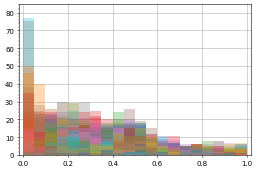

In [31]:
%time

# hard copy of the last order (p - precision, r - recall, f - f1 score)
p0_array=[]
r0_array=[]
f0_array=[]

# prediction
p_array=[]
r_array=[]
f_array=[]

# hard copy of the second last order (to compare to test)
p0t_array=[]
r0t_array=[]
f0t_array=[]

# test
pt_array=[]
rt_array=[]
ft_array=[]

#extra info on model training
nord_array=[]     # n. of orders
npro_array=[]     # n. of products
nepochs_array=[]  # n. of epochs
t_array=[]        # time
thres_array=[]    # prob threshold

t0_tot = dt.now()

for i,u in enumerate(users):

    t0 = dt.now()

    #per customer
    print('------------')
    print(i,') user id =',u)   
    
    #reduce to only the order number and the products in it,separately for all and reorders only 
#    allorders = o[(o['user_id'] == u) & (o['reordered'] == 0)][['order_number','product_id']]
    reordered = o[(o['user_id'] == u) & (o['reordered'] == 1)][['order_number','product_id']]
#    display(reordered)
    
    #now one-hot encoding
#    ohe_all = pd.get_dummies(allorders,columns=['product_id'])
    ohe_reo = pd.get_dummies(reordered,columns=['product_id'])
    #fix column names to product id
#    cols_all = [col.split("_")[-1] if 'product' in col else col for col in ohe_all.columns ]
    cols_reo = [col.split("_")[-1] if 'product' in col else col for col in ohe_reo.columns ]
#    ohe_all.columns = cols_all
    ohe_reo.columns = cols_reo
#    print(ohe_reo)
    
    #for each order, sum over products
#    X_all = ohe_all.groupby('order_number').sum()
    X_reo = ohe_reo.groupby('order_number').sum()
#    display(X_all)
    display(X_reo)
    
    #save product ids
#    pid_all = X_all.columns   
    pid_reo = X_reo.columns
#    print(pid_reo)
    
    #covert to numpy
#    xa = X_all.to_numpy()
    xr = X_reo.to_numpy()
    
#    print(Xr)
        
    nord_array.append(xr.shape[0])
    npro_array.append(xr.shape[1])
    
#   copy last order
    p0 = 0; r0 = 0; f0 = 0

    if xr.shape[0] > 1:
        p0,r0,f0 = individual_score(xr[-1], xr[-2])
     
    p0_array.append(p0)
    r0_array.append(r0)
    f0_array.append(f0)
    
#   copy second last order, to compare to test (so shift both by -1)
    p0t = 0; r0t = 0; f0t = 0
    
    if xr.shape[0] > 2:
        p0t,r0t,f0t = individual_score(xr[-2], xr[-3])

    p0t_array.append(p0t)
    r0t_array.append(r0t)
    f0t_array.append(f0t)   
    
    #sliding window, one for training, one for testing, one for predicting
    nord = xr.shape[0]-3
    npro = xr.shape[1]
    print('norders,nproducts=',nord,npro)
    
    #if not enough orders to run GRU, fill with -1
    if nord < 1:
        
        p_array.append(-0.1)
        r_array.append(-0.1)
        f_array.append(-0.1)
        
        pt_array.append(-0.1)
        rt_array.append(-0.1)
        ft_array.append(-0.1)
        
        nepochs_array.append(-1.)
        t_array.append(-1.)
        thres_array.append(-1.)
        
        print('Not enough orders, skip <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<')
        continue
    
    # A simple GRU + Dense layer
    model = Sequential()
    model.add(GRU(npro, activation='relu', input_shape=(nord,npro),return_sequences=False))
    model.add(Dense(npro, activation='sigmoid'))
    model.summary()
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    x_train = xr[0:nord,:]
    x_test  = xr[1:nord+1,:]
    x_pred  = xr[2:nord+2,:]
    
    y_train = xr[-3,:]
    y_test  = xr[-2,:]
    y_pred_true  = xr[-1,:]
    
    print(xr.shape)
    print(x_train.shape,y_train.shape)
    print(x_test.shape,y_test.shape)   
    
    # RNNs need 3dim input for x and 2dim for y
    # we don't have sample dimension so need to set it to 1
    
    x_train = x_train.reshape(1,x_train.shape[0],x_train.shape[1])
    x_test = x_test.reshape(1,x_test.shape[0],x_test.shape[1])
    x_pred = x_pred.reshape(1,x_pred.shape[0],x_pred.shape[1])
    
    y_train = y_train.reshape(1,y_train.shape[0])
    y_test = y_test.reshape(1,y_test.shape[0])   

    
    h = model.fit(x_train, y_train,validation_data=(x_test, y_test),epochs=500,callbacks=[callback],verbose=0)
    
    y_pred = model.predict_step(x_pred)
    y_test_pred = model.predict_step(x_test)
    
    plt.hist(y_pred[0].numpy(),alpha=0.3,bins=20,range=(0,1))
    
#    thres=0.5
    thres = find_threshold(y_test[0], y_test_pred[0].numpy())
    print('thres=',thres)
    
    y_pred_class  = np.where(y_pred[0].numpy()  > thres, 1, 0)
    y_test_pred_class  = np.where(y_test_pred[0].numpy()  > thres, 1, 0)
    
    p,r,f = individual_score(y_pred_true, y_pred_class)
    pt,rt,ft = individual_score(y_test[0], y_test_pred_class)
    
    print('copyTest: Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(p0t,r0t,f0t))
    print('test:     Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(pt,rt,ft))
    print('copyLast: Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(p0,r0,f0))
    print('pred:     Pre={:.2f} Rec={:.2f} F1={:.2f}'.format(p,r,f))
    print('true:',y_pred_true)
    print('pred:',y_pred_class)
    print(y_pred[0].numpy().round(2))
    
    p_array.append(p)
    r_array.append(r)
    f_array.append(f)
    
    pt_array.append(pt)
    rt_array.append(rt)
    ft_array.append(ft)
    
    t1 = dt.now()
    print('Time (sec):',(t1-t0).total_seconds())
    
    nepochs_array.append(len(h.history['loss'])-n_clbks)
    t_array.append((t1-t0).total_seconds())
    thres_array.append(thres)
    
t1_tot = dt.now()
print('Total time (min):',round((t1_tot-t0_tot).total_seconds()/60,2))

The plot above shows product probabilities per model(1k colors).

Below, baseline and model prediction:

In [32]:
print('CopyLast baseline:')
print('Mean Precision:',round(np.mean(p0_array),3))
print('Mean Recall:',round(np.mean(r0_array),3))
print('Mean F1:',round(np.mean(f0_array),3))

CopyLast baseline:
Mean Precision: 0.392
Mean Recall: 0.365
Mean F1: 0.347


In [33]:
print('Prediction:')
print('Mean Precision:',round(np.mean(p_array),3))
print('Mean Recall:',round(np.mean(r_array),3))
print('Mean F1:',round(np.mean(f_array),3))

Prediction:
Mean Precision: 0.28
Mean Recall: 0.517
Mean F1: 0.315


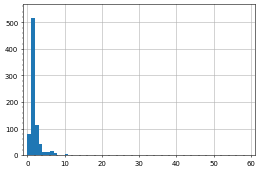

In [34]:
# time per model in seconds
plt.hist(t_array,bins=60,range=(0,60));

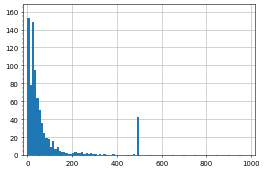

In [35]:
# n of epochs per model
plt.hist(nepochs_array,bins=100,range=(0,1000));

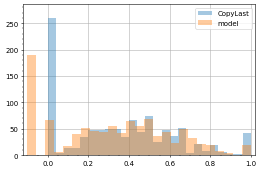

In [36]:
# f1 score distribution
plt.hist(f0_array,bins=25,alpha=0.4,label='CopyLast')
plt.hist(f_array,bins=25,alpha=0.4,label='model')
plt.legend();

f1_model vs f1_CopyLast:

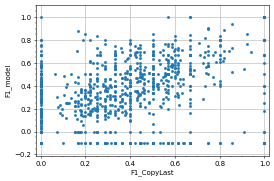

In [37]:
 plt.plot(f0_array,f_array,'o',markersize=3);plt.xlabel('F1_CopyLast');plt.ylabel('F1_model');

In [38]:
# the difference CopyLast-Prediction
df = np.subtract(f0_array,f_array);

x0= 0.03 ,sigma= 0.31


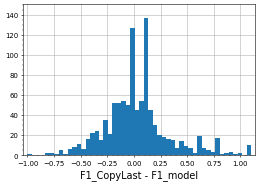

In [39]:
plt.hist(df,bins=50); plt.xlabel('F1_CopyLast - F1_model',fontsize=14);

from scipy.stats import norm

mu, sigma = norm.fit(df)
print('x0=',round(mu,2),',sigma=',round(sigma,2))

f1_model vs norders, nproducts, nproducts/norders:

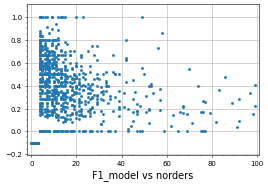

In [40]:
plt.plot(nord_array,f_array,'o',markersize=3); plt.xlabel('F1_model vs norders',fontsize=14);

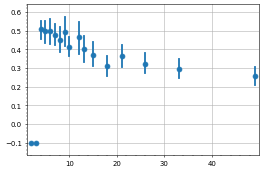

In [41]:
# profile plot, f1 vs number of orders
sns.regplot(x=nord_array, y=f_array, x_bins=20,fit_reg=None);

does better for if only a few orders

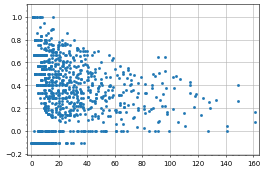

In [42]:
# versus number of products
plt.plot(npro_array,f_array,'o',markersize=3);

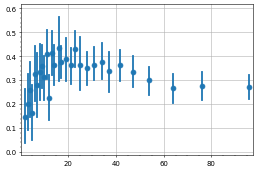

In [43]:
# profile plot, f1 vs n. of products
sns.regplot(x=npro_array, y=f_array, x_bins=30,fit_reg=None);

In [44]:
# f1 versus the ratio n_products/n_orders (per customer)
av_po = [p/o if o != 0 else -2 for p,o in zip(npro_array,nord_array)]

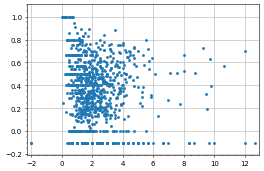

In [45]:
plt.plot(av_po,f_array,'o',markersize=3);

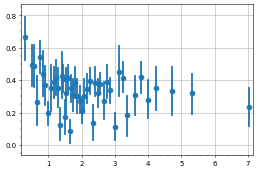

In [46]:
sns.regplot(x=av_po, y=f_array, x_bins=50,fit_reg=None);

Save results to files:

In [47]:
with open('./data/individual_1000customers_baseline.pkl', 'wb') as f:
        pickle.dump((f0_array,p0_array,r0_array,f0t_array,p0t_array,r0t_array), f)

In [48]:
with open('./data/individual_1000customers_GRU.pkl', 'wb') as f:
        pickle.dump((f_array,p_array,r_array), f)

In [49]:
with open('./data/individual_1000customers_GRU_test.pkl', 'wb') as f:
        pickle.dump((ft_array,pt_array,rt_array), f)

In [50]:
with open('./data/individual_1000customers_GRU_model.pkl', 'wb') as f:
        pickle.dump((nord_array,npro_array,t_array,nepochs_array,thres_array), f)